In [3]:
import librosa as lr
import librosa.display
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
#Librosa is the special library for processing and manipulating audio files 
from glob import glob
import scipy.signal as sg
import sklearn
import scipy
from scipy.signal import butter,lfilter
from keras import backend
import tensorflow
from skimage.restoration import denoise_wavelet
import scipy.fftpack as sf
import numpy as np
import random
import pywt

In [ ]:
data_dir1 = "/kaggle/input/newaudiodataset/newaudiodataset/aorticstenosis"
data_dir2 = "/kaggle/input/newaudiodataset/newaudiodataset/mitral regurgitation"
data_dir3 = "/kaggle/input/newaudiodataset/newaudiodataset/mitral stenosis"
data_dir4 = "/kaggle/input/newaudiodataset/newaudiodataset/mitral valve prolapse"
data_dir5 = "/kaggle/input/newaudiodataset/newaudiodataset/normal"
audio_files1 = glob(data_dir1 + '/*.wav')
audio_files2 = glob(data_dir2 + '/*.wav')
audio_files3 = glob(data_dir3 + '/*.wav')
audio_files4 = glob(data_dir4 + '/*.wav')
audio_files5 = glob(data_dir5 + '/*.wav')
audio_data = list([audio_files1,audio_files2,audio_files3,audio_files4,audio_files5])

In [ ]:
audio,freq = lr.load(audio_files1[20])
audio
time = np.arange(0,len(audio))/freq
freq
plt.plot(time,audio)
plt.xlabel('time')
plt.ylabel('amplitude')

In [ ]:
def remove_silence(audio):
    threshold = 15 #dB
    intervals = librosa.effects.split(audio, top_db=threshold)
    #Concatenate the non-silent segments
    audio_without_silence = np.concatenate([audio[start:end] for start, end in intervals])
    return audio_without_silence

In [ ]:
def butter_bandpass(centroid,lowcut, highcut, fs, order=2):
    lowcut = centroid - 300
    highcut = centroid + 300
    nyq = 0.4 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order,[low,high],btype='band')
    return b, a

def butter_bandpass_filter(centroid,data, lowcut, highcut, fs, order=2):
    b, a = butter_bandpass(centroid,lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def bandpass_filter(centroid,buffer,sfreq,lowcut,highcut):
    return butter_bandpass_filter(centroid,buffer, lowcut, highcut, sfreq, order=2)

In [ ]:
def _stft(y, n_fft, hop_length, win_length):
    return librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)


def _istft(y, hop_length, win_length):
    return librosa.istft(y, hop_length, win_length)


def _amp_to_db(x):
    return librosa.core.amplitude_to_db(x, ref=1.0, amin=1e-20, top_db=80.0)


def _db_to_amp(x,):
    return librosa.core.db_to_amplitude(x, ref=1.0)

def denoising(audio_clip,n_grad_freq=2,n_grad_time=4,n_fft=1024,win_length=1024,hop_length=512,n_std_thresh=1.5,prop_decrease=1.0):
    sig_stft = _stft(audio_clip, n_fft, hop_length, win_length)
    sig_stft_db = _amp_to_db(np.abs(sig_stft))
    mask_gain_dB = np.min(_amp_to_db(np.abs(sig_stft)))
    mean_freq_noise = np.mean(sig_stft_db, axis=1)
    std_freq_noise = np.std(sig_stft_db, axis=1)
    noise_thresh = mean_freq_noise + std_freq_noise * n_std_thresh
    smoothing_filter = np.outer(
        np.concatenate(
            [
                np.linspace(0, 1, n_grad_freq + 1, endpoint=False),
                np.linspace(1, 0, n_grad_freq + 2),
            ]
        )[1:-1],
        np.concatenate(
            [
                np.linspace(0, 1, n_grad_time + 1, endpoint=False),
                np.linspace(1, 0, n_grad_time + 2),
            ]
        )[1:-1],
    )
    smoothing_filter = smoothing_filter / np.sum(smoothing_filter)
    db_thresh = np.repeat(np.reshape(noise_thresh, [1, len(mean_freq_noise)]),np.shape(sig_stft_db)[1],axis=0,).T
    sig_mask = sig_stft_db < db_thresh
    sig_mask = scipy.signal.fftconvolve(sig_mask, smoothing_filter, mode="same")
    sig_mask = sig_mask * prop_decrease
    sig_stft_db_masked = (sig_stft_db * (1 - sig_mask) + np.ones(np.shape(mask_gain_dB)) * mask_gain_dB * sig_mask) 
    sig_imag_masked = np.imag(sig_stft) * (1 - sig_mask)
    sig_stft_amp = (_db_to_amp(sig_stft_db_masked) * np.sign(sig_stft)) + (1j * sig_imag_masked)
    recovered_signal = _istft(sig_stft_amp, hop_length, win_length)
    return recovered_signal

In [22]:
audio_fil = []
count = 0
for audio_files in audio_data:
    for file in range(0,len(audio_files)):
        audio,sfreq = lr.load(audio_files[file])
        time = np.arange(0,len(audio))/sfreq
        x_fil = remove_silence(audio)
        spec = librosa.feature.spectral_centroid(audio,sr = sfreq)[0]
        f = range(len(spec))
        t = librosa.frames_to_time(f)
        pre = sklearn.preprocessing.minmax_scale(spec,axis = 0)
        cent = np.mean(spec.T, axis=0)
        x_fil = bandpass_filter(cent,x_fil,sfreq,30,500)
        x_fil = x_fil.flatten('F')[:x_fil.shape[0]]
        x_fil = denoising(x_fil)
        audio_fil.append(x_fil)
        #fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        #t = np.linspace(0., len(audio) / sfreq, len(audio))
        #ax.plot(t, x_fil, lw=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.00496658 -0.00569595 -0.00551452 ... -0.00139928 -0.00081717
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass hop_length=512, win_length=1024 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.00698884  0.0079089   0.00752165 ... -0.00802181 -0.00401718
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass hop_length=512, win_length=1024 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages

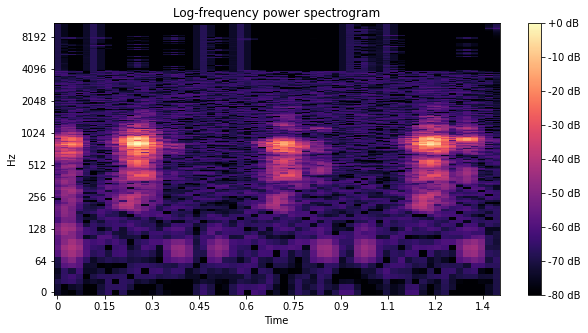

In [23]:
fig, ax = plt.subplots(figsize=(10,5))
hop_length = 512
D = librosa.amplitude_to_db(np.abs(librosa.stft(audio_fil[0], hop_length=hop_length)),
                            ref=np.max)
img = librosa.display.specshow(D, y_axis='log', sr=freq, hop_length=hop_length,
                         x_axis='time', ax=ax)
ax.set(title='Log-frequency power spectrogram')
ax.label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")

In [24]:
# MFCC-Mel Frequency Cepstral Coefficients
def getextracted_feature(audio):
    MFCC = librosa.feature.mfcc(audio,n_fft=1024,hop_length=hop_length,n_mfcc=40)
    print(MFCC)
    #time = np.arange(0,len(audio))/freq
    #librosa.display.specshow(MFCC,sr=freq,hop_length=hop_length)
    #plt.imshow(MFCC, interpolation="nearest", origin="lower", aspect="auto")
    #plt.colorbar()
    #plt.title('MFCC')
    #plt.xlabel('Time (s)')
    #plt.ylabel('MFCC Coefficients')
    #plt.tight_layout()
    #plt.show()
    return MFCC
#return MFCC

In [25]:
#KNN algorithm
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

In [26]:
import numpy as np 
import pandas as pd
import numpy as np
arr1 = np.array(['Atrial Stenosis']*200)
arr2 = np.array(['Mitral Regurgitation']*200)
arr3 = np.array(['Mitral Stenosis']*200)
arr4 = np.array(['Mitral Valve Propalse']*200)
arr5 = np.array(['Normal']*200)
arr = np.concatenate([arr1,arr2,arr3,arr4,arr5])
len(arr)

1000

In [27]:
def reduce_coverage(x):
    x = x[0:16820]
    hoplength = 512
    nfft = 1024
    MFCC = getextracted_feature(x)
    return MFCC

In [28]:
from sklearn.decomposition import PCA
def dwt_features(x):
    x = x[0:16820]
    coeffs = pywt.wavedec(x, 'db4')
    mfcc_coeffs = []
    for subband in coeffs:
        mfcc_coeffs.append(getextracted_feature(subband))
    return mfcc_coeffs

In [ ]:
red_fil = []
del_val = []
for i in range(0,len(audio_fil)):
    mfcc = dwt_features(audio_fil[i])
    final_features = np.concatenate(mfcc, axis=1)
    if(len(final_features[0])!=43):
        del_val.append(i)
        continue
    else:
        red_fil.append(final_features)
    print(i)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.19005772e-03 -1.22920126e-03 -1.21320491e-03 -1.16600946e-03
 -1.42863816e-03 -4.82325147e-04  1.16214927e-05  3.25677754e-07
 -3.89748989e-06 -4.94478051e-06  3.81078252e-05 -1.21519699e-04
  3.81669584e-04 -1.37336969e-03 -2.06790917e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=15
  return f(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.28711886e-06  3.14379702e-06 -2.50460865e-04  1.06511645e-04
 -4.30800021e-05  2.68966115e-05 -5.33520761e-06 -1.99507965e-06
  2.30176659e-06  2.61037646e-05  3.93116610e-04 -1.42058116e-04
  9.34293428e-05 -4.36365531e-04  5.64820540

[[-6.97633751e+02]
 [ 4.58594479e+01]
 [-6.30373734e+00]
 [ 1.32296685e+01]
 [ 1.13602810e+01]
 [ 2.14454358e+01]
 [-1.72988492e+01]
 [-1.02580577e+01]
 [ 4.58454103e+00]
 [ 6.46043916e+00]
 [-1.04811253e+01]
 [ 8.33469185e+00]
 [ 2.48619520e+00]
 [-5.81722804e+00]
 [-1.18314385e+00]
 [ 4.37095964e+00]
 [-7.54978762e-01]
 [-4.81245252e+00]
 [ 5.16002827e+00]
 [ 2.09814042e+00]
 [-9.50222518e+00]
 [ 9.65908083e+00]
 [-4.69919811e+00]
 [ 2.95941094e-01]
 [ 1.30502910e-01]
 [ 9.46470290e-01]
 [ 7.37452852e-02]
 [-2.94665890e+00]
 [ 3.63543532e+00]
 [-9.43626599e-01]
 [-2.84368685e+00]
 [ 4.08977947e+00]
 [-2.72835542e+00]
 [ 1.17757131e+00]
 [-1.74258805e+00]
 [ 2.86797301e+00]
 [-2.57592196e+00]
 [ 4.05044941e-01]
 [ 1.18744285e+00]
 [-8.11433036e-01]]
[[-9.36375126e+02]
 [-6.29152439e+01]
 [-3.65825172e+01]
 [-4.51768972e+00]
 [ 2.09658101e+01]
 [ 1.24140218e+01]
 [ 2.70793852e+01]
 [-4.08559905e+00]
 [ 1.33744285e+01]
 [-8.28762031e-01]
 [-6.86985789e+00]
 [-5.05023394e+00]
 [-5.510536

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.69476135e-06  6.18570638e-06  1.53447539e-05  1.59972524e-05
 -6.98439346e-05 -1.09681455e-05  2.31240548e-05  9.68801533e-07
 -2.60357178e-05  1.85481310e-05  4.66369137e-05 -3.19331076e-05
  6.22637718e-05 -8.48100771e-05 -1.36200273e-04  8.03670936e-05
 -9.96038918e-06 -2.37073498e-06  7.28193536e-05  3.42948120e-05
 -1.64020888e-05  5.33123969e-05  2.26430405e-05 -2.70187779e-04
  8.97860661e-05  1.31791130e-04 -3.56961464e-05 -6.88899059e-05
  1.99707395e-04 -3.84568740e-04 -1.52104006e-04  3.73954492e-04
  2.66872186e-04 -2.85336691e-04 -1.04949987e-04 -2.52323580e-04
 -7.31699418e-06  4.83825067e-04  1.23401075e-04 -3.27166443e-04
 -1.22108928e-04  1.75624168e-04 -4.21497441e-04  3.53112203e-04
  2.84025837e-04 -4.23473563e-04 -1.95761077e-04  3.67609031e-04
 -5.84561845e-05 -2.11009146e-04  3.08829121e-04  6.94229829e-05
 -2.62267031e-04  2.52096047e-04  1.44960244e-04 -4.28112498e-04
 -7.

[[-8.43263236e+02 -9.22650261e+02]
 [-9.11539646e+01 -7.65739437e+01]
 [ 4.64052483e+00 -3.42585513e+01]
 [ 5.50729353e+01  6.90914219e+01]
 [-1.43905316e+01  3.22694691e+00]
 [ 1.50477978e+01 -3.72097129e+00]
 [-2.57300421e+01  1.40843242e+01]
 [ 2.65481074e+00 -2.70517272e+00]
 [-1.81178966e+01  1.35381134e+01]
 [ 1.25459310e+01  7.84539067e+00]
 [ 2.04877249e+01  7.45473219e-01]
 [-5.45079010e+00 -8.51469973e+00]
 [ 9.22017026e+00  1.42186668e+01]
 [-2.92039774e+01 -1.66144836e+01]
 [ 2.43253154e+00  1.40076559e+00]
 [ 2.10841818e+00  7.08259251e+00]
 [ 3.51607097e+00  7.22426387e+00]
 [-4.03594010e+00 -6.99492225e+00]
 [-1.24152081e+00  2.91595930e+00]
 [-1.38403196e+00  1.54551705e+00]
 [-2.78339916e+00 -8.17550890e+00]
 [ 2.35261052e+00 -7.46290426e-01]
 [ 4.36660908e-01  3.03676708e+00]
 [-6.49553858e+00 -5.26833582e+00]
 [-7.17970387e+00  1.39584575e+00]
 [ 3.69983214e+00  5.92374787e+00]
 [-4.88206627e-01  2.06432619e+00]
 [ 2.34068003e+00 -1.17658660e+00]
 [-2.06509760e+00 -6

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.19895973e-03  6.40454546e-03  6.32581805e-03  6.07725177e-03
  7.44659365e-03  2.49251566e-03  1.01916268e-06  2.24982644e-05
 -6.73552122e-06  2.33713285e-05 -1.85871149e-06 -6.99643777e-06
  1.70321943e-05 -1.15904487e-05 -1.93121574e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.19034678e-05  4.27325484e-06  1.32017626e-03 -5.38425261e-04
  3.07502440e-04 -1.17345763e-04  5.45425578e-07  6.44449342e-07
 -2.75714061e-05  2.07300731e-05 -1.49890995e-05  4.69371064e-06
 -9.47526564e-07  8.04042423e-06 -1.40885096e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.22757629e+02]
 [ 4.98139872e+01]
 [-6.89524322e+00]
 [ 7.02976189e+00]
 [ 8.81317899e+00]
 [-1.07147239e+01]
 [-5.06517267e+00]
 [ 9.01511026e+00]
 [ 5.02282347e+00]
 [-2.28131449e+00]
 [ 7.26063704e+00]
 [-1.40758215e+01]
 [-8.61974951e-01]
 [ 1.21206771e+01]
 [-3.62590812e+00]
 [-4.36694991e+00]
 [ 7.04100249e-01]
 [ 3.87084165e+00]
 [-3.80872440e+00]
 [ 3.59947020e+00]
 [ 9.92708198e-01]
 [-4.21195210e+00]
 [ 3.08408825e+00]
 [-1.22205169e+00]
 [ 4.58598433e+00]
 [-2.89819880e+00]
 [-1.82370922e+00]
 [ 3.61427088e+00]
 [-8.28984426e-01]
 [ 2.22174163e+00]
 [-4.35872194e+00]
 [ 7.00202072e+00]
 [-5.38522327e+00]
 [ 1.78579502e+00]
 [ 2.88577909e+00]
 [-4.31214336e+00]
 [ 2.80263984e+00]
 [ 4.68743876e-01]
 [-4.41914003e+00]
 [ 5.13325326e+00]]
[[-8.34962171e+02 -7.58065117e+02]
 [-1.16870275e+02 -1.87739027e+02]
 [ 5.06014978e+01  3.42968298e+01]
 [-3.13336356e+01 -1.36877857e+01]
 [ 9.36292697e-01 -1.18214032e+01]
 [ 1.12322489e+00 -1.04817524e+01]
 [ 1.82439233e+00 -1.98855855

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.20696206e-04 -2.21727404e-04  1.48883047e-05 ... -2.70993462e-06
 -2.76677499e-06 -2.21306473e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.79134397e-05  7.64546355e-05  7.80743484e-05  7.32157036e-05
  9.11180807e-05  3.34742512e-05 -2.49989566e-06  1.24176196e-06
 -5.53329507e-07  2.78357898e-06 -5.38054645e-06  3.49344825e-05
 -1.14082909e-04  4.31066626e-04  6.45815670e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.17439868e-06 -2.43533979e-06  1.

[[-9.47721032e+02 -1.10765191e+03 -1.05011892e+03 -1.10705470e+03
  -1.10997046e+03 -1.11022780e+03 -1.11043993e+03 -1.11009905e+03
  -1.10868334e+03 -8.96972962e+02 -8.97038195e+02 -1.11001014e+03
  -1.06826630e+03 -1.10813682e+03 -1.10711680e+03 -1.10982471e+03
  -1.10920769e+03]
 [ 2.02646257e+01 -2.88310143e+01 -9.85301871e+01 -2.95299053e+01
  -2.63137606e+01 -2.59390215e+01 -2.56582527e+01 -2.60987879e+01
  -2.77196808e+01 -8.97505175e+00 -8.89986839e+00 -2.61078740e+01
  -8.03131339e+01 -2.80032083e+01 -2.50410238e+01 -2.64520440e+01
  -2.70817646e+01]
 [-1.20051522e+01  1.65195794e+01  5.81079988e+01  1.68850443e+01
   1.57915077e+01  1.54118148e+01  1.52060842e+01  1.55146398e+01
   1.61969223e+01 -5.41528418e+00 -5.44921632e+00  1.52506827e+01
   5.67101558e+01  1.66177872e+01  1.59693586e+01  1.58013393e+01
   1.58219004e+01]
 [ 1.31399695e+01 -1.18652064e+00 -1.39929160e+01 -1.26355507e+00
  -2.15021146e+00 -1.82989602e+00 -1.78772863e+00 -1.86240175e+00
  -1.54123905e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.20825721e-08 -4.99351219e-06 -1.62805338e-05  2.51654438e-04
  5.17055955e-04  6.04762154e-04  4.80328473e-04  1.99793004e-04
 -5.51395420e-05 -1.52323669e-05 -1.30028076e-05 -2.87302284e-05
 -2.80660289e-05 -3.07716821e-05 -2.07956012e-05 -3.28111884e-05
  1.53336886e-05 -2.66259215e-05  6.21531883e-06  1.30590847e-05
 -1.14447201e-06  1.28647406e-05 -8.54609999e-06  1.57003575e-05
 -1.63862012e-06  1.21812131e-05 -3.48161296e-06 -6.07426922e-06
  1.13938973e-05 -7.19851041e-06  1.44330778e-05 -1.44910668e-05
 -9.25260893e-06  1.01657183e-05  1.33343036e-05  2.23783231e-05
  5.25722642e-06 -6.85390901e-06  1.84446875e-05  9.84359680e-05
  1.94605660e-04  2.59501454e-04  2.95613507e-04  7.60620474e-05
  1.25112011e-06  2.50575143e-06  1.13494915e-05  2.81841656e-05
 -5.29485732e-06 -1.52385123e-05  1.43629877e-06 -4.57277696e-06
 -1.41160149e-06 -3.55037994e-05 -2.53381611e-06  9.48252739e-06
 -1.

[[-8.43381269e+02]
 [ 1.99974921e+01]
 [ 2.51704643e+01]
 [ 5.53525814e+00]
 [ 2.55264728e+01]
 [ 9.59486914e-01]
 [-1.17393837e+01]
 [-1.97491091e+01]
 [ 1.55803768e+01]
 [-7.58128013e+00]
 [ 3.93739505e-01]
 [ 8.85978120e+00]
 [ 4.94621192e+00]
 [-2.02278810e+01]
 [ 8.02346153e+00]
 [ 5.30256067e+00]
 [-7.84560339e+00]
 [ 1.72452791e+00]
 [ 7.11556960e+00]
 [-1.11585190e+01]
 [ 4.45824532e+00]
 [ 2.81410847e+00]
 [-1.67107077e+00]
 [ 6.44067257e+00]
 [-4.04708068e+00]
 [ 9.98294065e-01]
 [-4.48106993e+00]
 [ 1.14950127e+00]
 [ 2.22233429e+00]
 [ 1.75828657e-01]
 [ 2.15887970e+00]
 [-3.73590237e+00]
 [ 1.37157305e+00]
 [-2.77619073e+00]
 [ 3.18433514e+00]
 [ 1.32260124e+00]
 [ 1.63714560e+00]
 [-4.79933997e+00]
 [ 1.00460075e+00]
 [ 6.14359528e-01]]
[[-8.46544625e+02]
 [ 2.20470404e+01]
 [ 4.36264723e+01]
 [-6.16579308e+00]
 [-1.05514774e+01]
 [ 2.68492066e+00]
 [-8.57668592e+00]
 [-9.60603020e+00]
 [-1.31882659e+00]
 [ 8.42060710e+00]
 [ 2.38863473e+00]
 [-6.71761797e+00]
 [-4.572258

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.98703189e-05 -2.84189883e-05  3.78901613e-04 ...  5.94136573e-05
  5.00326070e-05  5.88834594e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.58774820e-04 -8.45718346e-04  8.64212675e-05 ... -8.39799767e-06
 -2.41486051e-05  4.76475563e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.22777208e-04  1.01096293e-03 -2.16498883e-04 ... -9.99888991e-06
  1.74013405e-06 -3.46217534e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-8.15738587e+02 -1.06698412e+03 -1.03774135e+03 -1.05345666e+03
  -1.07885096e+03 -8.87526188e+02 -1.05655876e+03 -1.03235143e+03
  -1.04710623e+03]
 [ 1.84708963e+00 -7.12214595e+01 -6.33900714e+01 -6.50615508e+01
  -6.99779860e+01 -2.09786095e+01 -7.07750671e+01 -7.73695192e+01
  -6.70523662e+01]
 [ 3.55990201e-01  4.55301530e+01  5.20378203e+00  2.71801782e+01
   5.81026450e+01  9.04038862e+00  2.98352549e+01  9.32177231e+00
   1.46843354e+01]
 [-1.32272583e+00 -4.37180817e+01 -5.71168963e+01 -5.51866225e+01
  -4.13694939e+01 -8.25200794e+00 -4.00242323e+01 -3.64766404e+01
  -4.26462818e+01]
 [ 1.17089044e+00  3.50987142e+01  6.03430063e+01  4.35321978e+01
   2.33679517e+01  7.79362777e+00  4.09494720e+01  4.66581777e+01
   4.64011887e+01]
 [-8.58355353e-01 -5.24863258e+00  1.20059071e+01  9.46143860e+00
  -7.50805647e+00 -8.54852785e-01  4.12130856e-01  7.69465762e+00
   7.80733686e+00]
 [ 4.44705952e-01 -1.12237223e+01 -2.19643665e+01 -1.12802029e+01
  -3.86457965e+00 -2.7266295

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.91108627e-05  9.20841572e-05  9.09942975e-05  8.72947809e-05
  1.07450488e-04  3.46015513e-05  4.32643671e-07  5.67892928e-07
  5.00072805e-07  1.95730068e-07  2.04797522e-06 -2.27404656e-07
  6.39782977e-07 -3.39818167e-06 -5.08953288e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.44803935e-07 -4.75076477e-08  1.91108996e-05 -8.76362409e-06
  3.78518700e-06 -1.70895087e-06  1.43710687e-07  6.24578692e-07
 -4.24997839e-07  3.25988643e-07  1.39229834e-06 -5.10518337e-07
  2.72597844e-07 -1.52372842e-06  1.21712891e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1.09102760e+03]
 [ 2.88372777e+01]
 [-6.50843882e+00]
 [-5.13657608e+00]
 [ 2.43817739e+00]
 [ 8.96429424e-02]
 [ 1.38444054e+00]
 [ 7.23084848e+00]
 [ 1.36004892e+01]
 [ 1.47967846e+01]
 [ 6.06465009e+00]
 [-5.69803367e+00]
 [-1.04447780e+01]
 [-3.78145726e+00]
 [ 5.12918107e+00]
 [ 1.57557517e+00]
 [-7.99704839e+00]
 [-6.85929334e+00]
 [ 2.30355090e+00]
 [ 4.56940952e+00]
 [-1.19564802e+00]
 [-6.84045694e-01]
 [ 4.68888575e+00]
 [ 1.73698625e-01]
 [-3.95311157e+00]
 [ 2.44513503e+00]
 [ 2.92818376e+00]
 [-2.08368589e+00]
 [-7.83199082e-01]
 [-8.43066744e-01]
 [-1.15947667e+00]
 [ 2.39423050e+00]
 [-2.68267036e-01]
 [-2.90546384e+00]
 [ 1.81868679e+00]
 [ 1.44068061e+00]
 [-2.28107899e+00]
 [-7.10716726e-02]
 [ 1.35762887e+00]
 [-3.34459460e-01]]
[[-1.12643567e+03]
 [-5.96762797e+00]
 [ 4.61709686e+00]
 [-4.72768521e+00]
 [ 4.82221560e+00]
 [-3.20870300e+00]
 [ 1.42033011e+00]
 [-1.32305063e+00]
 [ 1.64874678e+00]
 [-6.85622301e-01]
 [-3.17172475e-01]
 [-3.07603866e-01]
 [ 1.325192

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.13128975e-06 -2.64289593e-05 -9.58215736e-05  4.37660000e-04
  4.84518113e-04 -1.54017919e-03  1.21601005e-03 -7.40255637e-04
  6.39364949e-04 -2.80087140e-04  5.56145422e-04 -1.00144421e-03
  7.94980928e-04 -5.77196844e-04  7.53336758e-04  7.71654492e-04
 -1.19712206e-03 -2.08330735e-03  3.39067146e-03  2.02247511e-05
 -1.94101604e-03 -6.85594349e-04  2.31847167e-03 -1.30012977e-03
  9.34063058e-04 -4.26422546e-04 -7.34133790e-04  1.14032174e-03
  3.62925740e-05 -9.27983351e-04 -4.51563648e-05  1.79892041e-03
 -1.75796663e-03  4.98715105e-04  1.84383207e-04  4.96643469e-04
 -6.73699259e-04 -5.14058834e-04  1.85253215e-03 -1.27073554e-03
 -1.65347256e-04  3.90964855e-04  2.37230152e-04 -1.23155446e-04
 -5.24432851e-04  6.54307862e-04 -3.65220408e-04  1.97569462e-05
  9.65322139e-05  5.41485303e-05 -1.25631160e-04 -2.90784524e-05
  1.06976757e-04  1.07646305e-04 -2.62227408e-04  9.26885619e-05
  3.

[[-9.89054769e+02 -9.94004933e+02 -1.02267381e+03 -1.01951591e+03
  -1.01553407e+03]
 [-1.53625957e+01 -2.21555849e+01 -1.15981831e+01 -2.05372272e+01
  -2.35625751e+01]
 [-1.54962200e+01 -1.85968526e+01 -6.53501769e+00 -9.62884814e-01
  -1.88802324e+01]
 [ 1.94958410e+01  1.79704580e+01 -5.47901199e+00  1.37515162e+01
   8.40555598e+00]
 [-1.33979706e+01 -1.44108400e+01 -3.25617786e+00 -7.05666721e-01
  -1.19492396e+01]
 [-8.96561413e+00 -2.62938396e+01 -3.23238740e+00 -3.67891962e+00
   1.21724924e+00]
 [ 4.79780991e+00  1.16344949e+01 -5.67319014e+00 -1.66592362e+00
   1.23981750e+01]
 [-1.71343139e+01 -4.48567201e+00 -1.20966213e+01 -8.89943565e+00
  -8.88267267e+00]
 [-5.79364073e+00 -2.48593945e+01 -1.38802160e+01 -7.89744242e+00
   1.90820242e+00]
 [ 2.56890397e+00  2.35383003e+00 -2.50360427e+00 -1.10373918e+01
  -4.43311135e+00]
 [-8.72185018e+00 -6.43604527e+00 -2.55341464e+00 -3.98053362e+00
  -1.60227449e-01]
 [-4.11161787e+00 -2.23945845e+01 -2.08891635e+00  5.65117651e+00

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.24713726e-03  3.34344895e-03  3.31579045e-03  3.17583148e-03
  3.89434055e-03  1.30905428e-03 -1.60008485e-05  7.27551324e-06
  2.75478252e-06 -2.05349607e-06 -8.85165662e-07 -2.03104388e-06
  1.06463941e-05 -4.72632043e-05 -7.06051840e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.45024019e-05 -7.95428323e-06  6.80967243e-04 -3.14968269e-04
  1.72168188e-04 -6.49454780e-05  3.39455826e-06  2.43421787e-06
  2.05649204e-05 -1.44214922e-05  1.16377412e-05 -3.32706263e-06
  1.81649004e-06 -7.74398307e-06  8.16917343e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-9.40882118e+02]
 [-3.59939683e+01]
 [ 2.14721061e+01]
 [-5.24345888e+00]
 [-1.16213087e+01]
 [-5.87254730e+00]
 [ 8.05641989e+00]
 [ 3.35825737e+00]
 [ 4.83699744e-01]
 [-4.12881347e+00]
 [ 1.77412121e-01]
 [ 2.07573618e+00]
 [ 1.50817957e+00]
 [-3.63442017e-01]
 [-4.33337314e+00]
 [ 2.28977031e+00]
 [ 3.77266819e+00]
 [-4.62401432e+00]
 [ 3.32352430e-01]
 [ 2.39705151e+00]
 [-2.46890737e+00]
 [ 1.60137084e+00]
 [-2.74048783e-01]
 [-1.41433663e+00]
 [ 1.57324326e+00]
 [-4.75613734e-01]
 [-4.71870215e-01]
 [ 6.17459806e-01]
 [-8.45806663e-01]
 [ 5.50347012e-01]
 [ 2.87726601e-01]
 [-1.07534315e+00]
 [ 8.55487182e-01]
 [-4.23342274e-01]
 [ 5.28901549e-02]
 [-3.21973768e-02]
 [-2.28301675e-01]
 [ 4.19072618e-01]
 [-8.37881090e-01]
 [ 1.14549910e+00]]
[[-9.17317700e+02]
 [-2.95873945e+01]
 [-2.36606395e+01]
 [ 2.92861994e+01]
 [ 8.72842613e+00]
 [ 1.43427838e+01]
 [ 2.46905979e+00]
 [ 1.05937940e+01]
 [ 1.62068600e+01]
 [ 1.09954745e+01]
 [ 8.18676079e+00]
 [-2.66005360e+00]
 [-1.841159

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.78764112e-05 -7.94983221e-05 -3.05266757e-04  5.81467463e-05
 -2.93849441e-05  4.89528712e-05 -1.44294678e-05  1.46239055e-05
 -9.84318653e-05  9.03460454e-05 -1.08109732e-05  3.42550634e-05
 -2.71698053e-05 -4.25906648e-06  8.26433976e-06  5.38792984e-05
 -2.80531731e-05  3.51726251e-07  7.21692234e-06 -2.71004526e-05
  3.13012945e-05  2.54166662e-05  9.78540996e-06 -9.53235680e-07
  1.92509978e-05  1.20500720e-05 -3.41125659e-05 -2.94597052e-06
 -6.51614056e-06  1.36109146e-05  4.61333884e-05 -5.26983656e-05
  1.78403564e-05  1.07063605e-04  2.13557046e-04  1.34460361e-04
 -6.28738475e-05 -1.13879047e-04 -4.40608138e-05 -2.78261535e-04
 -4.36212960e-04  4.04581390e-04  2.30814259e-04  1.53980430e-04
 -4.09428282e-04 -3.95172147e-04 -7.27521135e-04 -3.30391862e-04
 -3.51469853e-04  1.05700174e-04  3.78373403e-04  3.72415406e-05
 -1.75187385e-04 -6.12504542e-05  1.69151371e-05 -5.77715952e-07
  1.

[[-7.28435746e+02]
 [-4.44236031e+01]
 [-1.96678662e+01]
 [ 9.55747923e+00]
 [-1.20166465e+01]
 [-9.45141668e+00]
 [-2.09155406e+01]
 [ 1.46398706e+01]
 [ 4.91424371e+00]
 [-7.87328546e+00]
 [-2.77939792e+00]
 [-1.05464714e+01]
 [ 6.25473353e+00]
 [ 6.93511496e+00]
 [-1.07860332e+01]
 [ 5.32531113e-01]
 [-1.45833599e+01]
 [ 7.55445712e-01]
 [ 3.86053015e+00]
 [-4.00684947e+00]
 [-3.05727206e-01]
 [ 5.07972515e+00]
 [-2.99386899e+00]
 [ 8.07534746e+00]
 [-3.45497943e+00]
 [ 2.42670471e+00]
 [-1.63776837e+00]
 [ 1.17958313e+01]
 [-3.18860860e+00]
 [ 9.08552265e+00]
 [-5.82481776e+00]
 [ 3.47568425e+00]
 [-3.46704669e+00]
 [ 3.72145076e+00]
 [-1.72287329e+00]
 [ 3.50928165e+00]
 [-1.58221326e+00]
 [-7.28037474e-01]
 [-7.04096227e-01]
 [-5.34928867e-01]]
[[-6.23612043e+02 -7.37395404e+02]
 [-3.37873953e+01 -8.14807651e+01]
 [-7.73188402e+00  2.88758901e+01]
 [ 1.26582421e+01  6.08131772e+00]
 [ 7.75980815e+00  6.89752901e+00]
 [ 1.91946419e+01  1.87863035e+01]
 [-2.16015794e+01 -1.24418256

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.04190834e-05 -1.54631077e-04  3.18770589e-05 ... -3.17266829e-06
 -1.38511210e-07 -1.03538325e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.47321545e-05 -2.76940923e-05  3.38466492e-06 ...  9.15582096e-08
  2.49319432e-07 -4.43095504e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.86364742e-04  5.02292125e-04  4.97458286e-04  4.77456293e-04
  5.79395007e-04  2.10278238e-04 -3.60289567e-06 -1.42581537e-06
 -2.76335583e-06 -5.02377775e-06 -6.89653340e-08

[[-1.13051543e+03 -1.13124961e+03 -1.13119899e+03 -1.13130921e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13102800e+03
  -1.12675266e+03 -1.12621406e+03 -1.04452064e+03 -1.13133114e+03
  -1.13137085e+03 -1.13137085e+03 -1.13135950e+03 -1.12992682e+03
  -1.13083514e+03]
 [ 1.20412063e+00 -1.51380934e-01 -2.09984050e-01 -8.24350839e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -4.19569289e-01
  -5.71177470e+00 -6.29919461e+00 -1.43047667e+01 -4.85159446e-02
   0.00000000e+00  0.00000000e+00 -1.53034211e-02 -1.76593153e+00
  -6.48909067e-01]
 [ 1.18732251e+00  9.62606552e-02  1.19796308e-01  6.87255715e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  2.42573207e-01
   3.53912163e+00  3.65383804e+00 -1.17374248e+01  2.76784406e-02
   0.00000000e+00  0.00000000e+00  1.31246883e-02  1.01292130e+00
   3.54551162e-01]
 [ 1.15954573e+00 -2.00710210e-02  2.98253271e-03 -4.75397239e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -4.88077271e-03
  -7.56335603e-01 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.63369072e-06 -1.42164780e-05  7.67041092e-05  2.90456221e-05
  4.54521168e-05 -5.51589129e-04 -1.10764624e-05 -2.05535724e-04
 -8.17421325e-05 -2.29239213e-04 -1.98927851e-04 -2.99581565e-04
  2.13125617e-04 -3.92478565e-04  1.15046912e-04 -3.14892636e-04
 -5.75160921e-05  4.02423836e-05 -3.37998087e-05  2.85847781e-05
 -2.72607366e-05  5.37375456e-05 -5.22131789e-05 -4.38753033e-05
 -1.19956055e-04  6.26277450e-05  3.18843307e-04  1.57291301e-05
 -3.78621711e-04 -2.35077003e-04 -4.22550398e-04  4.50254610e-04
  6.35444612e-04 -8.88215580e-04 -1.42170450e-03 -6.90026894e-04
  8.25150948e-04  7.27145942e-04 -2.22654248e-04  8.15946532e-04
  9.64330917e-04 -2.32210854e-03 -2.51486271e-03 -2.02134925e-03
  8.79345967e-05  1.39140355e-03  9.79602689e-04  1.40883214e-03
  7.57880568e-04 -1.70686735e-04  2.44933306e-04  2.30160438e-05
  1.25019678e-05 -2.52246390e-04 -5.23512204e-04  1.28298981e-04
  5.

[[-7.81038273e+02 -7.18169794e+02]
 [-8.47106210e+01 -1.46396236e+02]
 [ 8.45446759e+01  5.14091997e+01]
 [-1.07701591e+01  6.32578775e-01]
 [ 1.70802143e+01  8.38349012e+00]
 [-7.38007147e+00  7.61903958e+00]
 [ 7.64584029e+00  7.02316535e+00]
 [ 1.06245881e+01  2.05785263e+01]
 [-6.12358770e+00 -1.20869262e+01]
 [ 2.62695889e+00 -3.69885220e+00]
 [ 1.60975124e+00 -1.46561745e+01]
 [-1.67092252e+01 -2.52807111e+00]
 [ 3.46890794e+00 -3.59981244e-01]
 [ 8.51665700e-01  9.55092727e+00]
 [-2.90639402e+00 -1.20384502e+01]
 [ 2.48841445e+00  4.87908647e+00]
 [-2.76353245e+00 -6.44401378e+00]
 [ 5.38761313e+00 -3.20970094e+00]
 [-3.85850244e+00  1.14410218e+00]
 [ 8.48681135e-01 -4.91255278e+00]
 [-1.26353629e+00 -1.13102927e+00]
 [ 2.85771444e+00 -7.63020380e-01]
 [-4.96416799e-01 -3.43298335e+00]
 [-7.27743194e+00 -1.02083876e+01]
 [ 8.21475290e+00  6.29928252e+00]
 [-2.63874040e-01  4.26619331e+00]
 [-2.08705527e-01  2.20641123e+00]
 [-5.86949876e+00 -9.70001643e-01]
 [ 4.52066851e+00 -4

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.41475546e-05  1.96985932e-04 -4.61954449e-05 ...  8.99446498e-06
 -8.77685616e-06  2.12939753e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.74624736e-05  3.32845502e-05 -1.96433945e-06 ...  8.93301344e-07
  1.36011694e-06 -1.24381779e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.04476379e-03  7.27460950e-03  7.19533136e-03  6.90588715e-03
  8.46495275e-03  2.81829629e-03  8.11166750e-07  1.36419648e-05
  4.41126507e-06  2.73584515e-06  1.60755693e-05

[[-1.12895410e+03 -1.12838114e+03 -1.11577360e+03 -1.11551321e+03
  -1.13111713e+03 -1.13131132e+03 -1.13100636e+03 -1.13110645e+03
  -1.12445715e+03 -1.09261654e+03 -1.09286784e+03 -1.13135904e+03
  -1.13105028e+03 -1.12649368e+03 -1.13124021e+03 -1.13118015e+03
  -1.13122237e+03]
 [-1.13295033e+00 -3.67355321e+00 -1.77911667e+01 -1.80946122e+01
  -3.38200116e-01 -7.89080456e-02 -4.86648440e-01 -3.51475652e-01
  -8.86295863e+00 -1.00073111e+01 -9.69167754e+00 -1.56569711e-02
  -4.25797748e-01 -6.17407213e+00 -1.74062662e-01 -2.53945444e-01
  -1.96983979e-01]
 [ 1.12533403e+00  2.16433912e+00  8.02821222e+00  8.14851605e+00
   2.78746321e-01  6.37441411e-02  4.03485032e-01  2.86848336e-01
   6.37360097e+00 -5.43427162e+00 -5.62744772e+00  1.26481421e-02
   3.46509179e-01  4.19868724e+00  1.43228293e-01  2.08549659e-01
   1.59608013e-01]
 [ 1.71398031e-02 -1.19330930e-01  7.54825034e-01  9.04331485e-01
  -1.87311721e-01 -4.05916948e-02 -2.75431584e-01 -1.87869828e-01
  -2.99506615e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.13202696e-06  1.01802780e-05  2.89114186e-04 ...  5.34949184e-06
  9.78842905e-06 -2.23485482e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.56808547e-05 -3.05847516e-04  1.19986839e-04 ... -1.74973997e-06
 -9.41339998e-06 -1.17554841e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.71429410e-05  2.38411941e-04 -4.39244136e-05 ... -1.10195161e-05
  7.85430812e-06 -1.85351237e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.08821353e+03 -1.11189389e+03 -1.12907319e+03 -1.13050895e+03
  -1.13048779e+03 -1.13014828e+03 -1.13035988e+03 -1.13004247e+03
  -1.13005461e+03 -1.06377501e+03 -1.06381855e+03 -1.13038247e+03
  -1.13014406e+03 -1.13048441e+03 -1.13032937e+03 -1.09235690e+03
  -1.09297185e+03]
 [-1.20138234e+01 -2.19120760e+01 -2.89128871e+00 -1.14123169e+00
  -1.16048091e+00 -1.62378569e+00 -1.33558760e+00 -1.76292198e+00
  -1.74306657e+00 -7.52212121e+00 -7.47646721e+00 -1.30743493e+00
  -1.61412524e+00 -1.16848375e+00 -1.37298474e+00 -3.39539322e+01
  -3.30465861e+01]
 [ 7.48328095e+00  9.22434866e+00  1.90593130e+00  9.18311621e-01
   9.08389192e-01  1.32167312e+00  1.06602991e+00  1.43056114e+00
   1.40373189e+00 -3.88187825e+00 -3.87553218e+00  1.04866368e+00
   1.26913099e+00  9.24991201e-01  1.08731949e+00  2.67111920e+00
   1.73817831e+00]
 [ 7.24041120e+00  1.91801090e+00 -5.36242726e-01 -5.79183494e-01
  -5.29473888e-01 -8.61212104e-01 -6.57811488e-01 -9.23795489e-01
  -8.88622215e-01 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.63658741e-05 -2.47920690e-04  4.26983185e-05 ...  1.01355580e-06
 -3.21523211e-06 -7.65121117e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.09960776e-05  2.52033016e-04 -6.00005932e-05 ... -6.21376733e-08
  9.09669545e-06 -1.06713108e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.00441634e-05  3.65917925e-05 -3.26771673e-06 ... -7.35526834e-07
 -5.65708301e-07 -4.40284180e-07] as keyword args. From version 0.10 passing these as positional arguments wi

[[-836.23214154]
 [  18.39103018]
 [ -12.81035497]
 [  18.91129541]
 [  -1.88693011]
 [  13.53158344]
 [ -10.5273872 ]
 [   3.12667015]
 [  -4.88369942]
 [   6.4875531 ]
 [  -5.91338834]
 [   4.36921513]
 [  -3.07840381]
 [   3.00655854]
 [  -3.49655409]
 [   3.21781148]
 [  -2.5066863 ]
 [   1.98435758]
 [  -2.2388328 ]
 [   2.68034464]
 [  -3.06182432]
 [   2.93710032]
 [  -2.61840582]
 [   2.08437798]
 [  -1.70953141]
 [   1.29520324]
 [  -1.11707996]
 [   0.9440768 ]
 [  -1.06488095]
 [   1.09500927]
 [  -1.23269242]
 [   1.24163219]
 [  -1.361715  ]
 [   1.25412467]
 [  -1.30782448]
 [   1.18281774]
 [  -1.18603252]
 [   1.02103857]
 [  -1.01234957]
 [   0.85301129]]
[[-1.03644246e+03]
 [-4.74041375e+01]
 [-2.83487915e+01]
 [-5.65752747e+00]
 [ 8.95448106e+00]
 [-3.99523663e-01]
 [ 1.70390659e+01]
 [-1.74318720e+01]
 [ 1.45926450e+01]
 [-9.74809014e+00]
 [ 2.04745441e+00]
 [-2.59193229e+00]
 [-8.12147911e-02]
 [ 2.77933418e+00]
 [-4.09508062e+00]
 [ 6.53034206e+00]
 [-4.43132831e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.70086579e-06  2.50978143e-05  1.81449246e-06 ... -7.41450155e-06
  1.13106982e-06 -1.66888184e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.75608783e-06  3.98361742e-06 -2.31549722e-06 ... -3.45647389e-07
 -1.42066946e-06 -4.14630213e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.59483750e-05 -7.85075971e-05 -7.74111450e-05 -7.43566590e-05
 -9.14617319e-05 -2.98925549e-05  1.29902824e-07  8.35377702e-07
  7.73110336e-07 -5.46724907e-08 -1.48716520e-06

[[-1.12894284e+03]
 [-3.34202711e+00]
 [ 3.07922567e+00]
 [-2.67979871e+00]
 [ 2.19370187e+00]
 [-1.67700208e+00]
 [ 1.18201530e+00]
 [-7.49146743e-01]
 [ 4.02084809e-01]
 [-1.47060216e-01]
 [-2.41803866e-02]
 [ 1.28928710e-01]
 [-1.87324927e-01]
 [ 2.17122446e-01]
 [-2.30606513e-01]
 [ 2.34073912e-01]
 [-2.29451854e-01]
 [ 2.17020401e-01]
 [-1.97978854e-01]
 [ 1.75808077e-01]
 [-1.55935181e-01]
 [ 1.43905904e-01]
 [-1.42874016e-01]
 [ 1.51522326e-01]
 [-1.63431931e-01]
 [ 1.68443331e-01]
 [-1.55856098e-01]
 [ 1.18620072e-01]
 [-5.72120951e-02]
 [-1.81691234e-02]
 [ 8.80792439e-02]
 [-1.27241894e-01]
 [ 1.10302902e-01]
 [-1.85804469e-02]
 [-1.53937726e-01]
 [ 3.97025618e-01]
 [-6.84206576e-01]
 [ 9.76543349e-01]
 [-1.22950024e+00]
 [ 1.40134426e+00]]
[[-1131.3708499]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.35683137e-03  7.57895549e-03  7.51450941e-03  7.19460676e-03
  8.82381449e-03  2.97793420e-03 -2.20461183e-06  8.54721009e-06
  1.94319065e-05  1.95358608e-05  2.56799035e-05 -2.87059570e-05
  1.07827231e-04 -3.94489046e-04 -5.97295233e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.48526924e-05 -5.40453506e-05  1.57327299e-03 -6.23928042e-04
  3.36715010e-04 -1.54471401e-04 -4.16341327e-05  1.44525339e-05
 -3.74027422e-05 -2.20928594e-05  1.33154455e-04 -4.72047822e-05
  2.86049890e-05 -1.36230660e-04  6.19239140e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.99645175e+02 -8.03684884e+02 -8.33844925e+02]
 [-1.00462722e+02 -6.59652598e+01 -6.88402180e+01]
 [ 3.96817586e+01  3.84569350e+01  3.44577700e+01]
 [-9.37247296e+00 -6.88795674e+00  2.26379912e+00]
 [-1.77040028e+01 -9.40711311e+00 -1.19920497e+01]
 [ 1.15993394e+01  1.71698090e+01  1.69521163e+01]
 [ 1.32613642e+00  3.44157494e+00  7.13375787e+00]
 [ 8.57797632e+00  6.65278546e+00 -1.61681726e+01]
 [ 3.62512296e+00  4.66482320e+00  1.37273680e+01]
 [ 3.14575535e+00 -1.96096990e+00 -2.55727151e+00]
 [ 1.27909051e+01 -5.64166888e-01 -6.18123337e+00]
 [-9.24958260e+00 -3.04819163e+00  2.66734683e+01]
 [ 8.48874327e+00  5.66560985e-01 -4.95738705e+00]
 [ 5.74943278e-01  3.34647120e+00  7.16345571e+00]
 [-4.55909584e+00  3.38673212e+00  4.08849678e+00]
 [ 6.35512611e+00 -1.23340604e-01 -1.12845109e+01]
 [ 1.67634753e+00 -4.86253408e+00  3.77381908e-01]
 [ 1.30989556e+01 -2.27042217e+00 -4.87445237e+00]
 [-3.90521210e+00 -2.07030023e+01 -6.30173158e+00]
 [ 1.34265771e+01  8.60615572e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.00073996e-05 -5.27107851e-05 -6.52652662e-04  1.66936342e-04
  4.52311770e-03 -4.00288293e-03 -4.09334946e-04  2.96215778e-03
 -2.57115645e-03  1.18115880e-03  3.19153674e-04 -1.06381741e-03
  8.80582588e-04  7.75626492e-04 -1.78953263e-03  1.10072169e-03
  2.30822934e-04  4.12230703e-04 -1.20178593e-03  2.04110398e-04
 -2.48858304e-04  1.49581550e-03 -1.01591764e-03 -6.40948917e-04
  1.33187430e-03 -2.14637219e-04 -2.88320063e-04  2.04353431e-04
  1.13181028e-04 -1.43176595e-03  1.70877716e-03 -1.28560183e-03
 -5.30199494e-04  6.64761233e-04  2.65401010e-04  4.63862179e-04
  2.95560782e-04 -1.32721198e-03  9.67150123e-05  9.55658081e-04
 -1.34391286e-03  5.67746964e-04 -4.81369585e-04  3.77686949e-04
  5.46286759e-06 -8.55431960e-05  9.38662702e-06  7.56687077e-05
 -2.08372575e-05  2.81239690e-05 -1.02003284e-04 -2.41236561e-05
  1.65667173e-06  2.45228809e-05  7.09794617e-05  2.90466253e-05
 -1.

[[-9.86563045e+02 -1.11173672e+03 -1.10074648e+03 -1.10697608e+03
  -1.07746560e+03 -1.05482671e+03 -1.11096701e+03 -1.10640444e+03
  -1.11276371e+03]
 [ 6.73635221e-01 -2.66176200e+01 -2.41514684e+01 -2.70395828e+01
  -1.50271514e+01 -1.83334026e+01 -2.69574882e+01 -2.60228032e+01
  -2.51720046e+01]
 [ 9.48901425e-01  2.33416688e+01  7.48209219e+00  1.78754526e+01
   1.58116665e+01  1.36582077e+01  2.31425065e+01  1.70355403e+01
   2.19291280e+01]
 [ 6.65566550e-01 -1.84234808e+01 -2.34310601e+01 -1.92587802e+01
  -1.27045951e+01 -9.60475924e+00 -1.91484318e+01 -2.19172113e+01
  -1.71038781e+01]
 [-2.44698951e+00  1.25740536e+01  2.59752203e+01  1.78948394e+01
   1.39842085e+01  6.11256648e+00  1.36449237e+01  1.89539718e+01
   1.14486208e+01]
 [ 4.29880405e-01 -6.60601490e+00  4.11957188e-01 -4.51435027e+00
  -4.46758422e+00 -2.84970863e+00 -6.72549145e+00 -2.65929210e+00
  -5.80793919e+00]
 [ 1.78568855e+00  1.29422587e+00 -8.38446602e+00 -5.10429545e+00
  -3.80263691e+00  2.8281698

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.21640546e-06 -4.08365214e-06 -1.53669889e-04 ...  1.11701663e-05
 -2.57941565e-05  1.28669640e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.62566895e-05  2.13635240e-04 -5.54200867e-05 ... -9.30887295e-06
 -1.78005572e-05  5.67094823e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.91444648e-05 -1.82638925e-04  4.71829994e-05 ... -1.04349911e-05
  3.01086596e-06  2.20757881e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-9.84708960e+02 -1.11105178e+03 -1.07065892e+03 -1.06840664e+03
  -1.11319414e+03 -1.06121663e+03 -1.10122080e+03 -1.09197795e+03
  -1.10626966e+03]
 [ 5.18561618e-01 -2.58099187e+01 -4.26163787e+01 -4.39925463e+01
  -2.46243378e+01 -2.08483326e+01 -2.91574390e+01 -2.95897617e+01
  -2.58549634e+01]
 [ 1.16136585e+00  2.01082788e+01 -2.35647285e+01 -1.80917279e+01
   2.15403944e+01  9.77654401e+00  7.99856998e+00 -7.57593655e+00
   1.04243118e+01]
 [-1.45324889e+00 -1.60912049e+01  2.06715583e+01  1.95689289e+01
  -1.69063998e+01 -5.37387884e+00 -7.45402307e+00  9.87371306e-02
  -9.00365064e+00]
 [ 1.74968074e-01  1.30588940e+01  3.35679196e+01  2.42153451e+01
   1.13873431e+01  7.27045457e+00  2.19744289e+01  3.21473089e+01
   1.77697501e+01]
 [ 1.07416538e+00 -7.37307410e+00 -4.89631137e+01 -4.37246631e+01
  -5.74509623e+00 -7.43016706e+00 -2.20242181e+01 -2.97683215e+01
  -1.63379414e+01]
 [-6.41000538e-01 -4.26848727e-01  4.35489391e+00  5.11869840e+00
   7.08935590e-01  1.3804505

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.85896521e-08 -1.68641748e-07  1.43883873e-06  1.79989096e-06
  4.46798960e-06  5.35112239e-06 -1.69159769e-05 -4.60305691e-05
  1.56107912e-05  3.25687535e-05 -4.32620851e-05  8.97499405e-06
  2.31287161e-05 -2.88229662e-05 -1.47209705e-05  9.44998643e-06
  1.59274090e-07 -5.67646398e-06  7.24858118e-06 -4.21555551e-07
 -4.58066144e-06 -6.93880743e-06 -8.24557561e-07  7.49609503e-06
  3.31370183e-06  3.01889952e-05  8.85754054e-05  7.21568275e-05
 -6.24828384e-06 -2.84046412e-05 -8.71797911e-06  2.87843020e-06
 -9.50840548e-07 -1.96154274e-06  5.57549541e-07  7.11714415e-07
  9.14767692e-07 -1.17138464e-06 -2.07808623e-06 -1.34736144e-06
  1.18992176e-06 -8.17791799e-07  2.12345496e-06 -4.32218832e-06
  1.50761332e-07  5.03969712e-07  1.39502275e-06  9.91418123e-06
 -7.33668505e-06 -7.28598471e-06 -1.53850421e-06  6.08870930e-06
  8.41958501e-06 -9.65428482e-06  4.61460035e-06 -1.28863960e-05
  1.

[[-9.14587547e+02 -9.50062961e+02 -9.41297556e+02]
 [-1.66475759e+01  3.98347479e+00  6.50075846e+01]
 [-5.84652053e+01 -9.96820105e+01 -1.03570673e+02]
 [ 3.18419970e+01  3.67019291e+01 -3.99434808e+00]
 [-1.89320014e+01 -4.50999090e+00 -3.79045195e+00]
 [ 4.50509533e+00 -4.44886146e+01 -4.38439942e+01]
 [-4.96793728e+00  6.90941587e+00  3.85273299e+00]
 [-1.74345763e+01 -2.86855168e+00 -5.77270412e+00]
 [-7.88819848e+00 -1.97665615e+01 -1.88466887e+01]
 [ 1.65520071e+01  1.08587315e+01  1.16046961e+01]
 [-2.10705104e+01 -1.10913937e+01  6.29242389e+00]
 [ 1.03707513e+01  1.55367747e+01 -1.81782688e+00]
 [ 3.88065070e+00 -1.11761728e+01  3.62815795e+00]
 [-5.68617663e+00 -1.06799256e-01 -2.95178113e+00]
 [ 5.15275334e+00  2.09648465e+00 -1.41000851e+00]
 [-8.14874402e+00 -1.15930178e+01  1.90536561e+00]
 [ 1.34052285e+01  1.37534126e+00 -2.40232974e+00]
 [-4.27066436e+00 -8.35686650e+00 -1.83154477e+00]
 [-2.47697723e+00  4.78683664e+00 -3.37317533e+00]
 [ 8.39202106e-02 -7.63429976e-

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.07167375e-06 -5.03147728e-06  2.11859610e-05  1.00007323e-04
 -1.09580034e-05  1.41258555e-05 -4.16384368e-06 -6.20086419e-07
 -1.43314361e-06  1.47912296e-05  4.93983021e-05 -8.65342250e-06
  9.07649810e-06  1.97060320e-07 -6.64209492e-06 -3.15480703e-06
 -3.66851857e-06 -6.12146817e-05 -3.66476785e-07  2.45658277e-04
 -3.31793730e-04  1.30695612e-04  2.81292113e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.39069286e-07  2.78213921e-07 -2.73663695e-05 -6.94301066e-05
  2.19490312e-04  8.87209708e-05 -1.15765271e-04  2.56709996e-05
  1.55421745e-05  1.58281397e-05  4.68916258e-06 -6.75629981e-06
 -1.28860832e-06  5.86215235e-06  4.55260745e-06  3.39021970e-06
 -5.93967164e-

[[-8.03240163e+02]
 [ 4.23994060e+01]
 [ 2.11975915e+01]
 [ 5.98613525e+00]
 [-1.13328494e+01]
 [-7.00799495e+00]
 [ 1.24283829e+01]
 [ 1.33868149e-02]
 [-7.34054715e+00]
 [ 4.39288504e+00]
 [-1.71724937e+00]
 [ 5.93377563e+00]
 [ 3.92981730e+00]
 [-1.73498956e-01]
 [-3.55787976e+00]
 [-1.22598510e+00]
 [ 7.19258060e+00]
 [-1.60638448e-01]
 [-2.05810887e+00]
 [-4.62794465e+00]
 [ 6.15273574e+00]
 [-7.93730906e-02]
 [-2.41936456e+00]
 [-1.32871796e+00]
 [ 1.15150657e+00]
 [ 1.35417979e+00]
 [-3.61775274e+00]
 [ 3.92248606e+00]
 [-4.32046638e+00]
 [ 1.38585743e+00]
 [ 2.49310505e+00]
 [-2.76958037e+00]
 [-7.51106965e-01]
 [ 2.56182329e+00]
 [-3.44316052e+00]
 [ 5.72556778e+00]
 [-7.21375566e+00]
 [ 4.51370042e+00]
 [-2.46659479e+00]
 [ 7.88056655e-01]]
[[-7.97415510e+02]
 [-2.17095352e+01]
 [ 1.23499578e+01]
 [-4.41022015e+00]
 [ 1.37482027e+01]
 [ 1.18908742e+01]
 [ 9.92224888e+00]
 [ 9.90778365e+00]
 [-4.40954767e+00]
 [-9.47657859e+00]
 [-4.66040117e+00]
 [-3.81742551e+00]
 [ 5.560050

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.94993045e-06  6.86815963e-06 -8.27817840e-07 ...  2.45461351e-08
  2.20203804e-08 -1.91669313e-10] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.44281087e-05 -3.65143709e-05 -3.53669820e-05 -3.44134811e-05
 -4.08836248e-05 -1.80832808e-05 -6.21595159e-06 -1.10657021e-06
 -2.18327135e-06  1.10922418e-05  5.49125522e-05 -3.68177171e-04
  1.21942985e-03 -4.46290662e-03 -6.71924844e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.95479543e-07  5.50272138e-07 -9.

[[-8.35882463e+02]
 [-1.80344965e+01]
 [ 3.66351263e+01]
 [-1.99861107e+01]
 [ 1.07341176e+01]
 [-7.69892857e-01]
 [-1.81829663e+00]
 [-3.56977524e+00]
 [-3.50297642e-01]
 [-6.64760755e-01]
 [ 6.63230575e+00]
 [ 4.22839370e+00]
 [-9.79095179e+00]
 [-1.70654985e+01]
 [-1.72434244e+01]
 [-1.69210617e+01]
 [-6.64823975e+00]
 [ 7.51888362e+00]
 [ 9.34492093e+00]
 [-9.23742365e-01]
 [-7.28585442e+00]
 [-2.21020687e+00]
 [ 2.57826429e+00]
 [ 5.50126388e+00]
 [ 2.01811815e+00]
 [-6.49471611e+00]
 [-7.59155068e+00]
 [-1.40572263e+00]
 [-4.46175540e+00]
 [-1.05086485e+01]
 [-3.65752385e+00]
 [ 7.75648845e+00]
 [ 5.31558335e+00]
 [-6.02878755e+00]
 [-4.81614984e+00]
 [ 3.33848633e+00]
 [ 6.34221586e-01]
 [-5.48383463e-01]
 [ 5.54312322e+00]
 [-8.37667451e-01]]
[[-7.75231590e+02]
 [-9.74860991e+00]
 [-2.33076743e+01]
 [ 1.64301954e+01]
 [-8.14686599e+00]
 [-1.35771057e+01]
 [-1.33110184e+01]
 [ 1.16181235e+01]
 [-9.14157782e+00]
 [-9.70211588e+00]
 [ 9.94995614e+00]
 [-2.04473918e+00]
 [-8.761786

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.17823318e-07 -1.67923168e-06  1.04615144e-05  3.94738659e-07
  2.10334901e-05 -1.85507743e-05 -1.02660137e-05 -1.71200778e-05
  2.16774789e-05 -1.42145444e-04  2.64888356e-05 -1.59853498e-05
  2.84068698e-04 -1.77376802e-04 -1.01463610e-04 -5.74063749e-05
 -2.85881662e-04  1.05056248e-04 -2.49951377e-05  4.19914798e-05
  1.14651314e-04  1.01600162e-04 -1.49995339e-04  6.36489423e-05
 -1.20480845e-04 -1.43624437e-04  3.39859940e-04  3.84740935e-05
 -1.60761554e-04 -2.99704070e-04  8.25245611e-04 -5.07293964e-04
 -5.79558509e-04  3.37080385e-04 -2.01655323e-04  2.97972200e-05
  9.74308620e-05 -1.67485083e-05  6.63015575e-05 -2.64177009e-05
 -3.27396074e-05  7.38851225e-05  5.52037954e-05  1.11812442e-05
 -7.32374964e-05 -3.28205479e-05  7.93796462e-05 -2.71642622e-05
 -5.39818395e-05  1.53363038e-05  2.06399433e-06 -2.99727808e-07
  1.24989590e-06  2.73536539e-06  1.02480376e-06  2.95399337e-07
  1.

[[-1.04689606e+03 -1.03820639e+03 -1.10934125e+03]
 [-1.02196603e+02 -1.07338815e+02 -2.48197590e+01]
 [ 7.95130086e+01  7.89725897e+01  2.19919815e+01]
 [-5.00648938e+01 -4.09176555e+01 -1.55547088e+01]
 [ 2.19283401e+01  1.21900085e+01  8.71140118e+00]
 [-3.97049085e+00  1.02365725e+01 -2.11751757e+00]
 [-7.91603984e+00 -1.56679172e+01 -2.88207514e+00]
 [ 1.32243919e+01  1.30741969e+01  6.21713823e+00]
 [-1.66991217e+01 -9.59459552e+00 -1.02264120e+01]
 [ 1.75968768e+01  8.30158532e+00  9.34330406e+00]
 [-1.25721631e+01 -9.60758154e+00 -8.34323460e+00]
 [ 1.06434447e+01  8.87054354e+00  8.39251768e+00]
 [-4.17227019e+00 -1.12907515e+01 -6.62080349e+00]
 [-7.29872443e-01  4.32745786e+00  3.39817515e+00]
 [ 5.24186988e+00 -2.13120395e+00 -4.17606960e+00]
 [-9.25937713e+00 -3.32607467e+00  2.79161140e+00]
 [ 3.12502620e+00  5.41593947e+00 -1.55500898e+00]
 [-5.31278321e-01 -7.95130830e+00  2.07353436e+00]
 [-8.41902127e+00 -3.44937192e+00 -2.61923963e+00]
 [ 1.00265761e+01  5.00417869e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.90397431e-07  1.03754244e-06  1.59060335e-06 -1.05486385e-06
 -1.33109412e-06  3.71966071e-06  1.55886587e-05  2.53269380e-05
  2.57262131e-05 -3.85447758e-07 -5.79670646e-06  2.70786430e-05
 -5.03606817e-06  6.50753462e-05  2.67517574e-05 -1.04739560e-05
 -1.74412226e-05 -4.75349295e-07 -1.00963719e-07  4.37909060e-06
 -8.99827400e-06 -5.14547188e-07  2.40915324e-06  1.15995689e-05
  2.41063595e-06 -5.02225293e-07  1.83502212e-07  2.48096660e-06
 -3.65599734e-06 -1.75604999e-06 -4.40007414e-06 -9.01155070e-07
  4.32303823e-07 -2.32965733e-07  8.24858489e-07 -7.92713687e-07
  7.84042442e-08  9.20633656e-07  2.39781444e-06  8.41766088e-07
  1.29039388e-06  4.70702807e-07 -3.17220979e-07  2.56877244e-06
 -3.28017390e-06  7.05253675e-08  8.08689500e-07  1.64955611e-06
  1.98755161e-06 -5.01849337e-06 -2.29117584e-07  1.11534644e-06
 -1.25987606e-06  5.17693236e-07  7.23615347e-07 -1.45387972e-06
 -2.

[[-1.08481656e+03 -1.12055306e+03 -1.12467681e+03 -1.11721230e+03
  -1.12956659e+03 -1.12863742e+03 -1.12675039e+03 -1.12383010e+03
  -1.10381122e+03]
 [-3.39579077e+01 -1.23990788e+01 -7.68217790e+00 -1.56619813e+01
  -2.10235244e+00 -3.05487898e+00 -5.20513570e+00 -8.68137551e+00
  -3.21932437e+01]
 [ 1.49037225e+01  4.97361115e+00  3.18202287e+00  4.81849887e+00
   9.56214861e-01  1.00037842e+00  1.84841381e+00  3.61083878e+00
   1.51630001e+01]
 [ 7.88885634e+00  3.73485335e+00  1.88627558e+00  6.96948276e+00
   3.73822060e-01  1.34288442e+00  1.94698816e+00  2.31257665e+00
   4.06575126e+00]
 [-2.44457767e+01 -9.97842853e+00 -5.12151619e+00 -1.37784913e+01
  -1.29706250e+00 -2.89355382e+00 -4.39823211e+00 -6.51013827e+00
  -1.71731605e+01]
 [ 2.84010869e+01  1.11821205e+01  5.02841420e+00  1.23792723e+01
   1.41334785e+00  2.95307128e+00  4.38385383e+00  7.21738925e+00
   1.97930093e+01]
 [-2.02119657e+01 -7.06809011e+00 -1.73395302e+00 -3.85233333e+00
  -6.93197777e-01 -1.5321294

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.33725777e-04 -1.04218895e-03  2.37483315e-04 ...  1.52787809e-05
 -3.14472905e-05  3.33716993e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.36272129e-05 -1.52178367e-04  1.33921976e-05 ...  2.43993959e-06
  3.15910982e-06 -2.20832217e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.11774527e-04  5.29290495e-04  5.24019601e-04  5.01748082e-04
  6.17857592e-04  1.97859967e-04 -5.24247624e-07  3.25715548e-06
  2.29594952e-06  1.85447667e-06 -9.93579752e-05

[[-7.93699759e+02]
 [-6.36968507e+01]
 [-4.60615592e+01]
 [-1.36843724e+01]
 [-5.78437927e+00]
 [-2.15239041e+01]
 [ 1.04720811e+01]
 [-2.31653572e+01]
 [ 1.18429781e+01]
 [-1.45572896e+01]
 [ 4.27250329e+00]
 [-4.88631221e+00]
 [-2.88820332e+00]
 [ 2.37150711e+00]
 [-7.32444170e+00]
 [ 5.70008629e+00]
 [-7.43298576e+00]
 [ 4.19133133e+00]
 [-3.73120762e+00]
 [-7.95369538e-02]
 [ 1.03380626e+00]
 [-3.85999464e+00]
 [ 3.87021107e+00]
 [-4.91212835e+00]
 [ 3.53885914e+00]
 [-3.03214004e+00]
 [ 8.39025634e-01]
 [ 1.93493223e-01]
 [-2.17420702e+00]
 [ 2.73074281e+00]
 [-3.62974697e+00]
 [ 3.18224628e+00]
 [-2.99384347e+00]
 [ 1.65748809e+00]
 [-8.12503266e-01]
 [-6.48744846e-01]
 [ 1.37756582e+00]
 [-2.31180519e+00]
 [ 2.36753883e+00]
 [-2.46178471e+00]]
[[-7.37186349e+02]
 [-1.08644439e+02]
 [-1.33091422e+01]
 [-2.11040496e+01]
 [-9.59980967e+00]
 [-1.10462847e+01]
 [-8.18861831e+00]
 [-8.19280316e+00]
 [-6.42795899e+00]
 [-5.20157911e+00]
 [-4.24677026e+00]
 [-4.29179215e+00]
 [-3.842421

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.31199798e-06 -5.96976636e-06  4.75689930e-05  4.07559076e-05
 -3.95517411e-04 -1.17539482e-03 -1.41841216e-03 -3.20281019e-04
  4.46282814e-04  1.42337701e-04 -9.35844023e-05 -7.04832513e-05
  2.98845149e-06  6.77681392e-05  1.50847816e-04  8.92314412e-05
 -5.86047408e-04 -5.50982589e-05  1.96804546e-04 -1.10834077e-04
 -1.13186358e-04 -3.42313817e-04 -1.46008670e-04  5.14664012e-06
 -1.42919493e-04 -2.41242549e-04  1.01204096e-04  2.83470150e-04
  4.14424349e-05 -1.49906153e-05  1.14499735e-05  6.85291085e-06
 -3.46210218e-06  1.40013862e-05  2.45538225e-06 -8.94727903e-06
 -7.91004905e-07 -9.52059717e-07 -7.61067244e-06  4.22515515e-06
 -1.00409831e-05  1.83891977e-05  2.05509069e-05  4.41426445e-05
  8.25032279e-05  9.23453863e-06 -4.28517869e-05  1.25777541e-05
 -6.92741184e-06 -1.12357825e-05 -1.59118306e-06  2.25668264e-05
  1.05723783e-04 -1.32284257e-06 -4.19156745e-05 -6.90639769e-05
  1.

[[-7.52883522e+02 -7.33198293e+02]
 [-1.25195644e+02 -9.66061820e+01]
 [ 4.99760595e+01  6.38393305e+00]
 [-2.04425074e+01 -1.90930404e+01]
 [ 1.52853169e+01  2.52654061e+00]
 [ 2.42070420e+01 -3.17499449e+00]
 [-3.79010947e+00  8.40098964e+00]
 [-1.25886877e+01  3.42076899e+00]
 [ 8.55593807e-01 -1.98379819e+01]
 [ 6.74138823e-02  1.77384726e+01]
 [ 3.06537430e+00  1.99748379e+01]
 [ 3.40855239e+00  8.58867421e+00]
 [ 2.62958406e+00  2.04032513e+01]
 [-6.08741117e+00  7.57298207e+00]
 [-3.12736064e+00  4.57662716e+00]
 [ 3.10967899e+00 -5.61980539e+00]
 [ 7.71107255e+00 -6.11708642e+00]
 [-1.73921912e+00  7.74503884e-02]
 [ 3.23931766e-01  1.75739435e+01]
 [-2.32817517e+00  1.05863343e+00]
 [-5.21589161e+00 -7.81912046e+00]
 [-7.53988570e-01  8.07069004e+00]
 [ 2.16935859e+00 -3.81994412e+00]
 [ 1.45064283e+00 -9.71777190e+00]
 [ 1.15025645e+00 -6.27776179e+00]
 [ 6.50044096e+00 -1.97957466e+00]
 [-3.70777056e+00  8.05636589e-01]
 [-7.91466536e+00  3.10670651e+00]
 [-6.68859134e+00 -7

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.01027480e-06 -2.24364573e-05  1.15162345e-06 ...  1.06566333e-05
 -2.93884028e-06  4.36678538e-08] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.30476975e-06 -3.98011641e-06  6.47263115e-07 ...  2.93333317e-07
  4.89438107e-07 -6.71095559e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.21817886e-04  1.34277700e-04  1.22038362e-04  1.27621259e-04
  1.48827469e-04  4.83113464e-05 -3.11900653e-06 -5.73864133e-07
  6.04584622e-07 -3.72936726e-07  6.15011618e-06

[[-1.05398873e+03]
 [-4.59378711e+01]
 [-1.96589950e+01]
 [ 6.95967066e+00]
 [ 1.05479673e+01]
 [-1.53889462e+01]
 [ 1.24318692e+01]
 [-1.19976937e+01]
 [ 1.57681692e+01]
 [-1.01293159e+01]
 [ 3.76971949e+00]
 [ 2.02224693e+00]
 [-5.80110388e+00]
 [ 5.24943172e+00]
 [-4.05107310e+00]
 [ 1.74073742e+00]
 [-1.07143425e+00]
 [ 1.02944169e+00]
 [-1.03490056e+00]
 [ 1.30197121e+00]
 [-6.45872988e-01]
 [ 2.73542050e-01]
 [ 5.83747555e-01]
 [-1.41604551e+00]
 [ 2.23455912e+00]
 [-3.22669588e+00]
 [ 3.64214134e+00]
 [-3.88994073e+00]
 [ 3.31505768e+00]
 [-2.34593792e+00]
 [ 1.20873016e+00]
 [ 1.42653694e-01]
 [-1.03832973e+00]
 [ 1.70968766e+00]
 [-1.84329171e+00]
 [ 1.61468340e+00]
 [-1.15827466e+00]
 [ 3.84694896e-01]
 [ 2.27206260e-01]
 [-8.55976777e-01]]
[[-9.37141956e+02]
 [-4.80019399e+01]
 [ 4.01009559e+00]
 [-2.40449824e+01]
 [-1.77724675e+01]
 [-1.00807961e+01]
 [ 6.12850171e+00]
 [ 7.81809812e+00]
 [-2.92614428e+00]
 [-5.82179647e+00]
 [ 1.76757721e+00]
 [ 7.69264124e+00]
 [ 3.029610

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.59891602e-07 -1.62741397e-06  9.34151812e-06  2.56840660e-05
  2.33242473e-04  4.29913567e-04  3.73063660e-04  5.60153804e-04
  3.54968716e-04  6.30865930e-04  4.75400804e-04  4.91975636e-04
  6.36932199e-04 -1.88981699e-04  1.07818345e-04  5.48952066e-05
 -1.42756553e-04  1.05175055e-04 -5.63902837e-05  1.81114441e-05
 -1.63615730e-05  1.74468430e-05 -1.68944748e-05  2.25823097e-05
 -2.38238346e-05 -1.99009706e-06  9.51685548e-06 -4.81907398e-06
 -1.35138632e-05  3.55263446e-05  8.23505718e-06  7.24992048e-06
 -2.77997610e-05 -1.73626976e-05 -1.36006095e-05 -8.96806754e-06
 -2.99270079e-05 -2.23269363e-05  3.97555089e-05 -3.20893706e-05
 -3.52119431e-06  1.19361345e-04 -3.71809382e-05  7.49714082e-05
  1.27834641e-04 -1.10464100e-04 -2.02594208e-04  4.74079156e-05
  1.98945203e-04 -3.55569673e-05  8.17621681e-06 -2.03109152e-06
  2.04340470e-05  7.20308555e-05  6.28522890e-06  4.52119831e-05
  1.

[[-1.07904335e+03 -1.07447601e+03 -1.08308163e+03]
 [-6.47888052e+01 -6.79303232e+01 -6.44581437e+01]
 [ 4.55185951e+01  5.80093621e+01  5.78579418e+01]
 [-2.54477647e+01 -4.63351284e+01 -4.70586321e+01]
 [ 1.22545365e+01  3.00907570e+01  3.59060610e+01]
 [-2.84748164e+00 -1.73155812e+01 -2.24214806e+01]
 [-5.15354893e+00  3.61814012e+00  1.06369583e+01]
 [ 1.05376245e+01  3.53488745e+00 -8.23527897e-02]
 [-1.13316898e+01 -1.17570688e+01 -7.74184689e+00]
 [ 7.66678850e+00  2.04463309e+01  1.44590597e+01]
 [-7.16732412e+00 -1.84556924e+01 -1.90469207e+01]
 [ 1.01272028e+01  2.09321345e+01  2.08995431e+01]
 [-1.39929415e+01 -1.88845024e+01 -2.15200721e+01]
 [ 1.01611429e+01  1.71267396e+01  1.95872276e+01]
 [-1.43078701e+00 -1.33922795e+01 -1.68734235e+01]
 [-6.63218839e+00  6.86017814e+00  1.16443850e+01]
 [ 7.38094159e+00 -9.14922564e+00 -8.15682962e+00]
 [-2.74514261e+00  3.76490386e+00  4.38408810e+00]
 [-1.33507721e+00  5.56530285e-01 -2.87319489e+00]
 [ 3.06052989e+00 -2.00364813e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.54934817e-05 -2.82309608e-05  2.65565546e-06 ...  2.61704808e-07
  3.20494892e-07  2.14897255e-08] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.98299233e-03  2.04658115e-03  2.02357262e-03  1.94415474e-03
  2.37687777e-03  8.07968558e-04  2.18690251e-05 -2.40765027e-05
  1.54474745e-05 -8.14852985e-06  5.87564307e-06  1.01476701e-05
 -3.16596347e-05  8.97600830e-05  1.40619845e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.02974132e-06  5.37688769e-07  4.

[[-9.26960346e+02]
 [-8.54043294e-01]
 [ 1.82707489e+01]
 [-1.66722270e+01]
 [ 9.37611050e+00]
 [ 3.28044434e-01]
 [-1.17789294e+00]
 [-2.33721904e+00]
 [ 2.14536107e+00]
 [ 1.67377831e+00]
 [-3.93004368e+00]
 [ 1.53442377e+00]
 [ 2.83723081e+00]
 [-5.27505301e+00]
 [ 3.97719328e+00]
 [-9.54865233e-01]
 [-1.33649123e+00]
 [ 1.58036687e+00]
 [-7.38750464e-01]
 [-2.58680989e-01]
 [ 6.34350931e-01]
 [-7.94738439e-01]
 [ 7.07201812e-01]
 [-5.47016554e-01]
 [-9.65993598e-02]
 [ 8.26272975e-01]
 [-1.49868609e+00]
 [ 1.57168876e+00]
 [-1.39629666e+00]
 [ 9.19714709e-01]
 [-6.94326070e-01]
 [ 5.68576596e-01]
 [-6.97294286e-01]
 [ 6.33033672e-01]
 [-7.14475334e-01]
 [ 5.89794424e-01]
 [-5.74479150e-01]
 [ 3.46708294e-01]
 [-2.52793273e-01]
 [ 2.61111345e-02]]
[[-9.78500191e+02]
 [-2.73769478e+01]
 [ 1.86597438e+01]
 [ 1.14120547e+01]
 [ 2.73946900e+01]
 [-4.90491058e+00]
 [-8.81297965e+00]
 [-8.69172151e+00]
 [-2.44482730e+00]
 [-7.48288598e-02]
 [ 1.17555880e+01]
 [ 2.34166108e-01]
 [-6.608871

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.01064344e-06 -3.27132786e-06  5.42440561e-06  3.76462633e-05
  7.83303921e-05  5.31761904e-04  6.47028964e-04  6.03246956e-04
  1.34574036e-04  6.10016415e-04  6.24323960e-04  5.41819984e-04
  6.13090760e-04 -1.28547096e-04  9.37530749e-05  6.24080638e-05
  1.65528393e-05  1.01632706e-04  1.04603061e-04  4.82298685e-05
 -1.46901993e-04  1.45644826e-04  9.96982044e-04 -1.51907960e-04
 -4.57814797e-04  4.84562486e-04  6.41781515e-04  1.77963420e-04
 -3.19312879e-04 -1.08026382e-04 -8.79100843e-05 -1.87506593e-05
  1.30314413e-05 -3.96649486e-05  9.60275097e-05 -5.99278066e-05
 -7.84322610e-05  7.33954617e-05  1.43743461e-04 -2.09656459e-05
 -9.73944450e-05  1.32179432e-05 -8.70995200e-07  2.58538490e-06
 -1.02874760e-06 -1.02386904e-06 -7.04335225e-07  4.20381534e-07
 -3.26367989e-07 -5.26096965e-06  2.58752540e-06 -1.30755511e-06
 -1.80915620e-07 -3.97340343e-07  2.77393668e-06 -7.47708402e-07
 -9.

[[-8.88931210e+02 -9.22994304e+02]
 [-8.47853357e+01 -5.83553901e+01]
 [ 3.79452793e+01 -7.74027203e+00]
 [ 1.73287581e+00  6.12803929e+00]
 [-1.57152164e+01  4.81782392e+00]
 [ 8.61007664e+00 -1.80369433e+00]
 [-8.44150588e+00 -2.87581887e+00]
 [ 2.53934290e+01  8.24452795e+00]
 [-8.42457845e+00 -4.18084561e+00]
 [-2.54216150e+01  4.78181195e+00]
 [-7.18112962e+00 -1.36738996e+01]
 [ 3.91191146e-01  1.63968177e-01]
 [ 8.01596811e+00  1.07135031e+00]
 [-1.38228043e+01 -1.48130538e+00]
 [ 1.56723856e+01 -6.88630489e-01]
 [-9.12288975e+00 -4.20008104e+00]
 [ 6.46689873e+00  2.66062160e+00]
 [ 9.74806842e+00 -1.64698977e+01]
 [-1.85291026e+01  9.93741373e+00]
 [ 3.28279863e+00 -8.77115629e+00]
 [ 2.05044355e+00 -4.23569564e+00]
 [ 2.59146458e+00 -4.32370503e+00]
 [-1.18372971e+01  4.17433467e-01]
 [ 1.33608389e+01  4.29567119e+00]
 [-7.44484626e+00 -1.39853645e+00]
 [ 6.44328620e+00  9.68332453e+00]
 [-2.34261096e+00  3.99806147e+00]
 [-2.42672057e+00  1.21204750e+00]
 [-4.81179303e-01  7

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.32245664e-04 -3.43219202e-04 -3.38569151e-04 -3.25796069e-04
 -3.99854191e-04 -1.29977606e-04  4.93367201e-06  4.09255048e-07
 -6.68764258e-06 -6.34731451e-06  3.06127854e-06 -1.10742307e-05
  2.53448895e-05 -9.12863027e-05 -1.40244834e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.14309230e-07 -1.65763301e-06 -6.67348221e-05  4.19908188e-05
 -1.66802169e-05  1.58106632e-05 -4.02445340e-07  7.68156620e-07
  4.95695466e-06 -1.61466554e-06  3.89540627e-05 -1.38238230e-05
  7.74053010e-06 -4.09800569e-05  9.13970974e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1.09691232e+03]
 [-2.50129990e+01]
 [ 3.26974365e-01]
 [-8.44721290e+00]
 [ 9.23636372e+00]
 [ 1.79905317e+00]
 [ 5.39956483e+00]
 [-1.47448508e+01]
 [ 5.82702007e+00]
 [ 4.88922146e+00]
 [-5.59222007e+00]
 [ 5.46213616e-02]
 [ 7.20223132e+00]
 [-8.99815845e+00]
 [ 4.43056652e+00]
 [-3.48359284e-01]
 [-1.92833542e+00]
 [ 3.45054282e+00]
 [-2.98243258e+00]
 [ 1.50939062e+00]
 [-1.02314924e-01]
 [-1.06087281e+00]
 [ 8.81091477e-01]
 [ 2.15111500e-02]
 [-7.24376852e-01]
 [ 2.22190700e+00]
 [-4.30993652e+00]
 [ 5.55917449e+00]
 [-5.37596023e+00]
 [ 3.92369495e+00]
 [-2.58863972e+00]
 [ 2.57007332e+00]
 [-2.89545911e+00]
 [ 2.38520157e+00]
 [-1.30873993e+00]
 [ 4.46414015e-01]
 [-2.53108584e-01]
 [ 3.63707818e-01]
 [-1.19348368e-01]
 [-3.35606313e-01]]
[[-1.08201255e+03]
 [-3.62430886e+01]
 [ 1.10783083e+01]
 [-5.32497216e+00]
 [ 2.40628230e+00]
 [-4.08774429e+00]
 [ 4.24070410e-01]
 [-7.44423570e+00]
 [-3.45448361e+00]
 [ 4.03638350e-02]
 [ 9.56843679e+00]
 [-4.62566670e-01]
 [-7.150511

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.63958416e-06 -6.70236284e-06 -8.40603727e-06  8.10944997e-05
  9.86582170e-05  1.64210444e-04  1.44051632e-04  1.85615480e-04
  2.98708140e-04  8.33983775e-05 -1.60372418e-04 -6.74732232e-05
  2.54219793e-05  1.12136646e-04  2.27086922e-04  3.25031793e-05
 -1.04059192e-04 -8.15479216e-05 -2.78302071e-04 -1.28433944e-04
  1.86797504e-04 -1.20049922e-05  2.15360218e-04  9.59018962e-05
 -1.27771106e-04 -1.67625633e-04 -4.28303380e-05  1.24405273e-04
  3.01797817e-04  2.07841646e-04  1.19148350e-04  1.70097854e-05
 -2.39407033e-05 -2.85902241e-05 -3.83955304e-07 -1.72358723e-06
  7.85332995e-06  5.35240946e-05  1.69891954e-04  2.55369482e-04
  2.60452463e-04  3.23464052e-04  2.99958704e-04  1.27053906e-04
  2.20634548e-04  5.75739551e-05 -9.81909302e-06  1.19008446e-04
 -1.72243248e-04 -3.00050793e-04 -3.55775557e-04 -2.80299862e-04
 -2.00559232e-04  7.13361882e-05  2.14086301e-04  6.91289210e-05
  3.

[[-6.77083303e+02 -6.78351287e+02]
 [ 1.39629246e+02  9.17830224e+01]
 [ 1.65923045e+00 -1.13157635e+02]
 [ 1.09140499e+01  5.48014781e+01]
 [-5.42694222e+00 -2.62001942e+01]
 [ 6.34247301e+00  1.13959796e+01]
 [-8.17391421e+00  1.26561724e+01]
 [ 1.29167249e+01  6.22849503e-01]
 [ 2.23442842e+00  1.82596491e+01]
 [ 1.19242740e+01 -7.28169824e+00]
 [ 6.29149931e+00  4.26613633e+00]
 [-7.68269338e+00 -2.65652302e+00]
 [ 5.56539719e+00 -4.04370477e+00]
 [ 1.45586033e+01  8.02622081e+00]
 [-1.38985145e+01 -9.45743302e+00]
 [-2.03105242e+01 -1.60563726e+01]
 [-1.99363886e+01 -4.50645880e+00]
 [ 3.26041582e-01 -7.82899875e-01]
 [ 7.75512346e+00 -2.18640544e+00]
 [ 6.58354575e+00  3.56302566e-01]
 [-6.15204924e+00  2.67014488e+00]
 [-1.25983241e+01 -8.72839355e+00]
 [-1.04004091e+00  1.76818357e+00]
 [ 3.50913011e+00  1.14804330e+01]
 [ 1.29992126e+01  4.26185884e+00]
 [ 3.98990512e+00 -4.42698698e+00]
 [-2.86353536e+00 -3.16987108e+00]
 [ 7.85028571e+00  3.07934059e+00]
 [-5.97025988e+00  3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.17280431e-04  4.30101634e-04  4.25991403e-04  4.10312270e-04
  4.97457313e-04  1.77051891e-04 -1.04019281e-05 -9.88029598e-06
 -5.63841667e-06 -3.47326920e-06  1.01918424e-05 -7.28183282e-06
  1.55702107e-05  1.42547860e-05  1.05539430e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.85242750e-07  5.89662423e-06  7.74715442e-05 -5.75043285e-05
  2.45804082e-05 -2.69719547e-06 -1.11611511e-05 -7.90582630e-07
 -5.55924267e-06 -1.28727376e-06  1.27894512e-06 -1.21113523e-06
  7.54434579e-07 -3.96359488e-07  2.60784733e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.29948577e+02]
 [ 6.08338147e+01]
 [-2.42774128e+01]
 [-8.14134365e+00]
 [ 4.07262878e+00]
 [ 1.16513511e+01]
 [-5.51611914e+00]
 [ 9.86710147e+00]
 [-1.60471402e+00]
 [ 7.34633304e-01]
 [ 1.64719827e-01]
 [-2.20527345e+00]
 [-2.01845309e+00]
 [ 3.64666061e-01]
 [-1.32268056e-01]
 [-2.39220537e+00]
 [ 8.38659942e-01]
 [ 1.23963788e+00]
 [-1.35002667e+00]
 [ 2.24229922e-01]
 [-1.84061462e+00]
 [ 1.27264669e+00]
 [-1.98257614e+00]
 [-7.81453917e-01]
 [ 2.19888638e+00]
 [-2.23311704e+00]
 [ 5.77362947e-01]
 [ 1.36989931e+00]
 [-1.67190922e+00]
 [ 8.76200840e-01]
 [ 5.64369602e-01]
 [ 1.00776178e+00]
 [-5.64655065e-01]
 [-7.73422472e-01]
 [ 4.52856244e-01]
 [-1.76076379e+00]
 [ 1.80769608e+00]
 [-1.52645101e+00]
 [-2.83488974e+00]
 [ 2.18409918e+00]]
[[-8.39490291e+02 -8.40348023e+02]
 [-1.59709305e+02 -1.50099124e+02]
 [ 6.95209058e+01  4.94187907e+01]
 [-5.90985771e+00 -6.88513889e+00]
 [ 2.88460060e+01  2.63588755e+01]
 [ 6.48538384e+00 -2.38824809e+00]
 [-8.35770741e+00  2.06452753

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.86280819e-06  4.06970477e-05  2.47263937e-04  2.14770830e-04
 -2.17401548e-03  2.39005359e-03 -6.82081108e-04 -7.39062297e-04
  5.08300894e-04  1.16299981e-03 -1.57884019e-03 -1.06572189e-04
  2.17737988e-03 -3.64281839e-03  3.11102691e-03 -9.28951025e-04
 -1.34393745e-03  2.78231548e-03 -2.52867473e-03  1.28852996e-04
  2.08615907e-03 -2.72040488e-03  1.82619006e-03  3.44357459e-04
 -2.26604540e-03  2.29793291e-03 -1.28499246e-03  3.56404144e-04
 -1.30201696e-04  2.35534054e-04 -1.81465966e-04  9.29394557e-05
  1.59073328e-06 -2.14546739e-04  2.12296323e-04  1.59635491e-04
 -3.51927891e-04  2.35569664e-04 -1.52943182e-04  4.59417200e-05
  1.00094047e-04 -2.29816242e-04  1.25191175e-04  1.18156716e-04
 -1.90957863e-04  1.39757843e-04  7.53983590e-06 -1.23962462e-04
  2.61302405e-05  5.93103962e-05 -4.17006118e-05 -4.44948594e-05
  1.18822224e-04 -6.52435280e-05 -9.14821419e-05  1.13115401e-04
 -1.

[[-1.12530541e+03 -1.12827834e+03 -1.12943758e+03 -1.13134309e+03
  -1.13136667e+03 -1.13132864e+03 -1.13128386e+03 -1.13098453e+03
  -1.13113189e+03 -1.03346569e+03 -1.12610542e+03 -1.13136168e+03
  -1.13128603e+03 -1.13131544e+03 -1.13130396e+03 -1.13119368e+03
  -1.13080045e+03]
 [ 4.55022350e+00 -3.91573447e+00 -2.41976399e+00 -3.67958594e-02
  -5.53665503e-03 -5.64444472e-02 -1.15319400e-01 -4.83306311e-01
  -3.01120711e-01 -9.79507389e+00 -6.61248248e+00 -1.21570200e-02
  -1.12509243e-01 -7.27580037e-02 -8.93445585e-02 -2.36924662e-01
  -7.30893615e-01]
 [ 4.09379940e+00  2.67378903e+00  1.57244379e+00  2.97247313e-02
   4.47266583e-03  4.70573536e-02  9.31582583e-02  3.09795616e-01
   1.99497718e-01 -7.84084784e+00  4.32779610e+00  9.82078310e-03
   9.11087752e-02  5.67522099e-02  7.41751769e-02  1.97522487e-01
   5.20080553e-01]
 [ 2.38762001e-01 -9.99610462e-01 -4.46484920e-01 -1.89284411e-02
  -2.84815331e-03 -3.25511094e-02 -5.93223397e-02 -6.85343217e-02
  -5.73588536e-02 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.54534016e-04  1.59646902e-04  1.57952850e-04  1.51588517e-04
  1.86921091e-04  5.60895555e-05  1.16842020e-05  7.11956425e-06
 -1.38260300e-05 -1.49727919e-06 -1.27153726e-05  1.17143622e-04
 -3.43756733e-04  1.30616577e-03  1.95993657e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.24369440e-07 -1.85657637e-07  3.20164089e-05 -1.75226921e-05
  2.72664241e-05  9.01728186e-06 -2.71380496e-08 -1.64290123e-06
  6.24861726e-06  3.60662506e-06 -3.80411507e-04  1.33358836e-04
 -8.44438553e-05  4.11640074e-04 -8.50653025e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.36755854e+02]
 [ 1.54634642e+01]
 [-2.52869921e+01]
 [ 1.67605382e+01]
 [ 9.40035647e-01]
 [-4.49134851e+00]
 [ 1.34135616e+01]
 [-1.88514914e+00]
 [ 7.41532091e-01]
 [-4.20365563e+00]
 [-1.52219781e+00]
 [-7.23327356e+00]
 [ 3.03727676e+00]
 [-3.63122718e-01]
 [-4.82250523e-01]
 [ 5.03959234e+00]
 [-1.13291821e+00]
 [-3.64793890e+00]
 [-3.19696812e+00]
 [-3.15990328e+00]
 [ 2.13141030e+00]
 [ 5.70684563e+00]
 [-4.26443598e+00]
 [-6.19750998e+00]
 [ 6.01528044e-01]
 [ 2.00557297e+00]
 [-2.50555618e+00]
 [ 5.91724459e+00]
 [-6.20680190e+00]
 [ 1.99450878e+00]
 [-3.87980282e+00]
 [ 1.92175467e+00]
 [ 3.24534336e+00]
 [-2.34432368e+00]
 [-3.65015962e+00]
 [ 5.23744320e-01]
 [ 3.74796174e+00]
 [-1.49728747e+00]
 [-3.19318957e+00]
 [-2.84880208e-01]]
[[-7.70858147e+02 -8.17587301e+02]
 [-1.23928914e+02 -9.52186595e+01]
 [ 6.27520065e+01  5.09687320e+01]
 [-2.12700280e+01 -2.11729952e+01]
 [ 6.13242984e+00  1.91622812e+01]
 [ 1.32572301e+01  3.33225859e+01]
 [-2.07646641e+00 -1.18419967

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.00253615e-05  3.81916039e-05  1.82450489e-04 -4.06300570e-04
 -1.47564837e-03  2.66433476e-03 -1.68969564e-03 -6.39100846e-04
  1.72478266e-03 -1.90349519e-03  1.52495067e-03 -1.05774990e-03
  7.06874155e-04  8.43999221e-04 -3.41149085e-03  4.81729346e-03
 -3.80849414e-03  3.23971675e-03 -3.00581850e-03  1.13492613e-03
 -1.06370628e-06 -1.01172122e-03  3.06603074e-03 -3.96722776e-03
  2.58603041e-03 -8.35437695e-04  7.44884285e-04 -5.76863943e-04
 -2.67853100e-04  1.02468147e-03 -9.85295028e-04  9.02534378e-04
 -1.10263959e-03  6.30242103e-04 -1.55962207e-04  2.69274486e-04
 -4.92597813e-05 -6.32363589e-04  9.15625238e-04 -1.11580441e-03
  1.72718282e-03 -1.70875167e-03  6.28525327e-04  4.61529273e-04
 -7.58226887e-04  4.27103430e-04  2.61494554e-05 -1.73931280e-04
  1.99964402e-04 -4.07929532e-04  4.23087022e-04 -3.28807460e-05
 -2.86729156e-04  3.07615125e-04 -3.73987975e-04  4.02234294e-04
 -9.

[[-8.86714227e+02 -1.08850752e+03 -1.09208217e+03 -1.09357975e+03
  -1.09107680e+03 -1.09288379e+03 -1.09442015e+03 -1.09449983e+03
  -1.09409060e+03 -8.43104243e+02 -8.43038160e+02 -1.09378052e+03
  -1.09431188e+03 -1.09291786e+03 -1.09492010e+03 -1.09380971e+03
  -1.09446078e+03]
 [ 1.58629734e+01 -3.81970995e+01 -4.30378936e+01 -4.40409947e+01
  -4.54708732e+01 -4.42361624e+01 -4.36742678e+01 -4.35199548e+01
  -4.38175917e+01 -2.63150031e+01 -2.63758401e+01 -4.46507882e+01
  -4.36483552e+01 -4.51443447e+01 -4.27467952e+01 -4.42006289e+01
  -4.35636445e+01]
 [-3.22254789e+01  1.56361611e+01  1.94325402e+01  2.07381836e+01
   1.82849815e+01  1.94879667e+01  2.19271906e+01  2.16862787e+01
   2.13048692e+01 -2.17353841e+01 -2.17307767e+01  2.29739910e+01
   2.14808948e+01  2.19878689e+01  2.05170924e+01  2.17038180e+01
   2.16879738e+01]
 [-3.43463309e+00 -3.79242007e+00  3.50603228e+00  5.09414000e+00
   8.91615278e+00  6.84189737e+00  3.32105630e+00  3.62262823e+00
   4.68913145e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.43525762e-04 -3.55379240e-04 -3.50165101e-04 -3.36419097e-04
 -4.12822514e-04 -1.39263702e-04 -1.82024349e-06 -7.15578372e-06
  2.59245167e-07  6.68282681e-06 -1.04678724e-06 -1.07329057e-06
 -4.91378037e-06  1.37605784e-05  2.19402649e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.39340860e-06  3.23477888e-06 -7.77504654e-05  1.58026707e-05
 -1.45121877e-05  5.12211844e-06 -1.98942080e-06 -2.03653707e-06
 -4.47829602e-06  6.48128466e-06 -6.87134173e-06  2.48109922e-06
 -1.44099828e-06  5.17812940e-06 -5.76807570e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-4.93331865e+02]
 [ 2.66012745e+01]
 [-3.51436673e+01]
 [ 4.33429849e+01]
 [ 6.64883679e-01]
 [-6.15314741e+00]
 [ 1.58940360e+00]
 [-7.07724250e+00]
 [ 5.42105560e+00]
 [-1.49579903e+00]
 [-8.19959402e-01]
 [-3.20836766e-01]
 [-5.88128721e+00]
 [-1.40863366e+00]
 [-1.73015269e+00]
 [ 4.17665386e+00]
 [ 3.25824875e+00]
 [-3.63853264e+00]
 [-8.18984729e-02]
 [-5.36195407e+00]
 [ 2.94109207e+00]
 [ 8.44082836e-01]
 [-5.58549652e-01]
 [-5.16116793e+00]
 [-1.51259935e+00]
 [-1.32726069e-01]
 [-8.80720906e-01]
 [ 2.61333075e+00]
 [-1.58566521e+00]
 [-3.37734368e+00]
 [ 4.38085783e+00]
 [-2.92025556e+00]
 [ 3.29115613e+00]
 [ 1.01845856e+00]
 [-6.90452465e+00]
 [ 1.58353961e+00]
 [-8.52785531e+00]
 [ 6.64014773e+00]
 [ 3.66294560e+00]
 [ 8.73999537e+00]]
[[-7.17978921e+02 -7.84141837e+02]
 [-1.25661097e+02 -1.62233634e+02]
 [ 5.68544148e+01  6.64527509e+01]
 [-3.93789452e+00 -2.09640413e+01]
 [ 5.61880158e+00  3.05813025e+01]
 [-5.16621380e+00 -2.43176810e+01]
 [-1.00586968e+00 -7.85560429

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.42038960e-06 -1.97579829e-05 -3.11653515e-05 -2.82593619e-05
  1.19822921e-04  1.28612182e-04 -2.83201826e-04  3.40481060e-05
 -1.19813137e-04  2.59745925e-04 -1.55750919e-04 -6.54782610e-05
  5.45892295e-04 -1.23682772e-03  1.15567869e-03 -3.01564141e-04
 -2.51747058e-04  1.77407111e-04  9.59613728e-05 -1.13868681e-04
  2.76996150e-04 -7.30049912e-04  6.90135737e-04  2.94701952e-04
 -1.19040915e-03  1.11325048e-03 -5.55986689e-04 -5.25399924e-06
  5.57320655e-04 -1.01149284e-03  9.49692171e-04 -6.27343729e-04
  9.98097720e-04 -1.86625793e-03  1.86485373e-03 -2.97635441e-04
 -9.98606195e-04  9.12092918e-04 -4.33514748e-04  5.78813339e-04
 -8.81290849e-04  7.21564278e-04 -3.02869302e-04  4.92589670e-05
  1.13878166e-04 -3.02054924e-04  1.63247468e-04  3.73919400e-05
 -2.28861019e-04  2.54581409e-04 -1.17620457e-04  6.82435302e-05
  1.72342364e-04 -2.82653840e-04  2.48263085e-04 -3.46615359e-05
 -1.

[[-1.11545027e+03 -1.13013808e+03 -1.13030720e+03 -1.13090763e+03
  -1.13066394e+03 -1.13085697e+03 -1.13057762e+03 -1.13097083e+03
  -1.13091792e+03 -1.12673106e+03 -1.01081875e+03 -1.13067548e+03
  -1.13081462e+03 -1.13070730e+03 -1.13047221e+03 -1.13093103e+03
  -1.13076233e+03]
 [ 9.82005978e+00 -1.58990966e+00 -1.34885667e+00 -6.13355960e-01
  -9.40011758e-01 -6.79964752e-01 -1.04728433e+00 -5.29999348e-01
  -5.99669389e-01 -5.91852755e+00 -8.99211926e+00 -9.21946059e-01
  -7.39520809e-01 -8.84068139e-01 -1.19221121e+00 -5.82345816e-01
  -8.12684106e-01]
 [-7.14269670e-01  1.16111506e+00  9.18563323e-01  4.93533818e-01
   7.68195897e-01  5.45722886e-01  8.33943139e-01  4.27446499e-01
   4.82409839e-01  4.15875094e+00 -7.40134807e+00  7.45580349e-01
   6.03951776e-01  7.27527768e-01  9.66325469e-01  4.68565316e-01
   6.74512478e-01]
 [-1.03368833e+00 -5.44750375e-01 -3.12019897e-01 -3.11139771e-01
  -5.05350004e-01 -3.41458048e-01 -5.10864895e-01 -2.71275070e-01
  -3.04081412e-01 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.74718371e-04  1.80480854e-04  1.78377334e-04  1.71288204e-04
  2.09882162e-04  7.01762531e-05 -1.90851289e-06 -2.15413854e-06
 -4.79983770e-07 -2.41880527e-07  1.46004764e-06  2.84889988e-06
 -9.82404416e-06  3.29996751e-05  5.00568464e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.68928708e-07 -6.47191007e-08  3.70740328e-05 -1.54861431e-05
  8.63151444e-06 -3.70605279e-06  7.97080493e-07 -1.55858093e-06
  3.34252859e-06  1.55952824e-06 -1.00528469e-05  3.58154605e-06
 -2.31646815e-06  1.04972057e-05 -4.70315175e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-6.88231310e+02]
 [-2.07908938e+01]
 [-8.90347946e-01]
 [-4.22158070e+00]
 [ 3.64824085e+00]
 [ 6.33807651e+00]
 [-2.60609713e+01]
 [-2.83786182e+00]
 [-2.01140687e+00]
 [ 9.58670362e+00]
 [-1.63428407e+01]
 [ 1.40626720e-01]
 [ 2.24009234e+00]
 [-8.85853871e-01]
 [-1.38716854e+01]
 [ 6.84260624e+00]
 [-8.32517833e+00]
 [-1.11715637e+01]
 [ 7.16179011e+00]
 [ 5.44194684e+00]
 [-1.44219123e+01]
 [ 7.32905381e-02]
 [-6.35938061e-01]
 [-5.44643550e+00]
 [ 5.66295338e+00]
 [ 2.93174067e+00]
 [-5.18931935e+00]
 [-2.38860776e+00]
 [ 5.48971643e-01]
 [-5.92200049e+00]
 [ 9.81084497e-01]
 [ 3.51640491e-01]
 [-1.52591963e+00]
 [-1.56915400e+00]
 [-3.11070426e+00]
 [ 1.47036294e+00]
 [-3.59085714e+00]
 [-1.33578301e+00]
 [ 3.85470980e-01]
 [-2.01036500e+00]]
[[-6.25297188e+02 -5.58854454e+02]
 [-4.96284503e+01 -1.39703363e+01]
 [ 5.00551269e+00 -6.12063076e+01]
 [ 3.07273875e+01  1.59406068e+01]
 [-2.66938315e+01  3.55606978e+01]
 [ 2.45893236e+01  2.02748041e+01]
 [-4.81947371e+00 -1.96792889

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.03041306e-05  7.19382162e-05  7.78559824e-05 -8.53647075e-05
 -2.96337502e-05 -7.66006016e-06  3.32727608e-05  5.31032452e-05
  1.05783231e-05 -1.83934483e-04 -5.22485636e-04 -4.53221423e-04
 -2.91692700e-05  6.92475325e-04  1.01443024e-03  6.50825164e-04
  4.81645794e-04  3.97651002e-04  4.06521344e-04  2.92670701e-04
  3.77926840e-04  9.56846549e-04  1.01979969e-03  5.68640073e-04
  4.50144959e-05 -6.05534614e-04 -7.93414620e-04 -5.11463679e-04
  4.92665251e-05  6.76582770e-04  6.73420761e-04  3.05974268e-04
  1.94053830e-04 -6.98906956e-05 -2.84478317e-04 -1.48606243e-04
 -9.85392912e-05  2.06919723e-04  7.55883941e-04  4.75941797e-04
 -2.35753379e-04 -6.08032157e-04 -4.97188247e-04 -1.05756004e-04
  1.27651844e-04  2.02741463e-04 -2.03174923e-05 -1.54562344e-05
  3.69611592e-05  8.78357341e-05  2.00102705e-05  3.65726681e-05
 -5.61378541e-05 -8.58217871e-05  3.95988960e-05  1.26331151e-04
 -7.

[[-1.12043974e+03 -1.13053654e+03 -1.13072913e+03 -1.13111230e+03
  -1.13115425e+03 -1.13108307e+03 -1.13110638e+03 -1.13110836e+03
  -1.13073951e+03 -1.13076575e+03 -1.01864736e+03 -1.13032207e+03
  -1.13032452e+03 -1.13100486e+03 -1.13114251e+03 -1.12446126e+03
  -1.12067979e+03]
 [ 1.00556242e+00 -1.11050747e+00 -8.53389733e-01 -3.46044407e-01
  -2.88826955e-01 -3.80872412e-01 -3.54702678e-01 -3.48798197e-01
  -8.39167084e-01 -8.06010743e-01 -1.54428413e+01 -1.33373543e+00
  -1.34949646e+00 -4.86792754e-01 -3.01656232e-01 -9.14835801e+00
  -1.27099958e+01]
 [-1.30666517e+01  9.10719762e-01  6.97584132e-01  2.89386697e-01
   2.38360869e-01  3.05976394e-01  2.98787226e-01  2.84372495e-01
   6.84756898e-01  6.62821102e-01 -1.34166052e+01  9.18628436e-01
   9.84852631e-01  3.98087757e-01  2.40742765e-01  7.42517504e+00
   7.11450079e+00]
 [-3.89250930e+00 -6.04534506e-01 -4.59156381e-01 -2.01907061e-01
  -1.60708429e-01 -1.92088248e-01 -2.12093236e-01 -1.86052692e-01
  -4.48720431e-01 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.07290365e-02  8.35127047e-02  8.21938299e-02  7.90284003e-02
  9.71698794e-02  3.19195759e-02  2.02495587e-05 -7.04683115e-05
 -3.63602852e-04  5.95152462e-04 -1.56756767e-03  1.37999703e-03
 -1.38473953e-03  2.44798713e-03  3.99989680e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.31851555e-04 -1.09699990e-03  1.76219901e-02 -4.88404325e-03
  5.09402022e-03 -1.93188406e-03  4.74109846e-05 -1.05624848e-03
 -4.65252729e-03 -2.68146640e-03 -2.90203336e-05  7.79850237e-05
 -1.13181807e-04  8.60766190e-04  4.13711611e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-8.28121887e+02]
 [-1.62785694e+00]
 [-1.21861348e+01]
 [ 5.43264470e+00]
 [ 3.49379765e+00]
 [ 2.41731759e+01]
 [ 1.44662255e+01]
 [ 1.13112149e+01]
 [-8.28469506e+00]
 [ 3.75546334e+00]
 [-7.26380169e+00]
 [ 6.06627112e-01]
 [-1.32174989e+01]
 [-3.49494929e+00]
 [-1.12252871e+00]
 [-6.53160818e+00]
 [-5.29431629e+00]
 [-6.99067709e-01]
 [-2.26276912e+00]
 [ 2.49371746e+00]
 [ 5.20933371e-01]
 [-7.35530582e-01]
 [ 7.50962209e+00]
 [ 2.14312209e+00]
 [-7.43755239e-01]
 [ 3.55777603e+00]
 [-1.66824510e+00]
 [-5.26177046e+00]
 [-5.37504253e+00]
 [-6.39465498e+00]
 [-4.74178917e+00]
 [-4.64605923e-01]
 [ 4.77487100e+00]
 [ 5.97410847e+00]
 [ 5.08191865e+00]
 [ 6.65128880e+00]
 [-1.83084368e+00]
 [-4.02378943e-01]
 [-1.10845406e+00]
 [-8.41857663e-01]]
[[-7.26705601e+02 -6.44330718e+02]
 [ 3.91956836e+01  1.37862372e+02]
 [-2.49348246e+00 -3.03828013e+01]
 [ 9.92781211e+00 -1.66550211e+01]
 [-2.77895988e+01 -1.06986878e+01]
 [ 1.87385801e+01 -1.33475279e+00]
 [-1.95192358e+01  1.19240212

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.59381480e-06  2.00552874e-05  2.28953829e-05  9.80892633e-06
  3.42082385e-05  7.72329945e-05  1.40695172e-04  1.23035398e-04
  2.60060117e-04  1.31968318e-04  4.49423393e-05  7.62562497e-05
 -1.54926802e-04 -2.33599667e-04 -6.03285025e-05 -1.18087399e-04
 -4.03624397e-05 -4.72626814e-05 -2.38836024e-04 -1.63702919e-04
 -4.02749709e-05 -1.24815972e-04 -1.95312805e-04 -5.32614315e-05
 -8.18243901e-05  2.16076919e-04  2.63780961e-04  1.37009192e-04
  1.71588437e-04  7.12262049e-05 -2.70097550e-05  9.06268435e-05
  1.32135434e-04  1.00049005e-04  9.13784959e-05  6.92589461e-05
  4.93999773e-05 -5.26068206e-05 -1.23473483e-04 -1.08510099e-04
  3.74550121e-05  7.28673022e-05  5.79645694e-05 -2.01418536e-04
 -3.60102585e-04 -2.05317977e-04 -2.68560166e-04 -1.09153017e-04
 -6.78710609e-05 -7.91526430e-05  1.55937597e-04  4.64964192e-05
 -1.09799286e-04 -1.06377552e-04 -2.39690809e-04 -3.21493829e-04
 -2.

[[-1.12999668e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.05905193e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13089522e+03
  -1.13137085e+03]
 [ 1.90067719e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -2.34659175e+01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -5.89284958e-01
   0.00000000e+00]
 [ 1.77464187e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -1.76586886e+01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  3.59863956e-01
   0.00000000e+00]
 [ 1.57125630e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.80922407e-04  1.96030023e-04  1.83704274e-04  1.85085489e-04
  2.19625585e-04  7.72830116e-05 -2.26223669e-06 -1.19166887e-06
 -1.13775194e-06  2.16912153e-06  5.57720237e-06 -3.50568599e-05
  1.17984713e-04 -4.22240088e-04 -6.37154323e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.65571256e-06  1.67506750e-05  5.17440701e-05  1.07984367e-05
  1.15278841e-05 -3.28942966e-06  7.54386063e-06  1.20264394e-05
  4.29072660e-06  1.21211590e-06  1.26927102e-04 -4.68942927e-05
  3.11668619e-05 -1.39116679e-04  2.48642285e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.94625693e+02 -7.56781193e+02]
 [-1.42844978e+02 -1.36606221e+02]
 [ 4.72629719e+01  7.87116321e+01]
 [-1.60773409e+01 -2.44760133e+01]
 [-5.82633317e+00  2.13401788e+01]
 [ 1.85739535e+01  1.64041676e+01]
 [-6.66409055e+00 -5.59587085e+00]
 [ 3.21170015e+00 -1.22576438e+01]
 [-2.70968130e+00 -7.97306536e+00]
 [ 8.48334725e+00 -2.27343039e+01]
 [ 9.51931246e-01 -7.07044363e-01]
 [-2.08606119e+00 -1.56571252e+01]
 [-1.57392945e+00  7.08493565e+00]
 [-6.77299262e+00  1.41034619e+01]
 [ 4.25906338e-01  2.31393640e+00]
 [-2.20153154e+00  1.05851260e+01]
 [ 3.60189818e+00 -2.31674914e+01]
 [-8.40817031e+00 -2.24957317e+00]
 [ 1.41943314e+00 -1.01505825e+01]
 [ 1.81365225e-01  2.20937696e+00]
 [-5.63640750e+00 -1.23426071e+01]
 [ 6.83835340e+00  9.29199660e+00]
 [-4.94680485e+00  4.43234084e+00]
 [-7.05366076e-01 -8.40028621e+00]
 [ 9.26880729e-01 -4.04816761e+00]
 [-2.86289195e+00 -2.08449283e+00]
 [-5.17003510e-01 -9.46949431e-01]
 [-1.21024392e+00 -3.70984100e+00]
 [ 2.04940584e-01 -2

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.84441054e-06 -2.10540847e-06 -1.41377280e-04 ... -3.45030802e-06
 -1.91846062e-05  5.22724328e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.75952880e-05  2.18308270e-04 -5.19704909e-05 ... -2.22540072e-06
 -2.69408105e-06 -4.57231411e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.42152716e-05 -1.99022359e-04  4.76723028e-05 ... -7.70635683e-06
  3.12607465e-06  4.58743182e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-8.63785989e+02]
 [-1.93388078e+01]
 [ 6.45946123e+00]
 [-1.13745569e+01]
 [ 8.33028441e+00]
 [-1.43166517e+00]
 [ 8.44947295e-01]
 [-2.56273362e+00]
 [ 2.43034284e+00]
 [-7.68304342e-01]
 [-3.10720588e-01]
 [ 1.95413609e-02]
 [ 5.01027363e-01]
 [-6.27487418e-01]
 [-5.66039606e-02]
 [ 7.04592888e-01]
 [-1.00264538e+00]
 [ 7.34066153e-01]
 [-4.05978202e-01]
 [ 2.03835346e-02]
 [ 3.67583372e-02]
 [-7.36279102e-02]
 [-7.92669417e-02]
 [ 1.19406314e-01]
 [-2.89179200e-01]
 [ 3.14987655e-01]
 [-4.18238894e-01]
 [ 3.27409754e-01]
 [-3.79582901e-01]
 [ 2.55833232e-01]
 [-2.55130555e-01]
 [ 1.66395128e-01]
 [-2.29161903e-01]
 [ 9.19008192e-02]
 [-1.48592918e-01]
 [ 5.04782239e-02]
 [-1.12960008e-01]
 [ 1.57786567e-02]
 [-7.95283319e-02]
 [-1.50125605e-02]]
[[-8.94573421e+02]
 [-1.81446010e+01]
 [ 8.74359051e+00]
 [-7.57673918e+00]
 [ 5.78465472e+00]
 [-9.35573129e+00]
 [-9.09011216e-01]
 [ 5.73843292e-01]
 [ 3.57714591e+00]
 [-1.05438448e+00]
 [-3.99733462e+00]
 [ 2.95313205e+00]
 [ 9.619697

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.34253978e-06  7.37341450e-06  6.23703254e-04 -2.62061525e-04
  1.39284880e-04 -5.59382889e-05 -2.96622968e-05  8.85908307e-06
 -4.08278602e-06  2.10018875e-06 -2.80612538e-06  6.26863975e-06
  1.14647040e-05  3.74004285e-06  6.36154874e-05 -7.17074295e-05
 -6.32634299e-05 -1.21667215e-06  1.15774712e-05  6.52261579e-05
 -9.22040306e-05  1.92363447e-05  1.96447759e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.17849950e-06  1.89547793e-05  4.85620907e-04 -8.17970468e-05
  4.13875080e-05 -5.65572678e-05  3.42256122e-06 -5.43402260e-05
 -4.87336829e-05  4.41976054e-06 -1.14072085e-04 -6.99157904e-05
  4.82993723e-05  1.63167427e-04  9.35600414e-05  4.95214689e-06
  2.00743896e-

[[-4.59051039e+02 -4.30292676e+02]
 [ 1.55854942e+02  6.11331174e+01]
 [-5.40692203e+01 -5.79443640e+01]
 [-3.46478822e+00  4.35520905e+01]
 [ 1.55850356e+01 -1.04510595e+01]
 [ 1.16872008e+01 -6.15474445e+00]
 [-2.71245389e+01  8.60068087e+00]
 [ 2.38885821e+01 -8.13915915e+00]
 [-8.73325624e+00  2.96756602e+00]
 [-4.90986564e+00  2.99098341e+00]
 [ 5.74821526e-01 -1.13418055e+01]
 [-1.86866400e+00  1.07685127e+01]
 [ 1.18281025e+01 -3.05721591e+00]
 [-1.41025026e+01 -4.02417026e+00]
 [ 7.22036886e+00  8.07773734e+00]
 [ 3.17824391e+00 -6.06615589e+00]
 [ 2.27809163e+00  3.79346208e+00]
 [ 4.37161014e+00  2.26287799e-01]
 [-3.31356801e+00  1.39702430e+00]
 [ 4.60826313e+00  9.27543582e-01]
 [ 8.86796978e+00  1.93165925e+00]
 [-8.67599602e+00 -6.20992323e+00]
 [-2.54264750e+00  6.99424317e+00]
 [ 7.79257678e+00 -1.55446366e+00]
 [-1.57414504e+00 -5.09063517e+00]
 [-2.69178975e+00  4.89230700e+00]
 [-3.42238213e+00 -5.37663250e-01]
 [ 2.67611782e+00 -4.05359711e+00]
 [ 2.91141969e+00  3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.98139760e-05  5.68167208e-05 -3.99204884e-04 ...  7.74037557e-06
 -1.86848947e-05 -2.98843823e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.08936381e-04  1.01548364e-03 -4.30163722e-05 ... -3.65504588e-06
  1.00583116e-06  1.44267736e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.36172523e-04 -1.37197411e-03  2.72536552e-04 ... -5.66248120e-05
  3.34311335e-05 -5.48570077e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-7.97147901e+02]
 [ 9.10635649e+01]
 [-2.01248206e+01]
 [-1.34102985e+01]
 [ 1.04388705e+01]
 [ 6.08466071e+00]
 [-1.87326294e+01]
 [ 1.71702523e+01]
 [-3.26318739e+00]
 [-1.28417278e+01]
 [ 2.01891807e+01]
 [-1.63220399e+01]
 [ 6.72615434e+00]
 [ 1.97489760e-01]
 [-3.51187142e-01]
 [-4.77211914e+00]
 [ 9.56100681e+00]
 [-9.89152425e+00]
 [ 5.28014081e+00]
 [ 5.86386103e-01]
 [-3.98032683e+00]
 [ 3.18859062e+00]
 [-2.97138569e-01]
 [-1.65655181e+00]
 [ 3.86291105e-01]
 [ 3.10123300e+00]
 [-6.38550174e+00]
 [ 6.87375259e+00]
 [-4.63964973e+00]
 [ 1.21255825e+00]
 [ 7.52092832e-01]
 [-4.77334580e-01]
 [-1.31001368e+00]
 [ 2.30019031e+00]
 [-1.56326727e+00]
 [-9.15657268e-01]
 [ 3.20447803e+00]
 [-4.08558047e+00]
 [ 2.95354039e+00]
 [-1.22222150e+00]]
[[-1.01788888e+03]
 [ 8.60811702e+00]
 [ 9.82888712e+00]
 [-5.07894393e+00]
 [ 5.52266763e+00]
 [-3.03109426e+00]
 [ 6.34485008e+00]
 [-8.75208357e+00]
 [ 4.23456846e+00]
 [ 2.91939796e+00]
 [-6.31904420e+00]
 [ 4.56956346e+00]
 [-1.353268

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.25127679e-06  4.08661483e-06  8.59034205e-07 -8.02352770e-06
 -6.17303433e-06  1.04645184e-06 -4.60740421e-06 -1.10285814e-06
 -2.82393308e-06  9.82870165e-06  5.38221238e-06  9.46422336e-06
  3.13676113e-05  2.43553499e-05  3.18870913e-05 -9.04593529e-06
 -4.91866839e-07  1.91172719e-05 -2.17172901e-06  2.03374442e-05
 -1.43922894e-05 -1.07754347e-05  4.39539973e-05  2.97829522e-05
  1.01350111e-04 -2.46549661e-05  7.22854041e-05 -1.04377078e-05
  2.35199681e-05 -2.49494607e-05  8.95437642e-07 -2.42375875e-05
  1.12703212e-05  1.94843283e-05  2.27744865e-05  2.53992969e-05
  2.30016753e-05 -2.85680429e-05  2.35046942e-06 -1.95904017e-05
  1.76451847e-05 -2.39684340e-05  3.28769330e-05 -1.55841327e-05
  1.20825766e-05 -3.50590441e-06  1.67237790e-06 -3.34034269e-06
  1.15492850e-06  3.80208545e-07  8.20966780e-07 -1.04521280e-06
 -4.03025666e-08  7.45813306e-07  6.56630946e-07 -2.27195886e-06
  9.

[[-8.98624496e+02 -9.47487413e+02]
 [-3.12818750e-01 -4.63825100e+01]
 [-1.86831285e+01 -2.54105087e+01]
 [-8.58448427e+00 -1.54895331e+01]
 [ 5.95761304e+00  2.98755676e+00]
 [ 7.63042104e+00  8.43258882e+00]
 [ 1.71316170e+01  4.36662458e+00]
 [-5.81922760e+00 -2.83703968e-01]
 [ 2.97817745e+00  1.41878226e+01]
 [ 1.03838454e+01  8.88156138e+00]
 [ 6.82330178e+00  1.23343846e+00]
 [ 1.39113654e+00  5.87546622e+00]
 [ 4.05286140e+00  6.47280530e+00]
 [ 3.91881196e+00  5.75365119e+00]
 [-4.75636465e+00 -1.41266221e+01]
 [-6.00723664e+00  4.12418870e+00]
 [ 1.38372151e+01  1.16436402e+01]
 [-1.21090605e+01 -9.03499334e+00]
 [ 1.18732223e+00  3.45795111e+00]
 [ 6.57983174e+00 -6.39747812e-01]
 [-1.08117613e+01 -1.42895120e+01]
 [ 1.43556116e+01  8.23744608e-01]
 [-6.58795724e+00 -1.04508994e+00]
 [ 2.82233026e+00  9.00383223e+00]
 [ 7.16817191e+00  9.68871566e+00]
 [-3.19852702e+00  1.56962362e+00]
 [ 7.06874364e+00 -6.86050552e+00]
 [ 8.59974485e-01  2.81125371e+00]
 [ 3.10920925e+00 -5

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.78201440e-04 -9.07605327e-04 -8.96095666e-04 -8.58633610e-04
 -1.05584919e-03 -3.56602270e-04 -3.07602887e-06 -3.84036704e-06
  5.64753506e-06  5.12639770e-06  4.33625435e-06 -1.39784453e-05
  3.46257751e-05 -1.04670519e-04 -1.60025925e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.34857846e-06  1.48210182e-05 -2.02960541e-04  4.02730508e-05
 -4.99728670e-06  2.05796380e-05 -1.13818827e-05 -2.59475337e-06
 -1.11076539e-05 -1.42536155e-06  2.50938169e-05 -1.00044433e-05
  7.57210471e-06 -2.73461665e-05  9.33366044e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.64742857e+02]
 [ 8.76461027e+01]
 [-2.08847754e+01]
 [-7.30817387e+00]
 [ 8.44995157e+00]
 [ 8.79472589e+00]
 [-1.67157879e+01]
 [ 1.09285859e+01]
 [ 5.08950462e-01]
 [-1.02984688e+01]
 [ 1.48444226e+01]
 [-1.40277052e+01]
 [ 9.40316926e+00]
 [-4.51412691e+00]
 [ 2.31872071e+00]
 [-3.97691664e+00]
 [ 7.22894731e+00]
 [-8.78400320e+00]
 [ 6.22136136e+00]
 [-6.75920697e-01]
 [-4.89015787e+00]
 [ 7.15555573e+00]
 [-5.60503861e+00]
 [ 1.86159978e+00]
 [ 9.16047784e-01]
 [-1.21345306e+00]
 [-8.39943125e-01]
 [ 3.11002642e+00]
 [-4.07344237e+00]
 [ 2.91132028e+00]
 [-9.29842125e-01]
 [-5.05960917e-01]
 [ 2.09947630e-01]
 [ 1.16938186e+00]
 [-2.78859940e+00]
 [ 3.11524044e+00]
 [-2.16408995e+00]
 [ 3.36539870e-01]
 [ 9.03979572e-01]
 [-1.16549122e+00]]
[[-1.00527587e+03]
 [-1.93372511e+01]
 [ 7.60576551e+00]
 [ 7.21241669e-01]
 [ 1.96807098e-01]
 [ 9.38271256e-01]
 [ 2.73016670e+00]
 [-5.70603497e+00]
 [ 3.32329631e+00]
 [ 1.10551687e+00]
 [-2.74174911e+00]
 [ 6.05500930e-01]
 [ 2.272371

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.20718390e-05  5.79774888e-05 -1.87513027e-04 -9.18002113e-04
 -6.29501426e-04  9.45067265e-04  9.71350115e-05 -5.33999814e-04
  1.37651790e-04  1.44013422e-04 -1.30432777e-06  8.98988397e-06
 -1.59235534e-05 -6.13769071e-05 -2.15154090e-04  1.09915408e-04
  2.50450948e-04 -1.99238678e-05 -2.00979348e-04 -1.41642136e-05
  2.65359818e-04  1.48773610e-05 -1.57201655e-04 -7.61715553e-05
  6.93671776e-05 -8.35354888e-05  2.98404904e-05  4.27279996e-05
  4.87148641e-05 -1.78443265e-05 -2.02049045e-05  4.20390554e-05
  4.84594871e-05 -7.17560057e-06  4.79117007e-05 -1.05332099e-05
  4.63753651e-05  2.88553454e-05 -9.32374433e-05  2.44242055e-05
  3.30484463e-05  1.53705375e-06 -9.36359287e-05 -5.31774019e-05
 -3.09552229e-05  6.34645489e-07 -6.17658150e-05  4.62775107e-05
  6.65054007e-05 -1.02260675e-05 -3.61386924e-05  1.78043810e-05
  7.19069673e-05 -1.99843028e-05 -4.11285274e-05  1.96913180e-05
 -5.

[[-6.86800890e+02 -6.10035875e+02]
 [-1.95031148e+01  1.18592630e+01]
 [-4.01663518e+01 -3.55045750e+00]
 [ 2.55756838e+01  2.78471098e+01]
 [-1.40338367e+01 -7.29648470e+00]
 [ 5.35110463e+01  5.83150444e+01]
 [ 1.22145908e+01  1.57956241e+01]
 [ 2.60708200e+00 -8.43281087e+00]
 [-9.82387351e+00 -1.96624295e+01]
 [-1.32188259e+01 -1.68364405e+01]
 [ 1.09412425e+00  2.83930766e+01]
 [ 4.25636726e+00  2.39766800e+00]
 [ 7.99765033e+00 -1.17561937e+01]
 [-4.32595604e+00  4.27452675e+00]
 [ 1.33547983e+01  1.02765385e+01]
 [ 1.13736194e+01 -7.04726470e+00]
 [-1.48574507e+01 -1.55276695e+01]
 [ 7.97877364e+00  1.15003275e+01]
 [-6.82336340e+00 -4.99626657e+00]
 [-9.91161178e+00  1.84645702e-01]
 [ 7.98678613e+00  3.60175840e+00]
 [-6.22072229e+00 -2.56405398e+00]
 [ 1.92061411e+00  2.96160273e+00]
 [ 6.05563770e+00  2.41696010e+00]
 [ 4.46259085e-01 -8.71515665e+00]
 [ 5.15229974e+00  4.97973939e+00]
 [-6.11856277e+00  2.46473903e+00]
 [-5.44715742e-01 -3.99973450e+00]
 [-1.30236944e+00 -8

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.04236463e-05 -3.16150395e-05 -3.09436572e-05 -2.98079557e-05
 -3.70702620e-05 -1.08783750e-05  7.07165957e-08 -5.53317447e-08
 -4.33296854e-07  7.79697900e-07  1.03779149e-06 -6.64773505e-06
  2.34951879e-05 -8.57085244e-05 -1.29056376e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.79552478e-08 -2.94925942e-08 -6.72335958e-06  2.78920742e-06
 -1.24265404e-06 -2.44614302e-07 -6.61449578e-07 -1.82144554e-07
  2.85637903e-07 -2.74189374e-07  2.59074260e-05 -9.17003476e-06
  5.82264858e-06 -2.80666126e-05  5.74704342e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1.00448495e+03]
 [ 1.60423677e+01]
 [-5.56504392e+00]
 [ 3.13204776e+01]
 [ 1.87734954e+01]
 [ 1.97925170e+01]
 [-1.85777182e+01]
 [-1.30882505e+01]
 [-6.19192007e+00]
 [ 7.64536365e+00]
 [-9.29357311e-01]
 [ 8.75939925e+00]
 [ 1.34466291e+00]
 [-3.23129048e+00]
 [-5.36659472e+00]
 [ 2.22401860e-01]
 [ 5.41549326e-01]
 [ 5.95902795e-01]
 [ 2.49042489e+00]
 [ 2.10037299e+00]
 [-4.68363167e+00]
 [ 2.15521586e+00]
 [-2.91950876e+00]
 [ 1.26728589e+00]
 [ 4.47932455e-01]
 [ 4.19908733e-01]
 [ 8.92374116e-01]
 [-1.58634742e+00]
 [ 3.43729568e-01]
 [-3.67303546e-01]
 [-4.30492954e-01]
 [ 1.00541125e+00]
 [-6.31956946e-01]
 [ 7.36797195e-01]
 [-9.49303444e-01]
 [ 5.85208177e-01]
 [-5.54464365e-01]
 [ 1.63400880e-01]
 [ 4.56168922e-03]
 [-7.27489722e-02]]
[[-1.12906616e+03]
 [-3.12930758e+00]
 [ 2.83614574e+00]
 [-2.59121594e+00]
 [ 2.54782803e+00]
 [-2.67732931e+00]
 [ 2.79501895e+00]
 [-2.71324465e+00]
 [ 2.39502724e+00]
 [-1.98281663e+00]
 [ 1.68110776e+00]
 [-1.59140698e+00]
 [ 1.634794

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.52441883e-05 -1.26283944e-04 -2.39116932e-04  4.39709548e-04
 -1.62926517e-04 -9.62952575e-04  2.42145891e-03 -2.81374607e-03
  2.43381418e-03 -1.88984774e-03  9.96360326e-04 -1.34751262e-04
 -9.77615393e-04  2.04704482e-03 -2.78721757e-03  1.91666950e-03
  7.55375618e-04 -3.35067804e-03  2.82412024e-03  7.64297868e-05
 -2.52002506e-03  2.28906389e-03  5.28827241e-04 -3.33527589e-03
  4.98636144e-03 -6.35336271e-03  5.86201975e-03 -3.01317615e-03
  1.87702523e-03 -7.76167775e-03  1.74263040e-02 -1.74904572e-02
  1.16748351e-02 -6.39236954e-03  2.08164759e-03 -1.28939593e-03
 -1.54914709e-03  4.71443051e-03 -1.22817989e-02  2.01616128e-02
 -1.62900766e-02  8.51720505e-03 -4.00592300e-03  3.74331111e-03
 -3.64168782e-03  3.00787602e-03 -5.82447443e-04 -1.42675585e-04
 -1.15519047e-03  1.47635680e-03 -1.27329560e-03 -2.36245952e-04
  1.39878081e-03 -1.87088314e-03  9.66108474e-04 -1.40180023e-04
  9.

[[-6.64805114e+02 -6.03687871e+02]
 [-1.60485846e+02 -1.05139744e+02]
 [ 2.68417250e+01  6.88805839e+01]
 [-3.78997203e+01 -3.28866869e+01]
 [ 2.09209580e+01  8.97563952e+00]
 [ 3.15210758e+00 -1.10478918e+01]
 [ 5.30781946e+00 -1.35824156e+01]
 [-2.88016230e-02  1.89567899e+00]
 [-1.49434730e+00  1.29606888e+01]
 [-2.95642285e+00 -7.27234914e+00]
 [ 8.16800216e+00 -9.53269572e-01]
 [-1.26088966e+01  8.96569130e+00]
 [ 1.46871242e+00 -1.74618546e+00]
 [-8.82448787e+00  3.85508978e+00]
 [-3.24011713e+00 -1.13071534e+01]
 [ 1.20668620e+00  1.18392435e+01]
 [ 1.32617504e+00 -2.39237395e+00]
 [-2.85022607e+00  6.34152039e+00]
 [ 5.85892684e+00 -1.76822198e+00]
 [-3.59560404e+00  2.40545008e+00]
 [-8.07797271e+00  4.56413548e+00]
 [ 2.35892151e+00  3.51164526e+00]
 [ 2.38616690e+00 -4.89721180e-01]
 [ 1.29820692e-01 -4.90600291e+00]
 [ 4.40918792e+00  5.86652593e+00]
 [ 3.17556735e+00 -6.11757424e+00]
 [-3.01264610e+00  2.11797991e-04]
 [ 1.01546732e+00  1.38107440e+00]
 [-3.42444130e+00  3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.41951416e-03 -2.49929709e-03 -2.46634678e-03 -2.37174189e-03
 -2.90255964e-03 -9.82365578e-04  6.60027800e-06  8.79619323e-06
  2.54218169e-06  7.59081239e-06 -1.04491684e-05 -1.88957064e-05
  7.64462785e-05 -2.46042866e-04 -3.75830372e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.11735664e-05  6.58762461e-06 -5.10600737e-04  2.07053750e-04
 -1.33528450e-04  4.86453368e-05 -3.04912934e-06  9.97404581e-06
 -6.84013781e-06 -2.19827480e-05  7.80757495e-05 -2.85519681e-05
  1.87994005e-05 -7.86107187e-05  3.96533753e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-6.65446814e+02]
 [ 8.79345378e+01]
 [-2.11290232e+01]
 [-7.43848453e+00]
 [ 8.39603332e+00]
 [ 8.49731218e+00]
 [-1.68608373e+01]
 [ 1.16211728e+01]
 [ 3.80048978e-02]
 [-1.05539504e+01]
 [ 1.55112168e+01]
 [-1.44268861e+01]
 [ 9.20503803e+00]
 [-3.96336562e+00]
 [ 1.89269522e+00]
 [-3.92469609e+00]
 [ 7.42433963e+00]
 [-8.95959923e+00]
 [ 6.25200363e+00]
 [-6.50011351e-01]
 [-4.81079439e+00]
 [ 6.90575539e+00]
 [-5.27376193e+00]
 [ 1.61709399e+00]
 [ 9.42533934e-01]
 [-1.00780144e+00]
 [-1.16923615e+00]
 [ 3.38943070e+00]
 [-4.15492812e+00]
 [ 2.74699149e+00]
 [-5.89279022e-01]
 [-8.93439965e-01]
 [ 5.47434739e-01]
 [ 8.83870093e-01]
 [-2.47658243e+00]
 [ 2.69517681e+00]
 [-1.63093196e+00]
 [-2.21698656e-01]
 [ 1.36157151e+00]
 [-1.44242770e+00]]
[[-9.14112506e+02]
 [-1.57082524e+01]
 [ 9.58419793e+00]
 [-1.04795619e+01]
 [ 8.13027306e+00]
 [-3.09170045e+00]
 [ 2.48182804e+00]
 [-3.95245358e+00]
 [ 2.21162053e+00]
 [ 1.70573569e+00]
 [-3.51372966e+00]
 [ 1.17897415e+00]
 [ 2.735140

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.68975599e-06  5.24623185e-05  6.78080862e-04 -3.12140392e-05
 -4.71002556e-03  3.95316658e-03 -3.22469481e-04 -1.13230642e-03
  5.13948454e-04  4.00365382e-04 -3.52932158e-04 -5.70541233e-04
  1.30974326e-03 -1.99240611e-03  2.00884784e-03 -1.09742951e-03
  8.75430814e-04 -1.72182291e-03  1.83315198e-03 -7.47017347e-04
 -2.51197860e-04  4.64252396e-05  2.64468463e-04  5.50314130e-04
 -1.25740352e-03  1.18031093e-03 -7.74721619e-04 -3.73657647e-04
  6.64394387e-04  4.19515869e-04 -8.22881408e-04  6.53547468e-04
 -1.14536376e-04  1.01635997e-04  4.64696408e-05  1.54252707e-05
  1.42423573e-04  2.51280135e-05  1.80209119e-04 -6.23853325e-04
  8.56435315e-04 -3.80519839e-06 -3.29005757e-04  3.91505292e-04
 -3.52214061e-04  1.09195348e-04  7.72311148e-05 -6.68682089e-07
 -5.21073057e-05 -1.71450065e-04  2.25002787e-04 -3.63853205e-05
 -2.11206327e-05 -6.08435116e-05  4.75198447e-05  1.71467718e-04
 -2.

[[-6.79952301e+02 -8.17056288e+02]
 [-1.13688978e+02 -1.51671661e+02]
 [ 4.93642825e+01  5.86306043e+01]
 [-1.61198205e+01 -3.55622321e+01]
 [-1.21479580e+01 -6.08486833e+00]
 [-1.80139339e+00 -1.08743625e+01]
 [-5.20814151e+00 -1.35974043e+00]
 [-6.68770488e+00 -8.36220996e+00]
 [-7.59134698e-01 -5.91758457e+00]
 [-9.69851705e-01  1.10342441e+01]
 [-5.55089299e+00 -3.99280553e+00]
 [-4.65661461e+00  9.67908774e+00]
 [-2.57547590e+00 -1.23524317e+01]
 [ 7.31674435e-01  2.05865203e+00]
 [ 2.18481570e-01 -3.36639144e+00]
 [-1.22849048e+01 -5.40959751e+00]
 [-1.28089227e+01 -1.72654488e+01]
 [ 2.65985078e+00  8.85823932e+00]
 [ 4.02758498e-01  3.41598645e+00]
 [ 7.64555805e+00  3.16963143e+00]
 [-5.15260319e+00 -1.14921034e+01]
 [-1.48449157e-01  6.33186596e+00]
 [-6.59121528e+00 -1.99194757e+00]
 [ 1.16781744e+00  6.00321419e+00]
 [-9.29226841e+00  2.11058945e-01]
 [-7.74965310e+00  8.50684932e+00]
 [-8.41683731e-01  4.67054357e+00]
 [-4.71244738e+00 -4.49244298e-01]
 [ 7.01413079e+00 -2

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.18289040e-03 -2.26196508e-03 -2.22647513e-03 -2.14421948e-03
 -2.62461014e-03 -8.80576824e-04 -1.20989019e-05  9.59482829e-06
 -3.84966864e-05 -1.24646397e-06  7.29066550e-06  1.68468369e-04
 -4.92495552e-04  1.94819681e-03  2.91272922e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.33500167e-06 -7.13793500e-06 -4.78804443e-04  1.47966680e-04
 -1.04858335e-04  4.73749597e-05 -1.82346199e-05  2.79343084e-05
 -3.64159347e-05 -1.85218485e-05 -5.68513328e-04  2.02713238e-04
 -1.30880120e-04  6.25684401e-04 -9.30682125e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-6.44380604e+02]
 [ 5.71981260e+01]
 [-1.57430045e+01]
 [-6.31486920e+00]
 [-1.79488305e+01]
 [-2.49785482e+00]
 [-7.55028074e-01]
 [ 1.07862267e+01]
 [-1.36837714e+01]
 [-3.32184135e+00]
 [ 8.92264832e+00]
 [-1.21375373e+00]
 [-5.31216885e+00]
 [ 1.19411472e+00]
 [ 1.34285046e+00]
 [ 1.74306223e+00]
 [-4.82277912e+00]
 [ 2.82923692e+00]
 [ 7.57316661e-02]
 [-2.52794075e+00]
 [ 5.91992061e+00]
 [-9.71820961e+00]
 [ 9.23585918e+00]
 [-4.55404023e+00]
 [-3.04291035e-01]
 [ 2.06757290e+00]
 [-2.11683877e+00]
 [ 1.45160877e+00]
 [-3.58001265e-01]
 [-1.20197777e+00]
 [ 1.71045452e+00]
 [-1.51741159e+00]
 [ 1.56839144e+00]
 [-2.58643625e+00]
 [ 3.25812574e+00]
 [-3.51258719e+00]
 [ 3.35768914e+00]
 [-3.27545796e+00]
 [ 2.50093754e+00]
 [-1.30079305e+00]]
[[-8.70688551e+02]
 [-1.61652386e+01]
 [-1.59779254e+00]
 [ 5.61014813e+00]
 [-6.77017378e+00]
 [-2.73892046e+01]
 [ 1.68132904e+01]
 [-1.01515706e+00]
 [ 3.59783860e+00]
 [-1.56000035e+01]
 [ 9.03765428e+00]
 [ 1.99462331e+00]
 [-5.476961

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.20093526e-05 -1.06613453e-05  9.67944100e-05 -7.27670164e-04
 -9.61075506e-04  2.14772733e-04 -1.86467861e-03 -3.20556636e-04
  5.69214750e-04  3.48372398e-03  5.20564960e-03  4.78775229e-03
  2.29851468e-03  1.31020304e-03 -1.57984116e-03 -8.98388878e-04
 -1.28256685e-03 -2.50301125e-04  3.12962287e-04  8.78093575e-05
 -5.10442081e-04 -8.05491910e-04 -7.90617586e-04  9.50566941e-05
  1.07302728e-04 -2.80696165e-04  1.70562114e-06 -1.61887049e-04
 -8.21305207e-05  1.16252688e-04 -4.29852137e-04 -5.06846063e-04
 -5.38986885e-04 -5.58341726e-04 -6.03878565e-04 -8.74481016e-04
 -7.11221588e-04 -6.19813595e-04 -1.78642616e-03 -3.01689516e-03
 -4.35334107e-03 -2.27789279e-03  7.37752604e-04 -3.30299452e-04
 -3.01641882e-03 -2.21761030e-03 -6.89209099e-04 -1.73618498e-03
 -3.92272220e-03 -9.06577432e-04  1.10205168e-03 -2.74874358e-05
 -4.15329109e-03 -4.14077449e-03 -3.71060537e-04  3.62596434e-03
 -5.

[[-5.20588054e+02]
 [ 2.03341933e+01]
 [-6.22659541e+00]
 [-2.35862897e+00]
 [ 3.52328208e+00]
 [ 9.04476504e+00]
 [-3.06945085e+00]
 [ 2.14960103e+01]
 [-1.45216059e+01]
 [ 3.66983177e-01]
 [ 4.08963075e+00]
 [-1.14794659e+01]
 [ 1.42307222e-01]
 [ 4.90004685e+00]
 [ 7.24254170e+00]
 [ 5.35555805e+00]
 [ 1.37473039e+00]
 [-3.72702200e+00]
 [-7.93542603e+00]
 [-1.09744452e+01]
 [ 4.64465731e+00]
 [ 1.15650566e+01]
 [-7.62999063e+00]
 [-2.45896718e+00]
 [-7.06429173e+00]
 [ 7.76932571e+00]
 [ 4.67489311e+00]
 [-4.46582090e+00]
 [-6.10381090e+00]
 [-1.14950846e+00]
 [ 8.84116870e+00]
 [-6.64521915e+00]
 [ 1.44267947e+00]
 [ 5.22863323e+00]
 [-4.21542076e+00]
 [-6.37699523e-02]
 [-8.11006867e+00]
 [ 8.01483925e+00]
 [-1.44837539e+00]
 [-3.96685849e-01]]
[[-7.59677275e+02 -8.21715778e+02]
 [-1.26447953e+02 -1.21630063e+02]
 [ 6.90384399e+01  6.44680811e+01]
 [-2.89315900e+01 -3.21417025e+01]
 [-1.07079744e+01 -7.77733183e+00]
 [-1.74974294e+00  2.77953112e+01]
 [-1.22949267e+01 -1.34116169

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.16607824e-04 -1.95900602e-04  3.46031433e-05 ... -8.77925354e-07
 -1.55251602e-06  1.84072433e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.72407533e-04  1.00370590e-03  9.92450621e-04  9.52801035e-04
  1.16742201e-03  3.91631554e-04  9.49614847e-06  6.88876037e-06
  4.68497870e-06  3.28908265e-06  6.25200216e-06 -2.91221860e-06
 -1.05918244e-05  6.79352096e-05  9.88126435e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.28321289e-06  7.27936436e-07  2.

[[-9.55864577e+02 -1.11148016e+03 -1.11188777e+03 -1.11276801e+03
  -1.11123328e+03 -1.11176044e+03 -1.11181832e+03 -1.11194957e+03
  -1.11372208e+03 -1.11259216e+03 -9.59459744e+02 -1.11203796e+03
  -1.11136220e+03 -1.11057439e+03 -1.10878762e+03 -1.11016939e+03
  -1.11225508e+03]
 [ 1.72884704e+01 -2.44916022e+01 -2.40652438e+01 -2.31067539e+01
  -2.48278620e+01 -2.39307201e+01 -2.41084790e+01 -2.39049477e+01
  -2.18576590e+01 -2.30551039e+01 -1.26070645e+02 -2.37848776e+01
  -2.46668446e+01 -1.94920550e+01 -2.10072411e+01 -2.35859763e+01
  -2.36312583e+01]
 [-1.65565650e+01  1.48146240e+01  1.47309966e+01  1.45119347e+01
   1.50954543e+01  1.47747162e+01  1.46569620e+01  1.44048071e+01
   1.35463017e+01  1.37524925e+01 -3.52274757e+01  1.43110215e+01
   1.50018150e+01  1.36466736e+01  1.46122870e+01  1.48323412e+01
   1.45429742e+01]
 [ 1.15402515e+01 -2.29269930e+00 -2.49931407e+00 -3.16433637e+00
  -2.44589502e+00 -2.60462725e+00 -2.35397682e+00 -2.04027640e+00
  -2.61808708e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.27848111e-06 -2.03605215e-05  1.58632231e-04 -1.05340654e-04
  6.18980619e-06 -2.48759907e-05 -3.82798846e-05  6.67212430e-05
 -4.40868811e-04  1.02544803e-04 -3.41304610e-05  8.23647404e-05
  3.43519150e-05  9.63478314e-05 -5.35030926e-05  1.61072753e-04
 -4.14544044e-05  9.74775701e-05 -4.62989180e-06 -5.51581696e-05
 -1.33017763e-05 -7.87553006e-05 -1.26113148e-05  5.63185556e-05
  4.07281188e-05 -5.13100909e-05  6.13682412e-05  3.08559944e-05
 -5.28868942e-05  2.45439016e-05  1.86625144e-06  9.46371310e-05
 -2.74963968e-06 -4.08490213e-05  7.50991004e-05  5.54520771e-05
  8.69498137e-05 -4.91789390e-05  1.19175865e-04  2.40571158e-05
  3.72412242e-04 -7.51545016e-05 -4.76610687e-04  7.42544731e-06
  5.18763144e-04 -2.56726124e-04 -2.37473110e-04  4.05544564e-05
  1.24274379e-04  1.84378873e-04 -2.53053437e-04  2.13019383e-04
  5.13443285e-04  6.06713254e-04  4.87726451e-04  7.22295192e-04
  4.

[[-6.36785659e+02]
 [ 4.31610419e+01]
 [-1.32896543e+01]
 [ 6.59262592e+00]
 [-2.69399135e+01]
 [ 2.01685778e+01]
 [-1.58192771e+01]
 [ 2.06022864e+00]
 [ 4.33848049e-01]
 [ 3.28942283e+00]
 [-6.37513124e+00]
 [-5.80491700e+00]
 [ 8.96177384e+00]
 [-4.20587887e+00]
 [-1.15407899e+00]
 [ 2.90248277e-01]
 [-4.03617283e-01]
 [-3.49142247e+00]
 [ 6.18219757e+00]
 [-5.11542228e+00]
 [ 2.16291984e+00]
 [-1.91390491e+00]
 [ 1.39087616e+00]
 [-8.82076591e-01]
 [-1.53214673e+00]
 [ 4.22100489e+00]
 [-3.96026736e+00]
 [-7.56877361e-01]
 [ 3.39374418e+00]
 [-3.27101910e+00]
 [ 6.16559441e-01]
 [ 4.44781534e-01]
 [ 1.32666563e+00]
 [-2.18158376e+00]
 [ 2.26046185e+00]
 [ 5.56444421e-01]
 [-2.79420767e+00]
 [ 2.75266767e+00]
 [-1.00773665e+00]
 [ 4.51762289e-01]]
[[-5.69010922e+02 -4.82937916e+02]
 [ 3.50366520e+01  5.38109574e+01]
 [ 7.86414571e+00 -3.29876823e+01]
 [ 5.24864911e+01  3.95890282e+01]
 [-2.96375994e+01 -1.31382666e+01]
 [ 6.48491641e+00 -3.57957996e+01]
 [ 4.98840528e+00  1.64110051

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.02333014e-06 -2.88147077e-05  2.86379549e-06 ... -2.92526971e-06
  1.70224642e-06  4.96572475e-08] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.50998679e-06 -3.94503629e-06  1.23267910e-06 ... -3.60775836e-08
  1.88917747e-08  3.02130642e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.43235530e-03 -7.66579183e-03 -7.55522505e-03 -7.27755506e-03
 -8.90132665e-03 -3.03731457e-03  1.09441786e-04  2.82592033e-05
 -1.36323976e-05 -5.30334806e-05 -4.76845521e-06

[[-1.13137085e+03 -1.13130142e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13088620e+03
  -1.13113765e+03 -1.12854151e+03 -1.12686642e+03 -1.13137085e+03
  -1.13137085e+03]
 [ 0.00000000e+00 -2.03360484e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.74137177e-01
  -9.17518037e-02 -1.00331775e+00 -1.59450252e+00  0.00000000e+00
   0.00000000e+00]
 [ 0.00000000e+00 -8.97652951e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -5.96395900e-01
  -2.78733191e-01 -3.48875075e+00 -5.55440016e+00  0.00000000e+00
   0.00000000e+00]
 [ 0.00000000e+00  5.75188760e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.08652805e-06  2.33997667e-05  2.46225496e-04  6.05520776e-04
  7.51956328e-04  6.77979028e-04  6.99144766e-04  2.47089511e-04
 -3.88350802e-05  8.08679647e-05 -2.76050256e-05 -2.90968885e-05
  1.15895573e-05  5.17115840e-05  4.54677135e-05  6.36984265e-05
 -1.06675364e-04 -7.30209528e-05  1.91578427e-04  2.38910918e-04
 -3.45937974e-05 -4.12058537e-05 -7.83266510e-05 -3.57678491e-04
  5.62535998e-04  6.76086782e-04 -6.60143639e-05 -7.42693734e-05
  6.71285665e-05  1.28887779e-04  2.15186805e-05  3.27588486e-05
  1.06806946e-05  4.46500987e-06  1.68544802e-05  1.45699002e-06
  1.92022283e-05  2.06911093e-05  5.08043736e-05  1.74860702e-05
  1.66333541e-05  2.71611416e-05  3.60854885e-06  2.76984392e-04
  7.96379796e-04  5.13846368e-04  7.48545840e-04  1.08197157e-04
 -4.53110112e-04  5.44494501e-05  3.53769473e-05 -1.83429036e-05
 -3.18220012e-05  1.29295309e-04 -7.31441853e-05 -2.34930688e-04
 -5.

[[-4.98915295e+02]
 [ 6.18720022e+01]
 [-2.50441041e+01]
 [-3.82975422e+00]
 [-1.20780875e+01]
 [-5.66761312e+00]
 [-6.29331163e+00]
 [-9.99103420e+00]
 [ 1.22521215e+01]
 [ 3.81429792e+00]
 [-1.45223106e+01]
 [-2.94837550e+00]
 [-1.11926460e+00]
 [ 2.82668909e-01]
 [ 8.16826976e+00]
 [-1.34804592e+01]
 [ 8.59101175e-01]
 [ 5.70436260e+00]
 [-6.62946539e+00]
 [ 2.81521918e+00]
 [ 2.07402430e+00]
 [-1.03938994e+00]
 [-7.70522299e+00]
 [ 8.44553703e+00]
 [-6.29668603e-02]
 [-2.91213693e+00]
 [-1.36962819e+00]
 [ 4.44062762e+00]
 [-3.09029527e+00]
 [ 8.10682902e-01]
 [ 1.66639855e+00]
 [ 2.27625809e-01]
 [-2.78551380e+00]
 [ 3.34204077e+00]
 [-1.36480145e+00]
 [ 2.30252327e+00]
 [-1.71669127e+00]
 [ 1.40428199e+00]
 [-1.17063872e+00]
 [ 2.08406378e+00]]
[[-7.93361824e+02 -6.94785900e+02]
 [-9.07666600e+01 -8.35845741e+01]
 [ 4.46917686e+01  6.80973167e+01]
 [-2.62073923e+01 -3.15998464e+01]
 [ 1.27716981e+01  2.15170812e+01]
 [-2.15409634e-01 -1.92110882e+01]
 [-2.12362022e+01  1.28619711

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.30422109e-05 -2.20545358e-04 -4.97542244e-05 ... -1.40261908e-04
 -3.42083438e-04  3.13936267e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.80898396e-04  9.11119064e-04  3.08300753e-06 ... -1.51801711e-04
  2.21545081e-05  4.50021551e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.95238927e-05  2.27374650e-05 -1.27190140e-04 ... -1.69128596e-06
 -3.44971070e-06  6.80059666e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.00273692e+03 -1.11231386e+03 -1.11532507e+03 -1.11336859e+03
  -1.10738330e+03 -1.08995823e+03 -1.08654663e+03 -1.11461587e+03
  -1.11455900e+03 -1.11457956e+03 -8.52354351e+02 -1.09334632e+03
  -1.11459393e+03 -1.11273112e+03 -1.09498979e+03 -1.08924383e+03
  -1.08979320e+03]
 [-6.68319923e+00 -2.35972201e+01 -2.00263712e+01 -2.22771764e+01
  -1.88160338e+01 -2.47998368e+01 -2.68210340e+01 -1.98931404e+01
  -2.08754909e+01 -2.07748656e+01 -5.72951586e-01 -4.93329010e+01
  -2.08070503e+01 -2.22601137e+01 -2.17950648e+01 -2.34587888e+01
  -2.31549450e+01]
 [-4.07229252e+01  1.45937871e+01  1.28263360e+01  1.39407006e+01
   2.82177112e+00 -1.28906140e+01 -1.65179384e+01  1.18721083e+01
   1.30807072e+01  1.28215828e+01  9.75723477e-01  3.72661010e+01
   1.29717967e+01  1.30587015e+01 -9.05549319e+00 -1.43453954e+01
  -1.62236035e+01]
 [ 2.41578261e+01 -2.71265709e+00 -3.19462698e+00 -3.10928651e+00
  -7.51044143e+00 -3.16534048e-01  4.70212289e+00 -3.68813061e+00
  -2.76603156e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.89379685e-06  1.04898154e-04  1.51552772e-03 -3.92660450e-04
  6.40330173e-04 -4.90501346e-04 -2.02315115e-04 -1.50460909e-04
 -3.33128269e-04  1.09830819e-04  2.88628907e-04  2.55586413e-04
 -2.42829628e-04 -1.12973977e-03  4.03098684e-04 -8.74127269e-07
  2.80838892e-05  2.24543880e-05 -8.45894143e-05 -1.23611218e-05
 -1.38151420e-05 -1.15399036e-05 -1.43302579e-05  2.40806183e-04
  3.23013724e-04 -2.16570651e-06  5.54858221e-05 -3.80076606e-05
 -1.20030631e-04  2.31915540e-04 -2.23250104e-04 -5.43130975e-04
  9.22118072e-05 -3.09616001e-05  5.63248545e-06 -1.20681481e-04
  3.97601712e-05  1.07613806e-04 -3.00836106e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.54199104e-

[[-5.92629282e+02 -6.44566044e+02]
 [-1.25880039e+02 -9.51978332e+01]
 [ 6.85548929e+01  6.34695657e+01]
 [-1.05013429e+01 -6.62660570e+00]
 [ 1.63244128e+01  3.02246262e+01]
 [-1.46944387e+01 -9.25543333e+00]
 [ 9.35468746e+00  2.44808476e+01]
 [ 8.17988461e+00  3.50526476e+00]
 [-1.76226729e+00 -1.03769739e+00]
 [ 1.93257063e+00  1.44386770e-01]
 [-1.29410206e+01  1.35060981e+01]
 [-5.50472991e+00 -1.64583600e+01]
 [ 5.67173919e-01 -2.20806128e+00]
 [ 5.75530746e+00 -1.31464563e+01]
 [ 9.40894024e+00 -4.37770855e+00]
 [-5.36372161e+00  1.25842546e+01]
 [-3.42412483e-01  1.13283809e+00]
 [ 1.03771546e+00 -9.92998655e+00]
 [-1.56842620e+00  1.81709869e+00]
 [ 3.17239059e+00 -2.62112373e-01]
 [ 2.90345837e+00  5.87160561e+00]
 [ 4.38339939e+00  2.20971356e+00]
 [ 2.50327346e+00 -1.61355364e+00]
 [ 2.33663368e+00 -8.10685333e+00]
 [ 1.05437023e+00  1.95948956e+00]
 [ 1.01818181e+00 -1.91433868e-01]
 [-3.92824623e+00 -1.96442557e+00]
 [-9.13330922e+00  2.66349391e+00]
 [ 6.01508885e+00  4

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.38947200e-06 -8.31172026e-06 -1.74022325e-06 ... -8.14121721e-07
 -5.09771598e-06  2.00571501e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.82295101e-06  3.18378181e-05 -1.77325485e-07 ... -1.49110600e-06
 -4.57653452e-07  1.83998690e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.35949949e-06 -1.51607404e-06 -4.67115507e-06 ...  8.69164450e-09
  1.23017790e-08 -4.02136335e-08] as keyword args. From version 0.10 passing these as positional arguments wi

[[-9.24454518e+02]
 [-1.25084513e+01]
 [ 1.73201295e+01]
 [-6.67453744e+00]
 [ 3.84704925e+00]
 [-6.89202367e+00]
 [ 4.96840695e+00]
 [ 2.97232372e-01]
 [-1.85623316e+00]
 [-7.43750239e-01]
 [ 2.12427362e+00]
 [-4.27576509e-01]
 [-2.32839587e+00]
 [ 3.41893016e+00]
 [-2.59685632e+00]
 [ 4.75458190e-01]
 [ 1.57077340e+00]
 [-2.84895843e+00]
 [ 2.71491500e+00]
 [-1.71754269e+00]
 [ 3.46956446e-01]
 [ 4.68303700e-01]
 [-7.31658259e-01]
 [ 3.47952818e-01]
 [ 9.02904245e-02]
 [-6.09667140e-01]
 [ 8.88572712e-01]
 [-1.20957661e+00]
 [ 1.31634339e+00]
 [-1.54991611e+00]
 [ 1.55704962e+00]
 [-1.50602855e+00]
 [ 1.15926673e+00]
 [-9.31381255e-01]
 [ 5.42093522e-01]
 [-4.20976582e-01]
 [ 2.70457080e-01]
 [-3.82955420e-01]
 [ 3.75920594e-01]
 [-5.10822954e-01]]
[[-9.43539375e+02]
 [-1.40923419e+00]
 [ 9.74497350e+00]
 [-1.94119063e+01]
 [-8.04747972e-02]
 [-9.43288968e+00]
 [ 2.47114762e-02]
 [ 7.60345455e+00]
 [ 1.91349412e+00]
 [-8.10463560e+00]
 [-1.04751396e+00]
 [ 6.67945143e+00]
 [ 8.693273

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.18143781e-07  6.23720847e-06  8.63047056e-05 -3.11934189e-05
  1.28149824e-04  2.01368684e-04  5.37562647e-05 -4.59552909e-05
 -1.68326941e-05 -1.33088220e-04 -1.60861085e-04 -8.48255827e-05
 -1.12761679e-05  5.32436327e-06  2.89818961e-05 -1.92631967e-05
  8.48207330e-07 -8.35641051e-06 -8.07220776e-06 -6.62259159e-06
 -1.49747663e-06 -1.32465682e-06  1.12317856e-06 -3.81628703e-05
 -6.00477995e-05  5.59483251e-05  3.96560763e-05 -5.27068325e-06
  2.84093253e-05 -3.02997374e-05  1.58851984e-04  8.45641924e-05
 -2.56663025e-04 -8.19868117e-05 -1.14414639e-04  1.06214454e-04
 -3.83134792e-05 -4.48996106e-05  1.43640302e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.21039913e-

[[-7.57183746e+02 -7.88295573e+02]
 [-1.10209339e+02 -1.59752180e+02]
 [ 5.29214461e+01  4.67158293e+01]
 [-1.03503851e+01 -6.16875881e+00]
 [ 2.20925277e+00  1.00892414e+01]
 [ 1.10703878e+01 -4.49735072e+00]
 [ 2.32059829e+01  1.77354848e+01]
 [-1.93277252e+01  1.64288247e+01]
 [ 1.50517475e+01 -2.10959119e-01]
 [-8.77297528e+00 -6.91703065e+00]
 [ 3.75040663e+00 -3.67504309e+00]
 [-2.66551558e+00 -4.05818413e-01]
 [-9.35458107e+00 -7.57588612e+00]
 [-6.04766126e+00  1.02382290e+01]
 [ 5.30948740e+00  7.77889660e-01]
 [ 2.25674319e+00 -9.76813645e-01]
 [-4.18649960e+00 -9.23660198e+00]
 [ 1.13044296e+01  4.90208675e-01]
 [ 8.19723286e+00  4.29303294e+00]
 [-3.10140474e+00 -2.92221738e+00]
 [-1.55120942e+01 -1.02788642e+00]
 [-8.98049459e-01  1.91822568e+00]
 [ 2.45321550e+00  8.15174349e+00]
 [ 6.18311208e+00 -9.74726978e+00]
 [ 2.25648083e+00 -5.60178367e+00]
 [-6.67996825e+00 -3.98375307e+00]
 [-1.89904788e+00  1.61393761e+00]
 [ 3.21039179e+00 -2.28830015e+00]
 [ 5.95920016e-01  9

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.47852917e-05  2.38591126e-04 -9.71372691e-05 ...  9.59392154e-07
  3.70458973e-06 -5.49522036e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.39712086e-05 -1.65558572e-04  3.61470317e-05 ... -2.39498514e-06
 -3.45557192e-06  6.60133848e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.50216145e-05 -2.78133519e-05  3.72602016e-06 ...  3.61824026e-07
  1.46066769e-07  6.32345750e-07] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.10007382e+03]
 [-8.80795951e+00]
 [ 1.06667719e+01]
 [-2.34666500e+00]
 [ 4.50389069e-01]
 [-1.07421810e+01]
 [ 3.40226375e+00]
 [ 5.00280614e+00]
 [-3.62683224e+00]
 [-2.10810831e+00]
 [ 3.63377142e+00]
 [-1.27089912e+00]
 [-2.64920660e+00]
 [ 4.25914058e+00]
 [-2.37933197e+00]
 [-1.49583693e-01]
 [ 7.57973224e-01]
 [-1.15757544e+00]
 [ 1.31145431e+00]
 [-4.99150355e-02]
 [-1.69421113e+00]
 [ 1.45882611e+00]
 [-1.82632323e-01]
 [-7.62924195e-01]
 [ 1.07652228e+00]
 [-1.44671543e+00]
 [ 1.53625569e+00]
 [-1.65261872e+00]
 [ 1.52722963e+00]
 [-1.46879043e+00]
 [ 1.39839401e+00]
 [-1.48204688e+00]
 [ 1.01136463e+00]
 [-5.81498953e-01]
 [ 4.56424314e-01]
 [-7.26382835e-01]
 [ 5.10659859e-01]
 [-4.27659796e-01]
 [ 4.67409720e-01]
 [-6.16264320e-01]]
[[-1.11114679e+03]
 [-8.51341583e+00]
 [ 4.73968563e+00]
 [-1.10374216e+01]
 [ 1.68950188e-01]
 [-7.43416788e+00]
 [ 2.75190901e+00]
 [ 4.59696202e+00]
 [ 3.25310049e+00]
 [-2.11473358e+00]
 [-2.55682615e+00]
 [ 3.74663677e+00]
 [-2.846316

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.44051889e-05  1.75563558e-05 -1.07790119e-03  4.46651683e-04
 -2.47504321e-04  1.81013124e-04 -2.41245548e-06 -5.37987151e-06
  4.30248897e-05 -1.45507580e-05  1.24763964e-04 -3.62049797e-05
  1.89088225e-05 -1.30281163e-04  2.65028938e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.11545612e-05 -1.32388515e-05 -7.96544316e-04  2.57816931e-04
 -1.71714826e-04  7.54115703e-05  8.87544438e-05 -2.27526051e-06
 -2.72265135e-06  1.67134960e-05  7.61814162e-06  4.17395236e-05
  5.91832056e-05 -1.49101562e-05  1.48741741e-04 -1.30674482e-05
  4.91335656e-05  1.33846605e-04 -4.43971232e-05 -3.00705960e-04
  4.22767063e-04 -1.39971569e-04 -1.18422088e-04] as keyword args. From version

[[-5.92732767e+02 -6.09106843e+02]
 [-5.19011224e+01 -1.35315126e+02]
 [ 3.82999311e+01  6.50377887e+01]
 [-3.07856404e+01 -1.95142181e+01]
 [ 8.71076471e-01 -2.01776647e+01]
 [ 2.94710069e+00  7.68123421e+00]
 [-1.08936137e+01 -4.70104417e+00]
 [ 3.10901147e+00 -1.01148427e+01]
 [-2.64068196e+01 -1.80008857e+01]
 [-7.16736965e+00 -4.08950678e+00]
 [-9.41050632e+00 -3.81754018e+00]
 [-4.25909268e+00 -1.01306153e+01]
 [-2.27144520e+00 -1.88241345e+00]
 [-1.22786937e+01 -7.73677601e+00]
 [ 5.37174898e+00  1.58714173e+00]
 [-7.87065487e+00 -2.03043149e+00]
 [ 6.75383541e+00  3.34174716e+00]
 [ 1.16795237e+00 -4.26626026e+00]
 [-3.03979207e-01  8.61166013e+00]
 [ 6.45558372e-01 -2.23554191e+00]
 [ 6.16502245e+00 -3.10033153e-01]
 [-2.05570238e-01  5.35135927e+00]
 [-4.89540717e+00 -2.80059470e+00]
 [ 1.56891361e+00  3.69899609e-01]
 [ 4.05730872e+00 -1.27407417e-01]
 [ 4.51464667e+00  7.57262900e+00]
 [-2.19128886e+00 -2.58259152e+00]
 [ 5.59438853e+00  5.25227922e+00]
 [ 9.74245742e-01 -3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.37555920e-06  5.14898842e-06  1.93480091e-05  3.04767391e-05
 -7.90025514e-05 -9.93369718e-05  1.21557546e-06 -1.26640736e-06
  3.74792691e-04  1.95832541e-04 -3.21455733e-04  3.09318610e-04
 -1.03113179e-04 -3.53160557e-04  3.54445620e-04  1.42488253e-04
 -8.19713865e-05 -2.69053299e-05  1.35390932e-04  1.10473154e-05
 -8.06022557e-05  2.95363573e-05  2.82803479e-04  1.06215979e-04
 -4.91067379e-04  1.90476630e-04  1.21726589e-05  3.58544556e-05
  1.61634149e-03  3.05155625e-04 -1.22506334e-03 -5.00718224e-04
  1.10003355e-05  2.12284966e-04  5.82789721e-04  5.05928849e-04
 -1.84515284e-05 -1.42449005e-04 -9.76370742e-04 -6.54474378e-04
  9.67200558e-04  5.56373131e-04 -7.56418970e-05  1.57326466e-04
  3.58981889e-05 -1.67315923e-04 -1.52787963e-04 -7.31531946e-05
  2.27381170e-04  9.08787900e-05 -3.50944722e-04 -1.48810672e-04
  2.62801758e-04  7.75233056e-05 -1.88991774e-04 -1.76416685e-04
 -7.

[[-1.00189284e+03]
 [-4.17434362e+00]
 [ 1.14424840e+01]
 [-1.83926595e+00]
 [-6.06480233e-01]
 [-1.15514122e+01]
 [ 7.47380752e+00]
 [ 3.03259390e+00]
 [-3.30187440e+00]
 [-3.76645473e+00]
 [ 5.05880896e+00]
 [-6.73197275e-01]
 [-2.80485638e+00]
 [ 3.34070916e+00]
 [-2.95340282e+00]
 [ 1.56340476e+00]
 [ 5.92627076e-01]
 [-2.16749587e+00]
 [ 1.69130428e+00]
 [-2.71237253e-01]
 [-8.71937228e-01]
 [ 9.71187118e-01]
 [-5.25106896e-01]
 [-4.42944851e-01]
 [ 1.31393715e+00]
 [-1.99272797e+00]
 [ 2.14208960e+00]
 [-2.25098807e+00]
 [ 2.22168366e+00]
 [-2.37527453e+00]
 [ 2.27124266e+00]
 [-2.07739383e+00]
 [ 1.58113266e+00]
 [-1.22129970e+00]
 [ 7.46389859e-01]
 [-6.12066314e-01]
 [ 4.89716773e-01]
 [-6.22419994e-01]
 [ 5.93122392e-01]
 [-6.73835953e-01]]
[[-9.90176572e+02]
 [ 1.25463540e+01]
 [ 3.75847085e+01]
 [-1.63943134e+01]
 [ 7.68882178e+00]
 [ 7.37192149e+00]
 [-4.65867309e+00]
 [-8.42522981e+00]
 [ 4.99644375e+00]
 [ 5.39275136e+00]
 [-4.95412044e+00]
 [-3.23746517e+00]
 [ 6.716143

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.83580448e-05 -8.40256728e-05 -7.94251060e-05 -8.02453234e-05
 -9.20981407e-05 -4.13630996e-05 -1.19886542e-06  1.80157872e-06
  1.92668607e-06 -1.86701197e-06  7.20401777e-06 -5.26342816e-05
  1.78785266e-04 -6.42997862e-04 -9.70076518e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.52154904e-06 -7.37196717e-06 -2.07879584e-05 -6.30018113e-06
 -1.09828705e-05 -1.49475119e-06 -2.28667264e-06  1.09370186e-07
  1.98855024e-06  1.40319925e-06  1.96060339e-04 -7.16010730e-05
  4.68280785e-05 -2.14251828e-04  4.03929359e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.30790809e+02 -8.73449149e+02]
 [-6.58662734e+01 -3.47880387e+01]
 [ 4.20473523e+01 -4.46425927e+01]
 [-6.68811500e+00  1.76328207e+01]
 [-2.11101992e+01  2.72154419e+00]
 [ 2.44276146e+01  3.05344087e+01]
 [-1.40790452e+01 -1.56893948e+01]
 [ 7.65198499e+00  2.40722308e+00]
 [-3.97185677e-01 -9.16573332e+00]
 [ 1.04079208e+01 -6.86188576e+00]
 [-1.17865365e+01 -4.94168610e+00]
 [-1.93214091e+00 -3.15969345e+00]
 [ 3.72119820e+00  4.92533335e+00]
 [ 1.13135692e+01 -6.57102380e+00]
 [-1.46531167e+01  7.73172801e+00]
 [ 6.00074564e+00 -1.95967162e+00]
 [ 2.47293674e+00  1.94537256e-01]
 [-1.82324469e+00  3.47118947e+00]
 [-1.40474697e+00 -2.27562571e+00]
 [ 7.82986998e-01  4.10143319e+00]
 [-1.44297407e-01 -2.38009630e+00]
 [ 1.74267016e+00  1.14794754e+00]
 [-6.65307188e+00  1.68199166e+00]
 [ 8.71416742e+00 -3.18071231e+00]
 [-9.44067912e+00  1.47752449e+00]
 [ 4.01346721e+00  1.00911018e+00]
 [-2.46317444e+00 -1.48373596e+00]
 [ 4.37684738e+00  1.87311527e-02]
 [-6.40891616e+00  3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.63475750e-07  2.35468912e-06 -8.71156097e-06 ... -1.13086042e-04
 -1.76883212e-04  2.05881450e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.90295677e-06  1.62663199e-05 -6.27450473e-07 ... -8.21889438e-06
 -2.90433343e-06 -1.60068576e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.00976726e-05 -3.22662452e-05  2.50614527e-06 ...  2.52189958e-06
 -1.70716507e-06 -1.09547608e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-9.84545982e+02]
 [ 2.21424758e+00]
 [ 1.50930382e+01]
 [-2.08252768e+01]
 [ 1.23629939e+00]
 [ 8.38793230e+00]
 [-3.87810368e+00]
 [-5.30871926e+00]
 [-7.50275651e-01]
 [ 3.55757419e+00]
 [ 2.83034313e+00]
 [-7.63843758e+00]
 [ 2.58538022e+00]
 [ 3.50890504e+00]
 [-1.94877284e+00]
 [-4.14694756e+00]
 [ 5.03359068e+00]
 [-2.37351490e-01]
 [-2.48844903e+00]
 [-1.28041221e+00]
 [ 5.56032099e+00]
 [-3.92744224e+00]
 [-2.47751653e+00]
 [ 6.57968684e+00]
 [-5.26212751e+00]
 [ 6.58978564e-01]
 [ 3.43937215e+00]
 [-6.18025270e+00]
 [ 7.09250087e+00]
 [-5.69930962e+00]
 [ 1.65203863e+00]
 [ 2.55067375e+00]
 [-4.48082977e+00]
 [ 3.61542423e+00]
 [-2.41174794e+00]
 [ 1.80928468e+00]
 [-1.36821454e+00]
 [-2.65560503e-01]
 [ 2.23200542e+00]
 [-3.55286599e+00]]
[[-9.51948515e+02]
 [-2.78928115e+01]
 [-2.76756892e+01]
 [ 3.51699137e+00]
 [-2.13213380e+01]
 [-1.03819092e+01]
 [ 2.46307449e+00]
 [ 4.36006573e+00]
 [-7.05262985e+00]
 [-2.00700623e+01]
 [ 8.10870258e-01]
 [-1.64032337e+01]
 [ 8.680888

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.05134444e-07  2.47868103e-07 -3.60299113e-05  1.51174656e-05
 -9.69579321e-06  3.33799388e-06 -1.02966375e-06  7.90141749e-07
 -1.05287554e-06  1.95762190e-06  2.06781738e-06 -7.86354528e-07
  6.36824528e-07 -3.02661574e-06 -9.82027223e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.71255231e-07  1.86686251e-08 -2.54858661e-05  1.11574651e-05
 -6.27852065e-06  3.03480571e-06  1.19902976e-06 -5.34217259e-07
 -6.52652692e-07 -2.19070096e-06  1.58541803e-07  1.34097556e-06
  1.13587770e-06  7.48419264e-07  1.45711706e-06 -6.02399146e-07
 -9.04291967e-07 -7.75721001e-07 -2.40796768e-06 -7.99824808e-06
  1.15022548e-05 -1.00388099e-06  1.08633788e-06] as keyword args. From version

[[-1.05913371e+03]
 [-2.78953358e+01]
 [-7.15616692e+00]
 [-4.57643098e+00]
 [-1.46900952e+01]
 [ 1.70778987e+01]
 [-1.22276560e+01]
 [ 7.22635355e+00]
 [-3.37872135e+00]
 [ 3.67401064e+00]
 [-7.76767881e-01]
 [-1.04455445e+00]
 [-2.04037067e+00]
 [-1.35370182e+00]
 [-3.98376624e+00]
 [-3.25226110e+00]
 [-1.47412266e+00]
 [-3.17909694e+00]
 [ 5.01914150e-01]
 [-3.73021219e+00]
 [ 1.81988082e+00]
 [ 1.40424681e-01]
 [ 2.37414213e+00]
 [ 1.26065130e+00]
 [ 3.93690877e+00]
 [ 4.35129972e-01]
 [ 1.48553804e+00]
 [-1.06856792e+00]
 [ 8.46083008e-01]
 [ 2.95853456e-01]
 [ 7.42607406e-01]
 [-7.97556663e-01]
 [ 3.04022024e+00]
 [ 3.52691762e+00]
 [ 1.89339417e+00]
 [-5.68725566e-01]
 [-5.04223364e+00]
 [-5.74232749e+00]
 [-1.69869231e+00]
 [ 2.27481517e+00]]
[[-1.02381172e+03 -1.04436285e+03]
 [-5.79270225e+00 -1.33567972e+00]
 [-8.28153371e+00 -5.10250303e+00]
 [ 7.39275902e+00  1.32776270e+01]
 [ 1.84793338e+01  1.84547790e+01]
 [ 1.05469976e+01  2.74063155e+00]
 [-8.62432028e+00 -1.36490811

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.26460193e-06 -6.68040490e-06  2.29722543e-06 ...  1.82245781e-07
  3.08149828e-07 -4.40126460e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.73645016e-03 -1.79241142e-03 -1.76969418e-03 -1.70268473e-03
 -2.07811894e-03 -7.17832736e-04 -8.06009341e-07 -1.10754916e-05
 -2.60350362e-07  2.08201634e-06 -2.62474294e-06  5.72321985e-06
  1.94388193e-05 -3.77907567e-05 -6.02717877e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.75450503e-06  4.48259675e-06 -3.

[[-9.99931341e+02]
 [-4.52579372e+01]
 [-9.58266578e+00]
 [-9.05829415e+00]
 [ 7.30622850e+00]
 [-1.15423685e+01]
 [-1.12721859e+00]
 [-9.35888307e-01]
 [-4.46448382e+00]
 [-1.15277787e+00]
 [ 1.60774340e+00]
 [-8.13555901e-01]
 [-2.12517373e+00]
 [ 3.14061117e-01]
 [ 8.49206222e-01]
 [-1.18330965e+00]
 [-8.91367161e-01]
 [ 1.78474423e+00]
 [-1.53254577e+00]
 [-3.72671283e-01]
 [ 1.51657048e+00]
 [-1.65122843e+00]
 [ 1.24979899e-01]
 [ 1.43721231e+00]
 [-2.29067641e+00]
 [ 1.31747206e+00]
 [ 4.83702651e-01]
 [-2.37610263e+00]
 [ 2.91026884e+00]
 [-2.39083637e+00]
 [ 9.13002334e-01]
 [ 4.88406061e-01]
 [-1.62744325e+00]
 [ 1.84493341e+00]
 [-1.67966471e+00]
 [ 9.05886628e-01]
 [-1.46278336e-01]
 [-7.40105826e-01]
 [ 1.18544987e+00]
 [-1.46054673e+00]]
[[-9.32798246e+02]
 [ 1.21663075e+01]
 [-3.70408123e+00]
 [ 2.67260414e+01]
 [ 1.17916588e+01]
 [-1.51471044e+01]
 [ 3.19044677e+00]
 [-1.59828865e+00]
 [ 1.52299461e+01]
 [ 1.15629399e+01]
 [ 3.30675505e+00]
 [-4.69696573e+00]
 [-7.529030

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.28635147e-05 -1.93692895e-04  4.70736714e-05 ... -1.19331582e-05
  9.66052537e-06 -4.27683956e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.60343018e-05 -2.96417061e-05  2.81288341e-06 ... -6.86374028e-07
 -1.23843594e-06  1.60218853e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.33791661e-03  1.37856592e-03  1.35572218e-03  1.31021021e-03
  1.59619245e-03  5.59253608e-04 -1.79012811e-05 -7.18517125e-07
  7.54728139e-07 -8.78603578e-07 -5.09866668e-06

[[-1.01361654e+03]
 [-4.60568477e+01]
 [ 1.14132629e+01]
 [-1.53843993e+01]
 [ 1.18024417e+01]
 [ 3.10702852e+00]
 [ 4.84411290e+00]
 [-9.85128281e+00]
 [ 3.89572780e+00]
 [ 6.40162717e+00]
 [-9.25113053e+00]
 [ 1.53051883e+00]
 [ 7.45996230e+00]
 [-9.69573561e+00]
 [ 4.71598417e+00]
 [ 1.15084989e+00]
 [-3.48893131e+00]
 [ 2.91126882e+00]
 [-2.29316705e+00]
 [ 2.06529138e+00]
 [-1.21503042e+00]
 [-1.06066429e+00]
 [ 2.93738985e+00]
 [-2.72011785e+00]
 [ 1.86687536e-01]
 [ 2.53050297e+00]
 [-3.89729810e+00]
 [ 3.48439126e+00]
 [-2.61878133e+00]
 [ 1.75090126e+00]
 [-1.17449339e+00]
 [ 5.33889754e-01]
 [-2.76254592e-01]
 [ 3.98591142e-01]
 [-1.19586076e+00]
 [ 1.70218584e+00]
 [-1.67165288e+00]
 [ 8.40532957e-01]
 [-4.73634171e-02]
 [-5.54305546e-01]]
[[-9.66598297e+02]
 [-1.51936877e+01]
 [ 2.12899275e+01]
 [-1.37449603e+01]
 [ 6.81925179e+00]
 [ 8.68727861e+00]
 [-1.90070909e+00]
 [-1.19112869e+01]
 [-4.77512886e+00]
 [ 1.12486862e+01]
 [ 2.35315304e+00]
 [-1.14476307e+01]
 [ 5.068632

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.03869321e-06 -4.11317302e-06  3.50541082e-04 -1.57801970e-04
  8.29515357e-05 -3.43833568e-05  1.56922649e-05 -1.44658128e-05
 -3.64057581e-05  4.79686257e-06 -2.64188702e-06 -9.09325060e-06
  1.68632584e-06 -4.76584495e-06 -1.79218544e-07 -4.18525236e-06
  5.98354370e-06 -3.46565244e-05  2.37952382e-06 -1.37690303e-05
  1.78462620e-05  3.13621087e-06  3.06909452e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.96517467e-06  4.54811336e-06  2.64435530e-04 -7.17217459e-05
 -5.57515119e-05 -3.12590442e-06  2.24020221e-05  1.07283968e-05
  5.32789429e-05  9.08266687e-05  9.68316543e-05 -6.40334617e-05
 -1.82945023e-04  2.15912637e-05 -4.17225891e-05 -1.05689963e-05
 -2.50799681e-

[[-9.50241281e+02 -9.41298060e+02 -9.70980809e+02]
 [-1.03359097e+02 -7.35470883e+01 -6.31643829e+01]
 [ 5.51916814e+01  5.25231446e+01  4.73297077e+01]
 [-1.90177254e+01 -1.24322613e+01 -2.38186736e+01]
 [-2.53519369e+00 -6.48784540e+00  1.29234227e+01]
 [ 2.17467672e+01  2.37612281e+01 -4.28856469e+00]
 [-2.75753719e+01 -2.16572282e+01 -3.36267415e+00]
 [ 1.77503258e+01  1.45484898e+01 -6.24609506e-01]
 [-1.96172359e+01 -1.52426632e+01  7.18055836e+00]
 [ 1.29048071e-01  1.84130632e+01 -5.37794910e+00]
 [-1.61080379e+01 -1.36371920e+01 -2.19055490e+00]
 [ 4.85120906e+00  2.04368703e+01  5.32731020e+00]
 [-1.42699575e+01 -4.81576705e+00 -1.25145309e+01]
 [-5.62462680e+00 -6.65461694e+00  1.25629313e+01]
 [ 7.31472635e+00 -1.16302457e+00  2.33802746e+00]
 [-4.20299582e+00 -1.25010440e+01 -9.27622403e+00]
 [ 2.00724338e+00  6.70671636e+00  1.24451901e+01]
 [-5.58235649e+00 -6.38193515e+00  2.05770282e+00]
 [-5.73972391e+00  2.72172434e+00  5.83523766e+00]
 [-1.92648086e+00  2.80009030e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.53641050e-05 -8.19136968e-06  1.81950955e-04 -2.53322226e-04
 -8.14105963e-04  7.86923588e-04  2.15175720e-04 -7.33558205e-04
  2.60716180e-04  2.83828141e-04  4.51388490e-03  2.41437442e-03
  1.20064357e-03  1.60283445e-03 -4.54902121e-04 -3.60878353e-04
 -8.26427624e-04 -3.17929098e-04 -7.57145773e-04 -3.90894170e-04
  1.35346293e-04 -1.04064606e-03 -2.42348358e-04 -8.75589599e-04
 -5.32024592e-04 -2.73988875e-04 -7.38119209e-04 -3.74936847e-04
 -2.48397146e-04 -6.08955806e-04  2.49521005e-04  6.41751504e-04
  2.02412705e-04 -4.24950121e-04 -1.23784745e-05 -4.18979113e-04
 -4.09979742e-04 -9.40892206e-05 -9.84080765e-04 -1.50019567e-03
 -1.27010927e-03 -6.40065631e-04 -7.44818853e-04 -8.97449066e-04
 -7.07546514e-04 -1.58037227e-03 -3.42348282e-03 -5.18517455e-03
 -3.40971444e-03 -1.60723246e-03 -1.66603748e-03 -5.27458690e-04
 -1.74426240e-03 -6.56461247e-03 -8.90976287e-03 -7.20858581e-03
 -4.

[[-9.57616455e+02 -1.10558881e+03 -1.09209589e+03 -1.10779568e+03
  -1.10759197e+03 -1.03391031e+03 -1.10701375e+03 -1.10203265e+03
  -1.10936400e+03]
 [ 9.50571328e-01 -3.35086221e+01 -2.79567799e+01 -3.18724342e+01
  -3.22028710e+01 -2.04386436e+01 -3.30442963e+01 -3.30687295e+01
  -2.97680447e+01]
 [ 1.02301667e+00  2.84468637e+01  7.59348056e+00  2.77949966e+01
   2.81417502e+01  1.46349013e+01  2.90435897e+01  2.38622042e+01
   2.59260890e+01]
 [-9.75992185e-01 -2.40592853e+01 -3.36163716e+01 -2.17681311e+01
  -2.20528804e+01 -9.60457790e+00 -2.30228192e+01 -2.51936029e+01
  -2.02170346e+01]
 [-1.44752517e-02  1.68759992e+01  3.14684218e+01  1.45522454e+01
   1.48277739e+01  5.80826635e+00  1.58344075e+01  1.98062902e+01
   1.35415449e+01]
 [-2.72781296e-01 -7.55210620e+00  7.57276143e+00 -7.19762648e+00
  -7.48430510e+00 -3.35423311e+00 -8.45850255e+00 -4.25721221e+00
  -6.90949834e+00]
 [ 8.78994227e-01  1.53866783e+00 -7.00446444e+00  7.96978348e-01
   9.91106740e-01  1.3553922

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.08892316e-05 -1.48178607e-04 -2.90254639e-04 -1.37574496e-03
  2.76272875e-03 -3.05349874e-03  2.48602775e-03 -6.06562229e-04
 -2.52510470e-03  3.68956344e-03 -2.06668227e-03 -1.74398222e-04
 -1.62071124e-03  7.10649708e-03 -1.14053981e-02  1.10638594e-02
 -8.65200506e-03  4.85955474e-03 -2.33337237e-03  3.21804124e-03
 -2.65508786e-03 -2.61768165e-04  4.24215304e-03 -1.02701304e-02
  1.28904968e-02 -9.17326970e-03  4.24615411e-03 -1.78226316e-03
  6.33331730e-04  3.62127732e-04 -9.21081290e-04  1.25480591e-03
 -1.22528630e-03  1.58126188e-03 -1.17390867e-03 -7.04899815e-05
  1.16056504e-03 -1.47257683e-03  1.34804284e-03 -1.49854471e-03
  1.26719636e-03 -9.75621901e-04  7.60177352e-04  3.46467560e-05
 -8.37663224e-04  1.14314944e-03 -8.98760767e-04  6.12191429e-04
 -4.82274302e-04  5.89070981e-04 -2.54330092e-04 -1.16790330e-04
  1.30679226e-04 -2.15572882e-04  1.92624513e-04 -1.67348441e-04
  1.

[[-9.59432763e+02 -1.10859521e+03 -1.11117229e+03 -1.11288507e+03
  -1.11052945e+03 -1.11163990e+03 -1.11171111e+03 -1.11085537e+03
  -1.11091051e+03 -1.11048403e+03 -8.44284499e+02 -1.11071628e+03
  -1.11104670e+03 -1.11140909e+03 -1.11118532e+03 -1.11052833e+03
  -1.11185694e+03]
 [ 1.01266041e+01 -2.80445682e+01 -2.48971156e+01 -2.28738361e+01
  -2.56058850e+01 -2.42634342e+01 -2.42443712e+01 -2.52615025e+01
  -2.52155345e+01 -2.56325153e+01 -1.55141364e+01 -2.53398041e+01
  -2.49409315e+01 -2.44554230e+01 -2.48939121e+01 -2.40068136e+01
  -2.40182870e+01]
 [-3.34039619e+01  1.69178171e+01  1.51147033e+01  1.41172515e+01
   1.53355394e+01  1.45613193e+01  1.47496622e+01  1.52791353e+01
   1.53049972e+01  1.52980048e+01 -1.39564929e+01  1.50632936e+01
   1.48475104e+01  1.44372783e+01  1.51353407e+01  1.49954051e+01
   1.44841824e+01]
 [-4.97113834e+00 -2.39407783e+00 -2.38980521e+00 -2.61423676e+00
  -2.10356072e+00 -1.96095030e+00 -2.38810549e+00 -2.35657081e+00
  -2.44117650e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.20616430e-03  1.24656993e-03  1.23336648e-03  1.18334996e-03
  1.44609965e-03  4.93652062e-04  4.74039698e-06 -5.89185252e-06
 -1.12759133e-05  1.37499234e-06 -1.33340256e-05  2.13561342e-06
  1.30872873e-05 -2.81780723e-05 -4.61972078e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.92617462e-06 -4.22815510e-06  2.65134439e-04 -6.11529932e-05
  9.20708224e-05 -1.07531271e-05 -5.62605303e-06  1.41708789e-05
  1.85156328e-05 -1.72778742e-05  1.23044359e-05 -7.68650328e-06
  7.26507740e-06 -9.77715448e-06  1.35167677e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.80260979e+02 -8.26781426e+02]
 [-1.50656683e+02 -1.79591884e+02]
 [ 8.96806153e+01  8.67181559e+01]
 [-4.46622300e+01 -2.51424769e+01]
 [ 8.88084460e+00  6.17534348e+00]
 [ 7.49367901e-01 -5.72684857e+00]
 [-5.80508270e+00 -9.67866952e-01]
 [ 3.28062816e+00  1.25874481e+01]
 [-4.30308689e+00  5.70827376e+00]
 [ 8.24732373e+00 -3.49545690e+00]
 [ 1.00863544e+01 -3.57620253e+00]
 [-1.12834053e+01 -1.10437072e+01]
 [ 3.56206336e+00  3.54188422e+00]
 [ 1.50329807e+01  1.15979107e+01]
 [ 2.40196391e+00 -5.63672447e+00]
 [ 1.02679771e+01  7.73399104e+00]
 [-8.18075535e-01 -1.05652476e+01]
 [ 4.92281071e+00  2.83778608e+00]
 [ 3.05800540e+00 -3.36665107e+00]
 [ 7.24250748e+00 -8.36722787e-01]
 [ 2.15792298e+00 -1.15546802e+01]
 [-6.63225873e+00 -1.37760633e+00]
 [ 5.96279314e+00 -8.17521552e-01]
 [-5.40255295e+00 -1.76594093e+00]
 [-2.03870689e+00  2.97376639e+00]
 [ 6.81969119e-01  1.07531935e+00]
 [-3.29254230e+00  1.29047103e+00]
 [-2.16715487e+00 -6.24477672e+00]
 [-2.25377585e+00 -3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.51881081e-04 -9.27591418e-04 -2.03991371e-03  5.40932421e-03
 -7.55716521e-03  7.97068661e-03 -4.96376651e-03  1.06339573e-03
  2.39999287e-03 -1.75453584e-03 -1.60325585e-03  3.34910471e-03
 -2.42537670e-03  9.56097593e-04  1.61608395e-03 -3.81767043e-03
 -3.64681212e-03  1.23263677e-02 -8.81814029e-03 -5.13223440e-03
  1.42247448e-02 -8.89984866e-03 -2.42539968e-03  6.98278881e-03
 -3.97848732e-03  1.45962753e-03  1.06035527e-03 -3.63758118e-03
  3.88920412e-03 -2.35572132e-03  7.85502163e-04 -6.89786326e-05
 -2.14266474e-03  3.60329637e-03 -2.55466977e-03 -5.63888723e-04
  2.49073410e-03 -1.74594633e-03 -4.38724149e-04  2.18794189e-03
 -2.50633148e-03  1.99072531e-03 -1.45961503e-03 -1.65107717e-04
  1.28460645e-03 -2.05993854e-03  1.43214182e-03  1.20502161e-03
 -1.99393881e-03  7.82402753e-04  1.13655599e-03 -5.89266502e-04
 -6.37552123e-04 -1.31057726e-03  1.83259288e-03 -2.43092609e-04
 -1.

[[-7.12117828e+02]
 [ 8.94441639e+01]
 [-2.07677001e+01]
 [-9.98285120e+00]
 [ 9.73644038e+00]
 [ 7.25706435e+00]
 [-1.79467934e+01]
 [ 1.46107521e+01]
 [-1.82226406e+00]
 [-1.16535011e+01]
 [ 1.83495682e+01]
 [-1.64363390e+01]
 [ 9.00183527e+00]
 [-2.20623618e+00]
 [ 2.62796068e-01]
 [-3.57691192e+00]
 [ 8.23597367e+00]
 [-1.00086771e+01]
 [ 6.75599229e+00]
 [-5.36480759e-01]
 [-5.02172341e+00]
 [ 6.64258430e+00]
 [-4.42600109e+00]
 [ 6.46278641e-01]
 [ 1.31138371e+00]
 [-3.00445418e-01]
 [-2.82090815e+00]
 [ 5.28953358e+00]
 [-5.47417755e+00]
 [ 3.04190213e+00]
 [-5.21641565e-02]
 [-1.64274171e+00]
 [ 9.54471015e-01]
 [ 8.97388504e-01]
 [-2.49187426e+00]
 [ 2.16119761e+00]
 [-3.27566307e-01]
 [-1.98847596e+00]
 [ 2.96588479e+00]
 [-2.38143757e+00]]
[[-9.74413369e+02]
 [-2.61850368e+01]
 [ 9.99304533e+00]
 [-1.26782836e+01]
 [ 1.07605461e+01]
 [-6.64414475e+00]
 [ 3.28114625e+00]
 [-1.81276061e+00]
 [ 2.85988102e-01]
 [ 1.09268166e+00]
 [-1.43499596e+00]
 [ 3.62835959e-01]
 [ 9.668249

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.53744116e-04 -1.56059910e-04 -1.58300701e-04 -1.48483195e-04
 -1.85761873e-04 -5.52084980e-05 -3.39629486e-06  4.38787737e-06
 -6.96718513e-06  7.62154801e-06 -3.35251025e-05  1.97952455e-04
 -6.59105448e-04  2.41032530e-03  3.63175341e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.92651323e-07  1.78265933e-06 -2.75776490e-05  2.88642274e-05
 -3.83949361e-06 -2.20298024e-07 -1.86635550e-05 -1.48244924e-05
  2.45023057e-06 -2.45342480e-06 -7.37468946e-04  2.65168909e-04
 -1.70147735e-04  8.02651054e-04 -1.57544690e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-8.59843345e+02 -7.57403254e+02]
 [-8.18074581e+01 -4.38537260e+01]
 [-2.60794508e+01  4.54093477e+01]
 [-8.93716330e+00 -1.11493839e+01]
 [ 1.13411419e+01 -2.18984322e+01]
 [ 3.91669870e+00  2.33448558e+01]
 [ 5.36393599e+00 -4.73651846e+00]
 [ 1.26915203e+00 -7.38608026e-01]
 [-9.94734925e+00 -2.08264443e+01]
 [-2.44496102e+00  1.06166950e+01]
 [-1.91029991e+00  3.63034668e+00]
 [ 2.55773545e+00 -8.26205486e+00]
 [ 2.89341026e+00  4.01328244e+00]
 [ 1.31993706e+01  1.52952924e+00]
 [-7.06948684e+00 -5.82789457e+00]
 [ 5.26755074e+00  5.93558945e+00]
 [-1.49864065e+00 -2.54274652e+00]
 [ 1.43939503e+00  6.20329375e-01]
 [-3.38850050e+00 -2.65188762e+00]
 [ 5.34879011e+00  5.43642534e+00]
 [ 5.22282389e-01 -1.41799518e+00]
 [ 8.29755662e+00 -4.26786577e+00]
 [-1.27013178e+00  4.02348684e+00]
 [-9.93732780e-01  2.40669079e+00]
 [ 4.82016502e+00 -5.00695548e+00]
 [ 5.44379266e-01  3.28262793e+00]
 [-1.42596569e+00 -3.67855906e+00]
 [ 5.67210439e+00  5.55648400e+00]
 [ 6.15353677e-01 -6

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.85175309e-04  6.64846729e-04  1.15539513e-03 -9.72084671e-04
  1.22126108e-03 -1.49321033e-03  1.49883206e-03 -1.00929893e-03
  3.39623093e-04 -1.12517364e-04 -8.47868442e-04  2.35318499e-03
 -3.81011148e-03  2.67769468e-03  1.46823876e-03 -6.58856643e-03
  4.75814855e-03  3.40749296e-03 -6.73572248e-03 -2.08999117e-03
  6.98244097e-03  2.15552158e-03 -9.30741629e-03  5.17474037e-03
  2.57704497e-03 -5.19910939e-03  3.10018941e-03  2.22621335e-03
 -5.74663591e-03  4.96748514e-03 -5.37662131e-04 -4.15408404e-03
  4.50321769e-03 -2.31565057e-03 -5.32555451e-04  1.07569903e-03
 -1.10934135e-03  3.16381515e-03 -3.76358922e-03  8.90031303e-04
  3.61618818e-03 -5.60056068e-03  3.08525833e-03 -3.86272333e-04
 -6.19132964e-04  3.94692657e-04  8.06888319e-04 -1.05045176e-03
  1.24744695e-03 -1.27338608e-03  6.27356759e-04  1.80287347e-03
 -3.90880938e-03  3.23102994e-03 -1.65522470e-03  8.37443724e-04
 -1.

[[-7.58678611e+02]
 [ 8.53172747e+01]
 [-2.08876174e+01]
 [-4.92429905e+00]
 [ 7.29683370e+00]
 [ 1.03820664e+01]
 [-1.65080747e+01]
 [ 8.46136593e+00]
 [ 2.81717539e+00]
 [-1.04704023e+01]
 [ 1.31526399e+01]
 [-1.21588700e+01]
 [ 8.55091556e+00]
 [-4.33968545e+00]
 [ 1.51769839e+00]
 [-1.62193251e+00]
 [ 3.56913060e+00]
 [-4.86710076e+00]
 [ 3.01662383e+00]
 [ 1.47917773e+00]
 [-6.23396779e+00]
 [ 8.10618807e+00]
 [-6.38989016e+00]
 [ 2.38978968e+00]
 [ 9.77104891e-01]
 [-2.21705778e+00]
 [ 1.22220272e+00]
 [ 2.75333808e-01]
 [-1.08125928e+00]
 [ 4.03044685e-01]
 [ 7.74532497e-01]
 [-1.52622649e+00]
 [ 9.08897655e-01]
 [ 5.45097178e-01]
 [-2.33580267e+00]
 [ 3.19483970e+00]
 [-3.08479170e+00]
 [ 2.07044371e+00]
 [-1.24123167e+00]
 [ 8.49193995e-01]]
[[-1.05670653e+03]
 [-3.90955175e+01]
 [ 8.53638150e+00]
 [-3.49806390e+01]
 [ 1.83208089e+01]
 [-7.95695198e+00]
 [-8.33414358e+00]
 [ 1.06615627e+01]
 [-4.90491990e-01]
 [-6.90476748e+00]
 [ 1.19144379e+01]
 [-7.99383992e+00]
 [ 5.241294

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.02795057e-04 -1.72102069e-04  2.98310225e-05 ...  1.65241901e-06
 -5.36741736e-07  8.13062903e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.02608922e-04 -5.18545228e-04 -5.13064827e-04 -4.93092175e-04
 -6.02097910e-04 -2.05576044e-04  5.62387686e-06 -1.54353356e-06
 -3.51388037e-06 -9.19507359e-06  5.68246151e-06 -1.68777159e-06
  2.93596624e-06 -7.76974004e-06 -1.24307006e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.02108433e-07 -2.80456121e-06 -1.

[[-9.62568785e+02]
 [-2.47721475e+01]
 [ 1.11779752e+01]
 [-1.43465392e+01]
 [ 1.40960910e+01]
 [-7.49486993e-01]
 [ 1.67161051e+01]
 [-1.44150745e+01]
 [ 1.80420704e+01]
 [-5.11234118e-01]
 [ 2.48259937e+00]
 [-1.32414862e+01]
 [ 1.02393108e+01]
 [ 6.58053432e+00]
 [-7.33663445e+00]
 [ 2.66032106e+00]
 [-1.09065335e+01]
 [ 6.05432662e+00]
 [ 6.98428998e+00]
 [-5.99576062e+00]
 [ 5.16893405e+00]
 [-2.78262047e+00]
 [-6.76649302e+00]
 [ 3.79181983e+00]
 [ 5.65097901e+00]
 [ 2.41921412e+00]
 [-1.03665248e+01]
 [-1.56400066e+01]
 [-1.08975494e+01]
 [-1.25261381e+01]
 [ 8.86591013e-01]
 [ 7.54111740e+00]
 [ 1.41010468e+00]
 [-3.90154063e-01]
 [ 1.80467785e+00]
 [-9.69025557e-01]
 [ 4.39833481e-01]
 [-1.72644892e-01]
 [ 1.13673693e+00]
 [ 2.06714754e+00]]
[[-8.55085820e+02]
 [ 5.56672755e+01]
 [-2.55940831e+01]
 [-2.36264218e+01]
 [-7.95143824e-01]
 [ 8.00599404e+00]
 [-7.27138384e+00]
 [ 6.36683731e+00]
 [-1.14684187e+00]
 [-5.62519410e+00]
 [ 1.43547434e+01]
 [ 1.47021514e+01]
 [-8.225061

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.87415046e-07  7.06309052e-07  2.11459883e-05  1.55849279e-04
  2.41848570e-04  2.02231585e-04  1.05690028e-04 -9.79041040e-05
 -1.17880837e-04  1.75142120e-05  5.18028001e-05 -1.17341580e-05
 -5.58735834e-05 -3.56806371e-05 -5.95738027e-06 -1.52720828e-06
  8.85180313e-06  1.42450693e-06  2.50225993e-07 -1.02771664e-06
  8.03453023e-07  5.44299882e-07 -5.66545048e-07 -1.59463601e-08
  1.67904951e-07 -1.29189789e-06  2.72344907e-07 -2.01383783e-06
 -1.29336120e-06  2.52752102e-06  1.03220472e-05  5.40470552e-06
  2.80741971e-06 -2.47169029e-06 -1.00396908e-05  3.42667056e-05
  1.77276825e-05  5.54646715e-05  5.07306687e-05 -4.90713366e-05
 -6.18328326e-05  1.93538088e-06  5.78001631e-05 -5.84349497e-06
 -2.02814291e-05  1.24010243e-05  1.02204866e-05  1.54853342e-05
  6.97281641e-06  2.70263480e-06  4.43660527e-06  9.56366618e-07
  8.03301478e-07  3.95388172e-06  1.34269323e-06 -2.28403286e-07
  1.

[[-1.13130999e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03]
 [-1.78272991e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-7.86914321e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 5.04230807e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 5.78050448e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-7.43672455e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-2.70004397e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.93846698e-06 -6.64583736e-06 -4.85674762e-07 ...  1.86670853e-06
  4.01345610e-06 -5.46876467e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.58586650e-06  2.46030059e-05  5.73013095e-07 ...  1.20868263e-06
 -1.20843741e-07 -4.16801132e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.26081151e-06  2.75264182e-06 -2.54423265e-06 ...  3.68362852e-08
  5.42212190e-08 -5.09708146e-08] as keyword args. From version 0.10 passing these as positional arguments wi

[[-6.62616935e+02]
 [ 1.68473742e+01]
 [-3.01832468e+01]
 [ 8.73038130e+00]
 [ 1.18437598e+01]
 [-7.85041838e+00]
 [-6.55051422e-01]
 [ 7.22847858e+00]
 [-1.69292217e+00]
 [ 6.14070069e+00]
 [-9.27618411e+00]
 [ 2.12257120e+00]
 [-6.57480580e+00]
 [ 8.04216877e+00]
 [-3.91236483e+00]
 [ 1.09707986e+01]
 [-2.98686106e+00]
 [-2.04161167e+00]
 [ 9.74361511e+00]
 [-7.94869978e+00]
 [-2.74263628e+00]
 [-8.10704297e+00]
 [-1.21780004e+01]
 [-1.75020681e+00]
 [-7.49306399e+00]
 [-7.48868971e+00]
 [ 3.76558955e+00]
 [-6.27740158e+00]
 [ 2.10864542e+00]
 [-6.75397400e-01]
 [-9.36471217e-01]
 [-1.18300233e+00]
 [-1.43961004e+00]
 [ 3.17289662e+00]
 [-7.38680982e-01]
 [-9.67037205e-01]
 [-2.07673864e-01]
 [ 4.37901411e-01]
 [ 3.62180602e+00]
 [-1.47603157e+00]]
[[-4.91747635e+02]
 [ 5.72249050e+01]
 [ 2.67382984e+00]
 [ 3.02219903e+01]
 [-8.77077779e+00]
 [-1.60373373e+01]
 [ 2.57763686e+00]
 [ 8.99535318e+00]
 [-4.53774859e-02]
 [-1.16332647e+01]
 [-6.69470613e-01]
 [ 3.90444473e+00]
 [-2.457723

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.10115464e-05  2.40279185e-05 -2.14776881e-04  9.77261454e-05
 -5.06053583e-05  1.76507880e-05 -5.41251301e-06  2.31840183e-05
  2.28012065e-05 -1.08528830e-05 -4.15586147e-07 -7.08569751e-06
 -8.73623014e-06 -2.43293836e-05 -6.53375685e-05  2.06734752e-05
  4.68687789e-05  2.81288420e-05  2.13141961e-05  2.21945260e-04
 -3.06812047e-04  7.06617806e-05 -5.70097532e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.68422720e-06 -3.77555780e-07 -1.19989475e-04  1.58198031e-04
  1.90625381e-05 -7.71447687e-05 -3.74852220e-05  2.79357939e-06
 -2.18212603e-05 -9.59047611e-06  4.94330874e-05  1.40384083e-04
  7.10720475e-05 -1.16675180e-04 -6.18852028e-05 -1.70272528e-05
  4.23492455e-

[[-9.73804367e+02 -1.10558744e+03 -1.11091499e+03 -1.11127860e+03
  -1.11102740e+03 -1.05293348e+03 -1.10461462e+03 -1.10033384e+03
  -1.11031568e+03]
 [ 1.66889942e+00 -2.41533893e+01 -2.77740659e+01 -2.72517071e+01
  -2.76014345e+01 -1.80239375e+01 -2.80320074e+01 -2.63354620e+01
  -2.38978523e+01]
 [ 2.11182482e-01  2.26862701e+01  2.44786548e+01  2.39364340e+01
   2.42607698e+01  1.26336628e+01  1.81111534e+01  1.02888556e+01
   1.74203538e+01]
 [-1.19204981e+00 -1.72544768e+01 -1.95207652e+01 -1.89595056e+01
  -1.92148309e+01 -8.49658283e+00 -2.17553530e+01 -2.41357613e+01
  -1.87364274e+01]
 [ 1.19876727e+00  1.57596928e+01  1.36038659e+01  1.30419270e+01
   1.31533090e+01  6.00882322e+00  2.07676202e+01  2.65169292e+01
   1.53209269e+01]
 [-7.26850226e-01 -4.78281997e+00 -7.53569331e+00 -7.00963453e+00
  -6.87357703e+00 -2.28212905e+00 -4.39730341e+00 -7.68592587e-01
  -3.58582594e+00]
 [ 4.73294872e-01 -3.31997177e+00  2.09225745e+00  1.65278731e+00
   1.15069082e+00 -3.6347569

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.65503201e-05  9.82220391e-05 -1.65717307e-04 ...  2.41108213e-04
  7.71189672e-04 -3.66946320e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[1.71908924e-04 5.77100775e-04 7.18643578e-05 ... 6.35641408e-05
 6.11972782e-05 7.80490824e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.86828649e-04 -1.23536549e-03  1.34255448e-04 ... -4.22814311e-05
  3.22484910e-05 -7.97190750e-07] as keyword args. From version 0.10 passing these as positional arguments will res

[[-8.85454763e+02]
 [-2.42662810e+01]
 [-1.45255714e+00]
 [ 1.77947602e-01]
 [ 1.67414374e+01]
 [ 2.19680310e-01]
 [ 5.21484669e+00]
 [-2.51351578e+01]
 [-5.22437149e+00]
 [-1.48380896e+01]
 [ 6.08769505e+00]
 [-3.08828743e+00]
 [ 5.90508181e+00]
 [ 2.45446406e+00]
 [ 5.76135808e+00]
 [-2.97695560e+00]
 [-1.20255071e+01]
 [-4.51612128e+00]
 [ 3.73678730e+00]
 [ 3.93153824e+00]
 [-1.15623702e+00]
 [ 8.47532958e+00]
 [ 9.39791428e+00]
 [-9.12080447e+00]
 [-7.88549069e+00]
 [-2.78566798e+00]
 [-4.97097487e+00]
 [-3.27255644e+00]
 [ 6.37096791e+00]
 [ 3.24740512e+00]
 [-9.19424418e-01]
 [-8.82314657e-02]
 [-4.52449515e+00]
 [-2.13596169e+00]
 [ 6.40627365e-02]
 [-2.62907749e+00]
 [ 3.08440191e-03]
 [ 2.61710979e-01]
 [ 4.30894521e+00]
 [-2.51927513e+00]]
[[-8.19232188e+02]
 [-1.29756919e+01]
 [-5.89033930e+00]
 [-5.21162429e+00]
 [-9.63328718e+00]
 [ 1.48147375e+01]
 [-1.88236349e+01]
 [-3.04933674e-01]
 [-1.58382294e+01]
 [ 8.61269441e+00]
 [ 4.86477030e+00]
 [ 1.16322234e+01]
 [ 1.200939

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.15418098e-03 -1.19437896e-03 -1.17092844e-03 -1.13435311e-03
 -1.37718648e-03 -4.90204440e-04  2.25913719e-05 -4.20744607e-06
  1.88617786e-06 -7.49726429e-06  8.59328266e-06 -1.99217520e-05
  6.35250012e-06  6.29613064e-06  4.40451831e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.02008372e-06  9.56032834e-06 -2.25545136e-04  1.06630430e-04
 -8.34477296e-05  2.57394474e-05  5.43145233e-06 -7.41109640e-07
 -2.44726597e-05  1.00969595e-05 -2.57304054e-06  3.01025378e-06
 -3.81531239e-06  1.50341856e-06 -3.34215284e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-9.71861288e+02 -1.10959029e+03 -1.09502393e+03 -1.10674340e+03
  -1.11015835e+03 -1.05049314e+03 -1.10970845e+03 -1.09127630e+03
  -1.11342605e+03]
 [ 1.47125232e+00 -2.94638450e+01 -2.49988459e+01 -2.80136924e+01
  -2.88342391e+01 -1.85003584e+01 -2.82358936e+01 -1.91487753e+01
  -2.35626513e+01]
 [ 5.22379768e-01  2.56632893e+01  4.29040022e+00  1.95143141e+01
   2.55042862e+01  1.38645782e+01  2.37622057e+01  1.57136927e+01
   2.01003712e+01]
 [-1.20776916e+00 -2.00043291e+01 -2.83433503e+01 -2.01529742e+01
  -2.04743527e+01 -9.84075552e+00 -1.96363434e+01 -2.55244703e+01
  -1.67889001e+01]
 [ 9.48893781e-01  1.33639521e+01  3.02473414e+01  1.80191926e+01
   1.44320725e+01  5.99434682e+00  1.36411068e+01  2.16147532e+01
   1.20251448e+01]
 [-7.35285914e-01 -6.72727975e+00  3.47369994e+00 -5.47244599e+00
  -8.17307478e+00 -2.76898472e+00 -5.58717709e+00 -1.90724897e+00
  -5.58181865e+00]
 [ 3.28007331e-01  1.00661084e+00 -8.10649482e+00 -3.67752189e+00
   2.47155040e+00  3.1254880

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.26836327e-05  6.76972858e-05  8.73926235e-04  5.85087623e-05
 -6.78407173e-03  5.44608062e-03  9.40389575e-04 -3.94038318e-03
  2.25506115e-03  4.36958534e-04 -7.38564039e-04 -4.35231418e-04
  7.45078510e-04 -9.58950547e-04  1.63659218e-03 -2.67142803e-03
  2.21507245e-03  6.11062845e-05 -1.02349057e-03 -6.49701330e-04
  1.16267176e-03  4.05904619e-04 -2.04276025e-03  2.02018964e-03
 -1.71066161e-03  1.30227683e-03 -1.36181837e-03  1.03809165e-03
 -1.07485060e-03  4.58001846e-04  4.76650693e-04 -1.85299960e-04
 -7.21729498e-04  3.41169165e-04 -7.77905282e-05  2.42315090e-04
 -1.86451706e-04 -6.65016753e-04  6.32304131e-06  9.11070694e-04
 -7.02936314e-04 -2.54669696e-04  5.16707918e-04 -2.77355663e-04
  1.74524605e-04 -2.89437894e-04  4.37354947e-04 -1.87519976e-04
 -9.73844541e-05  2.22209450e-04 -1.12532684e-04  1.42791947e-05
  2.71734949e-04 -3.75800430e-04  2.30571701e-04  1.31875787e-04
 -2.

[[-8.08430207e+02]
 [ 6.07718553e+01]
 [-2.72394405e+01]
 [ 5.27307633e+00]
 [ 2.70002428e+00]
 [-3.49877273e+00]
 [-7.15580344e+00]
 [ 3.36723573e+00]
 [ 1.06387118e+01]
 [ 5.24603844e+00]
 [ 1.10894555e+01]
 [-2.42345697e+00]
 [ 6.78175989e-01]
 [-2.48182454e-01]
 [ 4.88843423e+00]
 [ 3.32387587e+00]
 [-1.16095289e+01]
 [-9.31490875e+00]
 [-4.44502759e+00]
 [ 3.88403821e+00]
 [-3.39072178e+00]
 [-2.50719895e+00]
 [ 5.62270698e+00]
 [-5.86177173e+00]
 [-4.61921187e+00]
 [ 8.80207118e+00]
 [ 4.95528528e+00]
 [-7.72600358e+00]
 [ 7.42981948e+00]
 [-2.72310389e+00]
 [-3.42481034e+00]
 [ 9.28151688e+00]
 [-3.52237650e+00]
 [-6.09093352e+00]
 [ 6.48541946e+00]
 [-5.02879414e+00]
 [-2.32314234e+00]
 [ 5.32933746e+00]
 [-3.98979565e+00]
 [ 5.69247594e-01]]
[[-8.34939979e+02]
 [-2.69365516e+01]
 [-7.23763212e+00]
 [-7.05729953e+00]
 [ 1.51929483e+00]
 [-1.99714776e+01]
 [-4.10085795e+00]
 [-2.50759588e+00]
 [ 1.37441242e+01]
 [-7.33466938e+00]
 [ 5.19905573e+00]
 [-8.56779539e+00]
 [ 4.465410

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.63413094e-07 -2.58502687e-07  5.01249621e-06 -3.30150889e-07
  5.32941387e-07 -1.22095829e-06  1.33714313e-06 -2.07130406e-07
 -8.17518390e-08  1.74005893e-07  1.37441016e-06 -5.17726630e-07
  3.42373059e-07 -1.56187702e-06  1.84267886e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.68736661e-08 -5.05939851e-09  3.32350958e-06 -1.78159227e-06
  1.89793097e-06  1.13509589e-07  1.16332928e-06  1.20619111e-06
  2.30029222e-07 -2.97930022e-07  1.58092037e-06 -1.64591081e-08
 -1.87833266e-07 -7.84816552e-07  1.76729204e-07 -1.54154398e-07
 -3.03911655e-07 -3.98255253e-07 -9.49247310e-07 -3.99738942e-06
  5.71899877e-06 -8.10233997e-07  5.83852552e-07] as keyword args. From version

[[-1.12427235e+03 -1.12579603e+03 -1.12382623e+03 -1.12560802e+03
  -1.13137085e+03 -1.13137085e+03 -1.11854096e+03 -1.10745710e+03
  -1.12940613e+03]
 [-7.60851533e+00 -5.97430859e+00 -7.65454552e+00 -5.69107646e+00
   0.00000000e+00  0.00000000e+00 -1.29052945e+01 -2.37634663e+01
  -2.01488985e+00]
 [ 1.59506618e+00  1.23090968e+00  3.72258682e-01 -1.87253816e-01
   0.00000000e+00  0.00000000e+00  3.12784864e-01 -1.55493662e-01
   1.55804247e-01]
 [ 4.87033723e+00  3.93610476e+00  6.93884626e+00  5.91183381e+00
   0.00000000e+00  0.00000000e+00  1.21792088e+01  2.32360432e+01
   1.75043286e+00]
 [-8.50855480e+00 -7.00383809e+00 -1.00836024e+01 -8.02616980e+00
   0.00000000e+00  0.00000000e+00 -1.73328409e+01 -3.17377491e+01
  -2.63743239e+00]
 [ 7.64297025e+00  6.64099790e+00  7.37771301e+00  5.29766816e+00
   0.00000000e+00  0.00000000e+00  1.24522322e+01  2.14104702e+01
   2.02450306e+00]
 [-3.02676553e+00 -3.28235707e+00 -5.89808251e-01  5.56063861e-01
   0.00000000e+00  0.0000000

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.27194277e-06  4.04985453e-05  2.79420537e-04 -2.01190242e-04
 -1.27795290e-03  1.72441231e-03 -7.62911869e-04 -5.61032161e-04
  1.29439240e-03 -1.77062318e-03  2.62078596e-03 -3.50464867e-03
  2.22508051e-03  2.90467510e-03 -7.26471088e-03  7.46506285e-03
 -5.86893952e-03  5.07621314e-03 -3.84885720e-03  1.33893551e-03
  8.24015913e-04 -2.18853117e-03  4.87685214e-03 -8.07897993e-03
  7.56835572e-03 -4.05878561e-03  1.53944056e-03 -1.79654033e-04
 -8.31181312e-04  1.49214072e-03 -1.15880614e-03  1.23139599e-04
  3.53887442e-04 -3.95972410e-05 -1.44859740e-04 -8.33882243e-05
  9.80875997e-05  4.36612015e-04 -6.85332482e-04  2.01393281e-05
  8.00483022e-04 -8.46549631e-04  5.13365331e-04  9.47145860e-05
 -3.88557835e-04  1.17399605e-04  3.23903185e-04 -5.88685771e-04
  4.87311986e-04 -2.31098592e-04  8.38917221e-05 -7.69788508e-05
  7.38264990e-05  1.88199626e-04 -5.41642299e-04  8.05509348e-04
 -7.

[[-1.04788477e+03]
 [-3.37841022e+01]
 [-1.27473520e+01]
 [ 6.82527342e+00]
 [-1.31657616e+01]
 [ 1.63323301e+01]
 [ 1.05031797e+00]
 [ 7.75612860e+00]
 [-8.61998499e+00]
 [-3.00713169e-01]
 [-3.51930243e+00]
 [ 5.75818521e+00]
 [-3.74153851e+00]
 [ 5.98826473e+00]
 [ 3.06309729e+00]
 [ 2.59959215e+00]
 [-6.35621420e+00]
 [ 3.33992616e+00]
 [ 5.77350104e+00]
 [ 9.43986890e+00]
 [ 3.53660990e-01]
 [-4.19489566e+00]
 [-7.86426114e+00]
 [-5.06676684e+00]
 [ 4.09880459e+00]
 [ 4.75150013e+00]
 [-4.73256859e+00]
 [-2.97701258e+00]
 [ 4.44860193e-01]
 [ 5.83784965e+00]
 [ 1.76129741e-01]
 [-6.46537647e+00]
 [-1.68568657e+00]
 [ 2.84197495e+00]
 [ 2.86666267e+00]
 [-7.98089332e-01]
 [-1.85276537e+00]
 [-2.48082257e-01]
 [ 1.23242340e+00]
 [-4.21987547e-01]]
[[-1.00440803e+03]
 [-1.47266695e+01]
 [ 3.19806834e+00]
 [-9.15893328e+00]
 [ 2.20262149e+01]
 [ 7.20123552e+00]
 [ 1.33873687e+01]
 [-6.31786778e+00]
 [-9.57082830e+00]
 [ 8.88669090e+00]
 [ 8.27923029e+00]
 [-2.88770239e+00]
 [-4.381344

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.60743691e-03  2.69188820e-03  2.66237467e-03  2.55721568e-03
  3.12413568e-03  1.06622897e-03 -6.65550040e-06  3.93970248e-05
  1.01920681e-04 -2.74351686e-05 -8.75373914e-05  1.48390652e-04
 -5.29635863e-04  2.10049942e-03  3.13579741e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.82567537e-06 -1.22436747e-06  5.48454019e-04 -2.01245750e-04
  1.94654571e-04 -2.69849392e-05 -4.30661716e-05 -2.47714711e-05
 -3.62166112e-05  1.87200036e-05 -5.85442782e-04  2.04246681e-04
 -1.30493219e-04  6.28520452e-04 -1.26092476e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.98933212e+02 -8.94722273e+02 -1.03801772e+03 -1.03281352e+03
  -1.06843272e+03 -8.66438278e+02 -9.76395674e+02 -1.01381762e+03
  -1.01047440e+03]
 [ 5.23582778e+00 -7.18418330e+00 -1.09492639e+02 -1.13353801e+02
  -8.14229454e+01 -1.81238996e+01 -2.50408396e+01 -1.21178397e+02
  -1.20007459e+02]
 [-3.23491954e+00  1.31292366e+01  5.74787485e+01  5.34573981e+01
   6.16930961e+01  1.37039038e+01  4.97050522e+01  3.13365946e+01
   2.06767022e+01]
 [ 1.99178197e+00 -1.65339062e+01 -9.68813291e+00  7.93866387e-01
  -3.72106486e+01 -1.04719378e+01 -3.85053443e+01  1.99104225e+01
   3.07951331e+01]
 [-1.09374695e+00  2.51573649e+01 -9.27330344e+00 -2.02383510e+01
   1.57906444e+01  6.67917567e+00  2.15620435e+01 -4.30996769e+00
  -6.68325636e+00]
 [ 8.11455500e-01 -1.08043304e+01  1.19800097e+00  6.64073895e+00
  -1.98224489e+00 -3.97561765e+00 -2.10058435e+01 -2.97894170e+01
  -3.25311154e+01]
 [-6.80381282e-01 -9.08722567e-01  1.23421214e+01  1.42905357e+01
  -4.21869073e+00  6.4846833

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.84869189e-06  2.12735730e-05  4.63980080e-05  9.47706718e-05
  9.93170828e-05  6.48610301e-06 -1.31642296e-04 -1.34426420e-04
 -3.04140134e-05 -2.85765684e-04 -4.45529777e-04  2.50930973e-04
  2.68874531e-04  3.17651594e-04  1.03779523e-04 -6.67517392e-04
 -1.16003903e-03 -7.77145314e-04 -7.41203113e-04 -7.36636968e-04
 -9.63084664e-04 -7.16668872e-04  1.09057828e-04  7.15906342e-04
  4.17369356e-04  4.18673555e-04  1.05002919e-04 -8.37775293e-05
 -5.14639540e-06 -1.78518102e-04 -2.79578593e-04 -2.96825440e-04
 -2.45767281e-04 -2.05086730e-04 -1.96233099e-04 -1.78754567e-04
 -2.11954314e-04 -2.54002404e-04 -2.85202268e-04 -2.93345294e-04
 -2.48257611e-04 -1.96922285e-04 -2.90193364e-04 -3.62535907e-04
 -1.49596458e-04 -3.55921669e-04 -3.31367770e-04 -1.10250836e-04
 -5.43855718e-04 -6.86404412e-04 -5.86946655e-04 -6.20951258e-04
 -6.85334697e-04 -1.97126455e-04 -8.42131180e-05 -3.65212453e-04
 -1.

[[-7.01960924e+02]
 [ 1.38157305e+01]
 [-1.57966357e+01]
 [-2.01317178e+01]
 [-1.57023451e+01]
 [ 2.06376579e+01]
 [ 9.88590320e+00]
 [ 1.26407896e+01]
 [-3.99355198e+00]
 [ 6.38224030e+00]
 [ 1.09510426e+01]
 [-1.11221089e+01]
 [-9.45157295e+00]
 [-1.35673852e+00]
 [ 2.21481122e+00]
 [-5.05096115e+00]
 [-5.68770530e+00]
 [ 2.78391054e+00]
 [ 4.98432553e+00]
 [-8.32330063e-01]
 [-2.29330461e+00]
 [ 4.67276433e+00]
 [ 2.21261915e+00]
 [ 1.58794886e+00]
 [-8.20314516e+00]
 [ 3.98480773e+00]
 [ 4.89132851e+00]
 [-8.62965306e+00]
 [-2.47358099e-01]
 [ 3.95746460e+00]
 [-2.02145787e+00]
 [ 9.05796446e-01]
 [-4.29913039e+00]
 [ 6.76600362e+00]
 [-1.89558852e+00]
 [-2.34897345e+00]
 [ 2.29969602e+00]
 [ 8.09332541e-01]
 [-2.76060953e+00]
 [ 3.28671160e+00]]
[[-5.52913072e+02]
 [-4.69679596e+00]
 [-5.44468559e+01]
 [ 3.42374934e+00]
 [-1.70192057e+01]
 [-4.60738583e+00]
 [-1.60806565e+01]
 [-1.11222946e+01]
 [-1.51119767e+01]
 [ 5.73047794e+00]
 [-9.85312771e+00]
 [ 2.93178800e+00]
 [-1.313915

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.02019087e-04 -2.12814419e-04 -2.06088386e-04 -2.00779392e-04
 -2.44300615e-04 -8.22262176e-05 -2.06677683e-06 -1.86500936e-06
  8.36319664e-06 -1.00715104e-05 -3.70676895e-06  2.93959369e-05
 -1.00137795e-04  3.60159910e-04  5.43183361e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.49196231e-07 -5.32703741e-06 -5.83423512e-05 -1.35452403e-05
 -1.47624998e-05  2.55362093e-06  3.61538356e-05  2.69401908e-05
 -1.23647658e-05  2.51048871e-06 -1.07923014e-04  3.84653614e-05
 -2.46818363e-05  1.16715583e-04 -2.17449308e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1.09979101e+03 -1.12877508e+03 -1.12917269e+03 -1.12976569e+03
  -1.13048160e+03 -1.12953922e+03 -1.12874539e+03 -1.12964406e+03
  -1.13094968e+03]
 [ 4.04725583e+00 -2.49477096e+00 -1.79513201e+00 -2.16301357e+00
  -1.21870971e+00 -2.51789850e+00 -3.62986020e+00 -2.34916971e+00
  -5.83040105e-01]
 [-2.31995905e+00  1.24373636e+00  3.91740465e-01  1.85692065e+00
   1.10795439e+00  2.30998971e+00  3.38898845e+00  2.08362320e+00
   5.46645881e-01]
 [ 1.10471268e+00 -2.08317185e+00 -1.32244719e+00 -1.39430345e+00
  -9.41892436e-01 -1.99315378e+00 -3.01447014e+00 -1.68255250e+00
  -4.90277722e-01]
 [-4.98690546e-01  2.69224308e+00  2.01384551e+00  8.38384694e-01
   7.44846415e-01  1.60710887e+00  2.54302651e+00  1.20100619e+00
   4.19722083e-01]
 [ 2.53512746e-01 -1.13679872e+00 -2.88265784e-01 -2.62960898e-01
  -5.44608370e-01 -1.19867707e+00 -2.01926178e+00 -7.02950885e-01
  -3.41894489e-01]
 [-4.26508115e-01 -1.41813989e-01 -1.15704925e+00 -2.59193485e-01
   3.67640001e-01  8.1476273

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.19479561e-06  4.40491526e-06  1.66298496e-05 -9.79256913e-06
 -1.49809230e-04  2.38702025e-05  8.52535597e-05 -4.63475408e-05
 -3.57201367e-06  2.36573968e-04 -8.11675060e-06 -2.33205252e-04
 -6.45222466e-05 -2.09451352e-04  1.51951963e-04  1.48281032e-04
 -1.33787950e-04  3.47216701e-05  6.24388102e-05  9.89939921e-05
 -1.17892094e-04  3.27258989e-05  2.82268292e-04 -1.16408686e-04
 -1.32551091e-04 -2.07985449e-04 -1.91771767e-05  3.02829202e-04
  1.80263418e-04 -3.05171128e-04  1.21953087e-04 -4.55746999e-06
  3.56025302e-05 -2.06086116e-04  2.24777130e-04  4.94560085e-05
 -2.22014780e-04  1.53968247e-04 -4.27004374e-05  2.90992415e-05
 -1.71267660e-04  2.24015409e-04 -1.74092261e-06  8.20421885e-05
  6.51709455e-05 -1.02189811e-04 -6.04333498e-05 -3.89166545e-05
  1.13173602e-04 -6.40416283e-06 -6.83110935e-05 -1.66100458e-05
  4.69835363e-05  7.92805597e-05 -1.18970264e-04 -3.51100657e-05
 -4.

[[-7.66785480e+02]
 [ 3.39525157e+01]
 [-5.87134867e+00]
 [ 1.47334303e+01]
 [-1.15700685e+01]
 [-8.93410492e+00]
 [ 2.78001239e+00]
 [-5.54029588e-01]
 [ 4.79163898e+00]
 [ 4.51653181e+00]
 [-2.69824818e+00]
 [ 1.29049042e+01]
 [-4.17794166e+00]
 [-1.53063554e+01]
 [-9.57496081e+00]
 [ 3.33640574e+00]
 [-9.61498042e-02]
 [ 9.64754682e-01]
 [-1.79294476e+00]
 [-2.28524725e+00]
 [-3.23223499e+00]
 [ 1.41920333e+00]
 [ 4.20705557e+00]
 [-8.80161108e-01]
 [ 2.51441905e+00]
 [-3.22292466e+00]
 [-1.04346610e+00]
 [ 1.80298931e+00]
 [-2.65520693e+00]
 [-3.99182034e-02]
 [ 1.75313102e-01]
 [ 1.53788784e+00]
 [-5.91594734e-01]
 [-6.55203593e+00]
 [ 7.64465152e+00]
 [-4.36266395e+00]
 [ 1.10524724e+00]
 [ 4.19827146e+00]
 [-6.60620524e+00]
 [ 3.20666644e+00]]
[[-6.39458521e+02]
 [ 3.40367095e+01]
 [-4.14023036e+00]
 [-4.77050064e-01]
 [ 2.04003086e-01]
 [ 5.69792260e+00]
 [-7.00342071e+00]
 [ 2.11718697e+00]
 [ 7.75145161e+00]
 [ 1.38021236e+00]
 [ 9.37469445e+00]
 [ 8.27124284e+00]
 [-3.470551

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.37667990e-03 -3.49054190e-03 -3.43899426e-03 -3.31685707e-03
 -4.03947380e-03 -1.40631263e-03 -8.87039222e-06 -3.58581612e-06
 -1.98406133e-06  5.73541007e-06  3.45068810e-06  4.41798397e-05
 -1.13189351e-04  5.67033457e-04  8.31412100e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.96287114e-06 -7.20341457e-06 -6.73478641e-04  3.23783795e-04
 -1.98250029e-04  5.87957267e-05  1.10074876e-05 -1.24356395e-05
 -2.74471406e-06 -5.12089397e-05 -1.65646811e-04  6.13301926e-05
 -4.08156371e-05  1.98240034e-04  9.57347064e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-8.19289235e+02 -8.48002513e+02 -8.92612696e+02 -8.67695133e+02
  -9.07647117e+02]
 [-5.67293062e+00 -3.63604791e+01 -1.39626586e+01 -2.41456326e+01
  -4.05299785e+00]
 [-6.99902408e+00 -1.14108192e+01 -1.25767289e+00 -9.70245991e-01
  -2.15003989e+00]
 [ 7.05954872e+00  2.57961561e+01  2.25682453e-01  6.95097252e+00
  -4.76719107e+00]
 [ 1.73594060e+00 -1.93653573e+01  2.75048722e+00 -1.51105305e+01
  -2.73465538e-01]
 [-9.09004172e+00 -2.59103887e+00 -4.22382908e+00  1.74105711e+00
   7.42327805e-01]
 [ 5.04234844e+00  6.89352818e+00 -1.08028813e+01 -6.14823184e+00
  -1.79838950e+00]
 [ 3.10414527e+00 -4.90890222e+00 -5.54140938e+00 -1.07140230e+01
  -2.01435052e+00]
 [-8.62212841e+00 -1.21179504e+01 -6.49827749e+00  5.47260056e+00
  -2.28531797e+00]
 [-1.17489936e+00 -2.68736219e+00 -6.88790313e+00  3.24424094e+00
  -2.48687994e+00]
 [ 2.71887143e+00 -2.50827278e+00 -7.73671115e+00  3.90211228e+00
   3.33138738e-01]
 [-7.20932300e+00  2.59791203e-01 -6.47390808e+00  6.87172016e+00

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.12568958e-05 -5.38223776e-05 -5.33495058e-04  4.71036933e-05
  3.98916167e-03 -4.50680344e-03  1.65833188e-03  4.71278669e-04
 -4.45503025e-04  6.63747855e-04 -9.65016992e-04  1.46104055e-03
 -2.22113753e-03  1.35256335e-03  1.19502525e-04 -6.24608231e-04
 -5.46915446e-05  1.01299949e-03 -1.20728233e-03 -3.97673791e-04
  1.40617533e-03 -9.26117104e-04 -2.45868737e-04  8.23372539e-04
  6.70413535e-05 -1.57137511e-03  1.38452068e-03 -6.23636067e-04
 -2.43278772e-04  4.30814421e-04  9.61685753e-05 -4.02743173e-04
  2.90927541e-04 -5.70976176e-04  6.46877626e-04 -1.03530251e-04
 -1.73140485e-04  1.23784878e-04 -4.45378665e-04  4.70053246e-04
  3.77109950e-05 -3.97048848e-04  1.56296045e-04  1.13402483e-04
 -9.02292461e-05  4.32989762e-06  5.33565887e-05 -9.64760659e-05
  2.40176594e-05 -2.17766181e-05 -5.92009579e-05  2.78647689e-05
 -5.71496509e-05  3.30756163e-05 -7.88382364e-05 -2.01236424e-05
 -1.

[[-7.86953404e+02]
 [ 6.22529788e+00]
 [-1.06849694e+01]
 [ 1.03341985e+01]
 [-2.34206580e+01]
 [ 3.05459074e+01]
 [ 1.19071896e+01]
 [ 6.89125336e+00]
 [ 4.70781809e+00]
 [-8.27095107e+00]
 [-5.57971897e+00]
 [ 4.68388788e+00]
 [-1.79569061e+01]
 [-1.30311511e+01]
 [-5.07421807e+00]
 [ 3.00006599e+00]
 [ 2.07476710e+00]
 [-5.03125897e+00]
 [-1.82463346e+00]
 [ 4.70883601e+00]
 [ 8.10772265e+00]
 [-5.77659442e+00]
 [-5.15995399e+00]
 [ 4.84507152e+00]
 [-3.13570371e+00]
 [ 1.73834111e-01]
 [-1.09272982e+01]
 [ 8.51615732e+00]
 [-4.16012218e+00]
 [-1.36296300e-01]
 [-7.93822826e-01]
 [ 1.98034670e+00]
 [ 1.90747296e+00]
 [-4.62851224e+00]
 [ 5.16985783e+00]
 [-2.76774718e+00]
 [-7.74756449e-01]
 [-2.35035562e+00]
 [ 4.36097671e+00]
 [-4.85893665e+00]]
[[-6.79267254e+02]
 [ 2.27375726e+01]
 [ 5.57757639e+00]
 [ 3.92291291e+00]
 [-2.39648485e+00]
 [ 2.73296375e+00]
 [ 3.27379972e+00]
 [ 1.42971931e+01]
 [ 1.35929719e+00]
 [ 2.33247996e+00]
 [-2.41147248e+00]
 [ 3.03910682e+00]
 [ 2.570505

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.44650267e-05 -1.04864546e-04 -9.65554842e-05 -9.84422507e-05
 -1.17532441e-04 -3.47057990e-05 -2.09527965e-06 -1.15425037e-06
  2.15815832e-06 -1.90488760e-06 -5.00747719e-06  1.85032302e-05
 -5.58970615e-05  2.01533998e-04  3.03576201e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.57195434e-06 -1.48840595e-05 -3.32290815e-05 -1.18514498e-05
 -6.55652858e-06  3.86170616e-06  1.02204299e-05 -1.18177517e-06
 -1.84606412e-06  9.15711629e-06 -5.05718662e-05  2.10230363e-05
 -1.62754422e-05  5.35447229e-05 -1.74697433e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1.13101640e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13042883e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03]
 [-5.07723351e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  7.22729282e-03  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-4.88234199e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -1.32945452e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 1.47670559e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -2.17689748e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 4.51261272e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  1.32121310e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-2.31744136e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  3.65674089e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-3.96163269e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -1.3076264

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.65923861e-05 -2.78415934e-04 -6.14163633e-04  1.20235539e-03
  9.65880119e-04 -2.97606650e-03  3.89508756e-03 -2.85792134e-03
  2.78414453e-03 -5.25457695e-03  8.32268277e-03 -8.40480283e-03
  5.75604531e-03 -1.66621767e-03 -2.48458667e-03  4.97260521e-03
 -6.03766353e-03  6.02927670e-03 -4.51240461e-03  2.02477276e-03
  8.19314417e-04 -3.90339708e-03  8.21930825e-03 -9.98221579e-03
  8.85534081e-03 -4.02145086e-03 -1.59621557e-03  6.25028180e-03
 -9.54151951e-03  1.13018551e-02 -1.38473285e-02  1.35308253e-02
 -8.31865256e-03  4.49376959e-03 -3.76259896e-03  4.57241597e-03
 -5.18711076e-03  3.02620380e-03  3.38349126e-03 -8.69133698e-03
  9.64293814e-03 -7.87370030e-03  4.76868963e-03 -5.20566491e-03
  6.89619081e-03 -8.95692659e-03  7.90323573e-03 -2.19724530e-03
 -2.72830868e-03  8.39042782e-03 -7.42642165e-03  1.16627277e-03
  5.21350021e-03 -6.14633008e-03  3.57000393e-03  2.33986194e-03
 -6.

[[-1.10022390e+03]
 [ 6.88017102e+00]
 [-7.56184240e+00]
 [-6.22654724e-01]
 [-9.31278921e+00]
 [-2.32193165e+00]
 [-1.30728979e+00]
 [-6.56360072e+00]
 [-8.30195611e+00]
 [ 4.03322553e+00]
 [ 6.34931947e+00]
 [ 3.26707335e+00]
 [ 2.94310557e+00]
 [ 6.41025796e+00]
 [ 7.48463741e+00]
 [-1.50455743e+00]
 [-7.74901346e+00]
 [-9.98054821e+00]
 [-4.08785946e+00]
 [ 2.85806555e+00]
 [ 5.24398091e+00]
 [-2.72708617e+00]
 [-5.22640204e+00]
 [-1.77111441e+00]
 [-2.40439494e-01]
 [ 3.58951100e+00]
 [-2.77606695e+00]
 [-4.16528782e+00]
 [ 5.42203674e+00]
 [ 5.07659318e-01]
 [-3.64180983e+00]
 [ 3.01186104e+00]
 [ 4.93684839e-01]
 [-2.80064590e+00]
 [-1.05798670e+00]
 [ 3.69205470e-01]
 [ 2.55021399e-01]
 [-5.50236896e-01]
 [-2.46104453e-01]
 [ 1.08996246e+00]]
[[-1.00639171e+03]
 [ 4.91733103e+01]
 [-8.57980433e+00]
 [-7.70289610e+00]
 [ 6.60065604e+00]
 [ 1.46597256e+01]
 [-5.73970172e+00]
 [-3.51163262e+00]
 [ 7.10574009e+00]
 [ 3.47702578e-02]
 [-3.35548496e+00]
 [ 5.99784962e+00]
 [-4.331493

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.14180788e-03 -3.24358146e-03 -3.20605044e-03 -3.07969518e-03
 -3.76563886e-03 -1.28703083e-03  2.93666501e-06 -9.44952940e-06
  3.34957494e-06 -5.66866651e-06  2.90249349e-06 -8.24443589e-06
 -2.39043525e-05  9.75160833e-05  1.45471824e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.40439787e-05  6.21513461e-06 -6.67495094e-04  2.59576142e-04
 -1.56701746e-04  6.19340238e-05 -1.94847476e-07 -1.14273000e-05
 -3.96795614e-05  1.62828292e-05 -3.26468734e-05  1.13763864e-05
 -7.24040502e-06  3.06951203e-05 -9.72360821e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-9.79338255e+02 -1.11112079e+03 -1.10374064e+03 -1.10807114e+03
  -1.11073236e+03 -1.07043360e+03 -1.07975629e+03 -1.09820783e+03
  -1.11211486e+03]
 [ 8.72915727e-01 -2.75028027e+01 -2.65519659e+01 -2.83542861e+01
  -2.80351611e+01 -2.02704006e+01 -1.55557867e+01 -2.67931616e+01
  -2.60608687e+01]
 [ 1.19744193e+00  2.42603007e+01  1.39642732e+01  2.20886892e+01
   2.47457867e+01  1.56558694e+01  6.93667593e+00  1.02954333e+01
   2.27277629e+01]
 [-1.02114367e+00 -1.93707224e+01 -2.17265370e+01 -2.06023567e+01
  -1.97905920e+01 -1.13507218e+01 -2.73990104e+01 -2.78263951e+01
  -1.77414424e+01]
 [-5.68637865e-01  1.35129252e+01  2.27428830e+01  1.62291079e+01
   1.38640286e+01  7.18979956e+00  1.93555008e+01  2.79270167e+01
   1.18464311e+01]
 [ 4.38176467e-01 -7.46934155e+00 -3.96628038e+00 -5.61423621e+00
  -7.76478321e+00 -3.56117318e+00 -2.06579824e+00  1.84847891e+00
  -5.88968445e+00]
 [ 1.20467971e+00  1.99653987e+00 -5.41703937e+00 -1.16372915e+00
   2.26233030e+00  4.0026606

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.64701617e-05 -2.75338516e-04 -1.54659576e-03  2.33615716e-03
  5.04462573e-03 -1.03246731e-02  9.59391398e-03 -5.07260229e-03
  1.30444470e-03 -9.95013637e-04  1.41938353e-03 -6.96579872e-04
  2.77637802e-03 -1.02554180e-02  2.07705970e-02 -2.95743516e-02
  3.50285783e-02 -3.44176966e-02  2.57218774e-02 -1.06500267e-02
 -5.12388170e-03  1.72835110e-02 -2.43865227e-02  2.59271617e-02
 -2.09494984e-02  1.19159520e-02 -3.09574734e-03  2.76747291e-03
 -7.71923086e-03  1.88317141e-02 -2.72568224e-02  2.24332300e-02
 -9.09703063e-03 -1.92589853e-03  2.29949407e-03  3.66551785e-03
 -1.16586906e-02  8.52701948e-03  4.40258606e-03 -2.03381864e-02
  2.44224424e-02 -1.64702837e-02  5.93193297e-03  4.22086174e-03
 -7.66639565e-03  7.39112605e-03 -7.97316359e-03  8.99021875e-03
 -9.80980560e-03  9.50723149e-03 -6.90261897e-03  2.38393790e-03
  1.86597149e-03 -4.56348408e-03  6.22010025e-03 -6.86191055e-03
  7.

[[-7.55629901e+02]
 [-2.82325421e+01]
 [ 1.38350385e+01]
 [ 4.23099804e+01]
 [ 2.87871272e+01]
 [ 1.58083349e+00]
 [-1.73742469e+01]
 [-8.46906886e+00]
 [ 7.95979808e+00]
 [ 8.07525764e+00]
 [ 1.38841214e+01]
 [-2.79532490e+00]
 [-7.99052047e+00]
 [-8.28158904e+00]
 [-9.13568684e-01]
 [ 4.57090922e+00]
 [ 6.66643848e+00]
 [-1.55790632e+00]
 [-1.96487560e+00]
 [-1.23916297e+00]
 [-5.01091917e+00]
 [ 1.74483198e+00]
 [ 6.04730324e+00]
 [ 1.26758474e+00]
 [-3.37704049e+00]
 [-7.60267944e-01]
 [-2.05063284e+00]
 [-1.05889147e+00]
 [ 4.72757425e+00]
 [-8.17442432e-01]
 [ 1.85160946e+00]
 [-2.68549958e+00]
 [-2.96457680e+00]
 [ 2.61880300e+00]
 [-5.32089337e-01]
 [ 6.60315605e-01]
 [ 3.93502908e+00]
 [-5.54251011e+00]
 [ 6.75024180e-01]
 [ 8.76647001e-01]]
[[-5.98490125e+02]
 [ 4.40208372e+01]
 [-2.05952153e+01]
 [-5.75776365e+00]
 [-5.91629697e+00]
 [-6.09494380e+00]
 [-2.27232128e-01]
 [ 1.77608130e+01]
 [-1.88492808e+01]
 [ 1.40596370e+01]
 [-3.66241907e+00]
 [ 1.14139513e+00]
 [-1.259867

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.61156577e-04 -1.75473879e-04 -1.63738811e-04 -1.65382102e-04
 -1.98069899e-04 -6.22580045e-05  4.79243444e-07  1.78028936e-06
 -8.10772837e-07 -1.73140383e-06  1.50273774e-05 -7.64366907e-05
  2.54494627e-04 -9.25182328e-04 -1.39518881e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.17850568e-06 -1.76673814e-05 -4.49114402e-05  1.14180589e-06
 -5.64924783e-06  1.26726581e-06 -5.40869659e-06 -6.37492484e-06
 -3.02883170e-06 -2.69343825e-06  2.79977891e-04 -1.05229094e-04
  7.08795204e-05 -3.05544741e-04  6.39080653e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1.06954824e+03 -1.04200754e+03 -1.06782781e+03]
 [-7.32703049e+01 -1.01407003e+02 -7.51753796e+01]
 [ 5.07953727e+01  6.45693961e+01  5.16597522e+01]
 [-2.61717965e+01 -2.07331796e+01 -2.25749815e+01]
 [ 1.45019789e+01 -1.03128803e+01  4.87334607e+00]
 [-7.36565599e+00  2.53417416e+01  7.41453316e+00]
 [ 6.87177222e+00 -2.02663877e+01 -6.97045959e+00]
 [ 1.20791331e+00  1.42048690e+01  4.51567565e+00]
 [-6.40409924e+00 -1.10773922e+01 -7.74965087e-01]
 [ 1.21606242e+01  1.08924340e+01  3.86354566e+00]
 [-1.44181582e+01 -1.31078723e+01 -3.13946290e+00]
 [ 1.65803726e+01  1.45419413e+01  1.07240222e+00]
 [-1.52618471e+01 -1.32894810e+01  2.55910302e+00]
 [ 1.70313153e+01  7.53368326e+00 -1.58858818e+00]
 [-1.58036997e+01 -7.13990210e+00  5.66029234e-01]
 [ 1.13023572e+01  6.95872666e+00 -1.48900738e-01]
 [-7.64717446e+00 -3.58465727e-01  1.32855422e+00]
 [ 6.35914173e+00 -6.67138981e-01  5.75765550e-01]
 [-6.86322845e+00  3.66035627e+00  1.74444975e+00]
 [ 8.31092522e+00 -3.03389196e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.75618127e-07 -5.27555749e-07  2.02392850e-07 -1.45866927e-07
  3.23437551e-07 -1.85527295e-06  3.34725714e-08 -7.21518989e-07
  1.48962127e-06  3.82499411e-06 -3.37164830e-06 -2.22910679e-06
 -3.48172296e-06 -9.25310387e-07 -4.04055953e-06  6.92582269e-07
 -6.28062431e-06 -7.64153130e-06 -8.43658033e-06 -9.16129798e-06
 -5.83497734e-06 -8.86802122e-07 -3.97084202e-06  9.94707084e-07
 -5.50833428e-06  1.01690472e-06  9.41519848e-07  9.15858824e-07
  4.48589735e-07  1.49011380e-06 -1.00770715e-06 -2.80880676e-07
 -5.65997469e-07  1.21396995e-06  1.12894178e-06  5.67852055e-07
 -1.11852616e-06 -9.45136711e-07 -1.32837461e-06  6.20440771e-07
 -1.08410921e-06 -1.31607890e-06  2.75370494e-07 -4.29847303e-07
  8.62777975e-07  3.84031678e-07  1.40888258e-07 -8.25866403e-07
 -3.31598954e-07  1.80195156e-07 -5.39408643e-07  3.00585030e-07
  3.41771563e-07  1.61058612e-07  6.75286670e-07 -1.08531138e-06
  4.

[[-8.70193964e+02]
 [-2.96241394e+01]
 [ 2.09376813e+01]
 [-8.18254887e+00]
 [ 1.03484884e+01]
 [ 2.15557458e+00]
 [ 8.18501905e-01]
 [-1.21706434e+01]
 [-7.67864229e+00]
 [ 4.59310068e+00]
 [ 9.13881730e+00]
 [-2.72107767e+00]
 [-9.38067065e+00]
 [ 7.04220203e+00]
 [ 5.88224317e+00]
 [-1.30114023e+01]
 [ 2.05125145e+00]
 [ 1.07282227e+01]
 [-7.50200360e+00]
 [-4.13811233e+00]
 [ 8.37143279e+00]
 [-4.26495139e+00]
 [-9.51639495e-01]
 [ 3.36853309e+00]
 [-5.13480074e+00]
 [ 4.87263647e+00]
 [ 7.92231088e-01]
 [-8.55330476e+00]
 [ 9.25246556e+00]
 [-2.29951673e+00]
 [-4.09324192e+00]
 [ 4.00923341e+00]
 [-1.67425211e+00]
 [ 2.40127261e+00]
 [-5.07341005e+00]
 [ 4.14314452e+00]
 [ 4.05265776e-01]
 [-4.88289118e+00]
 [ 6.90401550e+00]
 [-7.66379585e+00]]
[[-9.04775600e+02]
 [-5.95593095e+00]
 [ 1.61739554e+01]
 [-6.47947567e+00]
 [ 1.48285443e+00]
 [-1.23727897e+01]
 [-6.52703870e+00]
 [-5.92127605e+00]
 [-3.18439209e+00]
 [-1.01691679e+01]
 [-6.76603904e+00]
 [-2.59155726e+00]
 [ 6.028437

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.94951164e-04 -4.07851019e-04 -4.03621456e-04 -3.87563123e-04
 -4.74652419e-04 -1.56667705e-04  7.85030467e-06 -9.04916243e-07
 -1.62180999e-06 -7.33433170e-06  3.20586217e-06  5.54523423e-06
 -1.96061223e-05  7.40056012e-05  1.11038133e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.00045166e-07 -2.30743844e-06 -8.14957603e-05  4.25114187e-05
 -2.53514563e-05  1.06207412e-05 -3.51051202e-06  5.60619216e-07
 -2.99325988e-06 -8.06599183e-07 -2.33752766e-05  8.10047621e-06
 -4.99605581e-06  2.58359873e-05 -3.91398538e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-9.70316843e+02 -9.59770612e+02 -9.76115098e+02]
 [-8.78136441e+01 -7.35698689e+01 -8.13003644e+01]
 [ 6.13739724e+01  5.82455162e+01  5.69925585e+01]
 [-3.28590912e+01 -4.64349851e+01 -5.62712198e+01]
 [ 2.09106275e+01  3.43295417e+01  4.46771962e+01]
 [-2.56146811e+01 -2.54012903e+01 -3.43559988e+01]
 [ 6.75800360e+00  1.62991432e+01  3.67081165e+01]
 [-2.72128291e+00 -1.19363027e+00 -9.32546563e+00]
 [-5.68539747e+00 -1.03683996e+01 -5.11730931e+00]
 [ 5.19368049e+00  1.51848864e+01  1.07849547e+01]
 [-8.13679809e+00 -8.64255043e+00 -6.26405963e+00]
 [ 1.70039827e+01  1.42689137e+01  1.51109378e+00]
 [-1.48219942e+01 -5.13894036e+00 -6.88741890e+00]
 [ 6.28393939e+00  7.48475142e+00  3.08745761e+00]
 [-1.02405155e+01 -1.14571781e+01 -1.43140757e+00]
 [ 1.12690450e+01  3.66010433e+00  6.18070910e+00]
 [ 3.19840590e+00 -1.42931464e+01 -1.41074001e+01]
 [ 5.60407839e+00  2.38210191e+00 -4.69760782e-02]
 [-2.46280494e+00 -8.71387370e+00 -5.92600590e+00]
 [-4.81917031e+00 -3.85251223e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.98121530e-05 -7.73713702e-05  1.53831502e-04  8.20229296e-04
  2.03760501e-04 -7.82830918e-04  3.18402894e-04  2.72283634e-04
 -3.06630036e-04  1.02158653e-04  4.23665816e-05  2.64133324e-04
 -1.40152594e-04 -1.86830998e-04  8.97712734e-05  1.41708105e-05
 -8.43302766e-05  1.70557749e-05  1.69357782e-04 -9.09729709e-05
 -6.83642659e-05  3.05192665e-05 -7.00867605e-05 -1.19423512e-04
 -1.50632538e-05  7.65450324e-05 -6.70420170e-05 -2.79257663e-05
 -1.70330053e-04 -3.32759628e-04 -8.93612382e-05 -8.73312262e-05
  2.12789237e-04 -3.82053299e-05 -2.17842268e-04  5.94333647e-05
  1.54787342e-04 -4.73918396e-05 -1.19371342e-04 -1.24075122e-04
 -9.59809409e-05  7.24333946e-06 -3.24794911e-05 -2.68632467e-05
 -1.22391879e-05 -1.34544459e-05  8.92707112e-07  3.90815215e-05
  5.44109301e-05  5.60265884e-05 -2.23662010e-05  2.43971802e-05
  1.39241344e-05 -7.56384069e-06  1.13009929e-06  2.93400177e-07
  1.

[[-1.06700793e+03 -1.12649685e+03 -1.12686026e+03 -1.12554697e+03
  -1.12023422e+03 -1.11508610e+03 -1.11535026e+03 -1.12731012e+03
  -1.12629591e+03 -1.01472795e+03 -1.01242927e+03 -1.12654109e+03
  -1.12649530e+03 -1.11828236e+03 -1.11078529e+03 -1.10706982e+03
  -1.12578486e+03]
 [ 1.60493604e+01 -6.33023995e+00 -5.87590695e+00 -7.63505844e+00
  -6.91453605e+00 -5.25557419e+00 -5.37529863e+00 -5.30195223e+00
  -6.57384440e+00 -4.65517153e+00 -7.48848489e+00 -6.25090128e+00
  -6.32489044e+00 -6.70378012e+00 -7.44035923e+00 -7.85841183e+00
  -5.01424796e+00]
 [-8.89306383e+00  4.74586809e+00  4.45531242e+00  5.93314925e+00
  -1.28700449e+00 -1.10412227e+01 -1.22227071e+01  4.05340660e+00
   4.87948997e+00 -1.18605256e+00  5.50307696e-01  4.62428675e+00
   4.72088265e+00 -4.24793522e+00 -1.42503712e+01 -2.01672298e+01
   1.50513168e+00]
 [ 8.95149038e+00 -2.42917451e+00 -2.36538335e+00 -3.41570681e+00
  -4.95829829e+00 -4.74008829e+00 -2.45280050e+00 -2.20512750e+00
  -2.41505910e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.49474569e-05 -1.51638195e-04  1.23017603e-05 ... -9.43729388e-08
 -1.36346973e-06  3.55282482e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.70418719e-03  2.79094238e-03  2.76196726e-03  2.64868298e-03
  3.24941619e-03  1.08048821e-03 -1.02282845e-05 -4.91141609e-06
 -1.27796721e-05  2.42175027e-05 -1.17277972e-05  1.15135620e-05
 -1.45355385e-05  4.23364935e-05  6.69136603e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.09849684e-05 -1.70301909e-06  5.

[[-7.92967074e+02]
 [ 1.97274542e+01]
 [-3.10720897e+01]
 [-2.17310696e+00]
 [-2.23573913e+01]
 [-1.02711290e+01]
 [-1.18770254e+01]
 [-3.97839395e-01]
 [-5.36724219e+00]
 [ 2.77359776e+00]
 [ 9.39203362e+00]
 [ 3.16619375e+01]
 [ 7.95743287e+00]
 [-4.05477034e+00]
 [-2.88177728e+00]
 [-6.79906900e-01]
 [-4.96719479e+00]
 [ 8.74107829e+00]
 [ 1.77571188e+00]
 [-1.36026643e+01]
 [-7.17405222e+00]
 [ 4.32601521e+00]
 [-1.42912711e+01]
 [-1.06651252e+01]
 [ 9.43815082e-01]
 [ 5.38531132e+00]
 [-1.91721621e-02]
 [-9.71174657e+00]
 [-1.60685024e-01]
 [ 6.35049583e+00]
 [ 4.58115422e-01]
 [-3.95418701e+00]
 [ 1.34766177e+01]
 [-2.32192077e+00]
 [ 2.03265906e+00]
 [ 2.75896284e+00]
 [-1.65668622e+00]
 [-1.67718667e+00]
 [ 5.24380190e+00]
 [-3.79027845e+00]]
[[-6.96339236e+02]
 [ 2.80246039e+01]
 [ 1.37834589e+01]
 [ 6.52847418e+00]
 [ 4.20258209e+00]
 [-7.87347155e+00]
 [-1.24408915e+01]
 [ 1.65716338e+01]
 [ 6.42011923e+00]
 [ 1.09510060e+01]
 [ 7.63578853e+00]
 [-2.95031850e+00]
 [-4.641718

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.01802930e-06 -9.11856990e-06 -3.34954261e-04 -1.43264661e-03
 -1.03666167e-03 -1.59214619e-04 -1.01907025e-03  1.26909527e-03
  1.51147219e-03  7.26909028e-04  7.22901464e-05  3.74592153e-04
  5.79089011e-04  1.32136562e-03 -5.81002706e-05  1.82190863e-04
 -2.89820811e-04 -3.43261160e-04 -1.35632085e-03 -7.39592504e-04
 -1.91733946e-04 -1.37225223e-04 -1.45480790e-04 -1.73465444e-05
 -1.25598534e-04  1.67380524e-04  2.43617665e-04  8.51306952e-05
 -6.22808368e-05  7.10374297e-05  2.34589820e-04 -7.22027885e-05
  2.04198542e-04 -2.19317349e-06  9.69836935e-05 -3.58834285e-05
  8.02699114e-05 -3.94297911e-05  6.60015439e-05 -1.16852481e-05
 -5.48831418e-05  2.51519918e-04 -4.52791126e-04 -1.08077661e-04
 -2.33041660e-04 -5.37029132e-04 -5.64672010e-05 -4.71642857e-04
 -8.59401419e-04 -2.07927693e-04 -6.10669238e-04 -2.44212652e-04
 -3.96665838e-05 -5.45405279e-04  5.53817196e-04  2.61736142e-04
 -2.

[[-9.76373686e+02 -1.11034236e+03 -1.10933555e+03 -1.06751587e+03
  -1.10365673e+03 -1.09386955e+03 -1.10876782e+03 -1.09739174e+03
  -1.11193788e+03]
 [ 5.35710533e+00 -2.85290009e+01 -2.98142645e+01 -1.25840846e+01
  -2.81519240e+01 -2.59017926e+01 -2.97902389e+01 -2.55104256e+01
  -2.62956793e+01]
 [-3.59182013e+00  2.50770039e+01  2.61293226e+01  2.34944443e+01
   2.54533281e+01  1.92679483e+01  2.51303519e+01  6.70458026e+00
   2.29163594e+01]
 [ 2.50136780e+00 -1.98836068e+01 -2.08041160e+01 -1.37629761e+01
  -1.81299392e+01 -1.71366179e+01 -2.00398030e+01 -2.60402808e+01
  -1.78536119e+01]
 [-1.69852090e+00  1.36855959e+01  1.44360280e+01  4.87431651e+00
   1.04728222e+01  1.87271844e+01  1.37011394e+01  2.85878914e+01
   1.18526904e+01]
 [ 9.38325413e-01 -7.32867194e+00 -7.74830992e+00  7.34716841e-01
  -6.18295349e+00 -8.19419888e-01 -6.12705973e+00  7.27145468e-01
  -5.76157989e+00]
 [-1.35140171e+00  1.62505866e+00  1.77299498e+00  2.59811516e-01
   1.28073309e+00  3.7136568

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.86523803e-03 -1.01731134e-02 -1.00717766e-02 -9.65581516e-03
 -1.18449107e-02 -3.95731456e-03  1.57327095e-05  2.75815248e-05
 -2.24320568e-05 -7.15903109e-05  1.90520514e-06 -4.50070814e-06
 -5.93824632e-05  2.58215457e-04  3.74623354e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.67202251e-05  3.14811525e-05 -2.09677620e-03  8.83009901e-04
 -5.10355929e-04  2.09663473e-04  4.99609277e-05  9.01100098e-05
  1.44041185e-04 -5.36722012e-05 -7.59414221e-05  3.12523998e-05
 -2.35256814e-05  1.04226789e-04 -2.04372825e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.86544955e+02]
 [-5.26896312e-01]
 [-1.76674511e+01]
 [-1.46471096e+01]
 [-2.14146786e+01]
 [-1.35421281e+01]
 [-1.88310725e+01]
 [-2.79232730e+01]
 [-3.49949612e+00]
 [-4.13993533e-01]
 [ 6.56078002e+00]
 [-4.44577345e+00]
 [-1.68722226e+01]
 [-8.09990006e+00]
 [ 3.47725958e+00]
 [ 3.68480029e+00]
 [-1.20513740e+00]
 [-1.20637369e+01]
 [ 7.34370373e+00]
 [-4.27864274e+00]
 [-6.46101059e+00]
 [-2.06785439e+00]
 [ 1.26642941e+01]
 [-8.08944846e+00]
 [-7.62165624e+00]
 [ 6.34041011e+00]
 [-4.70177090e+00]
 [ 2.04862277e+00]
 [-2.13761830e-01]
 [-2.07435650e+00]
 [ 5.75006196e-01]
 [-1.23823240e+00]
 [-1.72316664e+00]
 [ 8.66569569e-01]
 [-1.29846778e+00]
 [ 4.96196591e+00]
 [-7.15968400e+00]
 [ 8.90341691e-01]
 [ 1.93431022e+00]
 [-9.12457864e-01]]
[[-6.38517335e+02]
 [ 2.07197349e+01]
 [-3.16584330e+01]
 [ 2.00384036e+01]
 [-8.79613318e+00]
 [ 6.87113531e+00]
 [ 9.18746937e+00]
 [ 1.02763622e+01]
 [-2.00329874e+00]
 [-3.52488792e+00]
 [ 5.31177914e-02]
 [ 1.67358259e+01]
 [ 1.269670

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.13004214e-05 -2.52570780e-04 -1.38797158e-03  1.94319009e-03
  4.77737415e-03 -8.66100802e-03  6.21495492e-03 -9.74980054e-04
 -3.27860291e-03  5.56448454e-03 -4.59382215e-03  1.94817513e-03
  1.41052836e-03 -5.53333725e-03  1.14097504e-02 -1.91719264e-02
  2.33944359e-02 -1.86817774e-02  1.16689521e-02 -5.11415164e-03
 -2.87512667e-03  1.43705779e-02 -2.05649274e-02  1.89922211e-02
 -1.50384108e-02  9.91013194e-03 -3.33838222e-03 -1.24012756e-03
  7.33538807e-03 -1.02904442e-02  1.11744005e-02 -8.45486706e-03
  3.75474880e-03 -3.70981914e-04 -1.16047159e-03 -4.18808619e-04
  1.11766121e-03 -2.29821156e-04 -2.72199150e-03  6.74632894e-03
 -9.61445762e-03  9.57903099e-03 -8.64613643e-03  8.16607420e-03
 -5.78564869e-03  3.16849653e-03 -9.51447499e-04  1.52166028e-04
 -3.55469186e-04  6.47978380e-04 -6.07833878e-04  5.88026873e-04
 -5.43077840e-04  7.81105484e-04 -1.32664429e-03  1.14045378e-03
 -1.

[[-7.81215211e+02 -8.10855243e+02 -8.28624343e+02 -8.33375773e+02
  -8.38448534e+02]
 [-3.77946926e+00 -4.69741295e+01 -4.49443533e+00 -1.81921385e+01
  -2.35185444e+01]
 [-6.80695071e+00 -2.43769199e+01  3.12860859e-01 -3.17283680e+00
  -8.01818031e+00]
 [ 6.78698249e+00  1.76496888e+01  2.30848651e+00  1.54314971e+00
   2.07827991e+01]
 [ 1.01816453e-01 -2.55549545e+01 -5.86244859e+00 -3.21339409e+00
  -1.48811371e+01]
 [-9.43940140e+00 -2.20359475e+01 -3.45820587e+00 -1.21483568e+00
  -3.29997379e+00]
 [ 5.09570696e+00  1.05111419e+01 -2.23438605e+00 -3.04649867e+00
   2.91244363e+00]
 [ 2.13301394e+00 -1.94776262e+01 -1.44978340e+01 -5.01040717e+00
  -9.27943131e+00]
 [-7.42731285e+00 -2.46064303e+01 -9.82979242e+00 -2.91504804e+00
   2.69723445e+00]
 [ 8.02805408e+00  5.23501872e+00  5.05360544e+00 -4.96710556e+00
  -5.73871722e-01]
 [ 5.33476548e+00 -1.51919020e+01 -6.28771473e-01 -6.09745115e+00
  -1.04305215e+01]
 [-7.13138970e+00 -2.15205471e+01 -5.48939831e+00  1.64483930e+00

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.98182176e-03  7.20742588e-03  7.09331599e-03  6.84303083e-03
  8.36478095e-03  2.84169048e-03 -9.02445150e-05 -4.62286497e-05
  3.34384180e-05 -6.77716803e-05 -3.98773820e-05  2.93979736e-05
 -1.38119359e-04  1.96700343e-04  3.34972435e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.51723911e-05 -3.36331758e-05  1.37658161e-03 -8.18036628e-04
  4.30641596e-04 -1.38091279e-04 -6.55567722e-06 -2.01984750e-05
 -3.18869631e-05 -1.86284803e-05 -6.30186719e-05  2.23503356e-05
 -1.42246326e-05  7.40088614e-05  1.45047035e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-8.30073902e+02]
 [-2.91359124e+01]
 [ 1.27169548e+01]
 [-1.42236135e+01]
 [ 1.03644982e+01]
 [-2.58845587e-01]
 [ 8.07009871e-01]
 [-3.11076833e+00]
 [ 1.89326827e+00]
 [ 1.07447981e+00]
 [-2.07975215e+00]
 [ 4.28414763e-01]
 [ 1.35468412e+00]
 [-1.74673299e+00]
 [ 5.65472406e-01]
 [ 5.65991839e-01]
 [-8.85374697e-01]
 [ 3.84757115e-01]
 [ 7.96893113e-02]
 [-3.90788971e-01]
 [ 2.90578085e-01]
 [-2.14634296e-01]
 [-2.08631443e-03]
 [ 1.25698618e-01]
 [-3.97248823e-01]
 [ 4.89387900e-01]
 [-5.75620998e-01]
 [ 4.05270353e-01]
 [-3.76150455e-01]
 [ 2.15767836e-01]
 [-2.16352371e-01]
 [ 1.45012992e-01]
 [-2.20085838e-01]
 [ 8.83926885e-02]
 [-1.48304656e-01]
 [ 5.34980510e-02]
 [-1.13622386e-01]
 [ 1.18801211e-02]
 [-7.08472050e-02]
 [-2.44985402e-02]]
[[-8.28624055e+02]
 [-5.44333687e-01]
 [ 8.42608377e+00]
 [-1.55905901e+01]
 [-1.78382954e+00]
 [ 3.81552368e+00]
 [-4.55748667e+00]
 [ 6.91970267e-01]
 [ 6.14085325e+00]
 [-8.75459310e+00]
 [ 4.77890026e+00]
 [ 6.57249641e-01]
 [-2.680932

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.76160118e-07 -1.84564532e-06  1.93273771e-05 -5.36639074e-06
 -8.22052027e-06 -2.30989040e-05  1.91097543e-05  7.39389441e-05
 -1.29202271e-04  1.18614962e-05  2.25103674e-04  9.24211433e-05
 -2.28670955e-04  1.28654772e-05  9.27056280e-05 -1.02984146e-04
 -3.45024497e-05  3.31297245e-05  5.06354183e-06  2.81121920e-05
 -2.33848313e-05 -5.82829262e-05  7.22351226e-05 -5.74331526e-06
 -2.26819335e-05 -3.38734664e-05  9.01732232e-05 -8.54389584e-06
 -1.90289945e-05  3.56934519e-05 -2.31555427e-05  3.41853884e-05
  5.55284639e-06  1.20896048e-06 -5.41623633e-06  1.32326383e-05
 -4.04045261e-05  1.38813324e-05 -6.47320308e-06 -3.25710224e-06
  4.47494941e-06 -1.34170888e-05  1.28919627e-05 -4.99748044e-06
  1.70801079e-05 -2.81764724e-05  3.94675804e-05 -4.53530047e-05
  2.77115583e-05 -4.27834408e-05  4.11641221e-05 -5.02753349e-05
  6.81835847e-05 -7.34309137e-05  5.81244593e-05 -5.62715036e-06
 -1.

[[-8.16588286e+02 -6.60443218e+02]
 [ 7.79053227e+01  1.43972225e+02]
 [-4.18042263e+01 -1.01343168e+02]
 [-6.61376051e+00  3.40001653e+01]
 [ 9.61615610e+00  1.24000125e+00]
 [ 1.13622857e+01  1.66250144e+01]
 [-8.73810842e+00  2.95089627e+00]
 [-1.01545379e+01 -1.43532848e+01]
 [-8.52807852e+00  4.18740653e+00]
 [ 1.06517690e+01  4.79513015e+00]
 [-7.23610339e+00 -6.10698489e+00]
 [ 5.46136469e+00  1.56140497e+00]
 [ 1.32368992e+01  1.78088102e+01]
 [-4.25002309e+00 -4.48230620e+00]
 [-7.41651834e+00 -1.10797823e+01]
 [ 1.16562887e+01  1.73041052e+01]
 [-9.21597380e+00 -2.26432839e+00]
 [-5.23047315e+00 -1.46878300e+01]
 [ 1.61880089e+01  1.43463072e+01]
 [ 2.19007952e+00 -1.94909145e+00]
 [-1.31030174e+01 -1.49402884e+01]
 [ 1.35994962e+01  1.47226426e+01]
 [ 6.14494838e-01  7.03259701e+00]
 [-2.34273383e+00 -3.50494012e+00]
 [ 3.64884213e+00  1.06524403e+01]
 [ 4.19114543e+00  1.55083562e-01]
 [-4.73664598e-01  4.52359169e+00]
 [ 2.12306030e+00 -8.13549723e-01]
 [ 4.37531084e+00  1

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.19089355e-05 -2.15326921e-05  1.90138532e-06 ... -3.04340688e-07
 -3.89610693e-07  2.50537382e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.25944835e-03  2.33253894e-03  2.30789926e-03  2.21322883e-03
  2.71656894e-03  8.98292593e-04 -2.02275862e-05  3.08090851e-07
 -8.86827219e-07  1.43541922e-06  3.52194827e-05  5.32299676e-07
 -1.82600405e-05  8.21567799e-05  1.21167282e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.31007629e-06 -1.33939780e-06  4.

154
[[-6.74066699e+02]
 [ 8.97294114e+01]
 [-2.08570938e+01]
 [-1.02214322e+01]
 [ 9.95856823e+00]
 [ 6.94885573e+00]
 [-1.81318343e+01]
 [ 1.52783079e+01]
 [-2.36599912e+00]
 [-1.16910391e+01]
 [ 1.88461008e+01]
 [-1.69583256e+01]
 [ 9.25707264e+00]
 [-2.22140248e+00]
 [ 2.48454226e-01]
 [-3.69505090e+00]
 [ 8.47408811e+00]
 [-1.02330252e+01]
 [ 6.84053995e+00]
 [-4.52280950e-01]
 [-5.21120869e+00]
 [ 6.85169862e+00]
 [-4.62062850e+00]
 [ 8.63423840e-01]
 [ 1.00415807e+00]
 [ 1.24764819e-01]
 [-3.30775233e+00]
 [ 5.71115816e+00]
 [-5.69941654e+00]
 [ 3.00737484e+00]
 [ 2.09019275e-01]
 [-2.03703800e+00]
 [ 1.39827896e+00]
 [ 4.24913056e-01]
 [-1.95247934e+00]
 [ 1.51110422e+00]
 [ 4.22265358e-01]
 [-2.75490666e+00]
 [ 3.63166654e+00]
 [-2.86080696e+00]]
[[-9.17827625e+02]
 [-1.76578686e+01]
 [ 3.19917042e+00]
 [-1.35873247e+01]
 [ 1.01412025e+01]
 [-1.94474532e+00]
 [-4.69127282e-01]
 [-1.04477630e+00]
 [ 1.81582257e+00]
 [-9.58795770e-01]
 [ 1.47643971e-01]
 [-4.94812088e-01]
 [ 1.21

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.43520218e-07  2.96286426e-06  9.29514120e-05  1.40670884e-05
  7.14748643e-05  1.39484786e-04  8.96602596e-05  2.75281441e-05
  4.91455760e-05  1.39710142e-05 -6.04515667e-06 -9.01702864e-06
  9.35136776e-06  2.27926451e-05 -2.36211028e-05 -8.83345645e-06
 -2.45257359e-05 -2.95489774e-06 -1.23255723e-06  2.04433633e-05
 -1.70418443e-05  5.93227820e-06  1.81535261e-05  3.00388529e-05
  9.30015414e-05 -8.43565972e-06 -1.10458770e-04 -9.47792950e-05
 -3.85588669e-05 -5.37796460e-06  2.06852580e-05  4.06265435e-06
  1.62797107e-05 -1.17067523e-05 -6.06681166e-06 -6.75292414e-05
 -1.08289330e-04 -1.34431299e-04 -1.40904522e-04 -2.29200426e-05
 -3.58877584e-08 -6.19925383e-06  4.84522058e-06  2.26814601e-05
  1.77708733e-05 -2.55800350e-05  2.85821819e-06  4.89153134e-07
  7.91891171e-06  4.26300856e-05  8.84862677e-05  5.56198114e-05
  6.16732029e-05  1.35883710e-05 -8.34918418e-06 -1.76989176e-05
 -1.

[[-7.82906311e+02]
 [-2.75869263e+01]
 [ 8.21240551e+00]
 [ 5.82613149e+00]
 [-1.74203458e+00]
 [ 6.37497904e+00]
 [-8.14226106e-01]
 [ 9.74277529e+00]
 [-5.02556853e+00]
 [-5.34403159e+00]
 [ 3.80582125e+00]
 [ 4.91757077e+00]
 [-2.02950046e+01]
 [ 2.33732423e+00]
 [-6.95368548e+00]
 [-6.94079387e+00]
 [-5.03414125e-01]
 [-3.39015331e+00]
 [-1.82979852e+00]
 [ 3.03513153e+00]
 [-2.04185396e+00]
 [ 3.05052231e+00]
 [ 7.39822946e+00]
 [ 7.46344290e+00]
 [ 2.41326218e+00]
 [-1.03902482e+01]
 [-7.45841111e+00]
 [-1.00989894e+01]
 [-7.98186800e+00]
 [-1.29273883e+00]
 [-2.46169997e+00]
 [ 1.25196652e-01]
 [-7.58002343e+00]
 [ 1.12132953e+00]
 [ 6.52051771e+00]
 [-3.01924920e-01]
 [-3.65597872e+00]
 [-8.44610075e+00]
 [ 1.01340143e+00]
 [ 7.14713831e+00]]
[[-5.84715297e+02 -5.98825010e+02]
 [ 3.04732352e+01  4.41754002e+00]
 [-3.68921616e+01 -2.74757460e+01]
 [ 3.06833463e+01  1.96623964e+01]
 [ 9.12538099e+00 -7.41468004e+00]
 [ 2.23176716e+01  2.11869272e+01]
 [ 3.42180544e+00  4.62698236

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.12202977e-06  2.44131261e-05  2.38220884e-06 ... -5.22550817e-06
 -2.86475582e-05  2.43267595e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.64085067e-05 -8.54729099e-05 -1.62767989e-07 ... -2.07322685e-05
  1.11198431e-05  9.00119236e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.52669626e-06 -1.29442900e-05  5.17038833e-06 ... -8.11775788e-07
 -1.30272500e-06  1.51863339e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.13102538e+03 -1.13084635e+03 -1.13137085e+03 -1.12939278e+03
  -1.13137085e+03 -1.12729379e+03 -1.12504834e+03 -1.12912446e+03
  -1.12994155e+03 -1.13137085e+03 -1.12985847e+03 -1.13137085e+03
  -1.13070482e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.09069365e+03]
 [ 4.00100068e-01 -6.46698073e-01  0.00000000e+00 -2.61915639e+00
   0.00000000e+00 -5.00349093e+00 -7.94623268e+00 -1.68090757e-01
  -1.26636538e-01  0.00000000e+00 -1.82026793e+00  0.00000000e+00
  -8.05852450e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  -1.89859245e+00]
 [ 1.66852025e-01  3.86403120e-01  0.00000000e+00  2.11854285e+00
   0.00000000e+00  3.04068502e+00  5.44166794e+00 -3.14668089e+00
  -1.99957545e+00  0.00000000e+00  9.60774932e-01  0.00000000e+00
   4.37673808e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  -4.64083472e-01]
 [-1.26469690e-01 -2.88254115e-02  0.00000000e+00 -1.39062869e+00
   0.00000000e+00 -6.93259562e-01 -2.54317804e+00  4.98403439e-01
   3.75822495e-01  

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.77368874e-06 -5.02715899e-05 -9.60837088e-04  5.34162890e-04
 -2.38315671e-04  7.57567292e-05  4.53395975e-06 -4.17019024e-05
  3.88074301e-05  2.94146396e-05 -2.08034976e-05  2.06234218e-05
 -4.98445051e-05 -1.38271311e-04 -4.99316593e-05 -2.41189809e-06
 -2.39991990e-05  2.26604892e-05 -4.12328766e-05 -5.41200961e-04
  7.44672858e-04 -2.11063175e-04  3.07046115e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.14620038e-05 -4.45176256e-06 -7.40171107e-04  2.26982048e-04
 -1.54609800e-05  1.19907399e-04 -6.84698207e-05  2.98576840e-05
  6.83033709e-05  9.28636875e-06  7.56383348e-05  1.90021601e-04
  6.97318870e-05 -3.02103007e-04 -1.14934689e-04  2.38325698e-06
 -6.49008636e-

[[-3.85708251e+02]
 [ 2.21451091e+01]
 [-1.67277202e+01]
 [ 1.66346581e+01]
 [-1.90301811e+01]
 [-4.82042299e+00]
 [-4.85399806e+00]
 [ 4.63784803e+00]
 [-6.32286724e+00]
 [ 1.14127701e+01]
 [ 4.34943546e-01]
 [ 4.34414940e+00]
 [-1.52506464e+00]
 [ 3.78985570e+00]
 [-2.41271706e-01]
 [-4.27156464e+00]
 [ 5.20670624e+00]
 [-4.58165670e+00]
 [-5.05935707e+00]
 [ 2.14804016e+00]
 [-8.89093801e+00]
 [ 7.31253182e+00]
 [-8.70507269e+00]
 [-4.21409008e+00]
 [ 4.80771852e+00]
 [-5.85327213e+00]
 [-2.33398090e+00]
 [ 1.61280818e+00]
 [-2.76140266e+00]
 [ 7.21116629e+00]
 [-1.89312863e+00]
 [ 2.07861160e+00]
 [ 4.25471315e+00]
 [-2.37635091e+00]
 [ 4.93039041e+00]
 [-5.95561562e+00]
 [ 4.67061111e+00]
 [-8.51059816e-01]
 [ 1.48964003e+00]
 [-1.12606963e-01]]
[[-6.22920566e+02 -5.78082227e+02]
 [-1.05582528e+02 -8.13892429e+01]
 [ 1.63481543e+01  2.17509967e+01]
 [-6.28432128e+00 -6.80357075e+01]
 [ 3.86582630e+01  2.08249032e+01]
 [-5.43644776e+00 -4.97033432e+00]
 [ 1.60617563e+01  1.89279386

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.28561090e-05  5.81744643e-05  4.79787999e-04  1.82510743e-04
 -3.28337802e-03  3.25107032e-03 -3.16841911e-04 -1.81556341e-03
  2.34424724e-03 -1.93993565e-03  8.92643492e-04  3.91980583e-04
 -2.26881804e-03  3.34169439e-03 -2.92150533e-03  1.72794540e-03
 -1.26196662e-03  2.99617457e-03 -3.30114287e-03 -2.40674897e-04
  2.28735457e-03 -1.56430496e-03  1.05982210e-03 -1.98711328e-03
  3.36062634e-03 -3.89854158e-03  2.38482430e-03 -5.15036120e-04
 -3.72209026e-04  2.86650770e-04  2.11512761e-04 -4.02808398e-04
  3.23260009e-04 -3.35604345e-04  1.79714679e-04 -3.93816216e-05
 -1.46955603e-04  1.69560301e-04 -2.96222111e-04  3.43841693e-04
 -3.37030353e-05 -2.82942946e-04  2.48914592e-04  1.77381877e-04
 -3.49103502e-04  2.79745213e-04 -2.35362264e-04  1.15882264e-04
  9.89481068e-05 -1.93247082e-04  1.64104089e-04  1.07721966e-04
 -3.21846191e-04  2.92932319e-04 -1.31796546e-04 -9.27785298e-05
  8.

[[-9.54425637e+02 -1.10887949e+03 -1.09539398e+03 -1.10696275e+03
  -1.10701882e+03 -1.04482608e+03 -1.09914050e+03 -1.09478448e+03
  -1.11016230e+03]
 [ 5.50968080e-01 -3.05712808e+01 -2.84747782e+01 -3.28266118e+01
  -3.29274467e+01 -2.13932407e+01 -2.98578756e+01 -2.84828895e+01
  -2.87946564e+01]
 [ 1.31635667e+00  2.70324583e+01  1.28728961e+01  2.86627658e+01
   2.86301190e+01  1.64526828e+01  1.58892900e+01  1.04632397e+01
   2.53714897e+01]
 [-9.54813820e-01 -2.16735955e+01 -3.26626695e+01 -2.31231672e+01
  -2.22140582e+01 -1.16896850e+01 -2.76037007e+01 -3.15544847e+01
  -2.02132995e+01]
 [-2.88727905e-01  1.52109946e+01  2.60347890e+01  1.61958347e+01
   1.46514905e+01  7.04680245e+00  2.62506469e+01  2.99578978e+01
   1.40414091e+01]
 [-1.47403889e-01 -8.47946884e+00  5.40901206e+00 -8.51313269e+00
  -7.04062317e+00 -3.08395326e+00 -8.91406191e-01  4.49977159e+00
  -7.68638796e+00]
 [ 1.11562290e+00  2.30056810e+00 -1.87527752e+00  1.90702497e+00
   4.08399514e-01 -1.0669533

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.00365735e-04 -9.30365906e-04 -9.17371709e-04 -8.82407991e-04
 -1.08055708e-03 -3.65267684e-04  2.83550445e-06 -1.22021472e-06
 -1.27660573e-06  8.23101779e-08 -1.38236304e-04  8.07268793e-04
 -2.66106992e-03  9.73690509e-03  1.46600554e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.28461733e-06  3.08264294e-06 -1.90742339e-04  7.32955811e-05
 -4.63473530e-05  1.66412333e-05 -3.33095294e-06 -2.50722015e-07
 -1.26228417e-06 -1.67592024e-06 -2.91866150e-03  1.03614906e-03
 -6.60411639e-04  3.17088446e-03 -6.19622553e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.62144720e+02]
 [-2.33964870e+01]
 [ 3.57968232e+01]
 [-2.74478834e+01]
 [ 7.02319221e+00]
 [ 4.54813146e+00]
 [-5.17059671e+00]
 [-1.90062118e+00]
 [ 3.45533417e+00]
 [-1.12463263e+00]
 [-2.75949503e+00]
 [ 1.05624711e+00]
 [ 8.11097096e-01]
 [-2.94771230e+00]
 [ 1.06350256e+00]
 [-1.27229863e-01]
 [-6.31181073e-01]
 [ 6.90378866e-01]
 [-4.33151837e-01]
 [ 1.59191987e+00]
 [-1.30971672e+00]
 [ 2.17936958e-01]
 [ 1.10155139e+00]
 [ 4.93796908e-01]
 [ 4.43702385e+00]
 [ 5.12965873e+00]
 [ 5.84753812e+00]
 [ 2.32670879e+00]
 [-1.92556725e+00]
 [-1.27371218e+00]
 [ 1.06310191e+00]
 [ 1.56638039e+00]
 [ 1.61692470e+00]
 [ 6.09726668e-01]
 [-1.36848776e+00]
 [-2.26622349e+00]
 [-1.65005630e+00]
 [-2.47860966e+00]
 [-5.21993700e+00]
 [-4.99842347e+00]]
[[-7.77266104e+02]
 [-3.40687153e+01]
 [-1.08384303e+01]
 [ 2.49649195e+01]
 [-1.15171508e+01]
 [-3.82586203e+00]
 [-1.13435618e+01]
 [ 4.75582265e+00]
 [-4.55079097e+00]
 [ 6.91762021e-01]
 [-3.26513736e+00]
 [ 2.29683945e+00]
 [-2.610063

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 8.76399842e-05  3.30242429e-04  1.10642403e-03  9.22362452e-05
 -4.54896974e-03  6.22070074e-03 -5.75974957e-03  4.01851228e-03
 -2.42791923e-03  1.59704572e-03  3.34871967e-04 -3.19719902e-03
  4.84774803e-03 -4.16495861e-03  3.27556142e-03 -4.73987851e-03
  7.01566759e-03 -7.12866901e-03  5.67807106e-03 -4.16087673e-03
  9.32619904e-04  1.87645464e-03 -8.15191652e-04 -1.75624221e-03
  1.47094863e-03  1.29521960e-03 -1.97018410e-03 -9.97883305e-04
  3.74791749e-03  2.15300355e-04 -8.92197835e-03  1.49625381e-02
 -1.74030477e-02  1.57793534e-02 -1.21036745e-02  7.78741179e-03
 -2.48670821e-03 -2.68348925e-03  7.51028734e-03 -9.92216807e-03
  6.74501989e-03 -1.23170345e-03 -5.42122889e-04 -2.10219966e-04
  2.46538765e-03 -3.30232658e-03  3.28402260e-03 -2.56781894e-03
  1.34768120e-03 -4.11082958e-04  1.42358648e-04 -5.90443767e-05
 -6.19191277e-05  3.54771059e-04 -9.61870044e-04  1.78313534e-03
 -2.

[[-7.53960885e+02 -1.05371070e+03 -1.02511278e+03 -1.04939632e+03
  -1.06221651e+03 -8.32337601e+02 -1.04479814e+03 -1.02977626e+03
  -1.04294727e+03]
 [ 1.83370999e+00 -8.73432152e+01 -7.83858383e+01 -8.77527139e+01
  -9.05587858e+01 -1.89786632e+01 -8.73328092e+01 -8.41281397e+01
  -9.09156339e+01]
 [ 4.20451520e-01  5.90558053e+01  2.23613706e+01  5.80893892e+01
   7.11418626e+01  1.44084750e+01  5.02836403e+01  2.97607047e+01
   4.53136210e+01]
 [-1.27118389e+00 -5.21073882e+01 -7.09948346e+01 -5.65131528e+01
  -4.54513645e+01 -1.00891844e+01 -5.73938265e+01 -5.89344112e+01
  -3.79234074e+01]
 [ 1.00014090e+00  2.91038042e+01  5.04983605e+01  2.71392528e+01
   2.04957437e+01  6.05919410e+00  3.61458180e+01  4.19151901e+01
   2.68449493e+01]
 [-7.98558208e-01  6.53925484e+00  2.66331036e+01  1.25360175e+01
  -1.68650420e+00 -2.82793495e+00  1.56116582e+01  2.11043147e+01
  -1.53135703e+00]
 [ 5.25395286e-01 -1.06685766e+01 -1.39382981e+01 -8.04968590e+00
  -8.78682411e+00  1.5455063

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.08798210e-03 -8.33641256e-03 -8.22233421e-03 -7.91663015e-03
 -9.67840113e-03 -3.32133893e-03  9.57270190e-05  3.12248417e-05
  1.81387059e-05  2.65717960e-05 -8.67892232e-05  4.22411604e-04
 -1.29737789e-03  4.85505002e-03  7.29068639e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.43207721e-05  5.60874500e-05 -1.59186956e-03  8.90531125e-04
 -4.75425322e-04  1.56492342e-04  6.76488826e-06 -1.86906563e-05
 -6.37147736e-06  2.73362455e-05 -1.37481290e-03  4.96671197e-04
 -3.28033655e-04  1.48941653e-03 -3.05266185e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.97076117e+02]
 [ 4.81682380e+01]
 [-1.58728945e+01]
 [-2.32663138e+01]
 [-2.06502746e+01]
 [-1.11333869e+01]
 [-4.10336727e+00]
 [-3.32793925e+00]
 [-1.99161660e+01]
 [ 1.88184703e+00]
 [-4.20623116e+00]
 [-1.06166067e+01]
 [-5.46566539e+00]
 [-2.35437828e+00]
 [-1.39392550e+00]
 [-9.44088743e+00]
 [ 9.44547884e+00]
 [ 3.54535999e+00]
 [-7.39701132e+00]
 [ 6.81435510e+00]
 [-2.96255762e-01]
 [-5.53305151e+00]
 [ 7.06591136e+00]
 [-1.69056971e-01]
 [ 1.91466371e+00]
 [-2.20469056e+00]
 [ 1.23394101e+00]
 [ 1.44917055e+00]
 [ 7.12727072e+00]
 [-4.99404325e+00]
 [-5.98947169e-01]
 [ 6.95995117e+00]
 [-1.49613136e+00]
 [ 2.63949737e+00]
 [-4.91429182e+00]
 [ 5.70179479e+00]
 [ 1.64672465e+00]
 [-1.29058490e+00]
 [-9.67598378e-01]
 [ 1.49688926e+00]]
[[-5.49740544e+02]
 [-2.39298018e+01]
 [-6.66667883e+00]
 [ 2.64243111e+00]
 [-5.28818497e+00]
 [-1.31578962e-01]
 [-1.24759527e+01]
 [-9.30920364e+00]
 [-6.19833143e+00]
 [-4.57908262e+00]
 [-8.13951393e-01]
 [ 4.82906404e-01]
 [-4.199385

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.29101010e-07 -1.95656760e-06  4.85451113e-06 -2.07027782e-05
 -2.77833277e-05 -2.01831999e-05 -3.09734177e-04 -3.20555290e-05
 -4.42085982e-05  3.52543156e-05  1.80780000e-04  1.80933057e-05
 -2.21182744e-04  3.16618307e-07 -6.64201881e-04  1.28863463e-04
 -1.09475534e-04  4.72973775e-04 -2.30083512e-04  1.68948805e-04
 -2.44535218e-04 -6.73175937e-05 -1.52475925e-04  8.02602014e-05
  2.69790419e-06 -4.40415384e-05  2.62175893e-05  4.60764771e-05
 -1.43674897e-04  5.24366651e-05  2.02071924e-05  2.54958314e-06
  7.57567397e-05 -1.01547188e-05 -7.04346878e-05 -1.71998507e-05
  7.00131673e-05  2.92653085e-05 -8.65472510e-05  5.89232286e-05
  3.85903114e-05 -1.33649134e-04  1.49465224e-04 -6.83167512e-05
 -9.36698524e-05  2.15964789e-04  1.00875795e-05 -2.49575779e-04
  4.31259575e-06  2.51564921e-04 -2.28274308e-04  1.41679586e-05
  2.05160913e-04 -3.21791855e-04  5.62522295e-05  3.80837068e-04
 -1.

[[-1.09374240e+03 -1.10252610e+03 -1.11739656e+03 -1.10823292e+03
  -1.13043871e+03]
 [-3.04880437e+01 -2.62031857e+01 -1.21429088e+01 -2.00869155e+01
   8.92793936e-01]
 [-1.90894066e+00 -2.09754461e+00 -3.60284109e+00 -2.67648800e+00
  -6.31890272e-02]
 [ 2.65864688e+01  2.73770808e+01  1.63761696e+01  2.05354819e+01
  -8.61106465e-01]
 [-3.31506025e+01 -3.27898771e+01 -1.71751264e+01 -2.39282996e+01
  -1.00581292e+00]
 [ 1.99884112e+01  1.60775220e+01  5.65013387e+00  1.26857938e+01
  -5.42058664e-01]
 [ 2.21295995e+00  4.92334009e+00  9.56579065e+00  6.48751492e+00
   7.38908902e-02]
 [-1.88831772e+01 -1.83203330e+01 -1.66331182e+01 -1.95596346e+01
   3.95231016e-01]
 [ 1.81223486e+01  1.53433259e+01  1.13426084e+01  1.55598866e+01
   3.15221935e-01]
 [-5.57881340e+00 -4.11851852e+00  1.16252851e+00 -1.98986831e+00
   7.62546968e-02]
 [-6.35571636e+00 -3.93057328e+00 -1.20372550e+01 -1.27103705e+01
   6.80698181e-03]
 [ 9.22041274e+00  5.69457334e+00  1.33971188e+01  1.65979670e+01

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.67763514e-05  2.88251540e-05 -4.91645128e-06 ... -1.59028801e-07
 -8.31397650e-08 -2.09567125e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.19000765e-03 -1.22812920e-03 -1.21116059e-03 -1.16714212e-03
 -1.42349894e-03 -4.92646580e-04  6.61222578e-06 -1.06672092e-05
  1.12027398e-05 -4.18146723e-06  7.10385011e-06 -5.21329606e-05
  1.86515859e-04 -6.65876863e-04 -1.00384260e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.12337067e-06  2.94205112e-06 -2.

[[-9.77943129e+02]
 [-4.50856097e+01]
 [-1.06089073e+01]
 [-2.38251307e+00]
 [ 1.98512331e+01]
 [ 1.24070605e+01]
 [ 1.14607127e+01]
 [-1.18714416e+01]
 [ 4.77951191e+00]
 [ 1.67648291e+00]
 [-9.62615133e+00]
 [-1.27448096e+00]
 [ 9.59340706e+00]
 [-1.18464861e+01]
 [ 8.35913443e+00]
 [-9.12651509e-01]
 [-1.01911162e+00]
 [ 1.34908294e+00]
 [-1.54350567e+00]
 [ 1.31509536e+00]
 [-1.09483204e+00]
 [-1.43134501e+00]
 [ 3.24823159e+00]
 [-2.58109570e+00]
 [-5.44872167e-01]
 [ 4.47611406e+00]
 [-6.86827607e+00]
 [ 7.26404132e+00]
 [-6.79869765e+00]
 [ 5.75478123e+00]
 [-4.67255097e+00]
 [ 3.24657606e+00]
 [-2.19688111e+00]
 [ 1.72560842e+00]
 [-2.12030218e+00]
 [ 2.41939596e+00]
 [-2.14687176e+00]
 [ 9.50542049e-01]
 [ 3.08757922e-01]
 [-1.46128995e+00]]
[[-9.63197932e+02]
 [-1.00098422e+02]
 [ 4.68301821e+00]
 [-6.38962934e+00]
 [ 7.29748051e+00]
 [ 1.09806781e+01]
 [ 6.50683524e+00]
 [-1.28256931e+01]
 [-1.95440302e+01]
 [-5.01841568e+00]
 [ 7.45701273e+00]
 [-3.20706871e+00]
 [-5.781752

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.39202711e-07 -1.74711348e-06 -3.38899269e-05 -5.52203621e-05
 -1.50626486e-04 -2.52701325e-04 -1.84021459e-04 -3.70853644e-05
  1.70847865e-05 -2.06522184e-05 -9.65078261e-06 -1.79875007e-05
  7.42431272e-06 -1.84162669e-06  6.64128069e-06 -1.10757455e-05
 -8.16997387e-06 -9.23560230e-06 -2.92729384e-06 -8.71791339e-06
 -8.68033782e-06 -5.04713663e-06 -2.03356162e-06 -1.03083815e-05
 -4.25052021e-06 -7.32182379e-06 -6.11653261e-06 -3.16926125e-06
  1.18597771e-06  4.05301790e-06  6.18431230e-06  8.98263007e-06
  1.25062658e-05  4.11726205e-06  1.25670036e-06 -8.05927303e-06
 -6.48584681e-06 -6.67947038e-06 -1.54377455e-06  5.05974945e-05
  1.32351368e-04  1.41790052e-04  1.39475320e-04  5.02806873e-05
 -2.85254372e-05 -1.14926963e-05  1.92123271e-06  8.34830992e-06
 -1.85023904e-06 -9.62011784e-06  2.79806613e-06 -1.71342231e-06
  4.42021972e-06  5.51018966e-06 -6.71831132e-06  4.82876984e-06
  6.

[[-7.77130680e+02 -7.82603675e+02]
 [ 5.13913515e+01  2.32899797e+01]
 [-4.79661281e+01 -5.23895538e+01]
 [ 8.70621542e+00  4.34215390e+00]
 [ 1.47089935e+01 -6.17291234e-01]
 [-3.51832973e+01 -2.20475904e+00]
 [ 9.28903728e+00  4.10839305e+00]
 [-8.79289531e-01 -2.50483315e+01]
 [-5.08046209e+00 -1.97079962e+00]
 [-9.53803440e+00 -1.70344622e+01]
 [ 1.66670722e+01 -1.73576500e+00]
 [-7.78162194e+00 -3.60223277e+00]
 [-7.61005890e+00 -6.93009954e+00]
 [-4.81033712e-01 -4.50932246e+00]
 [ 1.79648859e+01  9.19128282e+00]
 [ 7.28448827e+00 -8.88541610e+00]
 [ 1.79176283e+01  7.13217804e-01]
 [-1.78867379e+00 -2.29579009e+00]
 [-7.47001644e+00  1.33214460e+01]
 [ 2.75437130e+00 -7.86819313e+00]
 [-1.03156159e+01 -4.31862969e+00]
 [ 6.11574036e+00 -1.43972712e+00]
 [-6.78638406e+00  1.49778470e+00]
 [ 5.87998056e+00 -2.44755060e+00]
 [ 7.07710989e+00 -3.24402072e+00]
 [-1.02426421e+01  2.26508415e+00]
 [-3.95372698e+00  2.45562433e-01]
 [ 6.93005120e+00  1.51801236e+00]
 [ 3.60676372e+00 -3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.58451223e-05 -1.81681842e-04  2.82487374e-05 ...  2.47819738e-06
  1.38924445e-05  6.40676681e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.45300871e-05  2.01714408e-04 -4.24530334e-05 ... -1.03544780e-05
  4.66485294e-06  1.66146735e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.61153446e-05  2.78481737e-05 -5.23279598e-06 ...  1.00624083e-07
 -5.40633666e-07  2.23691875e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.12362405e+03 -1.12894393e+03 -1.13123886e+03 -1.13113309e+03
  -1.13125403e+03 -1.13123900e+03 -1.13119727e+03 -1.13114622e+03
  -1.13018812e+03 -1.08652076e+03 -1.08705527e+03 -1.12942269e+03
  -1.13121949e+03 -1.13109934e+03 -1.13134470e+03 -1.13116288e+03
  -1.13128118e+03]
 [ 3.82234405e+00 -3.02538591e+00 -1.75730042e-01 -3.17074754e-01
  -1.55887343e-01 -1.75785088e-01 -2.31419722e-01 -2.99494361e-01
  -1.49204908e+00 -3.67431994e+00 -3.00327452e+00 -2.37524797e+00
  -2.01815208e-01 -3.61708350e-01 -3.46585265e-02 -2.76712506e-01
  -1.19711105e-01]
 [ 6.14060270e+00  1.90564252e+00  1.44216273e-01  2.61749619e-01
   1.28998554e-01  1.44985209e-01  1.90840794e-01  2.47043731e-01
   9.95004501e-01  1.13733069e+00  7.12850185e-01  1.34397208e+00
   1.66511238e-01  2.97541049e-01  2.79981336e-02  2.26589867e-01
   9.92008898e-02]
 [ 1.45680936e+00 -3.49148733e-01 -9.58318362e-02 -1.76610497e-01
  -8.75788982e-02 -9.76044495e-02 -1.28420576e-01 -1.66380884e-01
  -3.03777100e-01 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.90610882e-05  1.92002878e-05  1.41736341e-03 -5.87147977e-04
  3.46112663e-04 -1.32520992e-04  1.88588838e-06 -7.25171532e-06
 -1.01363940e-05  9.85552123e-06 -1.20483805e-05  4.97906175e-06
 -3.58670023e-06  9.99697656e-06 -8.01679115e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.41864504e-05 -1.71581725e-05  1.02356342e-03 -4.22738681e-04
  2.33739310e-04 -9.95495337e-05 -3.09091154e-06  3.42527765e-06
  4.30688172e-06  4.31952943e-06  7.52195257e-07 -7.49691503e-06
 -1.22166602e-05 -2.73262380e-05 -2.08175029e-05  4.61753864e-07
  1.30742170e-05  2.38866780e-05  2.55528862e-06  3.56607193e-05
 -4.94348783e-05  6.50805903e-06 -2.87996954e-05] as keyword args. From version

[[-6.58454091e+02]
 [ 2.98936097e+01]
 [-1.49837734e+01]
 [ 1.11066786e+01]
 [ 6.49221882e+00]
 [-1.50129596e+01]
 [ 6.58250181e+00]
 [ 1.48630399e+01]
 [ 5.75566768e-01]
 [ 1.04873367e+00]
 [-2.76204005e+00]
 [-1.46583345e+01]
 [-1.68522199e+01]
 [-4.21835531e+00]
 [-4.42176539e-01]
 [ 1.12110338e+01]
 [-6.70799050e-01]
 [-7.47354500e+00]
 [-9.67133865e-01]
 [ 1.07057860e+01]
 [ 7.70002527e+00]
 [-6.38452489e+00]
 [-5.37989321e+00]
 [-6.51903553e+00]
 [ 8.19758870e+00]
 [-2.68360900e+00]
 [-5.01055018e+00]
 [ 3.42186257e+00]
 [-1.96226401e+00]
 [-1.06933985e+01]
 [-3.38632663e+00]
 [ 3.77586184e+00]
 [ 5.15853040e-01]
 [-1.71242230e+00]
 [ 7.97697611e-01]
 [-2.28224312e+00]
 [ 1.93060636e+00]
 [ 1.11921909e+00]
 [-2.59660727e+00]
 [-2.82195507e+00]]
[[-5.04273324e+02]
 [ 4.00100578e+01]
 [-8.68926754e+00]
 [ 2.45279804e+01]
 [-1.33684969e+01]
 [ 1.67473646e-02]
 [ 3.88410049e+00]
 [ 9.06679355e-01]
 [ 3.24849212e+00]
 [-2.23927891e+00]
 [-1.50032291e+00]
 [-1.73374465e+00]
 [ 3.867805

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.69192949e-05  3.17412121e-05 -5.86366024e-06 ... -1.09701849e-07
 -1.47564184e-07  6.03442022e-08] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.14217310e-04  2.29558828e-04  2.15030974e-04  2.17285426e-04
  2.59978163e-04  8.43914063e-05 -4.35869873e-06 -1.48048510e-06
 -1.03857196e-06  6.42296750e-07 -1.49091901e-05  7.79236240e-05
 -2.65699943e-04  9.71047759e-04  1.46110684e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.85528693e-06  8.77390126e-06  3.

[[-8.94724648e+02]
 [-8.26232295e+01]
 [ 6.50644180e+00]
 [ 2.14292155e+00]
 [ 1.64609736e+01]
 [ 5.09031504e+00]
 [-1.37492646e+01]
 [-2.31191490e+01]
 [-9.87548151e+00]
 [ 3.92783648e+00]
 [ 6.57429917e+00]
 [ 2.03744016e+00]
 [-7.58461601e-01]
 [-8.66450146e-01]
 [-6.30789038e+00]
 [-6.41317949e+00]
 [ 4.48930817e+00]
 [ 2.77463935e+00]
 [-1.02005063e+00]
 [ 2.14191099e+00]
 [-1.41202781e+00]
 [-3.85732192e+00]
 [-2.90171156e-01]
 [ 4.29045324e-01]
 [ 9.06934307e-01]
 [ 1.79399849e+00]
 [-1.15104519e+00]
 [-1.29712825e-01]
 [-1.13929225e+00]
 [-1.21462030e+00]
 [ 8.76467981e-01]
 [ 4.94892377e-01]
 [ 6.21949521e-01]
 [-4.61155747e-01]
 [-1.21022082e-01]
 [-6.98900266e-01]
 [-6.23546737e-01]
 [ 5.85834778e-01]
 [ 1.20965915e-01]
 [ 3.51270824e-01]]
[[-9.15565761e+02]
 [-2.55346638e+01]
 [-1.48293481e+01]
 [ 2.03579273e+01]
 [-4.60264327e+00]
 [ 7.96742685e+00]
 [-4.43004617e+00]
 [ 3.84247505e+00]
 [-6.66170899e+00]
 [ 7.94187185e-01]
 [-2.63416370e-01]
 [ 1.28555984e+01]
 [ 8.409994

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.14831161e-05  3.50670867e-05 -3.02998209e-05 -3.42873040e-05
 -5.02741121e-06 -6.37137013e-06  9.77810692e-06 -1.26952832e-05
 -2.32592329e-05  1.52250602e-05  2.74350704e-05 -9.01333481e-06
  1.34034862e-05  1.31153185e-05  2.82389570e-05  1.69985614e-05
 -9.34809791e-06 -5.93162501e-06 -1.64555173e-06 -2.23165047e-05
  6.02355182e-06 -7.10368348e-06 -2.86610593e-05 -2.73388117e-05
 -1.60029668e-06 -1.45861032e-05  4.01815970e-06  9.42331976e-07
 -4.36526221e-05 -8.77333058e-05 -1.20109121e-05 -2.17720172e-05
  7.08548276e-06  1.37519184e-05 -6.22254655e-06  2.59926902e-05
 -9.53829161e-06 -1.14138349e-05 -5.85996231e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.88274252e-

[[-6.59205346e+02 -5.47928860e+02]
 [-3.56819131e+01 -4.82604101e+00]
 [-4.73389571e+01 -7.43830760e+01]
 [ 4.68032470e+01  5.67654166e+01]
 [ 2.74917295e+00 -6.40336603e+00]
 [ 1.56162804e+01  4.30535480e+01]
 [ 3.18935057e+00 -8.01495745e+00]
 [ 8.25327916e+00  1.23878405e+01]
 [-9.06559579e-01 -1.69819865e+01]
 [-4.58027381e+00  1.22652527e-01]
 [-4.27022031e+00  4.74305504e-01]
 [ 9.62577477e+00 -3.17729722e-01]
 [ 5.08380165e-01 -1.26281944e+01]
 [ 2.55926810e+00 -4.09774136e+00]
 [ 6.43601908e+00 -3.10138999e+00]
 [-2.61134264e+00  1.03516284e+01]
 [-3.43985800e+00  7.51283548e+00]
 [ 2.23986737e+00  7.85459749e+00]
 [-4.82915552e+00 -4.23776964e+00]
 [-5.79624255e-01 -4.08551993e-01]
 [ 1.89582132e+00 -5.37911502e+00]
 [-2.67087252e+00 -4.15299067e+00]
 [ 3.01641280e-01 -7.51546252e+00]
 [ 4.69245033e+00  1.06286482e+01]
 [ 1.40700150e+00  1.08506948e+01]
 [ 2.54569122e+00 -6.64805180e+00]
 [-2.61468839e+00 -7.42071351e+00]
 [-3.46429376e+00  4.94614692e+00]
 [ 2.94471474e-02  5

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.03733076e-06  7.55552599e-07 -3.64625525e-05 -6.40316306e-06
 -1.22518339e-05  7.01436697e-06 -1.15408579e-06  1.13854132e-06
  2.25279729e-05 -1.47441550e-04  5.86351244e-05  5.36894051e-06
  4.42370311e-05  4.70038033e-05 -1.09767220e-05 -7.48005505e-05
 -9.53523747e-05 -2.87009899e-05  9.27966851e-05 -6.35951406e-05
 -1.01954301e-04 -1.17596790e-04  7.03264824e-05 -1.88966760e-05
  5.37065696e-05 -5.46895356e-05  3.01844736e-05 -2.15012250e-05
 -7.63149100e-07  1.04685092e-05 -2.16239048e-06  1.06446312e-05
  8.62006370e-07 -2.90337764e-06 -6.30791372e-06 -3.34244860e-06
  4.77103832e-06  1.27083943e-05 -1.21557871e-06  8.90989260e-06
 -1.24419793e-05  5.75585644e-06  1.39454617e-06 -4.13523152e-06
 -2.63076644e-06 -4.82501523e-06  4.70101418e-06 -2.73724527e-06
  1.27631224e-06  7.73865323e-07  2.33628702e-07 -1.88415964e-06
 -2.34725456e-06 -1.26740830e-06  1.67636112e-07 -1.14864459e-06
  3.

[[-1.12532695e+03 -1.12645190e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13127594e+03
  -1.13038428e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03]
 [-1.54778198e+00 -1.44023026e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.45670658e-02
  -2.80014158e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [-7.94306902e+00 -6.33408634e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.25223500e-01
  -1.27260923e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 4.39324806e+00  4.04200746e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  7.04088568e-02
   7.81599078e-01  

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.51076309e-05 -1.21342506e-04 -1.10536645e-04 -1.98174786e-04
 -2.44333800e-04 -1.54567235e-04 -1.98498906e-04 -2.29791635e-04
 -2.52543729e-04 -3.70596616e-04 -6.21274758e-04 -7.36703869e-04
 -6.30061987e-04 -5.54538076e-04  1.20382555e-04  3.52730379e-05
 -8.99642296e-05 -3.26591173e-04 -3.68837319e-04 -4.19192990e-04
 -1.98045406e-04 -2.87039297e-04  2.74132433e-04 -2.66216457e-04
 -9.56810686e-04 -5.58544518e-04 -3.37362696e-04 -3.35575295e-04
 -3.42612747e-04 -2.11443201e-04 -1.56074025e-04 -6.12953745e-05
  2.45114501e-04  6.41331660e-04  7.48815147e-04  5.12902973e-04
  1.47245499e-04 -2.62106864e-06 -2.14495409e-04 -1.87689463e-06
 -1.01270546e-04 -4.07044787e-04 -3.96586046e-04 -2.67146994e-04
 -1.44117657e-04  2.11086342e-05  1.17766182e-04 -1.66403143e-04
 -1.05850250e-04 -7.07138857e-05 -2.06377341e-04 -1.74236093e-04
 -1.48959413e-04 -6.94000678e-06  2.95881006e-05 -1.08121545e-04
 -6.

[[-9.70721716e+02 -1.10229748e+03 -1.11393807e+03 -1.11306865e+03
  -1.11391686e+03 -1.11001746e+03 -1.10577464e+03 -1.11380068e+03
  -1.11186639e+03 -1.11484260e+03 -8.53308157e+02 -1.11347373e+03
  -1.11381373e+03 -1.11356357e+03 -1.09730439e+03 -1.09183072e+03
  -1.09987210e+03]
 [ 1.83510775e+01 -3.68858053e+01 -2.16784309e+01 -2.26927548e+01
  -2.11753743e+01 -2.08413720e+01 -2.48194908e+01 -2.02721418e+01
  -2.40364692e+01 -2.05679084e+01 -2.37800459e+00 -2.22343182e+01
  -2.17925374e+01 -2.18998217e+01 -2.13070730e+01 -2.12433193e+01
  -2.12861428e+01]
 [-1.44519147e+01  2.54816783e+01  1.36901730e+01  1.41374419e+01
   1.26717512e+01  7.45750646e+00  6.08387712e+00  1.08673721e+01
   1.45437376e+01  1.30180560e+01 -8.08895431e-01  1.39721892e+01
   1.36273574e+01  1.35079146e+01 -5.88380728e+00 -1.05892930e+01
  -1.10759996e-01]
 [ 1.18012300e+01 -1.02823314e+01 -3.14219808e+00 -2.87536712e+00
  -2.65875370e+00 -4.14045762e+00  7.87984309e-01 -2.55877336e+00
  -2.10738454e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.69343583e-04 -3.45491124e-04  2.08249068e-03 ...  1.88709907e-05
  4.79411230e-05  2.08077225e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.51658916e-03 -4.99374177e-03  2.01033259e-04 ... -2.08358910e-05
 -5.57111434e-05  1.41452506e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.27800533e-03  7.18675049e-03 -1.28384103e-03 ...  2.24650871e-04
 -9.54276997e-05 -2.07968991e-04] as keyword args. From version 0.10 passing these as positional arguments wi

[[-9.58494562e+02]
 [-4.76307610e+00]
 [ 1.42619421e+01]
 [-3.01688259e+00]
 [ 1.56450909e-01]
 [-8.46483990e+00]
 [ 7.20780838e+00]
 [-2.30860995e-01]
 [-2.21407254e+00]
 [ 1.30104762e-01]
 [ 2.61997710e-01]
 [ 1.04379053e+00]
 [-1.34871540e+00]
 [ 1.00105282e-01]
 [ 9.46583631e-01]
 [-1.45373736e+00]
 [ 1.43027864e+00]
 [-1.21481938e+00]
 [ 5.69767520e-01]
 [-5.32532087e-02]
 [-2.59894276e-01]
 [ 9.68085877e-02]
 [ 1.03347438e-01]
 [-4.56402523e-01]
 [ 6.08739209e-01]
 [-7.80192411e-01]
 [ 7.07221575e-01]
 [-6.71270644e-01]
 [ 4.22737805e-01]
 [-3.48127297e-01]
 [ 1.67869080e-01]
 [-1.26123660e-01]
 [-1.23256726e-02]
 [-8.40969938e-02]
 [ 1.28880921e-02]
 [-1.06808582e-01]
 [ 2.98977220e-02]
 [-1.05977782e-01]
 [ 1.55751311e-02]
 [-8.25978604e-02]]
[[-9.68310876e+02]
 [ 2.90454674e-02]
 [-4.00828646e+00]
 [-1.93022198e+01]
 [-1.26570364e+01]
 [-1.99386883e+01]
 [-9.97347103e-01]
 [ 6.16753525e+00]
 [ 4.12023191e+00]
 [-1.67113020e+01]
 [-8.50843190e+00]
 [ 1.87715525e+01]
 [-2.709686

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.51000702e-04  1.62060677e-04  1.51563369e-04  1.53921111e-04
  1.82369719e-04  6.20170128e-05 -9.87392511e-06  1.58070048e-06
 -1.29086375e-06  2.62755346e-06  2.14764381e-06 -4.00753920e-05
  1.32347654e-04 -4.72802203e-04 -7.12853334e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.46155837e-06  6.29934048e-06  2.15649978e-05 -3.42041515e-05
  1.24423039e-05 -4.46721911e-06 -1.71255273e-06 -1.22309422e-05
  1.40327026e-06 -5.75878796e-07  1.37379112e-04 -5.10611031e-05
  3.45792994e-05 -1.50449455e-04  2.92817423e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.84565112e+02]
 [-3.67769564e+01]
 [-3.46752755e+00]
 [ 4.67837983e+00]
 [-5.88064280e+00]
 [-1.13513499e+01]
 [ 3.24575011e+00]
 [ 7.50215908e+00]
 [-7.60770466e+00]
 [-1.07846034e+00]
 [-4.98193062e+00]
 [ 2.44635441e+00]
 [ 2.15095607e+00]
 [-7.83087654e+00]
 [ 4.06731403e+00]
 [-1.57509378e+00]
 [ 7.14528706e+00]
 [-1.98911886e+00]
 [-4.37743776e+00]
 [ 2.14082619e+00]
 [-1.40675349e-01]
 [ 3.31963145e+00]
 [-5.51545409e+00]
 [ 2.63559466e+00]
 [-6.93023553e-01]
 [ 2.98490246e+00]
 [-1.99719395e+00]
 [ 1.13595182e+00]
 [ 1.44179695e-01]
 [-3.58112793e-01]
 [ 1.29339330e-01]
 [ 1.46598286e+00]
 [-8.73187221e-01]
 [ 1.33155162e+00]
 [ 9.40169679e-01]
 [ 7.01005495e-01]
 [ 1.27712061e+00]
 [-1.01292444e-01]
 [ 7.00988476e-01]
 [ 1.60095606e+00]]
[[-7.87584946e+02 -8.02718805e+02]
 [-7.22239970e+01 -6.05047253e+01]
 [-2.92382295e+00 -4.17281981e+00]
 [ 2.00658952e+01 -2.71074378e+00]
 [-1.89608342e+01 -2.98868732e+00]
 [ 1.84047729e+01  4.15188393e+01]
 [-5.63124306e+00  3.20220529

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.01441388e-05  9.51797180e-06 -1.79479472e-04  1.08601721e-04
  1.21264771e-03  2.83693500e-04  8.42294782e-04  2.02967898e-03
 -2.58049471e-04 -1.11964776e-03 -5.48562211e-04 -8.58146124e-04
 -1.59927290e-03  1.09763011e-03  1.23025240e-03  3.57824024e-05
 -3.57727769e-04  1.67155852e-04  3.49572609e-04  7.79253533e-04
 -3.00872382e-05 -9.82772438e-05  2.06812869e-04  1.76049094e-04
 -2.18011411e-04 -8.43214302e-05 -1.01940834e-04 -5.73429444e-05
 -1.59494513e-04 -1.03912045e-04 -3.84343411e-06  5.64617778e-06
  3.62520763e-06  1.55199183e-05  1.54611449e-07  5.78316630e-06
  1.59856773e-06  3.01649255e-05  9.83295288e-05 -1.15172328e-04
  2.44243594e-04 -2.15646784e-04  1.40575419e-04 -1.23382614e-04
  1.13130882e-04  9.73256420e-05 -2.02837537e-04 -2.74768624e-05
 -1.69290265e-04 -4.77023722e-04 -2.14583044e-04 -4.72070791e-04
 -2.66715119e-04 -1.42916896e-04 -6.04778976e-04  1.65506104e-04
  8.

[[-9.54092567e+02 -1.10091917e+03 -1.09490916e+03 -1.09156759e+03
  -1.09699414e+03 -1.02467029e+03 -1.10642727e+03 -1.05540628e+03
  -1.11051612e+03]
 [ 1.23993804e+00 -3.09983110e+01 -3.08004881e+01 -2.58470142e+01
  -2.73548780e+01 -2.11877336e+01 -3.38172595e+01 -1.36402562e+01
  -2.83094636e+01]
 [ 4.04267591e-01  2.35927512e+01  2.39449286e+01  3.04996389e+01
   2.04074391e+01  9.43047905e+00  2.96614790e+01  1.18375412e+01
   2.49404380e+01]
 [-1.30743307e+00 -2.44771285e+01 -1.83507537e+01 -1.57043549e+01
  -2.13412443e+01 -7.40072359e+00 -2.34261849e+01 -1.69874261e+01
  -1.98974068e+01]
 [ 8.88644102e-01  1.56917304e+01  1.59371291e+01  1.58126195e+01
   1.37074348e+01  5.40929977e+00  1.60182802e+01  1.82887501e+01
   1.39275038e+01]
 [-6.11475968e-01 -7.70361942e+00 -5.19235053e+00 -3.94759300e+00
  -1.40864744e+00 -3.37011386e+00 -8.47419725e+00 -9.88913569e+00
  -7.87791425e+00]
 [ 5.59040223e-01  2.40797048e+00  1.43440065e+00  4.45635463e+00
   2.43288245e+00  2.1069851

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.54846460e-05  1.77807560e-04 -1.08043936e-05 ...  3.49689512e-06
  3.57969803e-06 -1.96407163e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.38683490e-03 -1.43144481e-03 -1.41336254e-03 -1.35871204e-03
 -1.66398901e-03 -5.60928360e-04  1.21194307e-05  5.20770485e-06
  5.12963219e-06 -7.94365288e-06  1.51890289e-06 -9.68039219e-06
  7.32486235e-05 -2.66916659e-04 -4.02853048e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.61008737e-06  1.90401481e-06 -2.

[[-9.53733980e+02]
 [-1.43105066e+01]
 [-6.54254301e+00]
 [ 1.87435298e+01]
 [-9.77157990e+00]
 [-1.32230237e+01]
 [-1.18239735e+01]
 [-1.57342184e+01]
 [-2.46983356e+00]
 [-1.25492768e+01]
 [-6.20825300e+00]
 [ 7.07921277e+00]
 [-1.05756430e+01]
 [-5.78644552e+00]
 [ 6.17259812e+00]
 [-3.10470165e+00]
 [-1.86399410e+01]
 [ 5.14592399e+00]
 [ 6.39660691e+00]
 [-7.27025156e+00]
 [-5.40313229e+00]
 [-7.26485406e-01]
 [ 4.48424445e+00]
 [-1.00700518e+01]
 [ 3.91229176e+00]
 [-2.41853174e+00]
 [-4.74177125e+00]
 [ 5.11470754e+00]
 [-4.44496025e+00]
 [-4.70001017e+00]
 [ 5.28140126e+00]
 [-1.41443443e+00]
 [-8.56855832e+00]
 [ 7.58229577e+00]
 [-4.15864022e+00]
 [-3.83179058e-02]
 [-1.86671987e+00]
 [-1.66886584e+00]
 [ 4.76513270e+00]
 [-8.19900290e+00]]
[[-7.65200970e+02]
 [ 3.86355146e+01]
 [-1.96544341e+01]
 [ 2.64952729e+00]
 [ 5.65143566e+00]
 [ 1.06850644e+01]
 [-5.95869652e+00]
 [ 5.37031099e+00]
 [-3.30276793e+00]
 [ 6.94627963e+00]
 [-1.18372422e+01]
 [ 1.35852145e+01]
 [ 1.148426

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.55588889e-07 -3.41451477e-07  2.58369697e-05 -8.28926891e-06
  6.70493382e-06  1.76169181e-08 -1.33798261e-06 -9.18511796e-07
 -2.47363217e-06  2.09046568e-07 -5.08824500e-07  1.01189908e-07
 -3.23117880e-07  9.42108827e-07  2.18175867e-06 -1.89758265e-06
 -1.08554408e-06  7.21941609e-07 -3.48105496e-07  2.94960514e-07
 -3.79686775e-07 -1.42732432e-06 -5.51146372e-07 -7.44817291e-07
  6.06086053e-07  8.41344255e-07  1.37695490e-06 -1.03190635e-06
 -1.15000604e-06 -6.83912001e-09  2.54923411e-06 -1.02196170e-06
  2.88881961e-06  8.14324087e-07 -3.06343371e-06  1.61268529e-04
 -5.97671951e-05 -1.01844569e-04 -8.79879177e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.11410137e-

[[-7.40462311e+02 -7.74995034e+02 -7.68260308e+02]
 [ 9.59616073e+01  7.47659846e+01  3.00002514e+01]
 [-5.33229108e+01 -4.74524975e+01 -3.29805963e+01]
 [-1.63986683e+00  1.20834182e+01  2.63433710e+01]
 [ 2.53529158e+01  3.60079359e+01 -8.21043553e+00]
 [ 2.20651644e+01 -1.87225528e+01 -5.86269793e+00]
 [ 1.38234831e+01 -1.57346166e+01  1.12180346e+01]
 [ 9.69893172e-01  7.13502717e+00  2.78212655e+00]
 [-1.17708666e+00  6.37961958e+00 -3.02455882e+01]
 [ 5.72907453e+00  2.92262976e+00  1.29761733e+01]
 [ 2.91859028e+00  1.47816367e+00  9.45583359e+00]
 [ 3.90339698e+00  1.51600687e+01 -4.06651815e+00]
 [-3.19206155e+00 -1.13994027e+01 -7.21515115e+00]
 [ 1.58244884e+01  1.13416510e+01  1.23631301e+01]
 [ 6.23297636e+00 -5.74510842e+00 -6.78809353e+00]
 [-1.82433724e+01 -4.30441045e+00  7.52181436e+00]
 [-6.62630037e+00 -3.18222778e-01 -4.60116408e+00]
 [ 3.52125440e+00  7.74616368e-01  8.67988745e+00]
 [-6.97175457e+00 -1.52970822e+01 -1.13738952e+01]
 [ 1.43309216e+00  8.59265458e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.06964324e-06  2.51542348e-06 -1.22515988e-04 ...  1.41865637e-06
  9.62167369e-06 -7.82857551e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.12032806e-05  2.31369203e-04 -3.75464096e-05 ... -1.16560171e-06
 -9.44337185e-07  1.19579376e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.74751597e-05 -2.41355002e-04  5.62364182e-05 ... -3.81798719e-06
  1.86065005e-06  3.29576039e-07] as keyword args. From version 0.10 passing these as positional arguments wi

[[-7.73029373e+02]
 [ 7.99741671e+01]
 [-1.89520333e+01]
 [-1.24374367e+01]
 [ 2.65821659e+00]
 [-8.31743510e-01]
 [-8.98700136e+00]
 [ 1.47171657e+01]
 [-8.98351872e+00]
 [-5.15611109e+00]
 [ 1.19284481e+01]
 [-8.35944738e+00]
 [ 2.10656492e+00]
 [ 1.35179962e-01]
 [ 1.64945464e-01]
 [-3.10192527e-02]
 [-1.66958164e+00]
 [ 3.05446451e+00]
 [-2.40124611e+00]
 [-1.41881560e+00]
 [ 6.72828161e+00]
 [-1.04643815e+01]
 [ 9.40666098e+00]
 [-3.97364633e+00]
 [-2.75971473e+00]
 [ 6.51773928e+00]
 [-5.86865873e+00]
 [ 1.99269047e+00]
 [ 1.70031869e+00]
 [-3.18042656e+00]
 [ 1.92608040e+00]
 [ 1.10028523e-01]
 [-1.12678998e+00]
 [-5.38261652e-02]
 [ 2.27963822e+00]
 [-4.43077794e+00]
 [ 5.12531672e+00]
 [-4.60193414e+00]
 [ 3.09378558e+00]
 [-1.52767235e+00]]
[[-1.03018110e+03]
 [-1.39718435e+01]
 [ 1.39417452e+01]
 [-2.73030524e+00]
 [-5.39237381e+00]
 [-2.30633160e+01]
 [ 1.05341408e+01]
 [ 1.23726503e+01]
 [-8.42355591e+00]
 [-1.22687175e+01]
 [ 1.23341588e+01]
 [-6.49537012e-02]
 [-5.231325

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.40075275e-03 -6.60566355e-03 -6.51807692e-03 -6.26776200e-03
 -7.69268891e-03 -2.53934209e-03  9.66927870e-06  2.41990165e-05
  5.47953738e-05 -4.12249915e-05 -1.05149458e-04  2.35826729e-05
  1.23924394e-04 -6.38070187e-04 -9.20076866e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.96849445e-05 -6.27863465e-06 -1.30723115e-03  6.81564663e-04
 -4.08963909e-04  4.26115593e-05  3.68601382e-05  1.00248949e-04
  7.70045865e-05 -5.66416779e-05  1.31942715e-04 -4.50197830e-05
  3.52037750e-05 -1.33228832e-04  5.15216653e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-3.45709860e+02]
 [ 2.66769207e+01]
 [-2.74705204e+01]
 [-2.77174538e+00]
 [-1.41248824e+01]
 [ 3.65128737e+00]
 [-4.04311111e+00]
 [-5.89136706e-01]
 [ 1.24672883e+01]
 [ 7.28593601e+00]
 [-2.55665443e+00]
 [-1.54065892e+00]
 [ 3.97825154e+00]
 [-1.37276071e+00]
 [ 1.09715395e+01]
 [-9.09345597e+00]
 [-4.75678721e+00]
 [-7.78821233e+00]
 [-1.26279671e+01]
 [ 7.30068910e+00]
 [ 8.03543892e+00]
 [ 1.12014206e+01]
 [-7.01000596e+00]
 [-4.66904146e+00]
 [-1.32136048e+01]
 [ 3.35335276e+00]
 [-2.72539253e+00]
 [-2.01872404e+00]
 [-1.08487979e+01]
 [-2.77007913e+00]
 [ 9.42101972e-01]
 [ 5.95314131e+00]
 [-1.75704525e+00]
 [-6.10691304e+00]
 [-3.99469365e-02]
 [ 3.16406312e+00]
 [ 1.15003806e+00]
 [ 1.21242573e+00]
 [ 5.70176899e+00]
 [ 1.71096207e+00]]
[[-6.65931904e+02 -5.82689563e+02]
 [-1.22563936e+02 -9.29182802e+01]
 [ 5.81070380e+01  2.92831966e+01]
 [-2.52705120e+00 -5.25058447e+01]
 [ 3.52897874e+01  3.17041248e+01]
 [-1.58368455e+00 -5.99099683e+00]
 [ 1.18499140e+01  1.34477871

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.29669185e-06  5.19601782e-06  2.91193775e-05  6.06065721e-05
 -2.19298350e-04 -5.13293530e-05  1.51392335e-04  2.81697680e-05
 -1.44816991e-04 -1.67300304e-04  1.35177483e-04  2.53604956e-04
 -6.74954148e-05 -2.37502016e-04  2.60692624e-04 -9.35953476e-05
 -1.87449877e-04 -4.76354177e-05  3.02707505e-04  1.86852004e-04
 -2.40496614e-04 -1.29060431e-04  1.22614844e-04  4.77762324e-05
 -2.59784355e-04 -1.94192161e-05  3.92098775e-04  1.94392715e-04
 -6.73123221e-04  4.28876731e-04  1.97762624e-04 -5.66245403e-05
 -3.67977900e-04 -2.58508031e-04  5.65615809e-04  1.25088583e-04
 -4.37381690e-04 -1.90306085e-04  9.27254929e-05  3.38616650e-04
 -8.41015065e-05 -2.96539574e-04  3.42414340e-04 -2.57937558e-04
  4.88910280e-05  1.51764550e-04 -2.88791821e-05 -1.00893308e-04
  2.28585345e-05  7.62729858e-05 -6.89586820e-05  2.72604048e-06
  9.03998297e-05 -6.27582583e-05 -8.97397253e-05  7.53892730e-05
  1.

[[-1131.3708499 -1131.3708499 -1131.3708499 -1131.3708499 -1131.3708499
  -1131.3708499 -1131.3708499 -1131.3708499 -1131.3708499 -1131.3708499
  -1131.3708499 -1131.3708499 -1131.3708499 -1131.3708499 -1131.3708499
  -1131.3708499 -1131.3708499]
 [    0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.       ]
 [    0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.       ]
 [    0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.            0.            0.            0.
      0.            0.       ]
 [    0.            0.            0.            0.            0.
      0.  

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.54999031e-05 -4.61131771e-05 -5.14347129e-05 -4.33478146e-05
 -6.12385723e-05  3.06783311e-06 -1.01446285e-05 -5.14578638e-06
 -8.04714652e-06 -2.93308150e-06 -5.20312261e-07 -4.57854263e-06
 -2.19639554e-05  1.31143684e-04  1.90902182e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.61884667e-06 -6.71970624e-06 -2.44054549e-05 -4.93078112e-06
 -1.18027540e-05  3.15373427e-06  2.61200736e-06 -1.36377189e-05
 -2.40461775e-05  1.25274283e-05 -4.16358529e-05  1.46162419e-05
 -9.20384375e-06  4.14671706e-05 -1.32769320e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.65237933e+02]
 [ 5.10517126e+01]
 [ 4.29517753e+00]
 [ 3.99251472e+01]
 [-3.19614854e+00]
 [-1.01723351e+01]
 [ 1.18546394e+01]
 [-2.27627129e+00]
 [-7.04640800e+00]
 [-7.27947849e+00]
 [ 3.10600236e+00]
 [ 8.63220807e+00]
 [-8.15624098e+00]
 [-5.09800591e+00]
 [ 1.31185165e+00]
 [ 5.98998882e+00]
 [ 5.44506647e-01]
 [-5.24804001e+00]
 [ 1.53360426e+00]
 [ 3.18007011e+00]
 [-4.28935213e+00]
 [-2.49989081e+00]
 [ 2.04618950e+00]
 [-2.17855869e+00]
 [ 8.77309624e+00]
 [-1.08610299e+01]
 [ 6.35059133e-01]
 [ 4.78662115e+00]
 [-2.50457158e+00]
 [ 3.31704866e+00]
 [-7.26817097e+00]
 [ 2.64380713e+00]
 [ 5.64452831e-01]
 [-1.19787508e+00]
 [-1.37304260e+00]
 [-1.05811062e+00]
 [ 2.53925073e+00]
 [ 3.19455130e-01]
 [-6.16180342e+00]
 [ 2.27369188e+00]]
[[-8.34514523e+02 -7.68104024e+02]
 [-1.33309976e+02 -1.15968416e+02]
 [ 2.98969334e+01  5.48065963e+01]
 [-9.63462049e+00 -2.41636336e+01]
 [-4.25499001e+00  6.54684316e-01]
 [ 1.29525432e+01  6.75350861e+00]
 [ 9.83802180e-01  2.71961291

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.94162718e-05 -6.82340536e-05 -5.77165140e-05  8.97304877e-05
  4.32285884e-05 -5.78024016e-05  4.96620095e-05 -1.05939606e-06
 -5.54236054e-05 -3.97103442e-06  1.33812930e-04  2.44102589e-05
 -1.51830784e-04 -2.16735234e-04 -6.41933084e-05  1.03732485e-05
 -1.42061261e-04  1.47609730e-04  8.49039061e-06 -1.81257686e-06
 -1.67770642e-05 -1.02633279e-04 -8.12278813e-05 -5.75913096e-04
 -1.72534459e-04  1.27895598e-04  2.08294103e-04  1.44599627e-04
 -3.88201620e-04  1.76336488e-06  4.49244858e-05  2.94585550e-05
 -1.39957381e-04 -2.38695529e-05  1.31290306e-04 -6.13792544e-05
 -6.12761972e-05  1.60268048e-04  1.06312411e-04 -6.94733705e-05
 -1.02076370e-04 -2.41342747e-05  8.83858782e-05  1.56192494e-05
 -5.81123433e-05 -7.72467987e-05 -1.14720340e-06  1.74711495e-05
  9.54496327e-05  5.43784320e-05 -2.53363469e-05  1.63256983e-05
  1.22271129e-04  6.14954018e-06  3.91889790e-05  4.26117663e-05
 -1.

[[-1.05583536e+03 -1.12589273e+03 -1.12521357e+03 -1.12585344e+03
  -1.12333586e+03 -1.12325666e+03 -1.11004260e+03 -1.12672496e+03
  -1.12670477e+03 -9.33936075e+02 -1.08914870e+03 -1.12635967e+03
  -1.12548517e+03 -1.12511590e+03 -1.12322884e+03 -1.12415128e+03
  -1.12713114e+03]
 [ 1.74196906e+01 -7.08845965e+00 -7.97992347e+00 -7.14253853e+00
  -7.39396087e+00 -6.79009939e+00 -1.96881715e+01 -5.99636195e+00
  -6.09176003e+00 -5.92758339e+00 -4.78047375e+01 -6.48965150e+00
  -7.62098568e+00 -7.52733571e+00 -9.35765373e+00 -7.81777405e+00
  -5.52866327e+00]
 [-9.76877268e+00  5.24036307e+00  5.93666590e+00  5.28865241e+00
   2.26546558e+00  1.73936247e+00  7.54132001e+00  4.38569981e+00
   4.65610006e+00  6.63826623e-01  2.17854569e+01  4.81277270e+00
   5.64840979e+00  4.38688661e+00  4.37814976e+00  3.31143409e+00
   4.20871399e+00]
 [ 1.10271846e+01 -2.55940761e+00 -2.96767333e+00 -2.59446595e+00
  -2.64158579e+00 -3.63308170e+00 -9.54177234e+00 -2.04785489e+00
  -2.53280936e+00 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.68953358e-03  5.87205812e-03  5.81293048e-03  5.57486064e-03
  6.83026461e-03  2.29485557e-03 -1.74196579e-05  6.87695585e-06
 -3.97855965e-07 -8.94456966e-06 -2.86449140e-06  6.63439217e-06
 -1.70352383e-05  9.00587040e-05  1.34023561e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.14237277e-05  1.89697985e-06  1.22395522e-03 -4.76166085e-04
  2.90046117e-04 -1.08208710e-04  5.92658448e-06 -3.09992476e-06
  1.22473058e-05 -9.07736732e-06 -4.09378502e-05  1.65616394e-05
 -1.06819060e-05  4.77552080e-05 -7.25239672e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.05760460e+02]
 [ 2.77247180e+01]
 [-1.62215250e+01]
 [ 1.60758859e+01]
 [-1.10050038e+01]
 [-3.01362428e+00]
 [ 1.08533177e+01]
 [ 8.62237466e+00]
 [ 4.05178700e+00]
 [-1.77601014e+00]
 [ 2.44593502e+00]
 [-6.93203416e+00]
 [-1.33791925e+00]
 [ 6.34953305e+00]
 [-7.91225640e+00]
 [-1.31565727e+00]
 [-2.28180117e+01]
 [ 4.06713720e-01]
 [ 6.37484736e+00]
 [-2.14708210e+00]
 [ 5.49111433e+00]
 [ 4.25742432e+00]
 [ 7.72371055e-01]
 [-5.49998662e-01]
 [-7.56223195e+00]
 [ 1.25350399e+01]
 [-4.89805299e+00]
 [-3.63313252e+00]
 [-2.29602405e+00]
 [ 4.32085422e+00]
 [-4.00091092e+00]
 [-4.99097317e+00]
 [-2.62760558e+00]
 [ 1.26325079e+00]
 [-2.54056585e+00]
 [ 4.43012166e+00]
 [ 5.57322227e+00]
 [ 6.70966841e-01]
 [-1.25674609e+00]
 [-1.02049695e+00]]
[[-7.39084746e+02 -7.95433365e+02]
 [-1.08640355e+02 -1.51308388e+02]
 [ 8.18267504e+01  3.92482907e+01]
 [-2.70455012e+01  5.00007514e+00]
 [ 1.11045983e+01  1.00784063e+01]
 [-1.16450355e+01  2.70398537e+00]
 [ 1.32715351e+01  1.04531479

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.64621414e-06  5.54801410e-06  1.38197832e-06 -8.40238446e-06
  1.66855222e-06  4.87752492e-06  6.61908384e-06 -1.28606811e-06
 -1.96590826e-06 -1.31815825e-05  2.98955139e-05  1.27093344e-06
  1.46849080e-05  6.32237554e-06  2.32262798e-05 -6.12778898e-06
 -3.66267201e-07 -1.45765389e-05 -1.05130895e-05 -8.67956100e-09
 -3.76963854e-07  1.72423742e-05 -9.78684411e-06  1.62644541e-05
 -1.14126147e-05  8.76852943e-06  1.08155148e-06 -6.21499595e-06
 -2.34239179e-06  2.62295328e-06 -2.71372417e-06  6.01812987e-07
  4.84767791e-06 -1.99753356e-06  2.73948092e-06  1.36203892e-06
 -1.01096037e-06  1.52511897e-06 -3.41269944e-06  2.32125937e-06
  1.15224051e-05  1.69935139e-05  3.98935490e-06  2.30029287e-05
 -3.34511947e-05  2.24711113e-05  3.05997172e-05 -5.17892315e-05
 -4.19444400e-05  5.65204000e-06  3.62505990e-05  1.85066826e-05
 -2.99756936e-05 -3.18579443e-05 -2.26743516e-05  5.22707298e-05
 -2.

[[-1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13135172e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13125349e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13137085e+03
  -1.13137085e+03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -5.60277444e-03  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.63666404e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -2.47311912e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.57598897e-01
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  1.58469965e-02  0.00000000e+00  0.00000000e+00
   0.00000000e+00  

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.35500082e-03  1.40026339e-03  1.37943135e-03  1.32959609e-03
  1.62046826e-03  5.67459916e-04  2.46410016e-06 -5.68487971e-06
 -1.31021938e-06 -1.25277973e-05  1.16772413e-05 -1.95087062e-05
  2.69562230e-05 -8.99759519e-05 -1.36129456e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.41063980e-06 -7.96580674e-06  2.76970119e-04 -1.19366059e-04
  6.09330025e-05 -2.65409611e-05  5.06990364e-07 -8.73326340e-06
 -6.85346264e-06  1.15898593e-05  1.70767495e-05 -6.48927801e-06
  4.83891409e-06 -2.19168065e-05 -6.90770759e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-5.34069265e+02]
 [ 3.56356304e+01]
 [-2.52396395e+01]
 [ 1.16588955e+01]
 [-5.56635239e+00]
 [-2.00093321e-01]
 [-1.80747248e+00]
 [ 7.25346001e+00]
 [ 7.05534800e-01]
 [ 2.48760345e+00]
 [ 7.54626316e+00]
 [-7.87632420e+00]
 [-7.28194272e+00]
 [ 8.79134925e+00]
 [ 8.50058004e-01]
 [-5.16642849e+00]
 [-1.40338599e+00]
 [ 6.46177637e+00]
 [-2.43234045e+00]
 [-2.75275967e+00]
 [ 2.36092443e+00]
 [-3.76746817e+00]
 [ 4.41115803e+00]
 [-3.05125621e+00]
 [ 4.70512757e+00]
 [-3.23113524e+00]
 [-2.75859870e+00]
 [ 3.83830076e+00]
 [-4.37621164e+00]
 [ 5.62698233e+00]
 [-5.43973469e+00]
 [ 2.23308666e+00]
 [ 1.02863687e+00]
 [-2.99618605e+00]
 [ 2.22052998e+00]
 [-1.82387170e+00]
 [ 4.60290285e+00]
 [-3.39863129e+00]
 [-7.91395457e-02]
 [-9.74069975e-01]]
[[-7.80940426e+02 -7.54722235e+02]
 [-8.98305970e+01 -1.64204587e+02]
 [ 1.55033626e+01  6.18686700e+01]
 [-1.59083335e+01 -3.54794267e+00]
 [ 1.55796548e+01  2.24769245e+01]
 [ 2.15116870e+01 -4.95332148e+00]
 [ 1.92960620e+01  2.15707983

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.35961377e-06 -2.82774121e-06  3.48161380e-05 -9.04248846e-06
 -5.59268225e-06 -9.18711329e-05 -4.83576630e-05 -1.23105172e-04
 -9.80545358e-05  4.65803094e-05 -1.74590954e-05 -1.79641636e-04
  2.28434193e-04 -4.76463757e-04 -1.88659277e-04 -2.12847745e-04
  2.58801021e-04  1.68911177e-04  1.71006238e-04  1.96869891e-04
  3.00309654e-05 -2.76074446e-04 -2.84595762e-05  9.55905507e-06
 -7.95083755e-06 -9.45325370e-06 -2.81085657e-05  2.35888820e-05
  7.32369643e-07  1.06357593e-05 -2.90677401e-05 -2.05270402e-05
  1.55810771e-05  1.89703103e-06  6.60302281e-07 -5.25218583e-06
 -6.57381105e-06  1.36819715e-05  3.36865860e-05  3.22705831e-06
 -1.20493910e-05  1.05645078e-05 -7.63348766e-06  1.84010990e-05
 -4.36128260e-06  8.39440489e-06 -4.85419743e-06 -3.03514269e-05
  1.05451119e-06 -1.07366018e-06  4.53099764e-06 -2.57453697e-06
  1.09157181e-05  4.16464766e-05  5.66465849e-06 -1.64314518e-05
  4.

[[-9.32658334e+02 -1.00353802e+03 -1.09226453e+03 -9.81439289e+02
  -1.07625483e+03 -1.02365943e+03 -1.05869890e+03 -1.04809861e+03
  -9.72139077e+02]
 [ 3.70997046e+00 -2.19378374e+01 -4.67665727e+01 -5.31349838e+01
  -5.88025290e+01 -1.90325824e+01 -2.47891944e+01 -2.57911562e+01
  -8.10001666e+01]
 [-6.60251715e+00  9.16635255e+00  2.77846126e+01 -1.08498045e+01
   1.93521227e+01  1.46788810e+01  2.55902004e+01  1.65667783e+01
  -4.23939796e+00]
 [ 7.02260586e+00 -1.84354907e+00 -1.21284555e+01  4.56590998e+01
   5.63662999e+00 -1.09161034e+01 -1.39553798e+01 -2.39347801e+01
   2.49877413e+01]
 [-4.75493636e+00  1.11506933e+00  8.24373172e+00 -2.50885972e+01
  -5.60703562e-01  7.42689830e+00  1.45668012e+01  6.11067981e-01
  -1.26389730e+01]
 [ 7.13998978e-01 -6.49518698e+00 -1.23790148e+01 -2.63692322e+01
  -1.78308138e+01 -4.43208589e+00  2.96277885e+00 -1.05341749e+01
  -1.18732416e+01]
 [ 1.47695176e+00  7.78165399e+00  1.35462277e+01  4.06955442e+01
   2.23208888e+01  1.8431600

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.05953494e-04  1.86636177e-04 -2.21425694e-05 ...  2.65448012e-06
  2.97452542e-06 -1.25860559e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.40402815e-03  1.44763490e-03  1.42598063e-03  1.37515999e-03
  1.67788348e-03  5.84050464e-04 -1.39579531e-05  7.56149234e-06
  4.23824759e-06  1.76280552e-07 -5.43716854e-06 -3.36878144e-06
 -8.01255294e-06 -3.58247940e-07  2.14963762e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.09556305e-06 -1.11962905e-05  2.

[[-7.58625520e+02]
 [ 3.03664019e+01]
 [-1.85799964e+00]
 [ 4.68755402e+01]
 [ 1.58231715e+01]
 [ 1.57228351e+01]
 [-1.38311854e+01]
 [-7.30858121e+00]
 [-2.25705299e+01]
 [ 1.67048028e+00]
 [ 6.48675458e+00]
 [ 1.01285053e+01]
 [ 5.99893916e+00]
 [-6.36951379e+00]
 [-6.48184169e+00]
 [-8.79879847e-01]
 [-2.52983949e+00]
 [ 9.35974152e+00]
 [-6.18207610e+00]
 [ 8.59878016e+00]
 [-4.93326710e+00]
 [-6.48169737e+00]
 [ 3.47970038e+00]
 [-3.43251190e+00]
 [ 7.56479146e+00]
 [-1.04647845e+00]
 [ 6.42809543e-01]
 [-5.34638829e+00]
 [ 4.39264969e+00]
 [-6.51795364e+00]
 [ 3.60190665e+00]
 [ 2.13294648e+00]
 [-7.42784268e-01]
 [ 3.03964724e+00]
 [-6.01501659e+00]
 [ 2.82151245e+00]
 [-2.97527741e+00]
 [ 1.47116628e+00]
 [ 1.76214152e+00]
 [ 4.60286384e-02]]
[[-6.65982136e+02]
 [ 4.57818846e+00]
 [-1.51992017e+01]
 [ 1.81198971e+01]
 [ 1.81665730e+01]
 [-7.28889313e+00]
 [-2.28450872e+00]
 [ 9.12020411e+00]
 [-5.91383894e+00]
 [ 7.74009570e+00]
 [ 5.22989589e+00]
 [-1.91135952e+00]
 [-4.163000

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.31656412e-07 -2.22412988e-06  9.73571838e-06  4.14995268e-05
  3.68674649e-04  1.12552359e-03  1.11226194e-03  1.25617154e-03
  8.79258560e-04  5.96352742e-04  6.32649958e-04  5.71558223e-04
  3.75628727e-04 -5.72322117e-05  5.94970849e-05  1.45688457e-05
 -1.24298285e-04 -3.48976962e-05  4.82753356e-05  2.58059315e-05
  3.40166220e-05 -1.08824649e-05  2.05142222e-05  6.26232649e-06
 -1.05750709e-04 -7.86654071e-05  8.35073175e-05  1.21728711e-04
 -1.94770710e-04 -6.61900154e-05 -2.35219641e-05  7.68628639e-05
 -5.20781547e-05 -1.28608339e-04  8.62953404e-05  7.24753242e-05
 -4.15578235e-05 -6.10375109e-05 -9.31807166e-06 -3.25379621e-05
 -6.46758732e-05 -5.03865143e-06  3.60907490e-06  1.30834037e-05
  2.64854708e-06 -1.06782764e-06 -1.45557828e-06 -2.15397492e-06
  1.88683389e-06  5.28353638e-07  5.58750591e-07  1.28916719e-06
 -1.67170051e-06  1.28881253e-06 -3.53456358e-06  8.62396703e-06
 -7.

[[-1.13072617e+03 -1.13133872e+03 -1.13135184e+03 -1.13137085e+03
  -1.13137085e+03 -1.13137085e+03 -1.13137085e+03 -1.13136509e+03
  -1.13137085e+03]
 [ 2.40848108e-02 -4.46657353e-02 -2.66459808e-02  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -8.11967792e-03
   0.00000000e+00]
 [-6.60989058e-01  4.23889501e-02  2.59165307e-02  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  8.02974590e-03
   0.00000000e+00]
 [ 4.07745251e-02 -3.86798835e-02 -2.47155363e-02  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -7.88059631e-03
   0.00000000e+00]
 [ 6.30507209e-01  3.36638614e-02  2.30648495e-02  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  7.67332909e-03
   0.00000000e+00]
 [-1.36048629e-01 -2.75103702e-02 -2.09945039e-02  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00 -7.40947279e-03
   0.00000000e+00]
 [-4.41874402e-01  2.04273304e-02  1.85421690e-02  0.00000000e+00
   0.00000000e+00  0.0000000

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.81454927e-05  4.74514384e-05 -8.42718869e-06 ...  8.11756862e-07
  3.70180947e-07  1.23475375e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-8.01193705e-04 -8.27464185e-04 -8.18294699e-04 -7.85440115e-04
 -9.61623737e-04 -3.23493050e-04 -1.01276195e-05 -1.07375572e-05
 -9.19721232e-06  3.46006266e-06  6.02415919e-06 -4.17738346e-06
  2.38348442e-06 -3.81667454e-05 -5.87154593e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.13813233e-06  3.95914474e-07 -1.

[[-9.03223148e+02]
 [ 2.55219357e+01]
 [-4.85966102e+00]
 [ 6.80060233e+00]
 [ 8.77533433e-01]
 [ 1.04115756e+01]
 [-3.32692850e+00]
 [-2.80910187e+00]
 [-7.07674352e+00]
 [ 9.65989498e+00]
 [ 1.66467927e-01]
 [-8.30572485e+00]
 [-1.24850696e+01]
 [ 7.99556633e+00]
 [-3.21480095e+00]
 [-1.99749032e+00]
 [-5.52756739e+00]
 [-3.82429854e+00]
 [-2.00776026e+01]
 [-5.55397021e-01]
 [ 1.15834174e+01]
 [ 7.26420498e+00]
 [-7.48281852e+00]
 [-4.24489567e+00]
 [-1.08641279e+00]
 [ 4.35593884e+00]
 [-1.38935842e+00]
 [-8.53604926e-01]
 [-2.32462700e+00]
 [-1.53647821e+00]
 [-1.97270643e+00]
 [ 1.17716726e+00]
 [-2.17878749e+00]
 [ 3.91373639e+00]
 [-2.15135024e+00]
 [-7.89971639e+00]
 [ 1.23946817e+00]
 [ 5.44497810e+00]
 [ 4.31255524e-01]
 [-4.01423410e+00]]
[[-7.17796824e+02]
 [ 3.49973336e+01]
 [-1.01143892e+01]
 [ 1.28963629e+01]
 [-1.27039647e+01]
 [ 2.06041250e+01]
 [-9.22389449e+00]
 [ 5.95453126e+00]
 [-4.08304902e+00]
 [ 2.50106049e+00]
 [ 5.04429326e+00]
 [ 9.57003596e+00]
 [ 9.094374

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.22203214e-06  1.07361028e-05 -5.58904939e-05  3.09625259e-05
  1.98127446e-04  5.79489129e-04  5.56084577e-05  2.70273780e-04
  3.44419779e-04  1.82646190e-04  2.63341237e-04  2.17176069e-04
  2.33312131e-06 -3.41505891e-05  8.35748979e-05 -8.41110550e-06
  2.58734037e-05 -4.49644256e-06  4.64759242e-06  1.06298202e-05
  2.14468878e-05 -7.23711553e-07  2.21331183e-06  1.01968598e-05
  3.22033536e-06  1.76792404e-05 -1.52579863e-05  7.68627430e-07
  3.73432056e-05 -6.61258231e-05 -2.14932356e-04 -1.39543952e-04
 -1.70206189e-05  5.81660793e-06  1.66095377e-05 -2.63263915e-05
  2.93486105e-05 -1.85615327e-05 -8.39141417e-05 -1.45731171e-04
  2.49425808e-04  5.34032537e-04  1.13071595e-04  3.96094264e-04
  1.41666460e-03  1.53300368e-03  5.37885517e-04  1.38335849e-03
  1.18003094e-03 -2.16652073e-04 -9.46226336e-05 -1.95345072e-04
 -1.00085985e-04  6.45380504e-05  2.25035825e-05  1.47808104e-04
  9.

[[-9.66766361e+02 -9.37099976e+02 -9.57242747e+02 -9.48752524e+02
  -1.00549977e+03]
 [-1.66729494e+01 -5.02664695e+01 -3.34624723e+01 -2.54623540e+01
  -2.90175819e+01]
 [-1.99997361e-01  4.71371656e+00  1.94688822e+00  2.18430047e+00
  -8.22163447e+00]
 [ 1.75539296e+01  2.49248034e+01  2.04039145e+01  1.22178025e+01
  -3.26936090e-01]
 [-1.59990467e+01 -4.30740718e+01 -2.85589168e+01 -3.51175316e+01
  -2.66835478e+01]
 [ 1.39378389e+01  2.50919938e+01  1.43260369e+01  1.70452192e+01
  -1.30940571e+00]
 [-1.45866188e-01 -7.65018305e+00 -1.28871129e+01 -1.45288086e+01
  -3.28524831e+00]
 [-2.08726275e+00 -2.06641325e+01 -1.55687995e+01 -1.31501040e+01
  -4.06040648e+00]
 [ 7.52819296e+00  1.84399665e+01  6.67912183e+00  2.33633174e+01
   1.03822275e+01]
 [-1.04132766e+01 -1.74760244e+01 -1.97139618e+01 -1.94790425e+01
  -1.60748971e+01]
 [-1.02066812e+00 -6.27299149e+00 -7.48890272e+00 -5.47392153e+00
   2.52287997e-01]
 [ 7.68338473e+00 -1.54207674e+00  4.22195309e+00 -1.43604681e+00

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.96787680e-05 -2.54526081e-04  2.33174836e-05 ...  1.17629292e-06
 -5.91424596e-06  9.45618213e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.29546363e-05 -3.71268258e-05  9.57077831e-06 ...  4.68870374e-07
  6.03107006e-07  3.01461482e-08] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.46796695e-04  5.64316187e-04  5.58240434e-04  5.35874254e-04
  6.54910716e-04  2.26936534e-04 -5.11472518e-07  5.87593397e-06
 -3.92940510e-06 -7.62071073e-06 -7.70021719e-06

[[-1.01738737e+03]
 [ 7.44695079e+00]
 [-4.67953189e-01]
 [ 5.48359859e+00]
 [ 1.09837388e+01]
 [ 2.10902981e+01]
 [ 1.89199497e+00]
 [-2.97204892e+00]
 [ 5.07354201e+00]
 [ 1.02459016e+01]
 [-3.82637607e+00]
 [-7.74264297e+00]
 [-6.13586106e+00]
 [ 5.17893313e+00]
 [-4.65757787e+00]
 [-2.41590353e-01]
 [ 7.96030179e+00]
 [-6.65004820e+00]
 [ 2.10686465e+00]
 [ 3.15172852e+00]
 [-2.21242364e+00]
 [ 1.04171828e+00]
 [-1.44045971e+00]
 [ 2.75551378e+00]
 [-6.70793011e+00]
 [ 6.82147194e+00]
 [-4.60106956e+00]
 [ 1.39354839e+00]
 [ 1.66232694e+00]
 [-3.13079078e+00]
 [ 3.06106195e+00]
 [-1.64740153e+00]
 [ 7.35012228e-01]
 [-1.17198573e+00]
 [ 2.43026355e+00]
 [-3.99808741e+00]
 [ 3.81786687e+00]
 [-3.02094017e+00]
 [ 2.22468318e+00]
 [-2.33057519e+00]]
[[-8.84308413e+02]
 [ 1.71719120e+01]
 [-4.31357989e+00]
 [-1.72365768e+00]
 [-3.65301007e+00]
 [-1.48390363e+00]
 [ 2.50926841e+00]
 [ 8.17359008e+00]
 [-6.82137065e+00]
 [-9.17092143e+00]
 [-2.43492938e+01]
 [-7.51504139e+00]
 [-2.511508

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.18558554e-05 -5.50127253e-05 -1.70303281e-03  5.28842410e-04
 -3.80531338e-04  1.55250287e-04  6.20479045e-05  4.28757060e-05
  5.35516096e-04  1.46012090e-04 -2.42355942e-04  4.86550319e-05
 -1.09808090e-04  1.14600580e-05 -6.90516035e-06  9.48656917e-06
  2.96289692e-05  3.24367970e-04  1.63806767e-04  1.86155314e-04
 -3.06931019e-04 -1.68893544e-04 -2.68047031e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.16337144e-05 -1.51696583e-04 -1.38044612e-03  7.86158142e-05
 -9.81844548e-04 -9.55286482e-05 -4.78342159e-05 -1.26832240e-05
  7.61910648e-06 -5.91908920e-06 -4.46686316e-05 -5.33296218e-05
 -2.70185238e-05  2.55426974e-04  1.79993692e-03  3.55448004e-04
  3.43951875e-

[[-8.28448826e+02 -7.57113124e+02 -7.46473547e+02]
 [-4.36982028e+01 -9.07126961e+01 -1.19381003e+02]
 [ 1.07769256e+01  4.76053434e+01  2.99874070e+01]
 [ 1.72852602e+01 -2.05523561e+00  3.21682240e+01]
 [-1.18751491e+01 -2.74543072e+01 -3.51143583e+01]
 [ 2.29628178e+01  3.34157597e+01  1.21993172e+01]
 [-4.19452764e+00 -2.50407316e+01  7.08648674e+00]
 [ 6.51773575e-01  1.42761868e+01  6.15301599e+00]
 [-1.23821924e-01 -6.83902004e-01 -3.62240214e+00]
 [-1.44985989e+01 -8.45677729e+00  2.28805030e+01]
 [-6.60215547e+00  1.19588189e+01  1.11460728e+01]
 [-4.57432707e+00 -1.09482432e+01  1.60784747e+01]
 [ 8.35733367e-01  1.68912754e+00 -1.35887927e+01]
 [ 4.19919132e+00  1.74630870e+00  9.46062450e+00]
 [ 1.00823369e+01  2.44821917e+00  4.58655282e+00]
 [ 8.17468664e+00 -9.54381928e-01 -6.64318475e+00]
 [ 3.53260824e+00 -3.17506343e+00  6.21765592e+00]
 [-4.46915232e+00  1.52175160e+00  1.90941560e+00]
 [-2.09796097e+00 -3.33314944e+00 -1.14341975e+01]
 [ 8.64288501e-01 -4.60831206e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.66447560e-06 -1.59028646e-05 -2.65968904e-06 ...  8.46598462e-08
  8.85319088e-07  2.58669971e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.43318514e-05  4.61423171e-05 -2.27019424e-06 ... -3.21367633e-07
 -5.38635055e-07  8.67051111e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.17073105e-06  6.16284012e-06 -2.70392699e-06 ...  6.57205574e-08
  2.58112418e-08  1.29777415e-07] as keyword args. From version 0.10 passing these as positional arguments wi

[[-9.55276499e+02]
 [-1.60001057e+01]
 [ 4.50553894e+00]
 [-9.11889959e+00]
 [ 6.46552616e+00]
 [-9.05849608e+00]
 [-6.78942615e-01]
 [ 3.39518030e+00]
 [-1.69762361e+00]
 [-2.46251971e+00]
 [ 2.97962341e+00]
 [-1.59433966e+00]
 [-6.33370167e-02]
 [ 4.65274647e-01]
 [-5.84834826e-01]
 [ 4.48773646e-01]
 [-4.18478556e-01]
 [ 1.37120226e-01]
 [-4.61885731e-02]
 [-5.52975649e-02]
 [-1.24242325e-01]
 [ 1.71361991e-01]
 [-2.57449767e-01]
 [ 7.20887053e-02]
 [-2.98508982e-02]
 [-1.94377490e-02]
 [-2.19188031e-01]
 [ 3.48238902e-01]
 [-5.13074703e-01]
 [ 2.39460147e-01]
 [ 1.14460425e-01]
 [-6.07350176e-01]
 [ 7.77009338e-01]
 [-8.62312707e-01]
 [ 4.72478031e-01]
 [-7.60760663e-02]
 [-5.18559550e-01]
 [ 8.57239575e-01]
 [-1.21269735e+00]
 [ 1.24955478e+00]]
[[-9.69938778e+02]
 [-1.41052586e+01]
 [-7.62661457e-01]
 [-8.19146912e+00]
 [-9.31686651e-01]
 [ 3.38994910e+00]
 [ 5.76424693e+00]
 [ 1.64775632e+00]
 [ 9.41150278e+00]
 [ 3.91012111e+00]
 [ 6.32871315e-01]
 [-1.11505866e+01]
 [-3.470660

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.43523964e-07  8.31809322e-07 -5.03470332e-07 -3.16442578e-06
 -6.30975380e-06  1.39168419e-06 -4.91734002e-07  9.30555263e-07
  9.02574242e-07 -1.64197167e-06  6.60279451e-07  2.30941503e-06
 -9.33100685e-07  5.38145058e-07  1.18102368e-06  3.51251434e-06
 -1.50799465e-06  2.48621664e-07  2.95121143e-06  2.36788776e-05
 -3.30389974e-05  7.97281257e-06 -1.36098682e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.14150724e-08  3.62815363e-07  1.25551365e-06  1.09813030e-06
 -5.31535783e-06  3.95549057e-06  5.93388304e-06 -1.64480194e-05
 -5.92017383e-06 -3.85663320e-06 -2.63948284e-06  2.39664028e-06
  1.48520266e-06  1.11361126e-06  5.54344958e-07 -1.10950429e-06
  1.62354524e-

[[-6.61143635e+02 -7.43676679e+02]
 [ 6.99281902e+01  9.44402363e+01]
 [-3.75268314e+01 -9.00049757e+01]
 [ 5.45694282e+01  3.22958875e+01]
 [ 1.70403644e+01 -7.31493665e+00]
 [-1.98676725e+01 -2.25701881e+00]
 [-1.97566400e+01 -1.51784688e+01]
 [ 1.07777364e+01  1.50522624e+01]
 [ 1.26794764e+01  1.38104559e+01]
 [ 1.76660836e+01 -1.50753458e-01]
 [ 1.29738133e+01 -1.21482884e+01]
 [ 6.66346210e+00 -4.08958874e+00]
 [-1.24224219e+01  7.64469654e+00]
 [ 9.59276392e+00  9.61088467e+00]
 [ 7.34340673e+00 -1.18633938e+01]
 [ 1.38418795e+01  2.54316619e+00]
 [ 2.37528731e+00 -6.64537092e+00]
 [-1.33898656e+01  3.85733315e+00]
 [-9.20059903e+00 -3.29609974e+00]
 [ 1.52084648e+00 -1.41197297e-01]
 [ 1.51107065e+01 -3.62501859e+00]
 [-8.19734231e+00 -4.95555308e+00]
 [-1.24271375e+01  1.58295979e+00]
 [ 3.56749439e+00 -1.45311164e+00]
 [ 2.81620856e+00  4.35483304e+00]
 [-2.16401157e+00 -7.31812284e+00]
 [-3.25503606e+00  6.81149505e-01]
 [ 4.53570299e+00  3.99357678e+00]
 [ 1.62228440e+00 -1

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.80583538e-06  2.39909260e-05  3.17059615e-05  7.08895365e-05
  1.05444847e-05 -7.25335841e-05 -8.94420154e-05  7.65083024e-05
  2.63851889e-05 -7.57149161e-04 -2.50106602e-04  2.10808236e-03
  4.20129300e-04 -1.38262508e-03  1.74868707e-03  9.53286553e-04
 -2.19969381e-03  3.55950432e-04  8.58298890e-04  6.90323415e-04
 -1.16638358e-03 -1.37623554e-03  2.40866852e-03 -6.86928568e-05
 -1.12747871e-03  2.47301886e-03  1.38186344e-03 -1.65889855e-03
 -8.01232702e-04  3.52111908e-04  1.04035748e-03  2.60102745e-04
  4.76262796e-04  7.05159775e-05 -1.89351457e-04 -1.40950161e-04
  3.47835003e-04  3.47243165e-04  6.25733351e-04  7.68995928e-04
 -1.66723189e-04 -3.02971696e-04 -1.94942908e-04  3.16489526e-04
 -1.75525631e-04 -4.70019257e-04  1.68225052e-04  1.86269092e-04
 -1.47234907e-04  2.59979241e-05  3.52557329e-04  1.51219515e-04
 -1.65576416e-05 -6.54064051e-05  3.59016416e-04 -2.33611547e-04
 -4.

209
[[-8.12806805e+02]
 [ 8.71439431e+01]
 [-1.88475760e+01]
 [-1.49385599e+01]
 [ 8.42123243e+00]
 [ 3.16124145e+00]
 [-1.60644598e+01]
 [ 1.79890808e+01]
 [-6.17123455e+00]
 [-1.06461499e+01]
 [ 1.81942600e+01]
 [-1.34952388e+01]
 [ 4.01423965e+00]
 [ 1.30161852e+00]
 [-3.29219177e-01]
 [-3.73686049e+00]
 [ 5.82718717e+00]
 [-4.24957643e+00]
 [ 7.16099167e-01]
 [ 9.15254514e-01]
 [ 8.21625618e-01]
 [-4.42723485e+00]
 [ 5.98529528e+00]
 [-3.55476883e+00]
 [-1.89752734e+00]
 [ 6.40859439e+00]
 [-7.15292272e+00]
 [ 3.83966999e+00]
 [ 3.69556718e-01]
 [-2.53002081e+00]
 [ 1.21715128e+00]
 [ 1.59845075e+00]
 [-3.22552666e+00]
 [ 1.68479047e+00]
 [ 1.72955804e+00]
 [-4.83290782e+00]
 [ 5.26417797e+00]
 [-3.36538640e+00]
 [ 6.43360188e-01]
 [ 5.83555112e-01]]
[[-1.06450913e+03]
 [-1.59335707e+01]
 [ 1.81463070e+01]
 [-4.70697717e+00]
 [ 4.48889400e-01]
 [-1.57022284e+01]
 [ 4.59250240e+00]
 [ 1.01891673e+01]
 [-5.56692177e+00]
 [-7.24430869e+00]
 [ 7.37305448e+00]
 [ 2.14167293e-02]
 [-4.27

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.74217740e-05  2.75808973e-05 -8.70092119e-06 ...  2.06960234e-07
  2.54320319e-07 -6.94636900e-08] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.70573459e-04  4.85925851e-04  4.80189439e-04  4.61231324e-04
  5.64810378e-04  1.90181331e-04 -5.66487738e-06  2.69586066e-06
  2.83345550e-06 -8.46414743e-06  6.18412557e-06 -1.27787576e-05
  4.43989277e-05 -1.43488788e-04 -2.20252968e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.91315039e-06 -3.18887047e-07  1.

[[-8.96411380e+02]
 [ 2.94887088e+01]
 [-1.86884027e+01]
 [-4.84870692e+00]
 [ 2.08766742e+00]
 [-5.72208249e+00]
 [ 9.40803604e-02]
 [ 6.06309439e+00]
 [-1.84492865e+00]
 [-8.09542953e+00]
 [-1.57040256e+01]
 [-1.78058063e+01]
 [-8.28194326e+00]
 [ 3.66073046e+00]
 [ 3.08025225e+00]
 [-1.89493579e-01]
 [-5.78319648e+00]
 [-3.03594588e+00]
 [ 7.01811520e+00]
 [ 4.92898273e+00]
 [-1.13526384e+01]
 [-1.17784872e+01]
 [ 1.16319656e+00]
 [ 4.76007337e+00]
 [-2.03924649e+00]
 [-4.93204609e+00]
 [ 4.20629380e-01]
 [ 4.80976854e+00]
 [-6.76027061e+00]
 [ 4.35791427e+00]
 [ 1.29501037e+00]
 [-8.48907625e+00]
 [-1.45332384e-01]
 [-7.13654967e-01]
 [ 2.26034870e+00]
 [-1.95339676e+00]
 [-9.09838762e-03]
 [-1.33827895e+00]
 [-3.21955182e+00]
 [ 7.83663398e+00]]
[[-7.53113808e+02]
 [ 2.77482655e+01]
 [ 3.52625773e+00]
 [ 3.64632307e+00]
 [-2.00442480e+01]
 [ 7.72693994e+00]
 [-6.58379633e+00]
 [ 1.10684615e+01]
 [-6.18003115e+00]
 [-4.70873348e+00]
 [ 8.74819865e+00]
 [-7.37861563e+00]
 [ 5.043987

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.85537655e-06  1.34393767e-06 -8.24350846e-05  2.10495318e-05
 -1.76795753e-05  9.90933782e-06 -4.42346492e-06 -8.45631207e-06
  1.61446182e-06 -9.99879306e-07  1.07356624e-05  1.83820442e-06
  4.18888509e-06 -4.33353051e-06 -1.13790441e-05 -1.19912365e-06
 -1.33168278e-05  4.92562362e-06  3.00691972e-07 -2.42235263e-06
 -6.10592696e-06  9.65569853e-06 -6.25965937e-06 -1.42125820e-05
 -1.98117253e-05  2.13127588e-06 -1.19862197e-05 -5.28532869e-07
  8.56452765e-06  1.74484218e-05  1.12481959e-04  9.81941747e-06
 -2.50083440e-05 -1.54411865e-05 -1.06455873e-05 -8.94805529e-06
  3.03601906e-06  1.11230565e-05  1.24121407e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.89661611e-

[[-9.71696474e+02 -9.38269431e+02 -9.72941586e+02]
 [-6.10295522e+01 -7.70109987e+01 -5.54686783e+01]
 [ 5.59644255e+01  6.27742339e+01  2.85248967e+01]
 [-4.11691738e+01 -4.52084646e+01 -3.25771933e+01]
 [ 2.67980537e+01  3.71637508e+01  1.44151638e+01]
 [-2.78504379e+01 -2.66777845e+01 -1.07443545e+01]
 [ 1.05560845e+01  2.50582486e+01 -4.71718896e+00]
 [-3.79417490e+00 -9.66150377e+00 -6.38113948e+00]
 [ 6.46790748e+00  1.56142058e+01 -1.07491021e+00]
 [-3.25281478e+00 -5.04378728e+00 -9.00649852e+00]
 [-6.87771114e+00 -1.10022702e+00  2.81915442e+00]
 [-9.80396915e+00  6.97880980e+00 -2.77699304e+00]
 [-9.87215420e-01 -1.08737398e+01 -1.66011614e+00]
 [-5.62490753e+00  5.72117497e+00  3.62284202e+00]
 [-9.07181092e+00 -7.47317538e+00 -2.18882587e+00]
 [-8.90400708e+00  7.45056668e-01  1.15813986e+01]
 [-1.48553241e+01 -2.27411989e+00 -6.02288845e+00]
 [-1.24151884e+01 -4.14969512e+00  7.04816207e+00]
 [-6.09352607e+00  1.25934520e+01 -1.18929248e+01]
 [ 4.86579512e+00  5.50509747e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.10044099e-06 -1.41234039e-05 -1.18373400e-05  4.63127917e-06
 -6.78857234e-06 -1.90662289e-05 -1.75714190e-05 -5.48787251e-05
 -5.86706332e-05 -9.53971908e-05  1.14836687e-04 -8.53513891e-04
 -1.04036843e-03  3.48130658e-04  1.50721582e-03  7.97382424e-04
  5.70345674e-05  8.87499450e-05 -9.70014039e-04 -5.07256202e-04
  2.68996464e-04  2.21003610e-04  1.45229071e-03  1.21948851e-03
 -7.94884301e-04 -1.50553922e-03  1.49532844e-05  1.02500670e-03
  5.44359359e-04 -8.43925937e-04 -1.76463987e-03 -1.83094450e-03
  2.03520811e-04  1.51109081e-03  8.32383188e-04  1.16306107e-03
  1.53075616e-03 -1.04517374e-03 -1.86626708e-03 -1.20677202e-03
  8.56326901e-05  1.26334079e-03  6.02226060e-04 -4.57463369e-04
 -3.86390663e-04 -1.89199933e-04 -2.51444360e-04 -4.71132616e-05
  2.16517899e-04 -2.69909535e-04 -1.62374413e-04 -1.98437107e-04
 -6.80536315e-05  2.21140629e-04 -2.52720105e-04 -1.99229162e-04
 -6.

[[-6.97356334e+02]
 [-4.52496603e+01]
 [-2.70007632e+01]
 [ 2.10002219e+00]
 [-3.51055276e+00]
 [-2.84153403e+01]
 [ 7.10523950e+00]
 [-1.34446174e+01]
 [ 1.20372540e+01]
 [-1.92694184e+01]
 [ 8.47096834e+00]
 [-4.67788910e+00]
 [-5.45984301e+00]
 [ 8.08930776e+00]
 [-1.11604864e+01]
 [ 6.23541861e+00]
 [-3.82500397e+00]
 [-2.31940268e-01]
 [ 3.42715945e-01]
 [-1.33409086e+00]
 [-1.04177155e-01]
 [-1.97708215e-01]
 [-5.26937932e-01]
 [-1.08990057e-01]
 [-3.46079654e-01]
 [-3.21512711e-01]
 [ 5.63396267e-01]
 [-2.13337148e+00]
 [ 3.35457307e+00]
 [-5.19489025e+00]
 [ 5.87630182e+00]
 [-6.09107543e+00]
 [ 4.80657631e+00]
 [-3.28179776e+00]
 [ 9.58067869e-01]
 [ 8.82725212e-01]
 [-2.71057804e+00]
 [ 3.57207002e+00]
 [-4.04012330e+00]
 [ 3.46751463e+00]]
[[-6.33995013e+02]
 [-1.01825534e+02]
 [-2.64568628e+01]
 [-2.13441027e+01]
 [-1.36167077e+01]
 [-5.21299621e+00]
 [ 2.47333730e+00]
 [ 6.62306912e+00]
 [ 7.82245313e+00]
 [ 6.51013057e+00]
 [ 6.31794757e+00]
 [ 6.59225481e+00]
 [ 6.242453

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.60897458e-04 -9.92888447e-04 -9.81937592e-04 -9.41813703e-04
 -1.15623022e-03 -3.81155598e-04 -2.26090529e-05 -7.07681948e-06
 -7.92185568e-06 -5.39221791e-06  4.17751738e-06  2.30359782e-06
 -1.40991315e-05  5.89004629e-05  9.04649078e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.25665880e-06 -1.25696228e-06 -2.08195897e-04  8.33661565e-05
 -3.38182951e-05  4.13586037e-05 -9.06201416e-07 -4.76935142e-06
  7.19401030e-07 -3.00071382e-06 -3.71842403e-05  1.46035318e-05
 -8.76082801e-06  4.15145344e-05 -8.50195400e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-6.28451219e+02 -4.81141512e+02]
 [ 1.26223698e+01  3.21814031e+01]
 [-3.88269149e+01 -3.64127009e+01]
 [ 2.71904004e+01  6.98348128e+01]
 [ 1.57377005e+00 -3.84199854e+01]
 [ 2.58895928e+01  1.25250268e+01]
 [-7.22383876e+00 -2.84292836e+01]
 [ 1.11700703e+01  1.64420112e+01]
 [-1.09565109e+01  1.59280008e+01]
 [ 1.39265465e+01 -2.26889180e+01]
 [-8.50799967e+00  2.52111408e+00]
 [ 5.51854221e+00  1.18631597e+00]
 [ 2.12809355e+00  2.83598385e+00]
 [-5.06982884e+00  4.28284734e+00]
 [-5.54611337e+00  7.81499949e+00]
 [ 9.03360055e+00 -1.88995498e+01]
 [-2.28924169e+00  1.10623677e+01]
 [ 5.62267863e+00  2.29375505e+00]
 [-1.03693840e+01 -3.01199182e+00]
 [ 4.90875479e+00  2.33601981e+00]
 [-1.10608516e+00  4.57241969e-02]
 [ 1.24422937e+00 -7.00945838e+00]
 [-6.57610248e-01  7.51894160e+00]
 [-1.65475481e+00 -1.97948564e+00]
 [ 5.76773020e+00  1.27676246e-01]
 [-2.43877021e+00 -1.43017609e+00]
 [-5.35985377e-01  2.62151280e+00]
 [-4.48769214e-01 -5.40080776e+00]
 [ 3.60450181e-01  4

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.82463872e-06  1.66355799e-05  1.39945551e-05  6.13359813e-06
 -4.24950229e-05  7.46690071e-06  1.35407749e-04  7.83210801e-05
  1.97398705e-04  2.36748531e-04 -6.96804059e-04 -1.39868866e-04
  2.72299770e-04 -3.80255290e-04  5.43297500e-05  1.92924057e-04
  1.83618907e-05 -6.37099295e-05  5.55971308e-06 -2.04645418e-05
 -2.75570250e-05  1.34598257e-04  1.88546128e-04 -2.52461919e-04
 -3.38698833e-04  5.37954126e-04 -5.39019418e-04 -2.05734522e-04
  7.40711904e-04 -3.91775548e-04  1.59075735e-03  2.77966663e-03
  3.66259785e-05 -1.23609547e-03 -5.77897420e-04 -9.29219878e-04
 -1.01599549e-03  1.46381554e-03  2.58124928e-03 -6.80863687e-05
 -1.96087201e-04  2.97476740e-04  2.84744976e-04  3.54391791e-04
 -2.43918072e-04 -3.80588989e-04  5.97948442e-05  1.11674666e-04
 -1.24924126e-04  3.46843829e-05 -7.11721577e-05 -2.87638179e-05
 -3.27470633e-05 -4.04442975e-05  1.63192102e-04 -1.00774451e-04
 -2.

216
[[-7.86294273e+02]
 [ 9.08142871e+01]
 [-2.00855856e+01]
 [-1.27836091e+01]
 [ 1.06584382e+01]
 [ 5.88801895e+00]
 [-1.88964483e+01]
 [ 1.77924400e+01]
 [-4.05638294e+00]
 [-1.24310367e+01]
 [ 2.06934729e+01]
 [-1.76958507e+01]
 [ 8.22881790e+00]
 [-5.67122223e-01]
 [-5.81557678e-01]
 [-4.09168334e+00]
 [ 9.29299808e+00]
 [-1.04647108e+01]
 [ 6.31692234e+00]
 [-3.54783246e-02]
 [-4.41988779e+00]
 [ 4.55136908e+00]
 [-1.73030817e+00]
 [-1.07052099e+00]
 [ 9.26436977e-01]
 [ 1.99463111e+00]
 [-5.65212317e+00]
 [ 7.09285764e+00]
 [-5.59398497e+00]
 [ 2.09702817e+00]
 [ 6.64413374e-01]
 [-1.24999227e+00]
 [-3.14773971e-01]
 [ 1.89772333e+00]
 [-2.09055972e+00]
 [ 1.40790430e-01]
 [ 2.42565557e+00]
 [-4.15056090e+00]
 [ 3.74954310e+00]
 [-2.06898878e+00]]
[[-1.03165128e+03]
 [-1.96335870e+01]
 [ 7.72990636e+00]
 [-8.92099477e+00]
 [ 7.21171041e+00]
 [-2.90325975e+00]
 [ 3.40968451e-01]
 [ 5.36539464e-01]
 [-5.92344223e-01]
 [ 2.99823164e-02]
 [ 4.91043099e-01]
 [-5.28234345e-01]
 [-1.16

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.06068095e-03  1.09565588e-03  1.08273994e-03  1.03950884e-03
  1.27606243e-03  4.17851824e-04  9.13769264e-06  4.76179452e-06
  2.81252423e-05  2.46178803e-05 -2.89113412e-07  1.27061257e-05
  3.48970476e-05 -1.15967774e-04 -1.75056846e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.25001582e-06 -6.68049123e-07  2.27521599e-04 -9.13578030e-05
  8.03315298e-05 -3.71897124e-06 -1.15424025e-05 -1.81806835e-05
  2.84097606e-05 -1.84748337e-05  3.91878173e-05 -1.31931885e-05
  8.15918127e-06 -3.72609684e-05  1.70382866e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-7.74513828e+02]
 [-4.00272348e+01]
 [-1.67514601e+01]
 [ 9.47048084e+00]
 [ 3.72268572e+01]
 [-5.98877201e-01]
 [ 3.09733032e+01]
 [ 7.01142551e+00]
 [ 9.20575873e+00]
 [-9.18394055e+00]
 [-4.18595144e+00]
 [-1.15589221e+01]
 [-2.53317111e+00]
 [-3.49444587e+00]
 [ 1.57934343e+00]
 [ 9.69162739e-01]
 [ 6.29366576e+00]
 [ 6.28076172e+00]
 [ 4.69206731e+00]
 [ 3.97702734e+00]
 [-1.57216630e+00]
 [-2.94817113e+00]
 [-1.39828085e+00]
 [-7.31123650e+00]
 [-1.61689544e+00]
 [-3.08268003e-01]
 [ 2.12565297e+00]
 [ 2.40637742e+00]
 [ 2.37501801e+00]
 [ 4.32981157e+00]
 [ 1.67761709e+00]
 [ 1.47807351e+00]
 [-2.85658810e+00]
 [ 1.54610949e+00]
 [-5.68435900e+00]
 [ 2.72133117e+00]
 [-3.64199538e+00]
 [ 2.64694318e+00]
 [ 1.96529565e+00]
 [ 2.26056225e+00]]
[[-5.41249944e+02 -5.84697646e+02]
 [-1.68694363e+01 -4.32494810e+01]
 [-5.87588456e+01 -6.61073153e+01]
 [ 1.40975564e+01  2.15790647e+01]
 [-3.69791689e+01 -1.10472855e+01]
 [ 3.69211190e+01  3.42124342e+00]
 [-6.42964567e+00  5.54187263

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-9.28182313e-05 -3.26921817e-04 -3.98592194e-04  8.37377831e-05
  3.38617923e-04  2.71693589e-04 -3.86612421e-04  1.44182290e-04
  5.68275904e-05 -7.11896520e-04  1.43078318e-03 -1.53288224e-03
  8.74067586e-04  5.17157923e-04 -1.03199979e-03  1.20071514e-03
 -7.99583609e-04  6.08168407e-04 -5.74562882e-04  5.24831913e-04
 -3.20611736e-04 -5.61234928e-05  8.11499898e-04 -1.66719142e-03
  7.75359256e-04  1.04118761e-03 -2.32585616e-03 -1.69137992e-03
  6.45726855e-03 -5.22436487e-03  3.79970605e-04  8.73417755e-04
  2.84843656e-03 -6.40956662e-03  5.82067217e-03 -2.71370872e-03
 -2.06606208e-03  3.40089957e-03  3.21201896e-04 -2.62104338e-03
  3.54743923e-04  6.65740778e-03 -7.91359217e-03  2.91331138e-03
  1.19375050e-04 -4.04102762e-04 -7.58084889e-04  4.13778900e-03
 -6.39402278e-03  4.40045799e-03 -2.79627141e-03  3.23999762e-03
 -2.19856295e-03 -1.38586858e-03  3.34492131e-03 -2.29503700e-03
  7.

[[-8.72807992e+02 -1.08966651e+03 -1.09232110e+03 -1.09212084e+03
  -1.09206575e+03 -1.09242392e+03 -1.09151844e+03 -1.08982230e+03
  -1.09071208e+03 -1.09218485e+03 -1.08956903e+03 -8.53973539e+02
  -8.54119091e+02 -1.08975073e+03 -1.09260162e+03 -1.09448697e+03
  -1.09272276e+03]
 [ 1.35466591e+01 -4.41128439e+01 -4.52985520e+01 -4.53988371e+01
  -4.55814464e+01 -4.52612770e+01 -4.64400714e+01 -4.82384306e+01
  -4.75158410e+01 -4.58613514e+01 -4.86205786e+01 -6.04459375e+01
  -6.02369072e+01 -4.86247177e+01 -4.52430249e+01 -4.32401545e+01
  -4.51503072e+01]
 [-3.55229555e+01  2.04989302e+01  2.04894189e+01  2.01948316e+01
   2.05457531e+01  2.06727152e+01  2.15523610e+01  2.20187995e+01
   2.24432235e+01  2.18066844e+01  2.24803052e+01 -5.14434510e+01
  -5.16306505e+01  2.29649363e+01  2.11526388e+01  2.06225134e+01
   2.12654008e+01]
 [-3.77085634e+00  4.20584859e+00  7.38992441e+00  7.97175956e+00
   7.65965567e+00  7.08588649e+00  6.65544048e+00  7.25964145e+00
   6.05714661e+00  

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.34079608e-05  3.83920566e-05 -8.90128301e-06 ... -7.58157783e-07
 -1.54834925e-07  3.20548301e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.23539443e-04 -6.44326319e-04 -6.36020842e-04 -6.11042327e-04
 -7.50441158e-04 -2.46610134e-04  6.61964783e-06  5.24353276e-06
  1.09907998e-05  1.07728651e-05 -4.00408519e-06  2.50548035e-06
  1.16482002e-05 -3.00913314e-06 -9.95781130e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.43458856e-06  1.65208214e-07 -1.

[[-9.16945053e+02]
 [ 4.48198774e+01]
 [-1.15619383e+01]
 [-2.72662197e+00]
 [ 3.81683367e+00]
 [ 9.22877855e-01]
 [ 1.34160682e+01]
 [ 5.60547836e+00]
 [-2.28361245e+00]
 [-1.20065407e+01]
 [-4.80344800e-01]
 [ 1.27664646e+01]
 [-1.30917066e+01]
 [-5.81732454e+00]
 [ 5.39047984e+00]
 [ 7.53078449e+00]
 [-7.04573115e+00]
 [ 1.75516431e+00]
 [-1.30561678e+00]
 [ 2.69556429e-01]
 [ 2.39571384e+00]
 [-3.26679301e+00]
 [-1.29590739e+00]
 [ 2.68142993e+00]
 [ 2.17055276e+00]
 [-4.99390304e+00]
 [-2.59927642e-01]
 [ 5.49021105e+00]
 [-2.40546982e+00]
 [-2.00510012e+00]
 [-1.91747179e+00]
 [ 6.66532529e+00]
 [-2.69255664e+00]
 [-4.87304280e+00]
 [ 4.60004762e+00]
 [ 7.84242237e-01]
 [-1.83572251e+00]
 [-2.04274360e+00]
 [ 4.00788043e+00]
 [-3.28169453e+00]]
[[-7.91544146e+02]
 [-1.38857674e-01]
 [-9.41040662e+00]
 [ 1.87156610e+01]
 [-1.70968903e+01]
 [ 1.28692370e+01]
 [-3.69521851e+00]
 [-1.63548660e+00]
 [-3.37834671e+00]
 [-7.89328892e+00]
 [-2.11931877e+00]
 [-1.29946632e+01]
 [-6.380181

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 9.19909541e-08 -5.36162037e-06 -1.14606556e-04  1.72544558e-05
 -1.85398609e-05 -1.76344893e-04 -1.52014751e-04 -7.63033405e-05
  6.75509469e-05  7.11760646e-05  1.01808869e-05  3.40992808e-06
 -1.26046058e-05 -3.21186998e-06 -2.35337835e-05 -2.01260309e-05
  8.55845424e-06  3.05687235e-05 -1.15936694e-05 -9.16842246e-06
  7.63956561e-05  2.61062589e-05 -6.70886177e-05 -1.00890062e-04
  3.86026996e-04  1.26750918e-04  4.49915944e-04  3.32015740e-04
 -1.86229429e-05 -1.16004044e-05 -5.40970582e-06 -5.35927143e-06
  2.05474835e-05 -1.58755457e-06 -6.96409816e-06 -4.82657314e-06
  2.33127663e-05  6.32432213e-05  3.07531578e-05  2.33448639e-06
 -5.03680068e-05 -4.98353869e-06  1.54921949e-05  3.38344125e-06
 -7.37657600e-06 -1.25875390e-05 -1.19094991e-05  4.30124948e-05
  6.74810859e-06 -7.56600217e-06  2.67068525e-06  1.70718307e-05
  2.88952430e-05  6.85971640e-05 -8.50460202e-05 -1.14002446e-04
  3.

[[-9.53860780e+02 -9.10965271e+02 -9.32210902e+02 -9.50457560e+02
  -9.98780971e+02]
 [-1.42111504e+01 -5.55536540e+01 -4.22671408e+01 -2.99869687e+01
  -1.91022869e+01]
 [-6.36813369e+00 -1.01284238e+00  1.06062464e+00  1.37115208e+01
   1.54256465e+01]
 [ 4.68647111e+00  3.72769655e+01  3.21025648e+01  1.46071259e+01
   7.65831771e+00]
 [-1.48335345e+01 -5.28151054e+01 -3.58111790e+01 -8.55504231e+00
  -1.18297083e+01]
 [ 6.86156741e+00  3.10604173e+01  3.01762207e+01  1.92936488e+01
  -1.93449890e+00]
 [-4.46577534e+00 -3.15139166e+00  2.21283373e+00 -1.68900293e+01
  -1.81660153e+01]
 [-7.10756969e+00 -2.65037809e+01 -1.88447878e+01 -9.13581669e+00
  -4.59508396e+00]
 [ 2.38437780e+00  1.99057842e+01  1.56024458e+01 -7.33312670e+00
   5.73850282e+00]
 [-7.96109779e+00 -1.88482819e+01 -1.92831531e+01 -9.12722239e+00
  -1.35519052e+00]
 [ 6.06584702e-01 -6.91826595e+00 -3.53433994e+00  5.49382617e+00
   2.05098457e-01]
 [-5.86555766e-02  8.86662014e+00  9.02889641e+00 -7.00308354e+00

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.75786494e-07 -5.59225904e-07  1.76433585e-07 ...  2.83749531e-06
  4.48941362e-06 -2.12596712e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.02221180e-08  9.99283955e-08 -1.76650202e-07 ... -3.97201518e-07
  2.83810120e-07  1.13000093e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.47224114e-08 -2.10578845e-08  1.67618115e-08 ...  5.38463152e-08
  1.57063789e-09  1.65900363e-07] as keyword args. From version 0.10 passing these as positional arguments wi

[[-9.77987629e+02]
 [ 3.00926278e+01]
 [-1.24626356e+01]
 [ 1.70254733e+01]
 [-8.51887465e-01]
 [ 4.53902860e+00]
 [ 2.54893674e+00]
 [ 7.49576033e-01]
 [-5.79068230e+00]
 [ 7.12947144e+00]
 [-4.17773784e-01]
 [-1.92521125e+00]
 [ 3.21080026e+00]
 [-7.65595743e+00]
 [ 7.83699592e+00]
 [-1.58749063e+00]
 [-4.45526803e+00]
 [ 4.87840041e+00]
 [-3.57984750e+00]
 [ 4.74910720e+00]
 [-6.12407400e+00]
 [ 2.98322641e+00]
 [ 3.26839264e+00]
 [-7.25857935e+00]
 [ 6.23873965e+00]
 [-2.95192123e+00]
 [ 6.40222316e-01]
 [-8.82592786e-01]
 [ 2.94565115e+00]
 [-5.70012463e+00]
 [ 7.01348331e+00]
 [-6.09645291e+00]
 [ 3.61636661e+00]
 [-1.65942455e+00]
 [ 6.23961807e-01]
 [-3.21152576e-01]
 [-1.63079880e-01]
 [ 6.40050706e-01]
 [-1.45972487e+00]
 [ 2.46581905e+00]]
[[-8.84959291e+02]
 [ 4.24903203e+01]
 [-2.06105910e+01]
 [ 1.77795583e+00]
 [ 5.18134066e-01]
 [-5.43567762e-01]
 [ 1.12359116e+01]
 [ 1.33875649e+01]
 [-5.91195729e+00]
 [-9.54849223e+00]
 [-1.29633390e+01]
 [ 6.41485823e+00]
 [-5.934245

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.30147933e-07 -1.29045771e-06 -2.69795098e-06  2.67944899e-06
 -6.68193274e-06  7.89551298e-07  1.18075600e-06  4.59614118e-07
  9.21786112e-07  1.11518061e-06  1.09861014e-06  7.59974289e-07
  1.24585227e-06  7.14465872e-07 -1.56803847e-06 -3.24086327e-06
  1.07225654e-06 -3.56560444e-07  1.03721191e-06  3.46707155e-06
 -4.95414903e-06  6.41842167e-07  2.27798070e-09] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.70755225e-08 -1.64615969e-07 -7.07434051e-06 -1.76977876e-05
 -1.84184732e-05 -8.29995382e-07  2.22407992e-06 -1.38526770e-05
 -3.54562042e-06 -2.09902796e-06 -3.83130309e-06  1.34545499e-06
  2.46992183e-06  4.49978269e-07 -1.10730447e-06  3.35049407e-07
 -3.55898039e-

[[-1.07779273e+03 -1.07618310e+03 -1.12992039e+03 -1.06325725e+03
  -1.08889288e+03]
 [-6.65727364e+01 -6.41120544e+01 -4.01943599e-02 -8.03448423e+01
  -5.25371213e+01]
 [ 4.20505056e+01  3.96744567e+01 -8.67610467e-02  5.10548685e+01
   3.25189694e+01]
 [-1.02033258e+01 -1.17238368e+01 -4.96930969e-01 -1.51689221e+01
  -6.67422449e+00]
 [-1.91506178e+01 -1.79362219e+01 -6.12954744e-01 -1.62892054e+01
  -1.70031544e+01]
 [ 3.80042220e+01  3.69890522e+01 -8.38766493e-01  3.36755129e+01
   3.21503762e+01]
 [-4.27874808e+01 -4.38339405e+01 -2.46698277e-01 -3.93730419e+01
  -3.59837453e+01]
 [ 3.50141802e+01  4.04031955e+01  1.04567096e+00  2.91208746e+01
   2.96669421e+01]
 [-1.99238858e+01 -2.47364690e+01  8.87992891e-01 -1.02111139e+01
  -1.72932069e+01]
 [ 3.95400365e+00  7.70665873e+00 -1.15800295e-02 -4.20807818e+00
   4.07460542e+00]
 [ 7.75094883e+00  6.41018888e+00  3.02739269e-01  1.47431673e+01
   5.60897169e+00]
 [-1.28123856e+01 -1.38944111e+01 -4.36847422e-01 -1.36092943e+01

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.91452119e-06  1.12120245e-05 -1.76206842e-05 ...  3.77362324e-06
  1.25453229e-05  1.16687973e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 5.28800572e-06  1.76102574e-05 -4.38672521e-06 ... -1.13241527e-06
 -5.22367322e-06  7.10986681e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.41027722e-05 -7.98578453e-05 -2.07666691e-05 ... -6.15271192e-07
 -2.96973340e-07  1.70868893e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.12539497e+03]
 [-7.55160388e+00]
 [ 5.50262412e+00]
 [-3.53644007e+00]
 [ 2.25934346e+00]
 [-1.40070390e+00]
 [ 5.07979221e-01]
 [ 5.12643360e-01]
 [-1.45281410e+00]
 [ 1.98906524e+00]
 [-1.79576145e+00]
 [ 8.51785117e-01]
 [ 2.69426117e-01]
 [-7.77051624e-01]
 [ 5.26032193e-01]
 [-2.21499234e-01]
 [ 5.29923460e-01]
 [-1.22504501e+00]
 [ 1.50381317e+00]
 [-9.77128295e-01]
 [ 2.02805391e-02]
 [ 7.65487398e-01]
 [-1.09735691e+00]
 [ 1.04397431e+00]
 [-8.78412101e-01]
 [ 9.77473291e-01]
 [-1.53208931e+00]
 [ 2.17924055e+00]
 [-2.18203448e+00]
 [ 1.21418898e+00]
 [ 1.88978539e-01]
 [-1.16867856e+00]
 [ 1.39551894e+00]
 [-1.17410628e+00]
 [ 8.47441830e-01]
 [-4.20873406e-01]
 [-2.30249315e-01]
 [ 1.08293974e+00]
 [-1.99400075e+00]
 [ 2.78957528e+00]]
[[-1.03258501e+03]
 [ 1.33190040e+01]
 [-1.74859232e+01]
 [ 1.07700364e+01]
 [-1.66229547e+01]
 [-4.96899441e+00]
 [-1.00686671e+01]
 [ 5.76655950e+00]
 [ 2.39902976e+01]
 [ 7.26415909e+00]
 [-5.58440957e+00]
 [-7.95673987e+00]
 [ 1.171602

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.56824566e-04 -7.81691817e-04 -7.73986620e-04 -7.41530577e-04
 -9.11185596e-04 -2.98426344e-04 -7.79850823e-06 -6.05026715e-06
 -8.41371995e-06  4.00822679e-06  2.13942161e-06 -5.14501171e-06
 -9.07063953e-06  1.48104605e-05  2.36654297e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.44199745e-06 -1.68495901e-06 -1.66574418e-04  6.15725897e-05
 -3.67169677e-05  1.05812423e-05  2.48399995e-06 -3.42979601e-07
  3.60154966e-06 -3.62169900e-06 -6.59785087e-06  2.53717051e-06
 -1.83048617e-06  8.66090419e-06  5.68995757e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-6.54624584e+02 -6.67322901e+02]
 [-1.61860007e+01 -5.09855940e+01]
 [-3.36125712e+01 -7.22223712e+01]
 [ 3.13261315e+01  9.74180137e+01]
 [ 1.34435231e+01 -2.66768321e+01]
 [-1.29181561e+01  3.91716651e+00]
 [ 3.23886269e+00  2.33917633e+01]
 [ 8.50373709e+00 -1.61080127e+01]
 [ 1.38319580e+00  1.15525345e+01]
 [ 1.91193039e+01 -1.26892962e+01]
 [-1.57485386e+01  1.33807546e+01]
 [-2.36942698e+00 -6.41127161e+00]
 [ 1.51370723e+01 -2.77200731e+00]
 [ 3.27491493e+00  1.23106822e+00]
 [-4.15351487e+00  1.61979566e+00]
 [ 4.56694846e-01 -1.41630291e+01]
 [-6.91848170e+00 -1.13530661e+01]
 [ 6.38917111e+00 -2.20320432e-01]
 [ 1.55268425e+00  1.31818992e+01]
 [ 6.36841148e+00  3.01147340e+00]
 [-7.61676734e+00 -4.57975952e+00]
 [ 5.70296685e+00 -3.37119059e+00]
 [-3.23528157e+00  1.76972859e+00]
 [-1.97710476e+00  4.92510177e+00]
 [ 7.52827961e+00 -6.50744381e-02]
 [-5.98897714e+00 -4.70568155e-01]
 [ 5.12031273e+00 -1.23324377e+00]
 [ 6.15650295e-01  4.88927975e-01]
 [-8.27510575e-01  3

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.32157040e-05 -4.44574515e-05 -4.68029912e-05 -1.29347427e-04
  1.43229935e-04  1.45227311e-04  3.87909455e-05  1.79033720e-05
 -2.71436662e-04 -4.34416108e-04  8.20448136e-04 -7.42534852e-04
 -1.40025295e-03  3.71950632e-03  5.69947356e-04 -1.37660436e-03
  8.48874607e-04 -1.42102799e-04 -2.15219081e-05  5.56247186e-05
  2.54273783e-04  2.22199841e-04 -1.40214774e-03  3.58999848e-03
  1.97394956e-03 -2.85906022e-03  2.42932872e-03  6.35347560e-04
 -1.83542823e-03 -1.17779550e-03  6.23623533e-04  1.14385632e-03
 -9.73647386e-04 -1.05536132e-03  1.38451021e-03  1.80475580e-04
 -1.51396476e-03 -3.30752998e-05  1.34606408e-03 -5.93136561e-04
 -1.46454078e-03 -2.99451453e-04  1.39147691e-03 -1.12325176e-05
 -1.54689838e-03  4.70360910e-04  1.11231499e-05  1.17976893e-05
 -3.60619520e-04  2.96244671e-04  6.76990597e-04  5.05598865e-04
 -1.90257660e-05 -3.50124607e-04  2.21577537e-04  5.64934640e-05
 -1.

[[-1131.3708499]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]]
[[-1131.3708499]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.     

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.79367489e-06  9.66366303e-06  1.90907172e-06 ...  2.51889295e-08
 -3.55077643e-07 -1.56471670e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.06617869e-05 -3.44690795e-05  6.80848172e-07 ...  8.84389423e-07
 -1.21584904e-06  7.25603084e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.17642922e-06 -4.53263410e-06  2.29274672e-06 ...  2.98495528e-07
  8.05731387e-07 -2.45814647e-07] as keyword args. From version 0.10 passing these as positional arguments wi

[[-7.83728960e+02]
 [ 2.37679603e+00]
 [-1.02655135e+01]
 [ 1.09427482e+01]
 [-1.83049812e+01]
 [-1.15088650e+01]
 [-1.67713700e+01]
 [-1.04019429e+01]
 [ 5.57997746e+00]
 [-8.96017387e+00]
 [-3.34779033e+00]
 [-3.15229711e+00]
 [-1.86529587e+00]
 [-9.89321995e+00]
 [ 3.55529877e-01]
 [ 6.91964595e+00]
 [-8.97353657e+00]
 [-8.09429433e+00]
 [ 8.63158092e+00]
 [-3.41250082e+00]
 [-8.00542053e+00]
 [ 6.68092399e+00]
 [-3.25854647e+00]
 [-4.86223503e+00]
 [ 2.99692744e+00]
 [-7.61142440e-01]
 [-3.79410531e+00]
 [ 1.85251827e+00]
 [-1.59381467e+00]
 [ 4.93891262e-01]
 [-4.15767853e+00]
 [ 3.28543612e+00]
 [-1.98553451e-01]
 [-5.49011525e+00]
 [ 4.93826847e+00]
 [-2.93525581e+00]
 [ 5.23687592e-01]
 [-3.28254126e+00]
 [ 5.29470625e+00]
 [-5.37566000e+00]]
[[-5.72908233e+02]
 [ 7.03577978e+01]
 [-2.01087981e+01]
 [-3.44568331e+00]
 [ 5.13186139e+00]
 [ 1.11253610e-01]
 [-7.43234249e-01]
 [ 4.26714440e+00]
 [-4.32488298e+00]
 [-2.41226997e-01]
 [ 6.86122915e-01]
 [ 2.44925002e+00]
 [-2.330228

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.13000371e-02  2.20303564e-02  2.15929430e-02  2.08223356e-02
  2.54596978e-02  9.00326156e-03 -2.24706400e-04  1.17205301e-04
 -5.89750082e-05  1.07702139e-05 -8.26659033e-05 -5.34497597e-05
  1.12739049e-04 -9.80971231e-05 -1.50251363e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-3.63500505e-04 -9.03910117e-04  4.66951577e-03 -4.64200057e-04
  1.20804892e-03 -4.67929800e-04 -2.39532196e-04  6.87361864e-04
 -1.79421978e-04  2.84710860e-05 -1.74335973e-04  5.95745902e-05
 -1.80472092e-05  1.67130034e-04 -2.68485675e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-3.96617669e+02]
 [ 2.97334199e+01]
 [-2.39002043e+01]
 [ 1.47255912e+01]
 [-5.44603018e+00]
 [ 3.21444111e+00]
 [-3.79933550e+00]
 [ 2.66464441e+00]
 [-1.53761163e+00]
 [ 5.68011006e+00]
 [ 3.19505450e-01]
 [ 8.26042717e+00]
 [-4.17444645e+00]
 [ 2.61203351e+00]
 [-6.24958202e+00]
 [ 4.00419832e+00]
 [-9.57094706e-01]
 [ 3.40019745e+00]
 [-4.61196180e+00]
 [ 1.03351946e+00]
 [-8.32157922e-01]
 [ 2.29157381e+00]
 [-2.49401894e+00]
 [ 4.37045518e-01]
 [ 4.81521656e-01]
 [ 9.87023737e-01]
 [-2.09483412e+00]
 [ 1.08686375e+00]
 [-2.92129903e-01]
 [ 7.62587427e-01]
 [-1.52562955e+00]
 [ 1.81522879e+00]
 [-1.60066993e+00]
 [ 8.57289431e-01]
 [-6.87564644e-01]
 [ 9.58907464e-01]
 [-1.30869385e+00]
 [ 1.15534029e+00]
 [-1.09962181e+00]
 [ 1.06894907e+00]]
[[-2.67656787e+02]
 [ 6.34276445e+01]
 [-3.06866483e-01]
 [-8.04679718e+00]
 [ 8.52432105e+00]
 [-1.25542111e+01]
 [ 4.75496763e-01]
 [ 7.67715204e+00]
 [-8.46309185e+00]
 [ 6.10238323e+00]
 [-3.96663063e+00]
 [-3.48715254e+00]
 [ 3.143767

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.56899970e-05 -4.72168617e-05 -4.66041808e-05 -4.47324210e-05
 -5.49803384e-05 -1.82802684e-05 -8.42393077e-07  1.53292646e-07
  3.72210163e-07 -2.97463748e-07 -5.63490023e-07 -1.26203640e-07
  1.23700956e-06  2.00094704e-06  2.09406618e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.48726365e-07  2.43377389e-07 -9.93203287e-06  3.81960241e-06
 -7.89148679e-07  4.75998275e-07  1.81619105e-08  2.52718906e-07
 -3.58741371e-07 -4.67566093e-07  1.96430032e-07  1.03590408e-07
 -2.25046609e-07  2.59484625e-08  5.82243085e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-1131.3708499]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]
 [    0.       ]]
[[-1.11284756e+03]
 [ 1.55993381e+01]
 [ 4.89549227e+00]
 [ 9.06496221e+00]
 [ 8.38698231e+00]
 [-5.48999328e-01]
 [-1.75721493e+00]
 [ 1.57015711e+00]
 [-8.63644904e-01]
 [-5.74634965e+00]
 [-7.08348035e+00]
 [-3.69403876e+00]
 [ 1.33222653e+00]
 [ 2.51966837e+00]
 [-6.61265204e-02]
 [-8.29838573e-01]
 [ 1.20168529e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 4.43712839e-05 -2.86288420e-05 -1.69457394e-03 -3.90770455e-03
 -2.58476351e-03  1.03521093e-02  2.37217737e-02  2.51849316e-02
  1.86569826e-02  1.00514483e-02  2.75098937e-03  3.65902097e-03
  4.67705438e-03  3.01391216e-03  2.26861443e-03  4.21220582e-03
  2.60974310e-03 -1.82658790e-04  8.16560774e-05  7.20061664e-05
 -3.97096161e-06 -2.50294015e-05  2.34884040e-05  9.94982437e-05
 -5.01109119e-05  3.22118357e-05  4.91536652e-05  3.47862390e-05
  6.97699813e-05 -3.42449845e-05  7.73589714e-05  3.00076881e-05
 -4.72831253e-05 -2.89805658e-04  1.41767151e-04 -1.52608438e-05
 -4.71190827e-04 -1.77364622e-05  1.37748400e-04  3.97337598e-06
 -4.58314931e-04  2.25639157e-03 -1.61724194e-03 -1.47725103e-03
 -1.49355288e-03 -2.74072509e-03  6.17540408e-03  9.94858993e-03
  1.56503844e-03 -1.76646863e-02  6.85061250e-04 -5.95008388e-03
 -1.02946029e-02  1.03615349e-02 -1.54679528e-02 -6.25743410e-03
  3.

[[-4.28250542e+02]
 [-7.23082473e+01]
 [ 6.17526607e+00]
 [-2.27774106e+00]
 [-6.52304408e+00]
 [-1.12618085e+01]
 [-1.56838670e+01]
 [-4.82622580e-01]
 [-6.43062058e+00]
 [-2.93475157e-01]
 [-3.70438426e+00]
 [ 1.47996987e+00]
 [ 3.14442450e+00]
 [-1.22462762e+01]
 [ 4.53543608e+00]
 [-5.88843033e+00]
 [ 6.33765309e+00]
 [-3.30165845e+00]
 [-3.79130937e+00]
 [ 1.97768176e+00]
 [ 8.72946236e-01]
 [-2.14982448e+00]
 [-8.60095984e-01]
 [ 1.52234770e+00]
 [-3.34482769e+00]
 [ 3.17782049e+00]
 [-2.19052348e+00]
 [-2.89266588e+00]
 [ 2.43994157e+00]
 [-4.29509314e+00]
 [-2.29190610e+00]
 [ 2.36689118e+00]
 [-2.57691814e+00]
 [ 3.16955675e+00]
 [ 3.11695191e+00]
 [-2.95538218e+00]
 [ 2.90038784e+00]
 [-2.64314977e+00]
 [ 3.12600929e+00]
 [ 1.65398059e+00]]
[[-7.51119892e+02 -7.77962426e+02]
 [-1.29512495e+02 -1.33030287e+02]
 [ 6.82254806e+01  6.72529379e+01]
 [-4.47696818e+01 -4.49851416e+01]
 [-1.22639457e+01 -1.79903660e+01]
 [ 1.11520291e+01  7.67598537e+00]
 [-2.94552905e+01 -3.16077757

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.38001982e-06  2.55707218e-05  2.79926706e-05 -1.94458943e-05
 -4.39293264e-05 -4.12542946e-05 -1.16134333e-04 -1.50680553e-04
 -7.94194388e-05  6.81312241e-05  3.44996411e-04  5.17530089e-04
 -4.30223212e-04  1.41908393e-03 -3.40997047e-04 -2.15725595e-03
  4.56980661e-04  5.88968151e-05  7.00591311e-05  6.68812454e-05
  3.13992754e-04 -8.79006918e-04 -2.37468065e-03  1.19203098e-03
  4.17416060e-04 -4.21219644e-04  1.14663264e-03 -1.06856653e-04
 -8.76714017e-04 -8.18554478e-04  2.88901952e-04  6.70548140e-04
 -3.59575665e-04  1.54007876e-04  1.25323818e-03  7.28534671e-04
 -3.60629689e-04  1.22680738e-04  8.26431689e-04 -1.73891316e-04
 -7.91710469e-04 -3.45544162e-04  5.40452175e-04  3.79547021e-04
 -8.79998674e-05  1.62349475e-04 -9.29368354e-05 -1.42052212e-04
 -1.64128268e-04  1.42914896e-04  1.78163562e-04  1.84786630e-04
 -3.78135076e-05 -1.34103032e-04 -1.79261067e-04  7.50305010e-05
  7.

[[-9.37790559e+02 -8.94512493e+02 -9.48306935e+02]
 [-7.28049206e+01 -6.93680419e+01 -4.47919184e+01]
 [ 5.91391126e+01  5.80081334e+01  4.17426579e+01]
 [-3.94387704e+01 -4.12062073e+01 -2.38764415e+01]
 [ 3.31871156e+01  3.72205420e+01  2.46858106e+01]
 [-1.25053912e+01 -2.12379753e+01 -1.88740485e+01]
 [ 7.03670405e+00  1.25579465e+01  1.47952143e+01]
 [ 2.00513596e+00 -1.07075813e+01 -2.62932721e+00]
 [-7.59625553e+00  3.93690496e+00  1.87111556e+01]
 [-3.23293842e+00 -2.59012967e+00 -5.03279590e-01]
 [-3.27005833e+00 -2.50350946e-01  1.26168877e+01]
 [ 1.70710540e+00  8.28854243e-01 -6.40802833e+00]
 [-4.29157128e-01 -1.20535271e-02  3.60013572e+00]
 [ 1.50704649e+00  8.04757853e+00  2.28593836e+00]
 [ 5.94072190e+00 -2.35850861e+00 -9.73208593e+00]
 [ 8.36059670e-01  5.26720538e+00  6.56974908e+00]
 [ 8.69347236e+00 -2.12314791e+00 -7.53526508e+00]
 [-2.64375567e+00  1.85213047e+00  5.19188934e+00]
 [-1.75168647e+00  1.15129990e+01 -1.23304629e+01]
 [ 4.72408709e+00  1.13063645e+

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.64587541e-04 -1.79755628e-03  7.30270266e-04 ... -3.65311587e-06
 -3.63498292e-05 -6.92141706e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.29757715e-04  9.93143605e-04 -3.15502371e-04 ... -3.17976413e-05
  1.78297479e-05 -4.21693287e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 7.69984229e-05  1.47862865e-04 -9.60091593e-06 ... -1.35057557e-06
 -2.30583396e-06  2.61908372e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-8.19952710e+02 -1.08232672e+03 -1.08184192e+03 -1.07982451e+03
  -9.59722040e+02 -9.25174980e+02 -9.59212350e+02 -1.08358243e+03
  -1.08537406e+03]
 [-1.99592048e+00 -6.54154707e+01 -6.62016260e+01 -6.42174982e+01
  -2.97882459e+01 -2.09190517e+01 -3.22043438e+01 -6.37985994e+01
  -6.17237723e+01]
 [ 3.11981074e+00  5.44864786e+01  5.55302271e+01  5.29181484e+01
   2.35977950e+01  2.01272388e+01  2.58816724e+01  5.32919986e+01
   5.24437061e+01]
 [-7.84598892e-01 -3.90008708e+01 -4.03475701e+01 -4.33112052e+01
  -1.98134937e+01 -1.39988217e+01 -1.91017524e+01 -3.83495395e+01
  -3.91023734e+01]
 [-4.87703471e-02  2.21915772e+01  2.37579638e+01  2.29628284e+01
   1.06196030e+01  8.81064993e+00  1.22849621e+01  2.20269078e+01
   2.42678456e+01]
 [-1.29790717e+00 -7.18194291e+00 -8.79495943e+00 -6.19038035e+00
  -5.11240999e+00 -6.41086570e+00 -6.24612132e+00 -7.29942005e+00
  -1.05091058e+01]
 [-6.44849996e-01 -3.80422616e+00 -2.33491956e+00  9.31195884e-01
   2.53956179e+00 -3.9538841

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.23419449e-05 -3.64950639e-05  8.41808508e-06 ...  7.35303123e-07
  5.69523331e-07  3.24822238e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.10696256e-03 -1.14258136e-03 -1.12998886e-03 -1.08464449e-03
 -1.32953289e-03 -4.44698334e-04  1.49773376e-05 -2.81609466e-07
 -5.56334486e-06 -1.70947564e-05 -1.63344693e-05 -5.46402361e-06
  7.49809638e-06 -4.60507444e-05 -6.18163345e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.76412164e-06 -1.45043859e-06 -2.

237
[[-7.43817334e+02]
 [ 8.94208486e+01]
 [-2.08114405e+01]
 [-9.58357784e+00]
 [ 9.60715992e+00]
 [ 6.94619424e+00]
 [-1.78329028e+01]
 [ 1.48702013e+01]
 [-2.08730189e+00]
 [-1.17051698e+01]
 [ 1.86617391e+01]
 [-1.67561612e+01]
 [ 9.16201437e+00]
 [-2.21746111e+00]
 [ 2.26424878e-01]
 [-3.55932150e+00]
 [ 8.23145238e+00]
 [-9.98948953e+00]
 [ 6.71718243e+00]
 [-4.90704968e-01]
 [-5.08022779e+00]
 [ 6.75723568e+00]
 [-4.65422860e+00]
 [ 1.01375149e+00]
 [ 8.38125322e-01]
 [ 1.96529180e-01]
 [-3.25183354e+00]
 [ 5.59722725e+00]
 [-5.64717715e+00]
 [ 3.09795897e+00]
 [-8.87257827e-03]
 [-1.78771318e+00]
 [ 1.21839790e+00]
 [ 5.05015541e-01]
 [-1.99045996e+00]
 [ 1.60191179e+00]
 [ 2.25538647e-01]
 [-2.48598237e+00]
 [ 3.38822174e+00]
 [-2.73242917e+00]]
[[-9.93790241e+02]
 [-2.03875633e+01]
 [ 1.14573336e+01]
 [-4.94264888e+00]
 [ 7.66862527e+00]
 [-4.82554466e+00]
 [ 3.76311901e+00]
 [-1.46992456e+00]
 [-1.83505525e+00]
 [ 3.19214589e+00]
 [-2.21728178e+00]
 [ 5.57840996e-01]
 [ 1.02

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.47435308e-03  1.52242061e-03  1.50501395e-03  1.44411795e-03
  1.77116244e-03  5.92937515e-04 -1.59256234e-06  7.84977741e-07
  5.44911760e-06 -6.19551746e-06 -6.12902477e-07 -5.49190494e-06
 -1.01367801e-05 -1.91714496e-05 -2.36661149e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-6.85216950e-06 -3.96610079e-06  3.18348280e-04 -1.18501457e-04
  6.53835248e-05 -3.02065459e-05  4.62058733e-06  6.55541699e-06
 -3.58538053e-06 -1.76916091e-05  4.32681167e-06 -1.75839606e-06
  1.09841185e-06  1.28648454e-06  1.78102503e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-9.92083721e+02]
 [-1.39893727e+01]
 [ 1.20080949e+01]
 [-7.34595734e+00]
 [ 3.07439124e+00]
 [-2.38436501e+00]
 [ 8.88257926e+00]
 [-4.14987312e+00]
 [-4.26181978e+00]
 [ 5.20815993e+00]
 [ 1.34518859e-01]
 [-3.09720578e+00]
 [ 7.79104750e-01]
 [ 1.57095390e+00]
 [-8.39352403e-01]
 [-1.28391715e+00]
 [ 1.73765108e+00]
 [-8.48706170e-01]
 [ 1.58192859e-01]
 [-2.80944453e-01]
 [ 5.44140437e-02]
 [ 4.86698400e-01]
 [-8.24727881e-01]
 [ 2.68948721e-01]
 [ 4.72945320e-01]
 [-1.03685666e+00]
 [ 1.09561416e+00]
 [-1.10839554e+00]
 [ 7.92757498e-01]
 [-3.99635571e-01]
 [-2.44946814e-01]
 [ 6.46571863e-01]
 [-8.79120742e-01]
 [ 6.81885861e-01]
 [-6.04915500e-01]
 [ 3.77614740e-01]
 [-3.32049394e-01]
 [ 1.92872597e-01]
 [-3.11519099e-01]
 [ 3.40106128e-01]]
[[-9.52545667e+02]
 [ 1.37730572e+01]
 [ 5.78035741e-01]
 [-8.42191840e-02]
 [-3.96718749e+00]
 [-7.05638340e+00]
 [-1.08196348e+01]
 [-1.19315429e+01]
 [-7.28721325e+00]
 [-7.79364906e+00]
 [-8.51897322e+00]
 [-8.08057079e+00]
 [ 7.802502

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 3.09931304e-08 -5.03437582e-08  3.11949618e-06  8.43560262e-06
 -2.08257335e-05 -7.55302212e-06 -8.50871113e-05 -1.56150701e-04
 -8.72038077e-05 -1.62779743e-05  2.92490094e-05 -3.61524417e-06
 -1.46414649e-06  6.67959186e-06 -9.71878334e-06  6.58387756e-06
 -4.90900004e-06  1.76718366e-06 -1.33035492e-07  1.57657409e-06
 -6.99511602e-08  3.10207090e-06  1.28789494e-06 -8.75289744e-07
  2.40141481e-06  3.20562231e-06  6.65645204e-07 -1.27718818e-06
  1.80819411e-06  4.63230260e-06  3.87655220e-07  3.81208675e-07
 -1.60012507e-06  1.53977402e-06 -9.32002021e-06 -2.02413857e-05
 -1.02633709e-05 -3.54316382e-05 -5.61358950e-05 -2.06806022e-06
  1.53665880e-05 -1.11648072e-05  4.10628212e-06  3.03403621e-06
 -6.49269076e-08  5.16521357e-06 -1.19640308e-07  4.10607964e-06
 -4.37572298e-06 -4.26218472e-07 -9.85436808e-07 -1.23419631e-05
 -4.35978257e-05 -7.50378436e-05 -1.08499904e-04 -2.82235880e-05
  7.

[[-7.12075231e+02 -6.90801946e+02]
 [ 1.00101749e+02  7.31210788e+01]
 [-3.12100052e+01 -6.43003613e+01]
 [ 1.58605556e+01  2.80371008e+01]
 [-3.66175995e+00  3.21667786e+00]
 [ 1.81813095e+01 -7.54196864e+00]
 [ 2.74303205e+01  3.02408016e+00]
 [ 6.60550521e-02  2.03637208e+01]
 [-8.48841767e+00 -2.01369713e+01]
 [-1.06268451e+01  1.13226528e+01]
 [-1.42123958e+01 -2.17355593e+01]
 [-4.22469262e+00  8.37910361e-01]
 [-1.85244898e+01  5.42380704e+00]
 [ 1.03017575e+01  5.03588292e+00]
 [ 5.94850939e+00  1.99147375e-01]
 [-1.41611213e+00  4.13319913e-01]
 [ 6.13935744e+00 -9.56258767e+00]
 [ 4.21537486e+00  1.51945904e+01]
 [-2.67380398e+00 -7.55357272e+00]
 [-3.99480732e+00  3.07766879e+00]
 [-2.27690415e+00 -7.22989041e-01]
 [-3.35035864e+00 -4.89550335e+00]
 [-7.56131832e+00 -8.96967213e-01]
 [ 8.00874016e+00  6.88603409e+00]
 [ 6.77921365e-01 -1.33877522e+00]
 [-3.21441971e+00  1.99902933e+00]
 [ 4.14681001e+00 -9.64905422e+00]
 [ 2.85952914e+00  9.79030699e+00]
 [-1.60364042e+00  5

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.29424383e-06 -9.89100877e-06  3.87690588e-05 -1.83115626e-05
  3.10374299e-05 -3.52267869e-05  2.40691430e-05 -1.52867091e-05
 -1.61127778e-05  4.78696780e-06  1.80945725e-05 -2.53485838e-05
 -1.15973522e-05 -1.82411213e-05  4.95070481e-05 -1.33967189e-04
  1.72256110e-04 -1.55098467e-04  1.15648974e-04 -8.37623922e-05
  4.32595054e-05  2.10037715e-05 -9.04454174e-05  1.46118870e-04
 -1.42844627e-04  8.06835125e-05 -9.36537685e-06 -7.42318912e-05
  7.58728384e-05  3.47563253e-05 -1.34209657e-04  6.81179850e-05
  1.97182737e-05 -1.70911096e-05  2.25837748e-05  1.72541247e-06
 -2.69693789e-05  5.02432851e-05 -4.04622672e-05 -7.01682235e-05
  1.10531341e-04  4.47393813e-05 -2.09217712e-04  1.56170404e-04
  7.51686021e-06 -2.21428879e-04  3.94019280e-04 -3.61849888e-04
  1.71303249e-05  4.92631868e-04 -7.80196134e-04  2.43681170e-04
  6.70129846e-04 -7.32152989e-04 -6.08695888e-04  1.85648610e-03
 -1.

[[-9.87486081e+02 -1.09366072e+03 -1.09689971e+03 -1.09215273e+03
  -1.06243202e+03 -1.06109214e+03 -1.10049309e+03 -1.11259087e+03]
 [ 2.98840191e+00 -2.57668291e+01 -2.31229786e+01 -2.62774781e+01
  -1.54615547e+01 -1.46990405e+01 -2.78166914e+01 -2.53103212e+01]
 [-3.29652785e+00 -4.95704217e+00  1.81456362e+01 -9.21569982e+00
   9.29707286e+00  8.59277194e+00  8.85292525e+00  2.17718522e+01]
 [ 6.59958151e-02 -1.36752589e+01 -1.33751321e+01 -6.84385066e+00
  -7.01956592e+00 -7.36925963e+00 -1.62867853e+01 -1.65226176e+01]
 [ 2.52994162e+00  3.43976124e+01  8.96475181e+00  3.34110146e+01
   6.59517882e+00  7.52205853e+00  2.48334720e+01  1.03954266e+01]
 [-9.07631464e-01 -1.00520648e+01 -4.93739184e+00 -1.50033469e+01
  -4.06012375e+00 -5.62601678e+00 -8.22475704e+00 -4.31113137e+00]
 [-1.34409378e+00 -1.65303854e+01  9.56464562e-01 -1.73045534e+01
  -1.09166188e+00  1.08267180e+00 -9.43435919e+00 -8.96483483e-01]
 [ 5.00546674e-01  4.84283419e+00  1.34444445e+00  1.37537161e+01
   

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-1.60404381e-06 -4.80200697e-06  2.79743556e-06 ...  1.39042401e-06
  4.72434713e-06  4.65556520e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.64442024e-06 -9.30589225e-06 -2.97455445e-06 ... -1.38751718e-06
 -4.08832782e-06  7.55271594e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.21670902e-05  3.95349411e-05  1.96944862e-07 ...  2.14773486e-06
 -1.02965372e-06  1.02724517e-06] as keyword args. From version 0.10 passing these as positional arguments wi

[[-1.12307165e+03 -1.12899148e+03 -1.12928666e+03 -1.13029001e+03
  -1.12884984e+03 -1.13044692e+03 -1.13009111e+03 -1.12746773e+03
  -1.13079514e+03]
 [-1.47177864e+00 -2.94902983e+00 -2.83566369e+00 -1.49720044e+00
  -3.41572089e+00 -1.29068665e+00 -1.75599809e+00 -4.82898450e+00
  -7.12297504e-01]
 [ 9.82126102e-01  1.90527453e+00  2.51726548e+00  1.40671686e+00
   2.98752317e+00  1.24507738e+00  1.60100788e+00  3.06584137e+00
   4.64244865e-01]
 [ 1.97598233e+00 -7.35802300e-01 -2.04056823e+00 -1.26712909e+00
  -2.33824280e+00 -1.17607333e+00 -1.36331906e+00 -1.00602643e+00
  -2.02557707e-01]
 [-2.96040355e+00 -2.81393889e-02  1.47664527e+00  1.09346436e+00
   1.55279662e+00  1.09278254e+00  1.07071298e+00 -4.85805058e-01
   4.38898077e-02]
 [ 2.77511254e+00  1.06734072e-01 -9.07113199e-01 -9.03490576e-01
  -7.29089601e-01 -1.00542855e+00 -7.56270374e-01  8.60693931e-01
  -1.40843656e-02]
 [-1.17319254e+00  3.89757298e-01  4.10239714e-01  7.15151817e-01
  -3.80059939e-02  9.2344078

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-4.20405945e-05 -1.56803434e-04 -3.84843376e-04  1.62856050e-03
 -2.58411398e-03  2.93307587e-03 -1.32120591e-03 -8.26406674e-04
  1.39291843e-03 -6.17262200e-04 -1.18673084e-04 -5.58748678e-04
  1.84086459e-03 -1.67503710e-03 -9.48683678e-04  3.15253137e-03
 -8.90949004e-04 -3.39421468e-03  3.25878616e-03  1.42052451e-03
 -4.29963420e-03  1.61708268e-03  2.43317764e-03 -2.14581370e-03
 -1.14571681e-03  2.49820338e-03 -1.34094936e-03  2.32533118e-04
 -1.25650812e-04  2.24783042e-04 -6.19393778e-04  8.36693304e-04
 -2.74040186e-04 -6.23704548e-04  6.61988665e-04  2.04012158e-04
 -7.19537769e-04  1.16367371e-04  7.59207831e-04 -7.22967019e-04
  3.25388502e-04 -1.29470456e-04  3.10664174e-04 -3.30002453e-04
  8.56832986e-05  3.20651482e-04 -4.22737978e-04 -3.96054780e-05
  2.42886333e-04 -3.10148646e-04  1.80210919e-04  7.22594709e-06
 -1.37301877e-04  3.04690051e-04 -5.15219238e-05 -1.65480596e-04
  3.

[[-9.92920032e+02 -1.11719054e+03 -1.11838363e+03 -1.11696051e+03
  -1.11669172e+03 -1.11724783e+03 -1.11796109e+03 -1.11666165e+03
  -9.42101037e+02 -9.41680155e+02 -1.11734239e+03 -1.11588018e+03
  -1.11693001e+03 -1.11823206e+03 -1.11845682e+03 -1.11927561e+03
  -1.11731300e+03]
 [ 2.16048144e+01 -1.77643831e+01 -1.62263793e+01 -1.79810350e+01
  -1.83528012e+01 -1.76212743e+01 -1.66649459e+01 -1.83440069e+01
  -1.23188131e+01 -1.28427998e+01 -1.75329644e+01 -1.94505699e+01
  -1.80415158e+01 -1.62691864e+01 -1.60251210e+01 -1.50373489e+01
  -1.75367270e+01]
 [-1.41919882e+01  1.15462548e+01  1.04075296e+01  1.14949913e+01
   1.18351894e+01  1.12561450e+01  1.04515283e+01  1.17104192e+01
  -8.73632472e+00 -8.37635717e+00  1.12770375e+01  1.27874633e+01
   1.15901278e+01  1.00265596e+01  9.98694522e+00  9.43888943e+00
   1.11951793e+01]
 [ 9.12893869e+00 -3.13028895e+00 -2.51893888e+00 -2.79677929e+00
  -3.06786721e+00 -2.70618090e+00 -2.13688273e+00 -2.85164575e+00
  -1.11536973e+01 -

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 1.61597112e-03  1.66879722e-03  1.64843948e-03  1.58359290e-03
  1.93710527e-03  6.64074053e-04  6.21060026e-06 -9.45969567e-06
  5.32804818e-06  1.48593610e-05 -6.12724616e-06  8.89424166e-06
  1.18712651e-06 -7.11747255e-06 -6.98764525e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-7.29804871e-06 -3.91598245e-06  3.45594604e-04 -1.22632231e-04
  6.68470354e-05 -3.20608638e-05 -3.01361326e-06  3.04649201e-06
  1.82142362e-05 -1.01940022e-05 -1.38556728e-05  5.98920394e-06
 -2.91534166e-06  1.73398124e-05 -8.54827490e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-8.71851690e+02]
 [ 4.56973720e+01]
 [-2.05742647e+01]
 [-2.41728885e+00]
 [-2.36812668e+00]
 [-1.78365055e+01]
 [ 2.33550960e+00]
 [ 1.01408953e+01]
 [ 1.13151648e+01]
 [-1.02636900e+01]
 [-2.07951531e+01]
 [-4.53129489e+00]
 [ 1.51418454e+00]
 [-4.35017032e+00]
 [-6.88283897e+00]
 [ 1.07316381e+01]
 [-7.55370109e+00]
 [-8.78530977e+00]
 [ 1.48192848e+01]
 [ 3.26617881e+00]
 [-1.01476452e+01]
 [ 3.32617776e+00]
 [-6.79604317e+00]
 [-9.43758725e-01]
 [ 1.03945475e+01]
 [-4.85677197e+00]
 [-8.65355660e+00]
 [ 3.67790571e+00]
 [ 1.52187575e+00]
 [ 5.95427034e+00]
 [-4.23914288e+00]
 [-5.97688991e+00]
 [ 6.08493964e+00]
 [-2.43916001e+00]
 [ 1.76832727e+00]
 [ 4.10781838e-01]
 [-4.88021991e+00]
 [ 1.82723949e+00]
 [ 1.58984374e+00]
 [-7.60701439e-01]]
[[-7.24916038e+02]
 [ 3.57781760e+01]
 [-1.29049836e+01]
 [ 1.76772827e+01]
 [-2.54802999e+01]
 [ 2.97768391e+00]
 [-1.83375545e+00]
 [ 3.03178301e+00]
 [ 2.27450678e+00]
 [-7.92713952e+00]
 [ 6.24198272e+00]
 [-5.90909582e+00]
 [ 9.051508

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.56138824e-06  1.59999140e-05 -8.67160388e-05  1.57386914e-04
  2.86036645e-04  2.09416703e-04 -2.75029985e-04 -5.68662826e-05
  2.89075355e-05  1.74118347e-04  8.35334271e-05 -2.37787371e-04
  3.04265196e-05 -8.99436475e-04 -6.54744684e-04 -5.57843125e-05
 -6.61099099e-05  1.23851477e-05 -1.31238875e-05 -3.65205284e-05
  8.78526459e-06  2.69404897e-05  3.89764444e-07  1.61761004e-05
 -8.64891121e-05 -1.22596051e-04  1.43210024e-05 -1.01261755e-05
 -3.55095336e-06  3.09625927e-05  4.99755228e-05 -4.34143541e-05
 -1.37073738e-04 -1.15030815e-06 -2.95060587e-05 -3.91336149e-07
 -2.53324380e-06  2.34539570e-05  9.07817043e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 6.26454572e-

[[-4.90684732e+02]
 [-4.84228906e+01]
 [ 2.77016105e+01]
 [ 2.32008618e+01]
 [ 1.09293996e+01]
 [ 8.71941358e+00]
 [-1.50143874e+01]
 [ 3.12442146e+01]
 [-2.02079708e+01]
 [ 3.52775018e+00]
 [ 3.01034313e+00]
 [ 4.68868219e+00]
 [-4.95567425e+00]
 [ 1.45409427e-01]
 [-1.19621937e+01]
 [ 1.15795757e+01]
 [-1.25152408e+00]
 [-5.20511546e+00]
 [ 5.79390421e+00]
 [-2.88334502e+00]
 [ 1.04954971e+00]
 [ 1.66698669e+00]
 [ 1.69673697e+00]
 [ 3.16022364e+00]
 [ 3.78009860e+00]
 [-4.73237883e+00]
 [ 2.06588183e+00]
 [-3.20369461e+00]
 [ 3.61265885e+00]
 [-5.17493923e+00]
 [ 5.95449044e+00]
 [-7.57487093e+00]
 [ 1.01446886e+01]
 [-3.77172290e+00]
 [-4.10570149e+00]
 [ 2.74676991e+00]
 [-6.71673930e-01]
 [-1.07631566e-01]
 [ 2.60706296e+00]
 [-7.23172454e+00]]
[[-8.39592673e+02 -8.74872197e+02]
 [-1.21035584e+02 -1.08178324e+02]
 [ 6.90298432e+01  4.39697833e+01]
 [-6.36991035e+01 -4.77371585e+01]
 [ 1.51831453e+01  2.25829887e+01]
 [-2.63490059e+00 -4.25103933e+00]
 [-1.27248406e+01 -5.21499448

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-5.34859464e-04 -5.52414609e-04 -5.45910517e-04 -5.23762981e-04
 -6.43736799e-04 -2.11211844e-04 -1.13664542e-05  2.96006938e-06
 -8.59884402e-06  3.85847240e-06  1.17325003e-05  6.22577163e-06
 -2.70034430e-06 -7.04919273e-06 -9.23852317e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[ 2.52210356e-06  1.79799446e-06 -1.14661124e-04  4.70670141e-05
 -2.59128549e-05  5.95177778e-06  4.83274912e-06 -7.94543980e-06
 -2.39506420e-06  2.62940011e-06  9.55736659e-06 -4.28475736e-06
  2.64898508e-06 -1.10504670e-05  1.64361888e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  This is separate from the ipykernel package so we can avoid 

[[-9.91368645e+02]
 [ 2.37943964e+01]
 [-1.40575019e+01]
 [ 1.39750963e+01]
 [ 1.49070886e+01]
 [ 2.55977849e+01]
 [ 3.83777443e+00]
 [-1.11294002e+01]
 [-1.34077933e+01]
 [-1.18732770e+01]
 [ 4.35970718e+00]
 [-2.81063480e+00]
 [ 2.09955965e+00]
 [ 1.69518247e+01]
 [-4.02464714e-01]
 [-1.16482176e+01]
 [ 5.70966270e+00]
 [ 4.84368989e-01]
 [-1.56110891e+01]
 [ 7.20787811e+00]
 [ 5.98360906e+00]
 [-1.77543707e+00]
 [ 9.44583254e-01]
 [ 2.39481961e+00]
 [-8.51976147e-01]
 [-3.59003992e+00]
 [-3.07709389e+00]
 [ 2.47183627e+00]
 [ 1.79541741e+00]
 [-3.64224920e+00]
 [ 7.18961172e+00]
 [-6.05137185e+00]
 [ 8.45482561e+00]
 [-1.23491373e+01]
 [ 7.01032881e+00]
 [-1.30193202e+00]
 [-2.59378499e+00]
 [ 1.51448866e+00]
 [ 2.84629915e+00]
 [-9.60032725e-01]]
[[-9.36837734e+02]
 [ 2.83653607e+01]
 [-2.33328802e+00]
 [ 8.09850939e+00]
 [ 1.08221245e+01]
 [-1.38172433e+01]
 [-7.23183185e+00]
 [-3.61388756e+00]
 [-2.39998543e+00]
 [ 1.06937719e+01]
 [ 2.03115246e+00]
 [-1.96733395e+00]
 [-7.816599

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Pass y=[-2.33270457e-06 -5.41549425e-06  4.42039543e-05 -6.51776475e-06
 -4.46207162e-05 -1.80554801e-05  8.02199826e-05  1.88255759e-04
  9.47092237e-05  1.11900023e-04 -3.66917246e-05 -5.81116812e-05
  2.64164482e-05 -1.21135991e-04  1.31694734e-04 -1.39400251e-04
  1.57108345e-04 -1.40124115e-04  7.83590276e-05 -4.99742857e-05
  5.47728769e-05 -3.17689876e-05  1.24236755e-05  1.45347387e-06
 -3.88803542e-05  1.33377926e-05 -5.60579045e-07  2.19927502e-05
 -1.60403411e-05 -3.90398255e-05  2.44206531e-05  5.99401449e-06
 -2.24799405e-05  5.40924212e-05  4.78549590e-05 -2.67724683e-05
 -2.92300423e-05  5.70139856e-06  3.82123480e-07 -7.39646503e-06
 -1.25916785e-04  8.06886110e-05  1.91058800e-04 -8.59698773e-05
 -4.72070303e-04 -3.11709151e-04  1.75821353e-04 -1.14479373e-04
 -1.28031698e-04  3.02750106e-04  4.49255457e-04  9.77862672e-05
 -6.04751195e-05  2.04877470e-04  2.35011011e-04  4.85804122e-05
 -9.

In [ ]:
arr = np.delete(arr,del_val)

In [31]:
data_2d = np.array([features_2d.flatten() for features_2d in red_fil])
pca = PCA(n_components = 942)
pca.fit(data_2d)
red_fil1 = pca.transform(data_2d)

In [32]:
def initilization_of_population(logmodel,size,n_feat):
    population = []
    for i in range(size):
        chromosome = np.ones(n_feat,dtype=np.bool)     
        chromosome[:int(0.3*n_feat)]=False             
        np.random.shuffle(chromosome)
        population.append(chromosome)
    return population

def fitness_score(logmodel,population,X_train,Y_train,X_test,Y_test):
    scores = []
    for chromosome in population:
        logmodel.fit(X_train[:,chromosome],Y_train)         
        predictions = logmodel.predict(X_test[:,chromosome])
        scores.append(accuracy_score(Y_test,predictions))
    scores, population = np.array(scores), np.array(population) 
    inds = np.argsort(scores)
    return list(scores[inds][::-1]), list(population[inds,:][::-1]) 

def selection(logmodel,pop_after_fit,n_parents,X_train,Y_train,X_test,Y_test):
    population_nextgen = []
    for i in range(n_parents):
        population_nextgen.append(pop_after_fit[i])
    return population_nextgen

def crossover(logmodel,pop_after_sel,X_train,Y_train,X_test,Y_test):
    pop_nextgen = pop_after_sel
    for i in range(0,len(pop_after_sel),2):
        new_par = []
        child_1 , child_2 = pop_nextgen[i] , pop_nextgen[i+1]
        new_par = np.concatenate((child_1[:len(child_1)//2],child_2[len(child_1)//2:]))
        pop_nextgen.append(new_par)
    return pop_nextgen

def mutation(logmodel,pop_after_cross,mutation_rate,n_feat,X_train,Y_train,X_test,Y_test):   
    mutation_range = int(mutation_rate*n_feat)
    pop_next_gen = []
    for n in range(0,len(pop_after_cross)):
        chromo = pop_after_cross[n]
        rand_posi = [] 
        for i in range(0,mutation_range):
            pos = randint(0,n_feat-1)
            rand_posi.append(pos)
        for j in rand_posi:
            chromo[j] = not chromo[j]  
        pop_next_gen.append(chromo)
    return pop_next_gen

def generations(model,df,label,size,n_feat,n_parents,mutation_rate,n_gen,X_train,
                                   X_test, Y_train, Y_test):
    best_chromo= []
    best_score= []
    population_nextgen=initilization_of_population(model,size,n_feat)
    for i in range(n_gen):
        scores, pop_after_fit = fitness_score(model,population_nextgen,X_train,Y_train,X_test,Y_test)
        print('Best score in generation',i+1,':',scores[:1])  #2
        pop_after_sel = selection(model,pop_after_fit,n_parents,X_train,Y_train,X_test,Y_test)
        pop_after_cross = crossover(model,pop_after_sel,X_train,Y_train,X_test,Y_test)
        population_nextgen = mutation(model,pop_after_cross,mutation_rate,n_feat,X_train,Y_train,X_test,Y_test)
        best_chromo.append(pop_after_fit[0])
        best_score.append(scores[0])
    return best_chromo,best_score

In [33]:
val = np.array(red_fil1,dtype = object)
val1 = arr
x_train,x_test,y_train,y_test = train_test_split(val,val1,test_size=0.2,random_state = 0)

In [34]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
scaler = MinMaxScaler()
scaler.fit(x_train)
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

In [ ]:
x_train_scale = scaler.fit_transform(x_train)
x_test_scale = scaler.fit_transform(x_test)

# KNN Algorithm

In [ ]:
knn = KNeighborsClassifier(n_neighbors=8)
knn.fit(x_train,y_train)
#from sklearn.metrics import accuracy_score
k_pred = knn.predict(x_test)

In [ ]:
from random import randint 
chromo_df_bc,score_bc=generations(knn,red_fil1,val1,70,1000,64,0.20,5,
                         x_train, x_test,y_train, y_test)

In [24]:
import math
scores = cross_val_score(knn, x_train, y_train, cv=10)
print("Trainig Accuracy :",np.mean(scores)*100)

Trainig Accuracy : 92.5


In [25]:
scores = cross_val_score(knn, x_test, y_test, cv=10)
print("Testing Accuracy :",np.mean(scores)*100)

Testing Accuracy : 85.49999999999999


In [25]:
print('precision_score :',precision_score(k_pred,y_test,average='macro'))
print("recall_score :",recall_score(k_pred,y_test,average='macro'))
print("f1_score :",f1_score(k_pred,y_test,average='macro'))

precision_score : 0.908331389864491
recall_score : 0.9075201465201465
f1_score : 0.9076730234605069


# Random Forest Algorithm

In [26]:
#Random Forest Classifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
rn = RandomForestClassifier()

In [27]:
param_grid = { 
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7],
    'criterion' :['gini', 'entropy']
}

In [ ]:
CV_rfc = GridSearchCV(estimator=rn, param_grid=param_grid, cv= 10)

In [ ]:
CV_rfc.fit(x_train, y_train)

In [ ]:
CV_rfc.best_params_

In [28]:
rn = RandomForestClassifier(n_estimators = 200,max_depth=8,max_features='sqrt',criterion='gini')
chromo_df_bc,score_bc=generations(rn,red_fil1,val1,65,1000,64,0.20,5,
                         x_train, x_test,y_train, y_test)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


Best score in generation 1 : [0.945]
Best score in generation 2 : [0.945]
Best score in generation 3 : [0.935]
Best score in generation 4 : [0.95]
Best score in generation 5 : [0.94]


In [32]:
print("Precision :",precision_score(rn_pred,y_test,average='macro'))
print("Recall :",recall_score(rn_pred,y_test,average='macro'))
print("F1 Score :",f1_score(rn_pred,y_test,average='macro'))

Precision : 0.8952993522157285

Recall : 0.8855194805194806

F1 Score : 0.888993906080964


# Support Vector Machine

In [51]:
from sklearn import svm
clf = svm.SVC(decision_function_shape='ovo') 
#clf.fit(x_train,y_train)
#svm_pred = clf.predict(x_test)

In [52]:
chromo_df_bc,score_bc=generations(clf,red_fil1,val1,65,1000,64,0.20,5,
                         x_train, x_test,y_train, y_test)

C:\Users\admin\AppData\Local\Temp/ipykernel_88/3099034905.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.

Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

  chromosome = np.ones(n_feat,dtype=np.bool)


Best score in generation 1 : [0.96]

Best score in generation 2 : [0.955]

Best score in generation 3 : [0.955]

Best score in generation 4 : [0.955]

Best score in generation 5 : [0.95]


In [34]:
scores = cross_val_score(clf, x_train, y_train, cv=10)
print("Trainig Accuracy :",np.mean(scores)*100)

Trainig Accuracy : 95.625


In [35]:
scores = cross_val_score(clf, x_test,y_test, cv=10)
print("Testing Accuracy :",np.mean(scores)*100)

Testing Accuracy : 88.00000000000001


In [36]:
print("Precision_score :",precision_score(svm_pred,y_test,average='macro'))
print("Recall_Score :",recall_score(svm_pred,y_test,average='macro'))
print("F1_score :",f1_score(svm_pred,y_test,average='macro'))

Precision_score : 0.9579990044798408

Recall_Score : 0.9546146926536732

F1_score : 0.9549787347155769


# Naive Bayes Algorithm

In [55]:
#Naive bayes
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
#gnb.fit(x_train,y_train)

In [56]:
chromo_df_bc,score_bc=generations(gnb,red_fil1,val1,65,1000,64,0.20,5,
                         x_train, x_test,y_train, y_test)

C:\Users\admin\AppData\Local\Temp/ipykernel_88/3099034905.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.

Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

  chromosome = np.ones(n_feat,dtype=np.bool)


Best score in generation 1 : [0.715]

Best score in generation 2 : [0.72]

Best score in generation 3 : [0.73]

Best score in generation 4 : [0.72]

Best score in generation 5 : [0.72]


In [38]:
scores = cross_val_score(gnb, x_train, y_train, cv=10)
print("Trainig Accuracy :",np.mean(scores)*100)

Trainig Accuracy : 65.875


In [39]:
scores = cross_val_score(gnb, x_test, y_test, cv=15)
print("Testing Accuracy :",np.mean(scores)*100)

Testing Accuracy : 57.03296703296703


In [40]:
nv_pred = gnb.predict(x_test)
print("Precision_score :",precision_score(nv_pred,y_test,average='macro'))
print("Recall_Score :",recall_score(nv_pred,y_test,average='macro'))
print("F1_score :",f1_score(nv_pred,y_test,average='macro'))

Precision_score : 0.6417901784626523

Recall_Score : 0.6311499451513178

F1_score : 0.6215233048235544


# Deep learning 

In [35]:
import keras
import tensorflow as tf
import tensorflow.keras.layers as layers
from keras.layers import Input, Concatenate, ZeroPadding2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense,Conv2D,MaxPooling2D,Dropout, Flatten,AveragePooling2D,Activation,GlobalAveragePooling2D,Add
from tensorflow.keras.layers import InputLayer
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix
from datetime import datetime
import seaborn as sns

In [36]:
def expand_dim(mfcc):
    spec = tf.expand_dims(mfcc,axis = 3)
    return spec

In [38]:
red = expand_dim(red_fil)
val = np.array(red,dtype = object)
val1 = arr
x_train1,x_test1,y_train1,y_test1 = train_test_split(val,val1,test_size=0.2)

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(y_train1)
y_train1 = le.transform(y_train1)

In [40]:
le.fit(y_test1)
y_test1 = le.transform(y_test1)

In [ ]:
y_train1 = tf.keras.utils.to_categorical(y_train1 , num_classes=5)
y_test1 = tf.keras.utils.to_categorical(y_test1 , num_classes=5)

# Le-Net

In [42]:
INPUTSHAPE = (40,43,1)
model =  Sequential([
    
                          layers.Conv2D(32 , (3,3),activation = 'relu',padding='valid', input_shape = INPUTSHAPE),  
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Dropout(0.3),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Dropout(0.3),
                          layers.GlobalAveragePooling2D(),
                          layers.Dense(512 , activation = 'relu'),
                          layers.Dense(5 , activation = 'softmax')
])

In [43]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [44]:
x_train1 = np.asarray(x_train1).astype(np.float32)
y_train1 = np.asarray(y_train1).astype(np.float32)
x_test1 = np.asarray(x_test1).astype(np.float32)
y_test1 = np.asarray(y_test1).astype(np.float32)

In [45]:
model.build()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 38, 41, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 19, 21, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 17, 19, 128)       36992     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 9, 10, 128)        0         
_________________________________________________________________
dropout (Dropout)            (None, 9, 10, 128)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 7, 8, 128)         147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 4, 128)         0

In [46]:
history = model.fit(x_train1,y_train1,epochs=40,batch_size = 8)

Epoch 1/40
95/95 [==============================] - 10s 5ms/step - loss: 1.8129 - accuracy: 0.1939
Epoch 2/40
95/95 [==============================] - 0s 4ms/step - loss: 1.5791 - accuracy: 0.2683
Epoch 3/40
95/95 [==============================] - 0s 4ms/step - loss: 1.4917 - accuracy: 0.3320
Epoch 4/40
95/95 [==============================] - 1s 6ms/step - loss: 1.3579 - accuracy: 0.3851
Epoch 5/40
95/95 [==============================] - 0s 5ms/step - loss: 1.2960 - accuracy: 0.3984
Epoch 6/40
95/95 [==============================] - 0s 4ms/step - loss: 1.2425 - accuracy: 0.4489
Epoch 7/40
95/95 [==============================] - 0s 4ms/step - loss: 1.0969 - accuracy: 0.5193
Epoch 8/40
95/95 [==============================] - 0s 4ms/step - loss: 1.0242 - accuracy: 0.5817
Epoch 9/40
95/95 [==============================] - 0s 4ms/step - loss: 0.9114 - accuracy: 0.6268
Epoch 10/40
95/95 [==============================] - 0s 4ms/step - loss: 0.8244 - accuracy: 0.6614
Epoch 11/40
95/95 

In [47]:
testloss, testacc = model.evaluate(x_test1, y_test1, batch_size=8,verbose=0)
testacc

0.8306878209114075

Accuracy: 0.8306878209114075
Precision: 0.8431402625854092
Recall: 0.8317481908335566
F1-Score: 0.8355939518409705


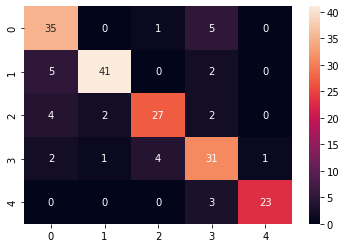

In [48]:
pred = model.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",testacc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

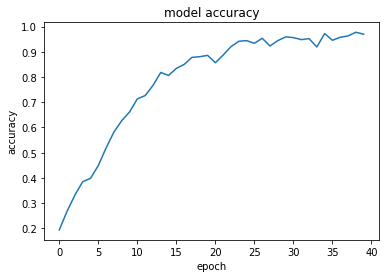

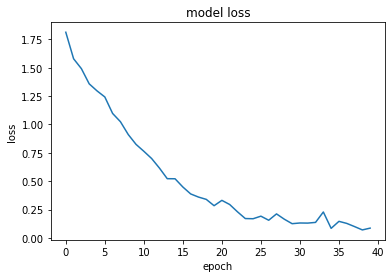

In [49]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()


plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# AlexNet

In [50]:
model1 =  Sequential([
    
                          layers.Conv2D(32 , (3,3),activation = 'relu',padding='valid', input_shape = (40,43,1)), 
                          layers.BatchNormalization(),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.BatchNormalization(),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Conv2D(128,(3,3), activation='relu', padding='same'),
                          layers.BatchNormalization(),
                          layers.Conv2D(128,(3,3), activation='relu', padding='same'),
                          layers.BatchNormalization(),
                          layers.Conv2D(128,(3,3), activation='relu', padding='same'),
                          layers.BatchNormalization(),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Flatten(),
                          layers.Dense(512,activation='relu'),
                          layers.Dropout(0.3),
                          layers.Dense(512,activation='relu'),
                          layers.Dropout(0.3),
                          layers.Dense(5,activation='softmax')  
    
])

In [51]:
#from tensorflow.keras.optimizers import SGD
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 38, 41, 32)        320       
_________________________________________________________________
batch_normalization (BatchNo (None, 38, 41, 32)        128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 19, 21, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 17, 19, 128)       36992     
_________________________________________________________________
batch_normalization_1 (Batch (None, 17, 19, 128)       512       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 9, 10, 128)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 10, 128)       

In [52]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(y_train)
y_train2 = le.transform(y_train)
le.fit(y_test)
y_test2 = le.transform(y_test)

In [53]:
history=model1.fit(x_train1, y_train1, epochs=40)

Epoch 1/40
24/24 [==============================] - 1s 13ms/step - loss: 2.4073 - accuracy: 0.2895
Epoch 2/40
24/24 [==============================] - 0s 7ms/step - loss: 1.3431 - accuracy: 0.4396
Epoch 3/40
24/24 [==============================] - 0s 7ms/step - loss: 1.1433 - accuracy: 0.5259
Epoch 4/40
24/24 [==============================] - 0s 7ms/step - loss: 0.8712 - accuracy: 0.6481
Epoch 5/40
24/24 [==============================] - 0s 10ms/step - loss: 0.6969 - accuracy: 0.7384
Epoch 6/40
24/24 [==============================] - 0s 8ms/step - loss: 0.5434 - accuracy: 0.7835
Epoch 7/40
24/24 [==============================] - 0s 8ms/step - loss: 0.4896 - accuracy: 0.8194
Epoch 8/40
24/24 [==============================] - 0s 8ms/step - loss: 0.3224 - accuracy: 0.8752
Epoch 9/40
24/24 [==============================] - 0s 7ms/step - loss: 0.2097 - accuracy: 0.9216
Epoch 10/40
24/24 [==============================] - 0s 7ms/step - loss: 0.2986 - accuracy: 0.8977
Epoch 11/40
24/24

In [54]:
testloss, testacc = model1.evaluate(x_test1, y_test1)
pred = model1.predict(x_test1)

6/6 [==============================] - 0s 8ms/step - loss: 0.7911 - accuracy: 0.8360


Accuracy: 0.8359788656234741
Precision: 0.853880756503355
Recall: 0.8322225813402284
F1-Score: 0.8328636834245475


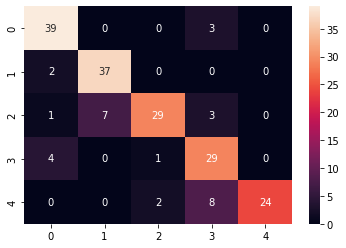

In [55]:
pred = model1.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",testacc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

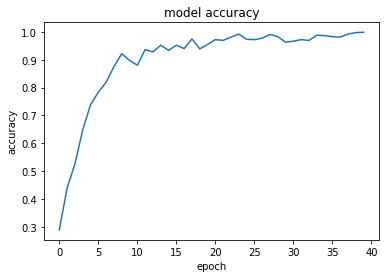

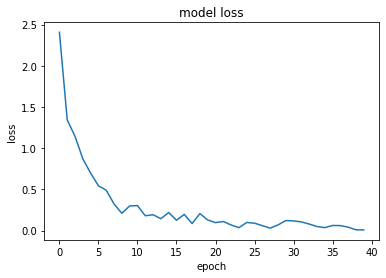

In [56]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# VGG16

In [106]:
def VGGNet16(input_tensor = None,classes = 5):
    input_layer= Input(shape=(40,43,1))
    
    # Block 1
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(input_layer)
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block5_pool')(x)

    
    # Classification block
    x = Flatten(name='flatten')(x)
    x = Dense(512, activation='relu', name='fc1')(x)
    x = Dense(512, activation='relu', name='fc2')(x)
    x = Dense(classes, activation='softmax', name='predictions')(x)
    
    model = Model(inputs = input_layer, outputs = x, name='VGG16')
    return model

In [107]:
model2 =VGGNet16(classes = 5)

In [108]:
model2.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics = ['accuracy'])
model2.summary()

Model: "VGG16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 40, 43, 1)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 40, 43, 32)        320       
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 40, 43, 32)        9248      
_________________________________________________________________
batch_normalization_25 (Batc (None, 40, 43, 32)        128       
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 20, 21, 32)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 20, 21, 32)        9248      
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 20, 21, 32)        9248  

In [109]:
history2 = model2.fit(x_train1,y_train1,epochs = 60)

Epoch 1/60
24/24 [==============================] - 1s 12ms/step - loss: 1.6995 - accuracy: 0.2802
Epoch 2/60
24/24 [==============================] - 0s 9ms/step - loss: 1.3106 - accuracy: 0.4223
Epoch 3/60
24/24 [==============================] - 0s 9ms/step - loss: 1.0098 - accuracy: 0.5843
Epoch 4/60
24/24 [==============================] - 0s 9ms/step - loss: 0.9249 - accuracy: 0.6268
Epoch 5/60
24/24 [==============================] - 0s 9ms/step - loss: 0.7926 - accuracy: 0.6972
Epoch 6/60
24/24 [==============================] - 0s 9ms/step - loss: 0.7682 - accuracy: 0.7092
Epoch 7/60
24/24 [==============================] - 0s 9ms/step - loss: 0.6646 - accuracy: 0.7317
Epoch 8/60
24/24 [==============================] - 0s 9ms/step - loss: 0.5521 - accuracy: 0.7955
Epoch 9/60
24/24 [==============================] - 0s 9ms/step - loss: 0.6043 - accuracy: 0.7596
Epoch 10/60
24/24 [==============================] - 0s 9ms/step - loss: 0.4928 - accuracy: 0.8207
Epoch 11/60
24/24 

In [110]:
testloss, testacc = model2.evaluate(x_test1, y_test1,batch_size=8)
pred = model2.predict(x_test1)

24/24 [==============================] - 0s 4ms/step - loss: 0.6478 - accuracy: 0.8730


Accuracy: 0.8730158805847168
Precision: 0.8760344854000062
Recall: 0.8954350315006053
F1-Score: 0.878861339164635


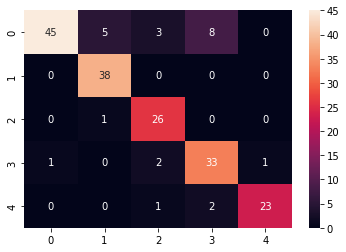

In [111]:
pred = model2.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",testacc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

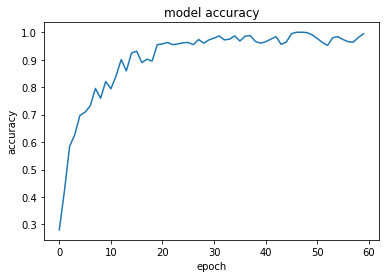

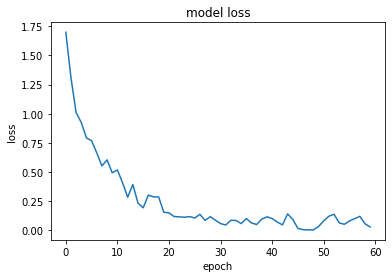

In [112]:
plt.plot(history2.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history2.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# VGG19

In [79]:
def VGGNet19(input_tensor = None,classes = 5):
    input_layer= Input(shape=(40,43,1))
    
    # Block 1
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(input_layer)
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block3_conv4')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block4_conv4')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block5_conv4')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D((2, 2), name='block5_pool')(x)

    
    # Classification block
    x = Flatten(name='flatten')(x)
    x = Dense(512, activation='relu', name='fc1')(x)
    x = Dense(512, activation='relu', name='fc2')(x)
    x = Dense(classes, activation='softmax', name='predictions')(x)
    
    model = Model(inputs = input_layer, outputs = x, name='VGG16')
    return model

In [80]:
model3 = VGGNet19(input_tensor = None,classes=5)

In [81]:
model3.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics = ['accuracy'])
model3.summary()

Model: "VGG16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 40, 43, 1)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 40, 43, 32)        320       
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 40, 43, 32)        9248      
_________________________________________________________________
batch_normalization_5 (Batch (None, 40, 43, 32)        128       
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 20, 21, 32)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 20, 21, 32)        9248      
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 20, 21, 32)        9248  

In [82]:
history3 = model3.fit(x_train1,y_train1,epochs = 50)

Epoch 1/50
24/24 [==============================] - 2s 14ms/step - loss: 1.6516 - accuracy: 0.2709
Epoch 2/50
24/24 [==============================] - 0s 9ms/step - loss: 1.2525 - accuracy: 0.4701
Epoch 3/50
24/24 [==============================] - 0s 9ms/step - loss: 1.0416 - accuracy: 0.5737
Epoch 4/50
24/24 [==============================] - 0s 9ms/step - loss: 0.8675 - accuracy: 0.6600
Epoch 5/50
24/24 [==============================] - 0s 9ms/step - loss: 0.7730 - accuracy: 0.6959
Epoch 6/50
24/24 [==============================] - 0s 9ms/step - loss: 0.7677 - accuracy: 0.7171
Epoch 7/50
24/24 [==============================] - 0s 9ms/step - loss: 0.6198 - accuracy: 0.7756
Epoch 8/50
24/24 [==============================] - 0s 9ms/step - loss: 0.5891 - accuracy: 0.8021
Epoch 9/50
24/24 [==============================] - 0s 9ms/step - loss: 0.3944 - accuracy: 0.8459
Epoch 10/50
24/24 [==============================] - 0s 9ms/step - loss: 0.2591 - accuracy: 0.9203
Epoch 11/50
24/24 

In [83]:
test_loss,test_acc = model3.evaluate(x_test1,y_test1)

6/6 [==============================] - 0s 13ms/step - loss: 0.7904 - accuracy: 0.8730


Accuracy: 0.8730158805847168
Precision: 0.8766411588074885
Recall: 0.8913182346109176
F1-Score: 0.8811256791873376


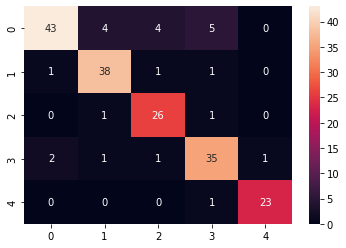

In [84]:
pred = model3.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",test_acc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

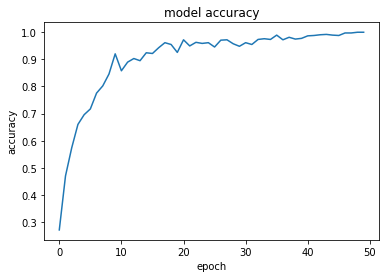

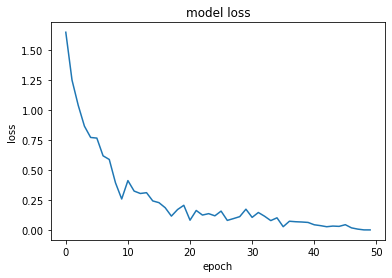

In [85]:
plt.plot(history3.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history3.history['loss'])
#plt.plot(history.history['val_loss'])    
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# DenseNet121

In [118]:
def densenet_121():
    input_layer = Input(shape = (40,43,1))
    nb_filter = 32
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D(2,(3, 3))(x)
    nb_layer = [6,12,24,16]
    for i in nb_layer:
        nb_filter = nb_filter + nb_filter
        for j in range(0,i):
            x = layers.Conv2D(nb_filter, (3, 3), activation='relu', padding='same')(x)
            x = layers.BatchNormalization()(x)
        x = layers.Conv2D(nb_filter,(1,1),activation='relu', padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = AveragePooling2D(2,padding = 'same')(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dense(5, activation='softmax', name='predictions')(x)
    model = Model(input_layer, x)
    return model

In [119]:
model4 = densenet_121()
model4.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics = ['accuracy'])
model4.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 40, 43, 1)]       0         
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 40, 43, 32)        320       
_________________________________________________________________
batch_normalization_93 (Batc (None, 40, 43, 32)        128       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 13, 14, 32)        0         
_________________________________________________________________
conv2d_72 (Conv2D)           (None, 13, 14, 64)        18496     
_________________________________________________________________
batch_normalization_94 (Batc (None, 13, 14, 64)        256       
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 13, 14, 64)        3692

In [120]:
history4 = model4.fit(x_train1,y_train1,epochs = 80)

Epoch 1/200
24/24 [==============================] - 7s 90ms/step - loss: 1.8680 - accuracy: 0.2098
Epoch 2/200
24/24 [==============================] - 2s 87ms/step - loss: 1.7772 - accuracy: 0.2351
Epoch 3/200
24/24 [==============================] - 2s 88ms/step - loss: 1.5905 - accuracy: 0.2988
Epoch 4/200
24/24 [==============================] - 2s 87ms/step - loss: 1.5694 - accuracy: 0.2882
Epoch 5/200
24/24 [==============================] - 2s 87ms/step - loss: 1.4790 - accuracy: 0.3625
Epoch 6/200
24/24 [==============================] - 2s 87ms/step - loss: 1.4063 - accuracy: 0.3811
Epoch 7/200
24/24 [==============================] - 2s 87ms/step - loss: 1.3507 - accuracy: 0.3891
Epoch 8/200
24/24 [==============================] - 2s 89ms/step - loss: 1.3904 - accuracy: 0.3931
Epoch 9/200
24/24 [==============================] - 2s 87ms/step - loss: 1.3809 - accuracy: 0.3692
Epoch 10/200
24/24 [==============================] - 2s 88ms/step - loss: 1.2633 - accuracy: 0.4422

In [121]:
testloss,testacc = model4.evaluate(x_test1,y_test1)

6/6 [==============================] - 1s 35ms/step - loss: 10.9453 - accuracy: 0.3069


Accuracy: 0.30687829852104187
Precision: 0.27910768452982815
Recall: 0.14517094017094018
F1-Score: 0.182418024116776


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


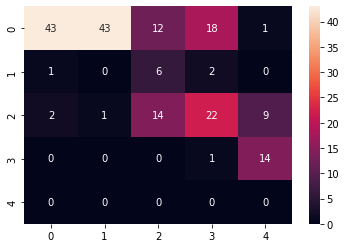

In [124]:
pred = model4.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",testacc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

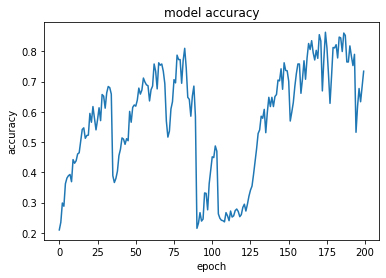

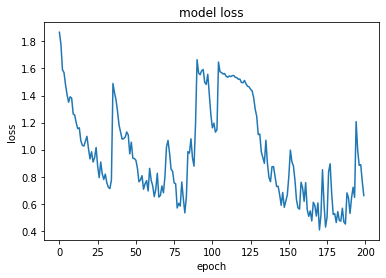

In [125]:
plt.plot(history4.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history4.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# ResNet 50

In [126]:
def ResNet():
    input_layer= Input(shape=(40,43,1))
    
    # Stem Block
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(input_layer)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    #Stage-1
    #Block1
    tensor = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tenosr = x
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Stage-2
    #Block1
    tensor = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(64, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Stage-3
    #Block1
    tensor = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(128, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Stage-4
    #Block1
    tensor = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Block2
    tensor = x
    x = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Conv2D(256, (1, 1), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    
    #Classification block
    x = AveragePooling2D((2, 2))(x)
    x = Flatten(name='flatten')(x)
    x = Dense(512, activation='relu', name='fc1')(x)
    x = Dense(5, activation='softmax', name='predictions')(x)
    
    model = Model(inputs = input_layer, outputs = x, name='ResNet')
    return model

In [127]:
model5 = ResNet()

In [128]:
model5.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics = ['accuracy'])
model5.summary()

Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 40, 43, 1)]  0                                            
__________________________________________________________________________________________________
conv2d_134 (Conv2D)             (None, 40, 43, 32)   64          input_12[0][0]                   
__________________________________________________________________________________________________
batch_normalization_156 (BatchN (None, 40, 43, 32)   128         conv2d_134[0][0]                 
__________________________________________________________________________________________________
conv2d_135 (Conv2D)             (None, 40, 43, 32)   9248        batch_normalization_156[0][0]    
_____________________________________________________________________________________________

In [129]:
history5 = model5.fit(x_train1,y_train1,epochs = 40)

Epoch 1/40
24/24 [==============================] - 15s 370ms/step - loss: 77.2611 - accuracy: 0.2537
Epoch 2/40
24/24 [==============================] - 7s 310ms/step - loss: 2.4652 - accuracy: 0.4728
Epoch 3/40
24/24 [==============================] - 8s 315ms/step - loss: 0.9519 - accuracy: 0.6813
Epoch 4/40
24/24 [==============================] - 8s 315ms/step - loss: 0.3667 - accuracy: 0.8712
Epoch 5/40
24/24 [==============================] - 7s 309ms/step - loss: 0.1830 - accuracy: 0.9429
Epoch 6/40
24/24 [==============================] - 7s 301ms/step - loss: 0.1995 - accuracy: 0.9376
Epoch 7/40
24/24 [==============================] - 7s 300ms/step - loss: 0.1831 - accuracy: 0.9389
Epoch 8/40
24/24 [==============================] - 7s 297ms/step - loss: 0.1518 - accuracy: 0.9522
Epoch 9/40
24/24 [==============================] - 7s 295ms/step - loss: 0.2127 - accuracy: 0.9389
Epoch 10/40
24/24 [==============================] - 7s 295ms/step - loss: 0.1150 - accuracy: 0.96

In [130]:
testloss,testacc = model5.evaluate(x_test1,y_test1)

6/6 [==============================] - 2s 305ms/step - loss: 1.6841 - accuracy: 0.7778


Accuracy: 0.7777777910232544
Precision: 0.7823063164506542
Recall: 0.7962426992848315
F1-Score: 0.7874111277547703


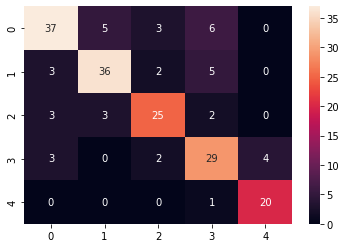

In [131]:
pred = model5.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",testacc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

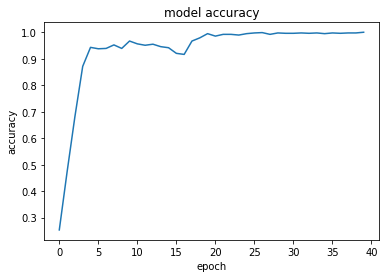

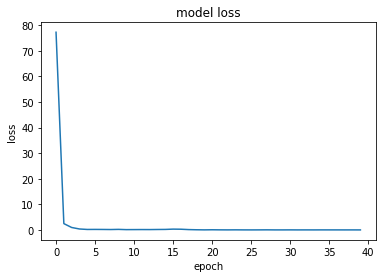

In [133]:
plt.plot(history5.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history5.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Vast Network

In [170]:
from tensorflow.keras.layers import SeparableConv2D as sep_conv
def entry_flow(x):
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    tensor = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = sep_conv(64,(3,3),activation = "relu",padding = 'same')(x)
    x = layers.BatchNormalization()(x)
    x = sep_conv(64,(3,3),padding = 'same')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D(3,padding = 'same')(x)  
    tensor = Conv2D(64, (3,3), activation = 'relu',padding = 'same',strides = 3)(tensor)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    x = Activation('relu')(x)
    x = sep_conv(128,(3,3),activation = 'relu')(x)
    x = layers.BatchNormalization()(x)
    x = sep_conv(128,(3,3),activation = 'relu')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D(3,padding = 'same')(x)
    tensor = Conv2D(128,(4,4),strides = 3)(tensor)
    x = layers.BatchNormalization()(x)
    x = Add()([tensor,x])
    x = Activation('relu')(x)
    x = sep_conv(128,(1,1),activation = 'relu')(x)
    x = layers.BatchNormalization()(x)
    x = sep_conv(256,(3,3))(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling2D(3, padding = 'same')(x)
    tensor = Conv2D(256,(1,1))(tensor)
    x = Add()([tensor,x])
    return x

In [171]:
input_layer= Input(shape=(40,43,1))
x = entry_flow(input_layer)

In [172]:
def middle_flow(tensor):
    for i in range(15):
        x = Activation('relu')(tensor)
        x = sep_conv(256,(1,1))(x)
        x = layers.BatchNormalization()(x)
        x = sep_conv(256,(1,1))(x)
        x = layers.BatchNormalization()(x)
        tensor = Add()([tensor,x])
    return tensor 

In [173]:
x = middle_flow(x)

In [174]:
def exit_flow(tensor):
    x = Activation('relu')(tensor)
    x = sep_conv(256,(3,3))(x)
    x = Activation('relu')(x)
    x = sep_conv(512,(1,1))(x)
    
    tensor = Conv2D(512,(1,1))(x)
    
    x = Add()([tensor,x])
    x = sep_conv(512,(1,1))(x)
    x = Activation('relu')(x)
    x = sep_conv(512,(1,1))(x)
    x = Activation('relu')(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(5,activation = 'softmax')(x)
    
    return x

In [175]:
x = exit_flow(x)

In [176]:
model6 = Model(inputs = input_layer, outputs = x, name='XceptionNetwork')

In [177]:
model6.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics = ['accuracy'])
model6.summary()

Model: "XceptionNetwork"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 40, 43, 1)]  0                                            
__________________________________________________________________________________________________
conv2d_204 (Conv2D)             (None, 40, 43, 32)   320         input_16[0][0]                   
__________________________________________________________________________________________________
batch_normalization_330 (BatchN (None, 40, 43, 32)   128         conv2d_204[0][0]                 
__________________________________________________________________________________________________
batch_normalization_331 (BatchN (None, 40, 43, 32)   128         batch_normalization_330[0][0]    
____________________________________________________________________________________

In [178]:
history6 = model6.fit(x_train1,y_train1,epochs = 60)

Epoch 1/60
24/24 [==============================] - 6s 46ms/step - loss: 1.5853 - accuracy: 0.2005
Epoch 2/60
24/24 [==============================] - 1s 42ms/step - loss: 1.4715 - accuracy: 0.2908
Epoch 3/60
24/24 [==============================] - 1s 42ms/step - loss: 1.2541 - accuracy: 0.4436
Epoch 4/60
24/24 [==============================] - 1s 42ms/step - loss: 1.0223 - accuracy: 0.5697
Epoch 5/60
24/24 [==============================] - 1s 42ms/step - loss: 0.8362 - accuracy: 0.6640
Epoch 6/60
24/24 [==============================] - 1s 42ms/step - loss: 0.5523 - accuracy: 0.7942
Epoch 7/60
24/24 [==============================] - 1s 44ms/step - loss: 0.5309 - accuracy: 0.8141
Epoch 8/60
24/24 [==============================] - 1s 46ms/step - loss: 0.3253 - accuracy: 0.8845
Epoch 9/60
24/24 [==============================] - 1s 43ms/step - loss: 0.3246 - accuracy: 0.9017
Epoch 10/60
24/24 [==============================] - 1s 42ms/step - loss: 0.1941 - accuracy: 0.9376
Epoch 11/

In [179]:
testloss,testacc = model6.evaluate(x_test1,y_test1)

6/6 [==============================] - 1s 14ms/step - loss: 0.7116 - accuracy: 0.8677


Accuracy: 0.8677248954772949
Precision: 0.870165954285014
Recall: 0.8655895691609977
F1-Score: 0.8642214097206583


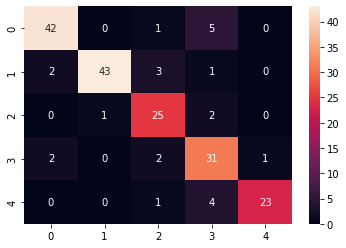

In [181]:
pred = model6.predict(x_test1)
y_pred = np.argmax(pred, axis=1)
y_test2 = np.argmax(y_test1,axis=1)
cm = confusion_matrix(y_pred,y_test2)
sns.heatmap(cm,annot=True)
print("Accuracy:",testacc)
print("Precision:",precision_score(y_pred,y_test2,average = 'macro'))
print("Recall:",recall_score(y_pred,y_test2,average = 'macro'))
print("F1-Score:",f1_score(y_pred,y_test2,average = 'macro'))

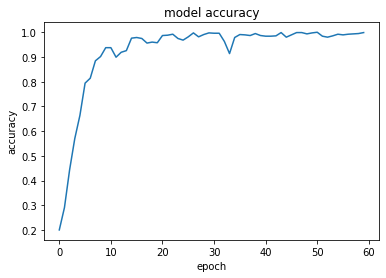

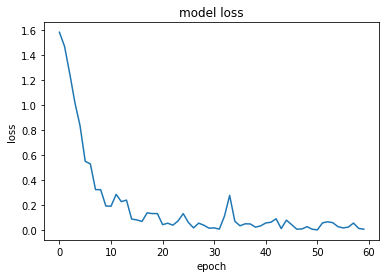

In [182]:
plt.plot(history6.history['accuracy'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
#plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history6.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()